In [352]:
import requests
import base64
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import numpy as np
import time
import plotly.graph_objs as go
from mpl_toolkits.mplot3d import Axes3D
from plotly.subplots import make_subplots
from scipy.stats import pearsonr
from math import pi
from matplotlib.ticker import FuncFormatter
import warnings
import statsmodels.api as sm
import matplotlib.ticker as mticker
warnings.filterwarnings("ignore")

In [15]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

In [17]:
client_id = '2abe34610759477fbd00ce88c3153cdb'
client_secret = '9ad0895d85634fd1b1198d5b28ac2dc2'

In [19]:
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=client_id,
                                                           client_secret=client_secret))

In [31]:
artist_name = []
track_name = []
track_popularity = []
artist_id = []
track_id = []

for offset in range(0, 1000, 50):  
    try:
        track_results = sp.search(q='year:2024', type='track', limit=50, offset=offset)
        if not track_results['tracks']['items']:
            break 
        
        for t in track_results['tracks']['items']:
            artist_name.append(t['artists'][0]['name'])
            artist_id.append(t['artists'][0]['id'])
            track_name.append(t['name'])
            track_id.append(t['id'])
            track_popularity.append(t['popularity'])
        
        time.sleep(1) 

    except spotipy.exceptions.SpotifyException as e:
        print(f"SpotifyException occurred: {e}")
        break  # Stop execution if an exception occurs

data = {
    'track_id': track_id,
    'track_name': track_name,
    'artist_id': artist_id,
    'artist_name': artist_name,
    'track_popularity': track_popularity
}

df = pd.DataFrame(data)
df.to_csv('sp_tracks_2024.csv', index=False)

print("Data saved to sp_tracks_2024.csv")

Data saved to sp_tracks_2024.csv


In [7]:
tracks_2024 = pd.read_csv('sp_tracks_2024.csv')

In [9]:
tracks_2024.sort_values(by='track_popularity', ascending=False).head(10)

,track_id,track_name,artist_id,artist_name,track_popularity
1,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,6qqNVTkY8uBg9cP3Jd7DAH,Billie Eilish,100
4,2qSkIjg1o9h3YT9RAgYN75,Espresso,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,98
0,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",7GlBOeep6PqTfFi59PTUUN,Chappell Roan,97
3,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,97
29,6WatFBLVB0x077xWeoVc2k,Si Antes Te Hubiera Conocido,790FomKkXshlbRYZFtlgla,KAROL G,96
2,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,95
16,7tI8dRuH2Yc6RuoTjxo4dU,Who,1oSPZhvZMIrWW5I41kPkkY,Jimin,95
6,5AJ9hqTS2wcFQCELCFRO7A,MILLION DOLLAR BABY,1WaFQSHVGZQJTbf0BdxdNo,Tommy Richman,94
46,6XjDF6nds4DE2BBbagZol6,Gata Only,7CvTknweLr9feJtRGrpDBy,FloyyMenor,94
13,2plbrEY59IikOBgBGLjaoe,Die With A Smile,1HY2Jd0NmPuamShAr6KMms,Lady Gaga,93


# Above are the top 10 tracks of 2024 sorted by track popularity
## Billie Eilish holds first place with track name 'BIRDS OF A FEATHER'. 
### The Top 10 songs consist of rap, pop, country reggaeton

In [21]:
artist_popularity = []
artist_genres = []
artist_followers = []
for a_id in tracks_2024.artist_id:
  artist = sp.artist(a_id)
  artist_popularity.append(artist['popularity'])
  artist_genres.append(artist['genres'])
  artist_followers.append(artist['followers']['total'])

tracks_2024 = tracks_2024.assign(artist_popularity=artist_popularity, artist_genres=artist_genres, artist_followers=artist_followers)
tracks_2024.head(10)

,track_id,track_name,artist_id,artist_name,track_popularity,artist_popularity,artist_genres,artist_followers
0,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",7GlBOeep6PqTfFi59PTUUN,Chappell Roan,97,90,"[indie pop, pov: indie]",3059358
1,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,6qqNVTkY8uBg9cP3Jd7DAH,Billie Eilish,100,95,"[art pop, pop]",99510427
2,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,95,92,"[conscious hip hop, hip hop, rap, west coast rap]",32831553
3,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,97,95,[pop],12516328
4,2qSkIjg1o9h3YT9RAgYN75,Espresso,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,98,95,[pop],12516328
5,7221xIgOnuakPdLqT0F3nP,I Had Some Help (Feat. Morgan Wallen),246dkjvS1zLTtiykXe5h60,Post Malone,93,93,"[dfw rap, melodic rap, pop, rap]",45344013
6,5AJ9hqTS2wcFQCELCFRO7A,MILLION DOLLAR BABY,1WaFQSHVGZQJTbf0BdxdNo,Tommy Richman,94,81,[chill abstract hip hop],695488
7,4ZJ4vzLQekI0WntDbanNC7,Pink Skies,40ZNYROS4zLfyyBSs2PGe2,Zach Bryan,88,91,[classic oklahoma country],5066163
8,7Fzl7QaTu47WyP9R5S5mh5,Lies Lies Lies,4oUHIQIBe0LHzYfvXNW4QM,Morgan Wallen,87,91,[contemporary country],10626508
9,2FQrifJ1N335Ljm3TjTVVf,A Bar Song (Tipsy),3y2cIKLjiOlp1Np37WiUdH,Shaboozey,91,81,"[modern country pop, pop rap]",658519


In [23]:
tracks_2024.sort_values(by='artist_popularity', ascending=False).head(10)

,track_id,track_name,artist_id,artist_name,track_popularity,artist_popularity,artist_genres,artist_followers
300,1xtw1krCR6Dw2KwkXw5z63,The Smallest Man Who Ever Lived,06HL4z0CvFAxyc27GXpf02,Taylor Swift,79,100,[pop],121579799
323,62E2nR0od0M5HYxuYLaDz7,The Black Dog,06HL4z0CvFAxyc27GXpf02,Taylor Swift,78,100,[pop],121579799
497,0g4fMVo4JjwnIpTfFfLdxS,Cassandra,06HL4z0CvFAxyc27GXpf02,Taylor Swift,75,100,[pop],121579799
513,4d9PtIEVij9jW5OaLinH66,Clara Bow,06HL4z0CvFAxyc27GXpf02,Taylor Swift,74,100,[pop],121579799
520,1Zai5UJ2di3qEuR2HeT2s8,I Look in People's Windows,06HL4z0CvFAxyc27GXpf02,Taylor Swift,74,100,[pop],121579799
276,1kbEbBdEgQdQeLXCJh28pJ,Down Bad,06HL4z0CvFAxyc27GXpf02,Taylor Swift,79,100,[pop],121579799
338,36t6frENUtCYKuZus6aYDO,Who’s Afraid of Little Old Me?,06HL4z0CvFAxyc27GXpf02,Taylor Swift,79,100,[pop],121579799
324,0W0iAC1VGlB82PI6elxFYf,Guilty as Sin?,06HL4z0CvFAxyc27GXpf02,Taylor Swift,80,100,[pop],121579799
53,4q5YezDOIPcoLr8R81x9qy,I Can Do It With a Broken Heart,06HL4z0CvFAxyc27GXpf02,Taylor Swift,87,100,[pop],121579799
356,3YkNIrAvbKNrrwwEd7NVLl,loml,06HL4z0CvFAxyc27GXpf02,Taylor Swift,78,100,[pop],121579799


## Many duplicates of Taylor Swift
### I will create a new df and filter out duplicates and sort by artist populairty

In [25]:
top_artists_2024 = tracks_2024.sort_values(by='artist_popularity', ascending=False)[
    ['artist_name', 'artist_popularity', 'artist_followers', 'artist_genres']
]
top_artists_2024.astype(str).drop_duplicates().head(10)

,artist_name,artist_popularity,artist_followers,artist_genres
300,Taylor Swift,100,121579799,['pop']
308,Drake,96,91878149,"['canadian hip hop', 'canadian pop', 'hip hop'..."
88,Sabrina Carpenter,95,12516328,['pop']
97,Billie Eilish,95,99510427,"['art pop', 'pop']"
183,Post Malone,93,45344013,"['dfw rap', 'melodic rap', 'pop', 'rap']"
249,Eminem,93,90172070,"['detroit hip hop', 'hip hop', 'rap']"
406,Peso Pluma,93,16063159,"['corridos tumbados', 'sad sierreno']"
298,Kendrick Lamar,92,32831553,"['conscious hip hop', 'hip hop', 'rap', 'west ..."
510,KAROL G,92,50303215,"['reggaeton', 'reggaeton colombiano', 'urbano ..."
419,Feid,92,13731153,"['colombian pop', 'pop reggaeton', 'reggaeton'..."


## Above are the Top 10 arists by artist popularity
## Genres include: Rap/Hip Hop, Pop and Corridos Tumbados

In [27]:
track_ids = tracks_2024['track_id'].tolist()

track_features_list = []

for t_id in track_ids:
    try:
        af = sp.audio_features(t_id)
        if af:
            track_features_list.extend(af)
        time.sleep(1) 
    except Exception as e:
        print(f"Error fetching features for track ID {t_id}: {e}")

track_features_df = pd.DataFrame(track_features_list, columns=[
    'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
    'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
    'type', 'id', 'uri', 'track_href', 'analysis_url', 'duration_ms'
])

print(track_features_df.head())

   danceability  energy  key  loudness  mode  speechiness  acousticness  \
0         0.700   0.582   11    -5.960     0       0.0356        0.0502   
1         0.747   0.507    2   -10.171     1       0.0358        0.2000   
2         0.898   0.472    1    -7.001     1       0.0776        0.0107   
3         0.669   0.586    9    -6.073     1       0.0540        0.2740   
4         0.701   0.760    0    -5.478     1       0.0285        0.1070   

   instrumentalness  liveness  valence    tempo            type  \
0          0.000000    0.0881    0.785  116.712  audio_features   
1          0.060800    0.1170    0.438  104.978  audio_features   
2          0.000000    0.1410    0.214  101.061  audio_features   
3          0.000000    0.1040    0.579  107.071  audio_features   
4          0.000065    0.1850    0.690  103.969  audio_features   

                       id                                   uri  \
0  0WbMK4wrZ1wFSty9F7FCgu  spotify:track:0WbMK4wrZ1wFSty9F7FCgu   
1  6dOtVTDdi

In [29]:
track_features_df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms
0,0.700,0.582,11,-5.960,0,0.0356,0.05020,0.000000,0.0881,0.7850,116.712,audio_features,0WbMK4wrZ1wFSty9F7FCgu,spotify:track:0WbMK4wrZ1wFSty9F7FCgu,https://api.spotify.com/v1/tracks/0WbMK4wrZ1wF...,https://api.spotify.com/v1/audio-analysis/0WbM...,218424
1,0.747,0.507,2,-10.171,1,0.0358,0.20000,0.060800,0.1170,0.4380,104.978,audio_features,6dOtVTDdiauQNBQEDOtlAB,spotify:track:6dOtVTDdiauQNBQEDOtlAB,https://api.spotify.com/v1/tracks/6dOtVTDdiauQ...,https://api.spotify.com/v1/audio-analysis/6dOt...,210373
2,0.898,0.472,1,-7.001,1,0.0776,0.01070,0.000000,0.1410,0.2140,101.061,audio_features,6AI3ezQ4o3HUoP6Dhudph3,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...,274192
3,0.669,0.586,9,-6.073,1,0.0540,0.27400,0.000000,0.1040,0.5790,107.071,audio_features,5N3hjp1WNayUPZrA8kJmJP,spotify:track:5N3hjp1WNayUPZrA8kJmJP,https://api.spotify.com/v1/tracks/5N3hjp1WNayU...,https://api.spotify.com/v1/audio-analysis/5N3h...,186365
4,0.701,0.760,0,-5.478,1,0.0285,0.10700,0.000065,0.1850,0.6900,103.969,audio_features,2qSkIjg1o9h3YT9RAgYN75,spotify:track:2qSkIjg1o9h3YT9RAgYN75,https://api.spotify.com/v1/tracks/2qSkIjg1o9h3...,https://api.spotify.com/v1/audio-analysis/2qSk...,175459
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.624,0.849,4,-4.983,1,0.0695,0.03230,0.000001,0.1800,0.5390,139.939,audio_features,4c1LjGTCF8kMEikirzFgkm,spotify:track:4c1LjGTCF8kMEikirzFgkm,https://api.spotify.com/v1/tracks/4c1LjGTCF8kM...,https://api.spotify.com/v1/audio-analysis/4c1L...,165353
996,0.403,0.919,7,-4.462,1,0.3020,0.00129,0.000000,0.1640,0.2410,97.008,audio_features,7g4hIeYVk3h5qQXb9RLeXP,spotify:track:7g4hIeYVk3h5qQXb9RLeXP,https://api.spotify.com/v1/tracks/7g4hIeYVk3h5...,https://api.spotify.com/v1/audio-analysis/7g4h...,240590
997,0.620,0.565,9,-7.303,1,0.0304,0.25400,0.000000,0.1930,0.7300,171.024,audio_features,6Bcy1jJFcIAuAzJMtfpImi,spotify:track:6Bcy1jJFcIAuAzJMtfpImi,https://api.spotify.com/v1/tracks/6Bcy1jJFcIAu...,https://api.spotify.com/v1/audio-analysis/6Bcy...,216317
998,0.570,0.770,6,-3.722,0,0.3070,0.22900,0.000000,0.1090,0.5680,171.711,audio_features,4u4zx9ERn7iIeTskOCGKXI,spotify:track:4u4zx9ERn7iIeTskOCGKXI,https://api.spotify.com/v1/tracks/4u4zx9ERn7iI...,https://api.spotify.com/v1/audio-analysis/4u4z...,210698


In [31]:
# Rename the 'id' column to 'track_id' to match tracks_2024
track_features_df.rename(columns={'id': 'track_id'}, inplace=True)

# Merge the features DataFrame with the original DataFrame on 'track_id'
tracks_2024 = tracks_2024.merge(track_features_df, on='track_id', how='left')

tracks_2024.head(10)

,track_id,track_name,artist_id,artist_name,track_popularity,artist_popularity,artist_genres,artist_followers,danceability,energy,...,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,duration_ms
0,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",7GlBOeep6PqTfFi59PTUUN,Chappell Roan,97,90,"[indie pop, pov: indie]",3059358,0.700,0.582,...,0.05020,0.000000,0.0881,0.785,116.712,audio_features,spotify:track:0WbMK4wrZ1wFSty9F7FCgu,https://api.spotify.com/v1/tracks/0WbMK4wrZ1wF...,https://api.spotify.com/v1/audio-analysis/0WbM...,218424
1,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,6qqNVTkY8uBg9cP3Jd7DAH,Billie Eilish,100,95,"[art pop, pop]",99510427,0.747,0.507,...,0.20000,0.060800,0.1170,0.438,104.978,audio_features,spotify:track:6dOtVTDdiauQNBQEDOtlAB,https://api.spotify.com/v1/tracks/6dOtVTDdiauQ...,https://api.spotify.com/v1/audio-analysis/6dOt...,210373
2,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,95,92,"[conscious hip hop, hip hop, rap, west coast rap]",32831553,0.898,0.472,...,0.01070,0.000000,0.1410,0.214,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...,274192
3,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,97,95,[pop],12516328,0.669,0.586,...,0.27400,0.000000,0.1040,0.579,107.071,audio_features,spotify:track:5N3hjp1WNayUPZrA8kJmJP,https://api.spotify.com/v1/tracks/5N3hjp1WNayU...,https://api.spotify.com/v1/audio-analysis/5N3h...,186365
4,2qSkIjg1o9h3YT9RAgYN75,Espresso,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,98,95,[pop],12516328,0.701,0.760,...,0.10700,0.000065,0.1850,0.690,103.969,audio_features,spotify:track:2qSkIjg1o9h3YT9RAgYN75,https://api.spotify.com/v1/tracks/2qSkIjg1o9h3...,https://api.spotify.com/v1/audio-analysis/2qSk...,175459
5,7221xIgOnuakPdLqT0F3nP,I Had Some Help (Feat. Morgan Wallen),246dkjvS1zLTtiykXe5h60,Post Malone,93,93,"[dfw rap, melodic rap, pop, rap]",45344013,0.638,0.855,...,0.00757,0.000000,0.2450,0.731,127.986,audio_features,spotify:track:7221xIgOnuakPdLqT0F3nP,https://api.spotify.com/v1/tracks/7221xIgOnuak...,https://api.spotify.com/v1/audio-analysis/7221...,178206
6,5AJ9hqTS2wcFQCELCFRO7A,MILLION DOLLAR BABY,1WaFQSHVGZQJTbf0BdxdNo,Tommy Richman,94,81,[chill abstract hip hop],695488,0.852,0.697,...,0.09730,0.000370,0.0678,0.919,138.029,audio_features,spotify:track:5AJ9hqTS2wcFQCELCFRO7A,https://api.spotify.com/v1/tracks/5AJ9hqTS2wcF...,https://api.spotify.com/v1/audio-analysis/5AJ9...,155152
7,4ZJ4vzLQekI0WntDbanNC7,Pink Skies,40ZNYROS4zLfyyBSs2PGe2,Zach Bryan,88,91,[classic oklahoma country],5066163,0.525,0.488,...,0.19100,0.000051,0.1350,0.253,84.999,audio_features,spotify:track:4ZJ4vzLQekI0WntDbanNC7,https://api.spotify.com/v1/tracks/4ZJ4vzLQekI0...,https://api.spotify.com/v1/audio-analysis/4ZJ4...,194920
8,7Fzl7QaTu47WyP9R5S5mh5,Lies Lies Lies,4oUHIQIBe0LHzYfvXNW4QM,Morgan Wallen,87,91,[contemporary country],10626508,0.486,0.702,...,0.23900,0.000075,0.0912,0.382,81.053,audio_features,spotify:track:7Fzl7QaTu47WyP9R5S5mh5,https://api.spotify.com/v1/tracks/7Fzl7QaTu47W...,https://api.spotify.com/v1/audio-analysis/7Fzl...,198069
9,2FQrifJ1N335Ljm3TjTVVf,A Bar Song (Tipsy),3y2cIKLjiOlp1Np37WiUdH,Shaboozey,91,81,"[modern country pop, pop rap]",658519,0.722,0.709,...,0.06330,0.000000,0.0804,0.604,81.012,audio_features,spotify:track:2FQrifJ1N335Ljm3TjTVVf,https://api.spotify.com/v1/tracks/2FQrifJ1N335...,https://api.spotify.com/v1/audio-analysis/2FQr...,171292


## I successfully extracted and merged track features/attributes with my track_2024 dataframe
### I will now explore the dataset

In [33]:
tracks_2024.sample(5)

,track_id,track_name,artist_id,artist_name,track_popularity,artist_popularity,artist_genres,artist_followers,danceability,energy,...,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,duration_ms
349,0g3WQjlhCk9gcIVow4DigI,Number 2,4Ga1P7PMIsmqEZqhYZQgDo,Lil Tecca,75,81,"[melodic rap, pluggnb, rap]",7777159,0.641,0.636,...,0.0500,0.00000,0.113,0.138,125.053,audio_features,spotify:track:0g3WQjlhCk9gcIVow4DigI,https://api.spotify.com/v1/tracks/0g3WQjlhCk9g...,https://api.spotify.com/v1/audio-analysis/0g3W...,137904
461,1Pp4ViPEN3SkM4gBW7ZTfF,TASTE,4Ga1P7PMIsmqEZqhYZQgDo,Lil Tecca,72,81,"[melodic rap, pluggnb, rap]",7777159,0.567,0.690,...,0.0517,0.00000,0.683,0.217,124.220,audio_features,spotify:track:1Pp4ViPEN3SkM4gBW7ZTfF,https://api.spotify.com/v1/tracks/1Pp4ViPEN3Sk...,https://api.spotify.com/v1/audio-analysis/1Pp4...,170447
852,0qKKAOF4kezKlvtyYyv12C,DIE FOR ME,7cYEt1pqMgXJdq00hAwVpT,Chase Atlantic,71,81,[alternative r&b],8062479,0.615,0.723,...,0.0957,0.00013,0.386,0.423,129.970,audio_features,spotify:track:0qKKAOF4kezKlvtyYyv12C,https://api.spotify.com/v1/tracks/0qKKAOF4kezK...,https://api.spotify.com/v1/audio-analysis/0qKK...,206815
938,0cyN7uQYxTlqwgyh6rm1IH,Guess Who’s Back - skit,7dGJo4pcD2V6oG8kP0tJRR,Eminem,70,93,"[detroit hip hop, hip hop, rap]",90172070,0.422,0.234,...,0.0210,0.00000,0.245,0.441,79.664,audio_features,spotify:track:0cyN7uQYxTlqwgyh6rm1IH,https://api.spotify.com/v1/tracks/0cyN7uQYxTlq...,https://api.spotify.com/v1/audio-analysis/0cyN...,62869
480,093MlZS93ZKlHpGkmb3k3W,BROTHER STONE (FEAT. KODAK BLACK),4Gso3d4CscCijv0lmajZWs,Don Toliver,74,86,[rap],4892173,0.830,0.529,...,0.0733,0.00000,0.107,0.540,157.009,audio_features,spotify:track:093MlZS93ZKlHpGkmb3k3W,https://api.spotify.com/v1/tracks/093MlZS93ZKl...,https://api.spotify.com/v1/audio-analysis/093M...,202840


In [35]:
tracks_2024.describe()

,track_popularity,artist_popularity,artist_followers,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,1000.000000,1000.00000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,72.133000,82.82100,2.134164e+07,0.630089,0.662990,5.278000,-6.330552,0.649000,0.088523,0.224527,0.030844,0.186672,0.492980,122.974235,189920.260000
std,10.912304,10.08398,3.276538e+07,0.149021,0.177531,3.735059,3.246836,0.477522,0.089560,0.251022,0.135374,0.136341,0.223827,28.252441,45353.283088
min,30.000000,19.00000,8.290000e+02,0.072400,0.001610,0.000000,-43.643000,0.000000,0.024300,0.000064,0.000000,0.029300,0.034800,53.376000,37314.000000
25%,69.000000,76.00000,1.080857e+06,0.527000,0.552750,1.000000,-7.338750,0.000000,0.034275,0.026575,0.000000,0.103000,0.327250,100.058250,161083.750000
50%,73.000000,84.00000,6.357697e+06,0.636000,0.687500,5.000000,-5.679000,1.000000,0.049000,0.106500,0.000000,0.135000,0.486500,123.937500,186535.000000
75%,78.000000,91.00000,2.365737e+07,0.736250,0.790000,9.000000,-4.582500,1.000000,0.096150,0.382500,0.000077,0.232000,0.657250,142.771500,215920.750000
max,100.000000,100.00000,1.215798e+08,0.975000,0.991000,11.000000,1.047000,1.000000,0.537000,0.991000,0.971000,0.952000,0.973000,201.776000,456934.000000


## I am goin clean up some of the columns:
### - rounding decimal places
### - convert duration ms to minutes
### change some column names 

In [37]:
tracks_2024.dtypes

track_id              object
track_name            object
artist_id             object
artist_name           object
track_popularity       int64
artist_popularity      int64
artist_genres         object
artist_followers       int64
danceability         float64
energy               float64
key                    int64
loudness             float64
mode                   int64
speechiness          float64
acousticness         float64
instrumentalness     float64
liveness             float64
valence              float64
tempo                float64
type                  object
uri                   object
track_href            object
analysis_url          object
duration_ms            int64
dtype: object

In [39]:
tracks_2024.rename(columns={
    'duration_ms': 'duration_minutes',
    'track_name': 'title',
    'artist_name': 'artist'
}, inplace=True)

In [41]:
tracks_2024['duration_minutes'] = (tracks_2024['duration_minutes'] / 60000).round(2)

In [43]:
tracks_2024.columns

Index(['track_id', 'title', 'artist_id', 'artist', 'track_popularity',
       'artist_popularity', 'artist_genres', 'artist_followers',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'uri', 'track_href', 'analysis_url', 'duration_minutes'],
      dtype='object')

In [45]:
new_order = [
    'artist_id', 'artist', 'artist_popularity', 'artist_followers',
    'track_id', 'title', 'duration_minutes', 'artist_genres',
    'track_popularity', 'danceability', 'energy', 'key', 'loudness',
    'mode', 'speechiness', 'acousticness', 'instrumentalness',
    'liveness', 'valence', 'tempo', 'type', 'uri', 'track_href',
    'analysis_url'
]

# Reorder the DataFrame
tracks_2024 = tracks_2024[new_order]

tracks_2024.head()

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
0,7GlBOeep6PqTfFi59PTUUN,Chappell Roan,90,3059358,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",3.64,"[indie pop, pov: indie]",97,0.700,...,0.0356,0.0502,0.000000,0.0881,0.785,116.712,audio_features,spotify:track:0WbMK4wrZ1wFSty9F7FCgu,https://api.spotify.com/v1/tracks/0WbMK4wrZ1wF...,https://api.spotify.com/v1/audio-analysis/0WbM...
1,6qqNVTkY8uBg9cP3Jd7DAH,Billie Eilish,95,99510427,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,3.51,"[art pop, pop]",100,0.747,...,0.0358,0.2000,0.060800,0.1170,0.438,104.978,audio_features,spotify:track:6dOtVTDdiauQNBQEDOtlAB,https://api.spotify.com/v1/tracks/6dOtVTDdiauQ...,https://api.spotify.com/v1/audio-analysis/6dOt...
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"[conscious hip hop, hip hop, rap, west coast rap]",95,0.898,...,0.0776,0.0107,0.000000,0.1410,0.214,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...
3,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,3.11,[pop],97,0.669,...,0.0540,0.2740,0.000000,0.1040,0.579,107.071,audio_features,spotify:track:5N3hjp1WNayUPZrA8kJmJP,https://api.spotify.com/v1/tracks/5N3hjp1WNayU...,https://api.spotify.com/v1/audio-analysis/5N3h...
4,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,2qSkIjg1o9h3YT9RAgYN75,Espresso,2.92,[pop],98,0.701,...,0.0285,0.1070,0.000065,0.1850,0.690,103.969,audio_features,spotify:track:2qSkIjg1o9h3YT9RAgYN75,https://api.spotify.com/v1/tracks/2qSkIjg1o9h3...,https://api.spotify.com/v1/audio-analysis/2qSk...


In [47]:
all_genres = [genre for sublist in tracks_2024['artist_genres'] for genre in sublist]

unique_genres = set(all_genres)

print(f"Unique genres: {unique_genres}")

Unique genres: {'chill abstract hip hop', 'drill', 'la indie', 'trap', 'bassline', 'pop dance', 'chill r&b', 'kawaii metal', 'afro r&b', 'corrido', 'bedroom pop', 'melodic house', 'metalcore', 'movie tunes', 'hyperpop', 'post-grunge', 'cali rap', 'persian electronic', 'nigerian pop', 'rap metal', 'phonk brasileiro', 'banda', 'electronic trap', 'nashville hip hop', 'meme rap', 'atl drill', 'broadway', 'korean ost', 'mambo chileno', 'progressive electro house', 'gauze pop', 'australian pop', 'pov: indie', 'ambient pop', 'belgian edm', 'indietronica', 'korean r&b', 'indie poptimism', 'kentucky hip hop', 'indie pop rap', 'outlaw country', 'k-pop boy group', 'hip hop', 'soft rock', 'melodic rap', 'houston rap', 'modern country rock', 'florida drill', 'texas latin rap', 'piano rock', 'deep groove house', 'swedish electropop', 'swedish pop', 'electro house', 'pop rap', 'j-metal', 'dark trap', 'j-division', 'alt z', 'tennessee hip hop', 'bases de freestyle', 'norteno', 'conscious hip hop', 'bu

In [49]:
tracks_2024.isna().sum()

artist_id            0
artist               0
artist_popularity    0
artist_followers     0
track_id             0
title                0
duration_minutes     0
artist_genres        0
track_popularity     0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
type                 0
uri                  0
track_href           0
analysis_url         0
dtype: int64

In [51]:
duplicates = tracks_2024[tracks_2024.duplicated(subset=['track_id', 'title'])]

if not duplicates.empty:
    print("Duplicates found based on 'track_id' and 'title':")
    print(duplicates)
else:
    print("No duplicates found based on 'track_id' and 'title'.")

No duplicates found based on 'track_id' and 'title'.


In [53]:
tracks_2024_cleaned = tracks_2024.drop_duplicates(subset=['track_id', 'title'], keep='first')

remaining_duplicates = tracks_2024_cleaned[tracks_2024_cleaned.duplicated(subset=['track_id', 'title'])]
print("Remaining duplicates after cleaning:", remaining_duplicates)

Remaining duplicates after cleaning: Empty DataFrame
Columns: [artist_id, artist, artist_popularity, artist_followers, track_id, title, duration_minutes, artist_genres, track_popularity, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, type, uri, track_href, analysis_url]
Index: []

[0 rows x 24 columns]


In [55]:
tracks_2024_cleaned

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
0,7GlBOeep6PqTfFi59PTUUN,Chappell Roan,90,3059358,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",3.64,"[indie pop, pov: indie]",97,0.700,...,0.0356,0.05020,0.000000,0.0881,0.7850,116.712,audio_features,spotify:track:0WbMK4wrZ1wFSty9F7FCgu,https://api.spotify.com/v1/tracks/0WbMK4wrZ1wF...,https://api.spotify.com/v1/audio-analysis/0WbM...
1,6qqNVTkY8uBg9cP3Jd7DAH,Billie Eilish,95,99510427,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,3.51,"[art pop, pop]",100,0.747,...,0.0358,0.20000,0.060800,0.1170,0.4380,104.978,audio_features,spotify:track:6dOtVTDdiauQNBQEDOtlAB,https://api.spotify.com/v1/tracks/6dOtVTDdiauQ...,https://api.spotify.com/v1/audio-analysis/6dOt...
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"[conscious hip hop, hip hop, rap, west coast rap]",95,0.898,...,0.0776,0.01070,0.000000,0.1410,0.2140,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...
3,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,3.11,[pop],97,0.669,...,0.0540,0.27400,0.000000,0.1040,0.5790,107.071,audio_features,spotify:track:5N3hjp1WNayUPZrA8kJmJP,https://api.spotify.com/v1/tracks/5N3hjp1WNayU...,https://api.spotify.com/v1/audio-analysis/5N3h...
4,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,2qSkIjg1o9h3YT9RAgYN75,Espresso,2.92,[pop],98,0.701,...,0.0285,0.10700,0.000065,0.1850,0.6900,103.969,audio_features,spotify:track:2qSkIjg1o9h3YT9RAgYN75,https://api.spotify.com/v1/tracks/2qSkIjg1o9h3...,https://api.spotify.com/v1/audio-analysis/2qSk...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3gBZUcNeVumkeeJ19CY2sX,Ken Carson,82,1966486,4c1LjGTCF8kMEikirzFgkm,toxic,2.76,[rage rap],66,0.624,...,0.0695,0.03230,0.000001,0.1800,0.5390,139.939,audio_features,spotify:track:4c1LjGTCF8kMEikirzFgkm,https://api.spotify.com/v1/tracks/4c1LjGTCF8kM...,https://api.spotify.com/v1/audio-analysis/4c1L...
996,1Ffb6ejR6Fe5IamqA5oRUF,Bring Me The Horizon,80,5858457,7g4hIeYVk3h5qQXb9RLeXP,Top 10 staTues tHat CriEd bloOd,4.01,"[melodic metalcore, metalcore, modern rock, ro...",73,0.403,...,0.3020,0.00129,0.000000,0.1640,0.2410,97.008,audio_features,spotify:track:7g4hIeYVk3h5qQXb9RLeXP,https://api.spotify.com/v1/tracks/7g4hIeYVk3h5...,https://api.spotify.com/v1/audio-analysis/7g4h...
997,0elWFr7TW8piilVRYJUe4P,Natanael Cano,89,15131244,6Bcy1jJFcIAuAzJMtfpImi,Ya Te Olvide,3.61,"[corrido, corridos tumbados, musica mexicana, ...",78,0.620,...,0.0304,0.25400,0.000000,0.1930,0.7300,171.024,audio_features,spotify:track:6Bcy1jJFcIAuAzJMtfpImi,https://api.spotify.com/v1/tracks/6Bcy1jJFcIAu...,https://api.spotify.com/v1/audio-analysis/6Bcy...
998,2kdmTOXncgNHSuYVMhdd5I,Jorge Rivera-Herrans,77,375659,4u4zx9ERn7iIeTskOCGKXI,Different Beast,3.51,[],68,0.570,...,0.3070,0.22900,0.000000,0.1090,0.5680,171.711,audio_features,spotify:track:4u4zx9ERn7iIeTskOCGKXI,https://api.spotify.com/v1/tracks/4u4zx9ERn7iI...,https://api.spotify.com/v1/audio-analysis/4u4z...


In [57]:
tracks_2024_cleaned['artist'].value_counts().head(10)

artist
Post Malone          107
Taylor Swift          44
Hozier                28
Ariana Grande         26
Sabrina Carpenter     26
Peso Pluma            21
Zach Bryan            20
Eminem                20
Charli xcx            19
$uicideboy$           15
Name: count, dtype: int64

#### Post Malone shows 107 distinct track entries, will investigate further

In [59]:
post_malone_titles = tracks_2024_cleaned.groupby('artist').get_group('Post Malone')['title'].tolist()

post_malone_titles

['I Had Some Help (Feat. Morgan Wallen)',
 'I Had Some Help (Feat. Morgan Wallen)',
 'Guy For That (Feat. Luke Combs)',
 'Wrong Ones (Feat. Tim McGraw)',
 'Guy For That (Feat. Luke Combs)',
 "What Don't Belong To Me",
 'Losers (Feat. Jelly Roll)',
 'Pour Me A Drink (Feat. Blake Shelton)',
 'Finer Things (Feat. Hank Williams Jr.)',
 'California Sober (Feat. Chris Stapleton)',
 'Nosedive (Feat. Lainey Wilson)',
 'Pour Me A Drink (Feat. Blake Shelton)',
 'Missin’ You Like This (Feat. Luke Combs)',
 'Have The Heart (Feat. Dolly Parton)',
 'Goes Without Saying (Feat. Brad Paisley)',
 'Hide My Gun (Feat. HARDY)',
 'Yours',
 "Devil I've Been (Feat. ERNEST)",
 'Never Love You Again (Feat. Sierra Ferrell)',
 'Right About You',
 'M-E-X-I-C-O (Feat. Billy Strings)',
 'Wrong Ones (Feat. Tim McGraw)',
 'Finer Things (Feat. Hank Williams Jr.)',
 "What Don't Belong To Me",
 'Fallin’ In Love',
 'Dead At The Honky Tonk',
 'Losers (Feat. Jelly Roll)',
 'Goes Without Saying (Feat. Brad Paisley)',
 'Nosed

In [61]:
post_malone_tracks = tracks_2024_cleaned[tracks_2024_cleaned['artist'] == 'Post Malone']['title'].unique().tolist()

post_malone_titles

['I Had Some Help (Feat. Morgan Wallen)',
 'I Had Some Help (Feat. Morgan Wallen)',
 'Guy For That (Feat. Luke Combs)',
 'Wrong Ones (Feat. Tim McGraw)',
 'Guy For That (Feat. Luke Combs)',
 "What Don't Belong To Me",
 'Losers (Feat. Jelly Roll)',
 'Pour Me A Drink (Feat. Blake Shelton)',
 'Finer Things (Feat. Hank Williams Jr.)',
 'California Sober (Feat. Chris Stapleton)',
 'Nosedive (Feat. Lainey Wilson)',
 'Pour Me A Drink (Feat. Blake Shelton)',
 'Missin’ You Like This (Feat. Luke Combs)',
 'Have The Heart (Feat. Dolly Parton)',
 'Goes Without Saying (Feat. Brad Paisley)',
 'Hide My Gun (Feat. HARDY)',
 'Yours',
 "Devil I've Been (Feat. ERNEST)",
 'Never Love You Again (Feat. Sierra Ferrell)',
 'Right About You',
 'M-E-X-I-C-O (Feat. Billy Strings)',
 'Wrong Ones (Feat. Tim McGraw)',
 'Finer Things (Feat. Hank Williams Jr.)',
 "What Don't Belong To Me",
 'Fallin’ In Love',
 'Dead At The Honky Tonk',
 'Losers (Feat. Jelly Roll)',
 'Goes Without Saying (Feat. Brad Paisley)',
 'Nosed

In [63]:
columns_to_convert = ['title', 'artist', 'artist_genres']

# Convert specified columns to string type in the existing DataFrame
for col in columns_to_convert:
    tracks_2024_cleaned.loc[:, col] = tracks_2024_cleaned[col].astype(str)

tracks_2024_cleaned.dtypes

artist_id             object
artist                object
artist_popularity      int64
artist_followers       int64
track_id              object
title                 object
duration_minutes     float64
artist_genres         object
track_popularity       int64
danceability         float64
energy               float64
key                    int64
loudness             float64
mode                   int64
speechiness          float64
acousticness         float64
instrumentalness     float64
liveness             float64
valence              float64
tempo                float64
type                  object
uri                   object
track_href            object
analysis_url          object
dtype: object

In [65]:
tracks_2024_cleaned['artist_genres'].unique()

array(["['indie pop', 'pov: indie']", "['art pop', 'pop']",
       "['conscious hip hop', 'hip hop', 'rap', 'west coast rap']",
       "['pop']", "['dfw rap', 'melodic rap', 'pop', 'rap']",
       "['chill abstract hip hop']", "['classic oklahoma country']",
       "['contemporary country']", "['modern country pop', 'pop rap']",
       "['art pop', 'candy pop', 'metropopolis', 'pop', 'uk pop']",
       "['art pop', 'dance pop', 'pop']",
       "['atl hip hop', 'hip hop', 'rap', 'southern hip hop', 'trap']",
       '[]', "['k-pop']", "['contemporary country', 'country']",
       "['desi hip hop', 'indian underground rap', 'malayalam hip hop']",
       "['singer-songwriter pop']",
       "['irish singer-songwriter', 'modern rock', 'pop', 'pov: indie']",
       "['reggaeton', 'reggaeton colombiano', 'urbano latino']",
       "['pop', 'r&b', 'rap']", "['modern country pop']",
       "['houston rap', 'pop', 'rap', 'trap queen']", "['alt z']",
       "['atl hip hop', 'melodic rap', 'rap', 't

### I removed duplicate tracks from dataframe
### Rearranged columns
### Converted some columns into object strings
### Removed Duplicates
## I will focus on specific genres first that interest me the most 
## Then I will proceed to investigate tracks further

In [67]:
pop_tracks_2024 = tracks_2024_cleaned[tracks_2024_cleaned['artist_genres'].str.contains('pop', case=False, na=False)]
rap_tracks_2024 = tracks_2024_cleaned[tracks_2024_cleaned['artist_genres'].str.contains('rap', case=False, na=False)]
reggaeton_tracks_2024 = tracks_2024_cleaned[tracks_2024_cleaned['artist_genres'].str.contains('reggaeton', case=False, na=False)]
house_tracks_2024 = tracks_2024_cleaned[tracks_2024_cleaned['artist_genres'].str.contains('house', case=False, na=False)]

print(pop_tracks_2024.head())

                artist_id             artist  artist_popularity  \
0  7GlBOeep6PqTfFi59PTUUN      Chappell Roan                 90   
1  6qqNVTkY8uBg9cP3Jd7DAH      Billie Eilish                 95   
3  74KM79TiuVKeVCqs8QtB0B  Sabrina Carpenter                 95   
4  74KM79TiuVKeVCqs8QtB0B  Sabrina Carpenter                 95   
5  246dkjvS1zLTtiykXe5h60        Post Malone                 93   

   artist_followers                track_id  \
0           3059358  0WbMK4wrZ1wFSty9F7FCgu   
1          99510427  6dOtVTDdiauQNBQEDOtlAB   
3          12516328  5N3hjp1WNayUPZrA8kJmJP   
4          12516328  2qSkIjg1o9h3YT9RAgYN75   
5          45344013  7221xIgOnuakPdLqT0F3nP   

                                   title  duration_minutes  \
0                       Good Luck, Babe!              3.64   
1                     BIRDS OF A FEATHER              3.51   
3                   Please Please Please              3.11   
4                               Espresso              2.92   
5  I

In [69]:
pop_tracks_2024.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,538.000000,5.380000e+02,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000
mean,85.698885,3.179871e+07,3.313773,69.797398,0.597391,0.667216,5.258364,-6.035442,0.734201,0.062701,0.209310,0.026429,0.175897,0.498911,120.377245
std,9.523979,3.827184e+07,0.656617,13.062157,0.139824,0.181190,3.777096,2.413060,0.442169,0.060214,0.249875,0.122854,0.111895,0.210226,28.339765
min,48.000000,3.129600e+04,1.240000,33.000000,0.072400,0.148000,0.000000,-14.979000,0.000000,0.024300,0.000212,0.000000,0.029300,0.036100,59.992000
25%,79.000000,4.024108e+06,2.870000,66.000000,0.502000,0.554250,1.000000,-7.176000,0.000000,0.032100,0.018375,0.000000,0.098825,0.348000,97.665000
50%,87.000000,1.232600e+07,3.250000,72.000000,0.609000,0.693500,6.000000,-5.392000,1.000000,0.041200,0.089900,0.000000,0.134000,0.497500,119.978000
75%,93.000000,4.534401e+07,3.650000,78.750000,0.699000,0.797000,9.000000,-4.361750,1.000000,0.061750,0.341750,0.000040,0.234250,0.643500,139.972750
max,100.000000,1.215798e+08,7.620000,100.000000,0.931000,0.983000,11.000000,-1.502000,1.000000,0.456000,0.968000,0.938000,0.920000,0.962000,197.768000


### Pop tracks 2024 shows 535 tracks
### Pop is a very broad genre which can include many other genres
### Mean danceability and energy are above .59 which reflect that pop songs are normally danceable and energetic
### Mean accousticness and instrumentalness is very low with .2 for accousticness and .02 for instrumentalness which also reflects the overall characterictics of pop music
### Tempo/ BPM is very important metric for music and for Djs especially, I like listen to music when the tempo is be between 120 - 140 depending on the genre and the mood I am in
### Whether it is to work/ study, background noise, workout or party

In [76]:
rap_tracks_2024.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,307.000000,3.070000e+02,307.000000,307.000000,307.000000,307.000000,307.000000,307.000000,307.000000,307.000000,307.000000,307.000000,307.000000,307.000000,307.000000
mean,86.745928,2.790341e+07,3.187524,67.938111,0.640844,0.726241,5.065147,-5.271423,0.638436,0.108988,0.102066,0.013349,0.225503,0.493180,123.624586
std,7.073882,2.600726e+07,0.828682,12.809033,0.143132,0.142864,3.716549,2.023269,0.481238,0.104705,0.155853,0.083957,0.158137,0.213885,29.153527
min,66.000000,1.212210e+05,0.620000,30.000000,0.242000,0.234000,0.000000,-20.597000,0.000000,0.024300,0.000064,0.000000,0.054700,0.034800,59.992000
25%,82.000000,5.328557e+06,2.715000,66.000000,0.536500,0.641500,1.000000,-5.931000,0.000000,0.034100,0.007440,0.000000,0.111000,0.346500,99.323000
50%,89.000000,1.853205e+07,3.110000,71.000000,0.626000,0.734000,5.000000,-4.964000,1.000000,0.058600,0.036400,0.000000,0.158000,0.500000,123.966000
75%,93.000000,4.534401e+07,3.480000,76.000000,0.757000,0.836500,8.000000,-3.966000,1.000000,0.163000,0.112000,0.000002,0.296000,0.644500,146.100500
max,96.000000,9.187815e+07,7.620000,95.000000,0.942000,0.972000,11.000000,-0.892000,1.000000,0.537000,0.809000,0.924000,0.952000,0.953000,199.226000


### Rap music has a mean energy of .72 and tempo of 123

In [74]:
house_tracks_2024.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,17.000000,1.700000e+01,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000,17.000000
mean,79.000000,7.992640e+06,3.308824,75.000000,0.604765,0.835059,6.529412,-5.963176,0.352941,0.061300,0.084335,0.182419,0.244853,0.417247,130.242588
std,5.147815,1.064313e+07,0.489769,10.723805,0.116516,0.105421,3.726890,2.443712,0.492592,0.037966,0.151035,0.281909,0.217315,0.274338,14.609074
min,70.000000,1.875500e+05,2.430000,49.000000,0.393000,0.618000,0.000000,-11.707000,0.000000,0.034100,0.000215,0.000000,0.068800,0.050000,108.000000
25%,76.000000,3.708230e+05,2.960000,71.000000,0.534000,0.777000,4.000000,-6.422000,0.000000,0.044500,0.009260,0.000101,0.097200,0.192000,125.948000
50%,77.000000,2.896885e+06,3.490000,77.000000,0.580000,0.817000,8.000000,-5.515000,0.000000,0.051500,0.025300,0.005380,0.159000,0.373000,129.075000
75%,81.000000,8.439583e+06,3.760000,82.000000,0.704000,0.923000,9.000000,-4.752000,1.000000,0.059800,0.104000,0.279000,0.334000,0.629000,136.079000
max,87.000000,3.379640e+07,3.930000,91.000000,0.853000,0.983000,11.000000,-1.726000,1.000000,0.199000,0.633000,0.890000,0.862000,0.826000,174.043000


### House music is genre of music I am very passionate of
### Mean track popularity is 75 out of 100 which shows house music is very popular overal but these is only 17 tracks I filtered from the main 1000 I requested
### Mean energy is the highest out of the other dataframes, energy shows .83 out of 1
### Mean danceability shows .6 whch is a bit surpising. It is lower than rap music, in my opinion house music is very danceable depending on the tempo

In [80]:
reggaeton_tracks_2024.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,19.000000,1.900000e+01,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,84.684211,1.382294e+07,3.438947,82.473684,0.784632,0.672263,5.473684,-5.283737,0.421053,0.077247,0.219832,0.000256,0.120563,0.624053,107.003053
std,6.245466,1.607779e+07,0.720670,6.818019,0.063983,0.126831,3.805966,1.952091,0.507257,0.043185,0.140206,0.000589,0.057776,0.200922,19.211937
min,71.000000,5.755140e+05,2.280000,71.000000,0.674000,0.442000,0.000000,-8.990000,0.000000,0.036500,0.028600,0.000000,0.062600,0.250000,92.940000
25%,82.000000,1.678548e+06,3.045000,77.000000,0.725000,0.589000,2.000000,-6.302000,0.000000,0.048200,0.088700,0.000000,0.081100,0.505500,99.494000
50%,84.000000,8.046120e+06,3.220000,83.000000,0.789000,0.681000,6.000000,-5.017000,0.000000,0.063400,0.266000,0.000024,0.107000,0.648000,100.021000
75%,89.000000,1.638146e+07,3.790000,86.500000,0.819000,0.731000,8.000000,-4.417000,1.000000,0.076900,0.321000,0.000189,0.127000,0.774500,104.509500
max,92.000000,5.030322e+07,5.150000,96.000000,0.924000,0.890000,11.000000,-1.502000,1.000000,0.183000,0.446000,0.002490,0.289000,0.905000,175.956000


### Finally reggaeton tracks has only 19 tracks 
### The mean for danceability and energy is .78 and .67 which is a no brainer since reggaeton is very related and associated with dancing and clubbing/party
### Valence shows .62 which shows that songs are happier the closer to 1 and more sad closer to 0
### Mean track pooularity is 82 which is higher than rap songs at this moment 

In [82]:
top_artists_2024['artist_genres'] = top_artists_2024['artist_genres'].astype(str)

top_artists_2024.drop_duplicates(inplace=True)

top_artists_2024.head(20)

,artist_name,artist_popularity,artist_followers,artist_genres
300,Taylor Swift,100,121579799,['pop']
308,Drake,96,91878149,"['canadian hip hop', 'canadian pop', 'hip hop'..."
88,Sabrina Carpenter,95,12516328,['pop']
97,Billie Eilish,95,99510427,"['art pop', 'pop']"
183,Post Malone,93,45344013,"['dfw rap', 'melodic rap', 'pop', 'rap']"
249,Eminem,93,90172070,"['detroit hip hop', 'hip hop', 'rap']"
406,Peso Pluma,93,16063159,"['corridos tumbados', 'sad sierreno']"
298,Kendrick Lamar,92,32831553,"['conscious hip hop', 'hip hop', 'rap', 'west ..."
510,KAROL G,92,50303215,"['reggaeton', 'reggaeton colombiano', 'urbano ..."
419,Feid,92,13731153,"['colombian pop', 'pop reggaeton', 'reggaeton'..."


### Top 20 artist by artist poularity:
#### Pop, Rap, Country, Corridos, Reggaeton

In [84]:
top_20_tracks_2024_sorted_popularity = tracks_2024_cleaned.sort_values(by=['track_popularity'], ascending=False).head(20)
top_20_tracks_2024_sorted_popularity

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
1,6qqNVTkY8uBg9cP3Jd7DAH,Billie Eilish,95,99510427,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,3.51,"['art pop', 'pop']",100,0.747,...,0.0358,0.20000,0.060800,0.1170,0.438,104.978,audio_features,spotify:track:6dOtVTDdiauQNBQEDOtlAB,https://api.spotify.com/v1/tracks/6dOtVTDdiauQ...,https://api.spotify.com/v1/audio-analysis/6dOt...
4,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,2qSkIjg1o9h3YT9RAgYN75,Espresso,2.92,['pop'],98,0.701,...,0.0285,0.10700,0.000065,0.1850,0.690,103.969,audio_features,spotify:track:2qSkIjg1o9h3YT9RAgYN75,https://api.spotify.com/v1/tracks/2qSkIjg1o9h3...,https://api.spotify.com/v1/audio-analysis/2qSk...
0,7GlBOeep6PqTfFi59PTUUN,Chappell Roan,90,3059358,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",3.64,"['indie pop', 'pov: indie']",97,0.700,...,0.0356,0.05020,0.000000,0.0881,0.785,116.712,audio_features,spotify:track:0WbMK4wrZ1wFSty9F7FCgu,https://api.spotify.com/v1/tracks/0WbMK4wrZ1wF...,https://api.spotify.com/v1/audio-analysis/0WbM...
3,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,3.11,['pop'],97,0.669,...,0.0540,0.27400,0.000000,0.1040,0.579,107.071,audio_features,spotify:track:5N3hjp1WNayUPZrA8kJmJP,https://api.spotify.com/v1/tracks/5N3hjp1WNayU...,https://api.spotify.com/v1/audio-analysis/5N3h...
29,790FomKkXshlbRYZFtlgla,KAROL G,92,50303215,6WatFBLVB0x077xWeoVc2k,Si Antes Te Hubiera Conocido,3.26,"['reggaeton', 'reggaeton colombiano', 'urbano ...",96,0.924,...,0.0469,0.44600,0.000594,0.0678,0.787,128.027,audio_features,spotify:track:6WatFBLVB0x077xWeoVc2k,https://api.spotify.com/v1/tracks/6WatFBLVB0x0...,https://api.spotify.com/v1/audio-analysis/6Wat...
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"['conscious hip hop', 'hip hop', 'rap', 'west ...",95,0.898,...,0.0776,0.01070,0.000000,0.1410,0.214,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...
16,1oSPZhvZMIrWW5I41kPkkY,Jimin,89,9311382,7tI8dRuH2Yc6RuoTjxo4dU,Who,2.85,['k-pop'],95,0.660,...,0.0320,0.00289,0.000000,0.1930,0.838,116.034,audio_features,spotify:track:7tI8dRuH2Yc6RuoTjxo4dU,https://api.spotify.com/v1/tracks/7tI8dRuH2Yc6...,https://api.spotify.com/v1/audio-analysis/7tI8...
6,1WaFQSHVGZQJTbf0BdxdNo,Tommy Richman,81,695488,5AJ9hqTS2wcFQCELCFRO7A,MILLION DOLLAR BABY,2.59,['chill abstract hip hop'],94,0.852,...,0.0439,0.09730,0.000370,0.0678,0.919,138.029,audio_features,spotify:track:5AJ9hqTS2wcFQCELCFRO7A,https://api.spotify.com/v1/tracks/5AJ9hqTS2wcF...,https://api.spotify.com/v1/audio-analysis/5AJ9...
46,7CvTknweLr9feJtRGrpDBy,FloyyMenor,83,858296,6XjDF6nds4DE2BBbagZol6,Gata Only,3.70,['reggaeton chileno'],94,0.791,...,0.0509,0.44600,0.000024,0.0899,0.669,99.986,audio_features,spotify:track:6XjDF6nds4DE2BBbagZol6,https://api.spotify.com/v1/tracks/6XjDF6nds4DE...,https://api.spotify.com/v1/audio-analysis/6XjD...
13,1HY2Jd0NmPuamShAr6KMms,Lady Gaga,90,31499270,2plbrEY59IikOBgBGLjaoe,Die With A Smile,4.19,"['art pop', 'dance pop', 'pop']",93,0.521,...,0.0304,0.30800,0.000000,0.1220,0.535,157.969,audio_features,spotify:track:2plbrEY59IikOBgBGLjaoe,https://api.spotify.com/v1/tracks/2plbrEY59Iik...,https://api.spotify.com/v1/audio-analysis/2plb...


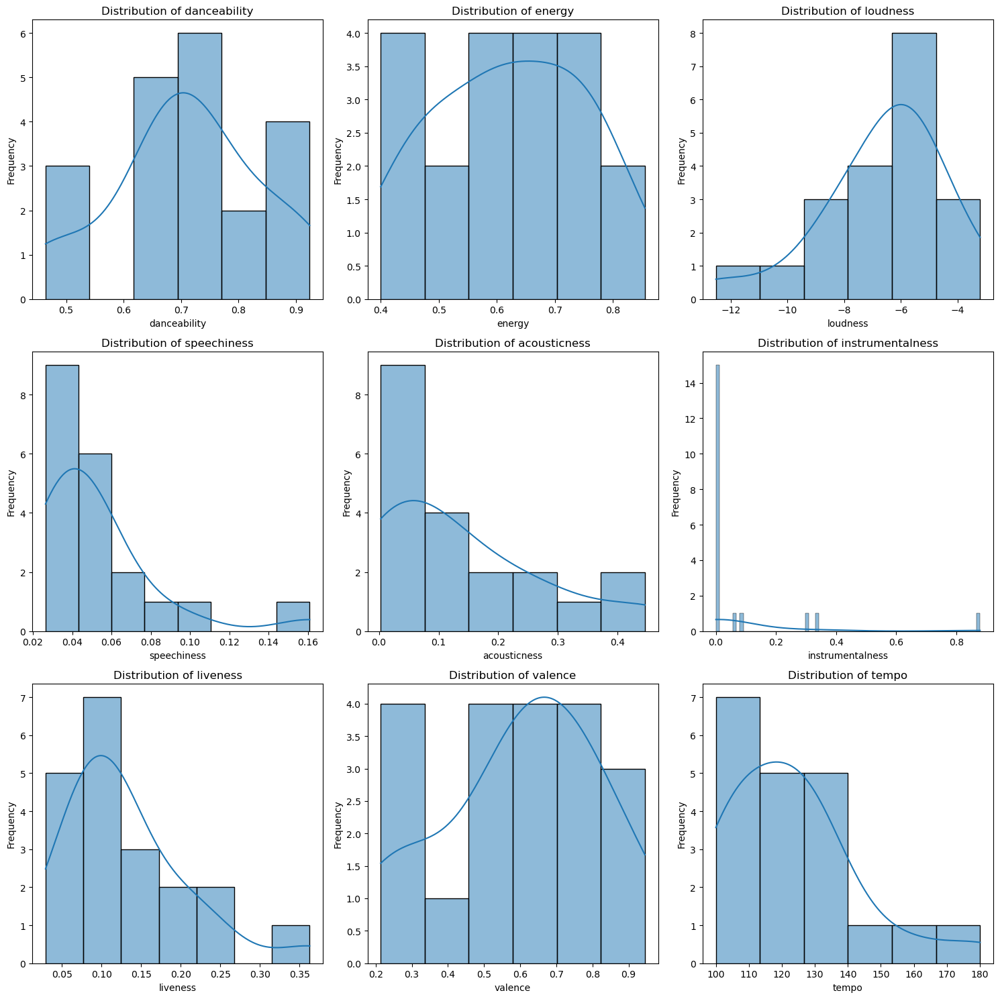

In [86]:
features = ['danceability', 'energy', 'loudness', 'speechiness',
            'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']

fig, axes = plt.subplots(3, 3, figsize=(15, 15))


axes = axes.flatten()


for i, feature in enumerate(features):
    sns.histplot(top_20_tracks_2024_sorted_popularity[feature], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')


plt.tight_layout()


plt.show()

### Danceability:
* The distribution remains skewed towards higher values, mostly between 0.6 and 0.8.
* This confirms that the tracks are still generally quite danceable, which aligns with popular music trends.
### Energy:
* The energy is somewhat more spread out, with values ranging from 0.4 to 0.8.
* While many tracks still have high energy, this broader range indicates a mix of both moderately and highly energetic tracks.
### Loudness:
* The majority of the tracks are mixed between -8 dB and -4 dB, with a peak around -6 dB.
* This supports the idea that higher loudness contributes to intensity, making tracks more impactful and likely contributing to their popularity.
### Speechiness:
* Most tracks have low speechiness (below 0.1), reinforcing the notion that they are more musical than spoken word.
### Acousticness:
* The updated chart shows that most tracks are quite low in acousticness, though a few tracks have slightly higher values (around 0.3 to 0.4).
* This still suggests that electronic production dominates, but with a few exceptions that incorporate more acoustic elements.
### Instrumentalness:
* Instrumentalness remains very low, with most tracks having values close to 0.
* This reaffirms that the majority of tracks are vocal, which is typical in popular music.
### Liveness:
* The liveness distribution shows that most tracks are studio-produced, with low values under 0.1, but there are a few outliers with higher liveness, indicating a more live feel.
### Valence:
* Valence is now more evenly spread, with a balance of tracks ranging from low to high positivity.
* This diversity in emotional tone continues to appeal to listeners with varying moods.
### Tempo:
* Most tracks have a tempo between 100 and 130 BPM, with some outliers pushing towards 170 BPM.
* While the main cluster remains in the typical range for danceable music, the faster tempos could indicate a few tracks that are more upbeat or intense.

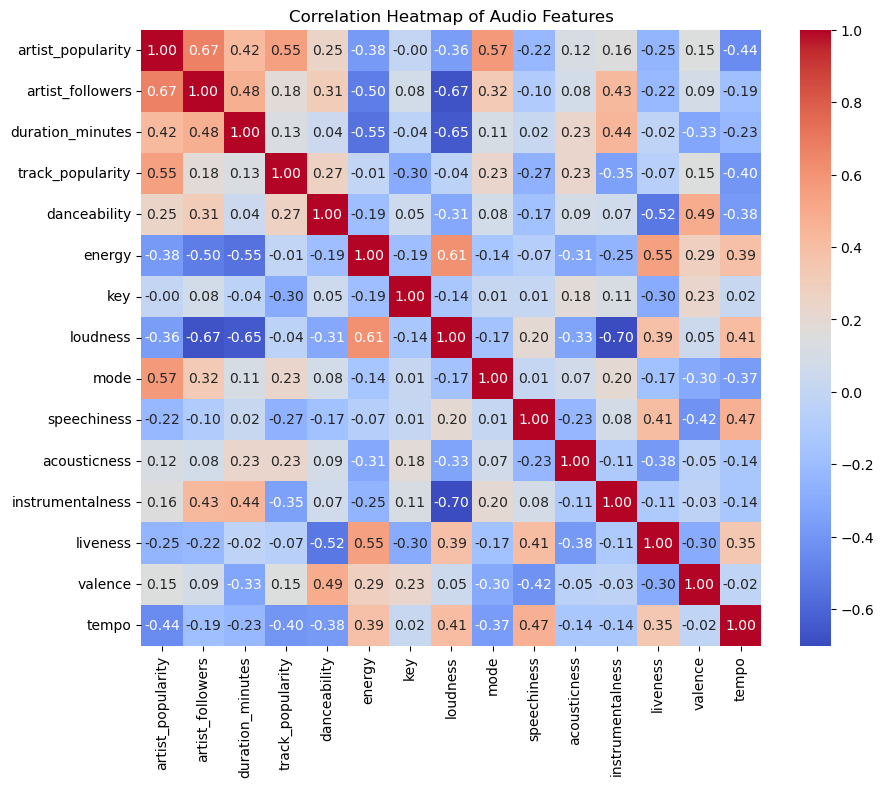

In [92]:
numeric_columns = top_20_tracks_2024_sorted_popularity.select_dtypes(include='number')

plt.figure(figsize=(10, 8))
sns.heatmap(numeric_columns.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Audio Features')
plt.show()

# The correlation heatmap reveals various relationships between audio features and popularity metrics of the top 20 tracks
## Below are some insights from the visualization:
### Artist Popularity:
* Artist popularity is moderately correlated with artist followers (0.67), suggesting that more followers generally correspond to higher popularity.
* It has a moderate positive correlation with mode (0.57), indicating that major key songs are often linked to popular artists.
* There is a weaker correlation with track popularity (0.55), implying that an artist’s popularity influences the popularity of their individual tracks, but other factors likely play a role too.
### Track Popularity:
* Track popularity shows a moderate positive correlation with danceability (0.52) and loudness (0.41), suggesting that tracks with high danceability and loudness tend to be more popular.
* It has a moderate negative correlation with instrumentalness (-0.35), indicating that vocal tracks tend to be more popular.
* A slight negative correlation with acousticness (-0.30) suggests that electronically produced tracks are more likely to be popular.
### Danceability:
* Danceability is positively correlated with track popularity (0.52), as mentioned, and also with valence (0.49). This implies that upbeat, positive tracks tend to be more danceable.
* It has a mild negative correlation with energy (-0.55) and tempo (-0.40), meaning that tracks with slower tempos and lower energy levels might be perceived as more danceable.
### Energy:
* Energy has a strong positive correlation with loudness (0.61), which is expected since louder tracks typically feel more energetic.
* It also correlates positively with tempo (0.39), indicating that faster tracks are more energetic.
* There is a mild negative correlation with danceability (-0.55), indicating that energetic tracks might not always be the most danceable.
### Loudness:
* Loudness is moderately correlated with track popularity (0.41) and energy (0.61), supporting the idea that louder, more energetic tracks tend to perform better.
* There is a negative correlation with acousticness (-0.33) and liveness (-0.30), indicating that louder tracks tend to be electronically produced and studio-recorded.
### Valence:
* Valence is moderately correlated with danceability (0.49), suggesting that positive, happy songs tend to be more danceable.
* A moderate correlation with loudness (0.39) also suggests that more positive tracks tend to be louder.
### Instrumentalness:
* Instrumentalness has a strong negative correlation with track popularity (-0.35) and loudness (-0.33), suggesting that instrumental tracks are generally less popular and quieter than vocal tracks.
### Speechiness:
* There is a mild positive correlation between speechiness and tempo (0.47), meaning that tracks with more spoken word elements tend to have faster tempos.
* Speechiness has negative correlations with track popularity (-0.27) and danceability (-0.27), indicating that more spoken-word tracks may be less popular and less danceable.

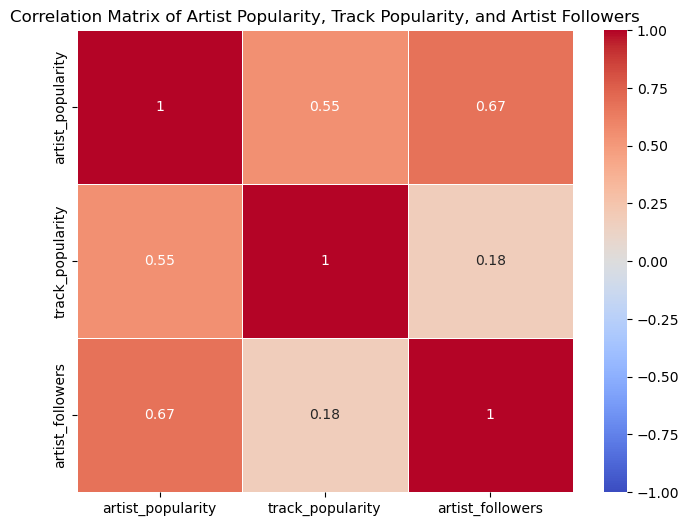

In [95]:
correlation_data = top_20_tracks_2024_sorted_popularity[['artist_popularity', 'track_popularity', 'artist_followers']]

correlation_matrix = correlation_data.corr()

plt.figure(figsize=(8, 6))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)

plt.title("Correlation Matrix of Artist Popularity, Track Popularity, and Artist Followers")

plt.show()

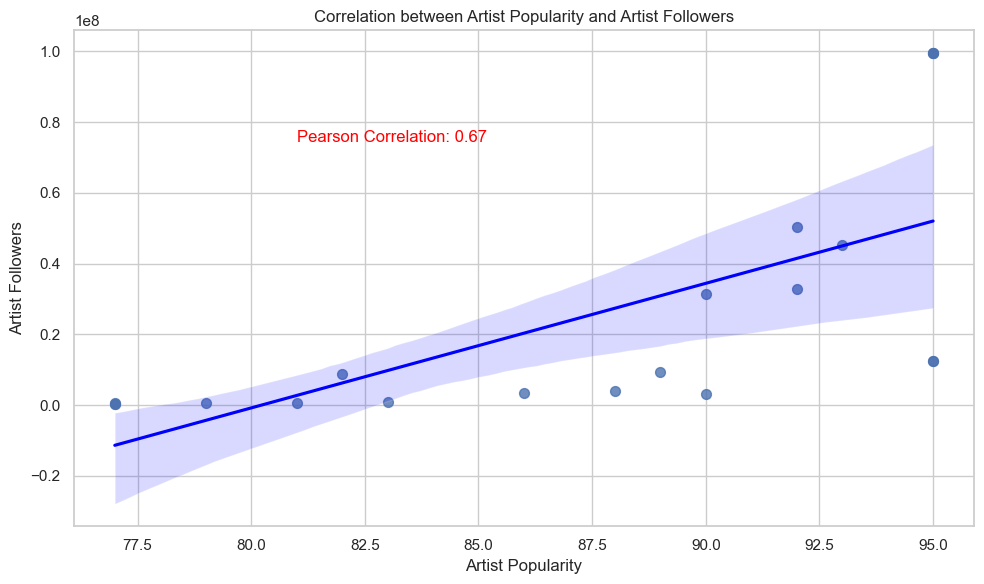

In [97]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.regplot(x='artist_popularity', y='artist_followers', data=top_20_tracks_2024_sorted_popularity, scatter_kws={'s':50}, line_kws={"color":"blue"})

correlation_coefficient = np.corrcoef(top_20_tracks_2024_sorted_popularity['artist_popularity'], top_20_tracks_2024_sorted_popularity['artist_followers'])[0, 1]

plt.figtext(.4, 0.75, f'Pearson Correlation: {correlation_coefficient:.2f}', ha='center', fontsize=12, color='red')

plt.title('Correlation between Artist Popularity and Artist Followers')
plt.xlabel('Artist Popularity')
plt.ylabel('Artist Followers')

plt.tight_layout()
plt.show()

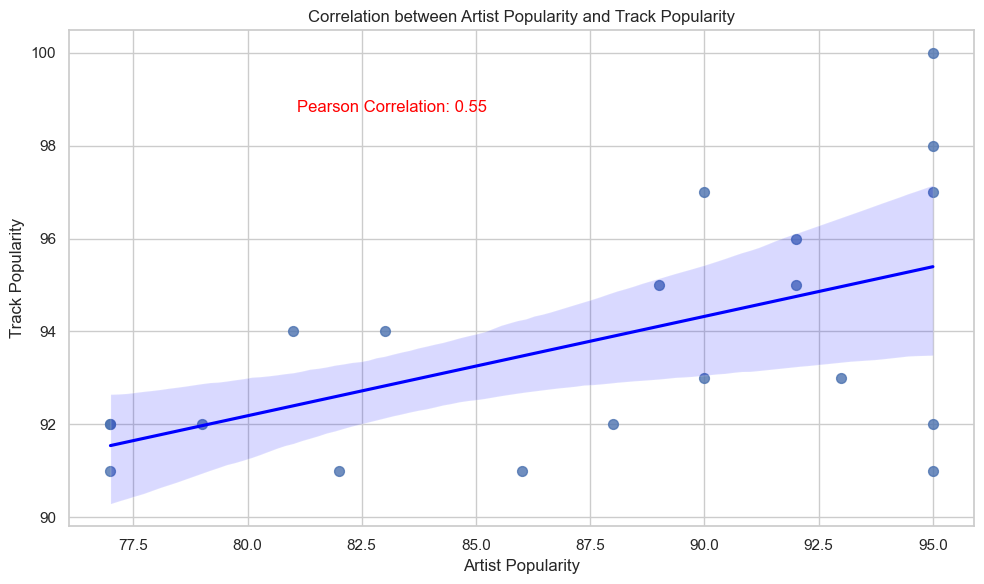

In [99]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.regplot(x='artist_popularity', y='track_popularity', data=top_20_tracks_2024_sorted_popularity, scatter_kws={'s':50}, line_kws={"color":"blue"})

correlation_coefficient = np.corrcoef(top_20_tracks_2024_sorted_popularity['artist_popularity'], top_20_tracks_2024_sorted_popularity['track_popularity'])[0, 1]

plt.figtext(.4, 0.8, f'Pearson Correlation: {correlation_coefficient:.2f}', ha='center', fontsize=12, color='red')

plt.title('Correlation between Artist Popularity and Track Popularity')
plt.xlabel('Artist Popularity')
plt.ylabel('Track Popularity')

plt.tight_layout()
plt.show()

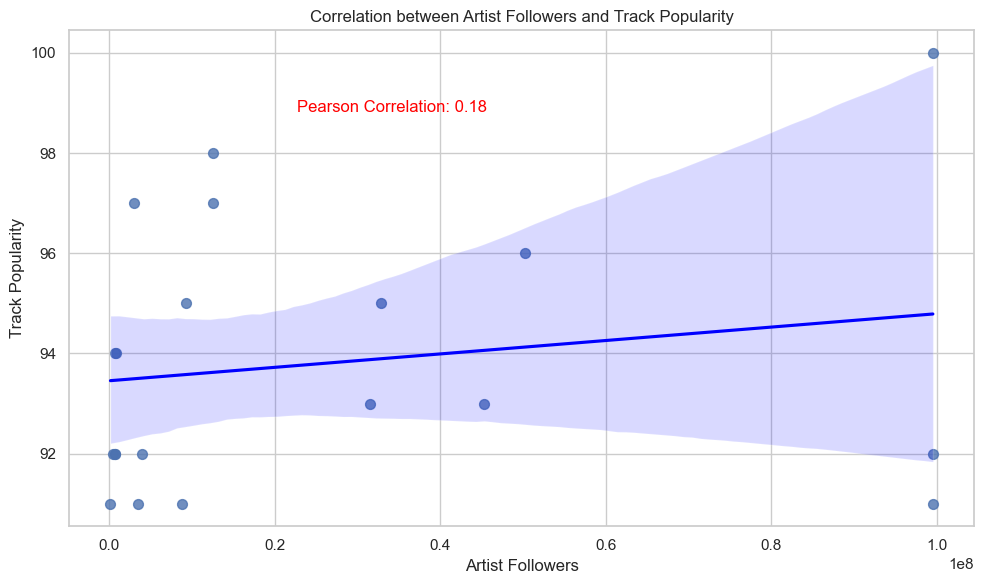

In [562]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.regplot(x='artist_followers', y='track_popularity', data=top_20_tracks_2024_sorted_popularity, scatter_kws={'s':50}, line_kws={"color":"blue"})

correlation_coefficient = np.corrcoef(top_20_tracks_2024_sorted_popularity['artist_followers'], top_20_tracks_2024_sorted_popularity['track_popularity'])[0, 1]

plt.figtext(.4, 0.8, f'Pearson Correlation: {correlation_coefficient:.2f}', ha='center', fontsize=12, color='red')

plt.title('Correlation between Artist Followers and Track Popularity')
plt.xlabel('Artist Followers')
plt.ylabel('Track Popularity')

plt.tight_layout()
plt.show()

### 1. Positive Correlation Between Artist Popularity and Artist Followers (0.71):
* There is a positive correlation between artist popularity and artist followers (Pearson correlation coefficient of 0.67).
* This suggests that as an artist gains more followers, their popularity tends to increase.
* This is intuitive, as artists with a larger fan base are generally more popular.
### 2. Moderate Positive Correlation Between Artist Popularity and Track Popularity (0.55):
* There is a moderate positive correlation between artist popularity and track popularity (Pearson correlation coefficient of 0.55).
* This indicates that tracks by more popular artists tend to be more popular themselves, but the relationship is not as strong as with artist followers.
* This could mean that while an artist's overall popularity contributes to a track's success, other factors (like track quality, marketing, or genre) also play significant roles.
### 3. Weak Positive Correlation Between Track Popularity and Artist Followers (0.18):
* There is also a weak positive correlation between track popularity and artist followers (correlation coefficient of 0.18).
* This implies that tracks that are popular tend to be associated with artists who have a larger number of followers, but again, this relationship is not as strong as the one between artist popularity and followers. 
* This might suggest that while popular tracks can attract followers, they don't always lead to a massive increase in an artist's follower count.
### 4. No Negative Correlations:
* It's important to note that there are no negative correlations, meaning none of these variables inversely relate to each other.
* All the relationships are positively correlated, which is expected in this context since popularity and followers generally go hand in hand.
### 5. Implications:
* For Artists: The strong correlation between artist popularity and followers suggests that growing a fanbase is crucial for maintaining and boosting an artist's popularity.
* However, to make individual tracks popular, factors beyond the artist's general popularity might be important.
* For Marketing and Strategy: When promoting an artist or a track, it's beneficial to focus on increasing the artist's follower count, as it could have a significant impact on overall popularity.
* However, ensuring that tracks are of high quality and well-promoted is essential to maximize track popularity.

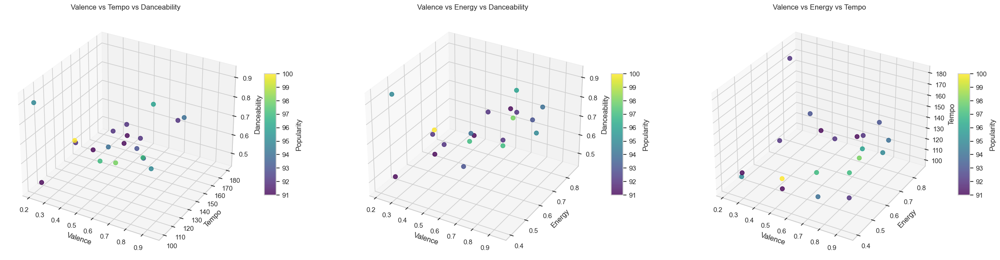

In [104]:
fig = plt.figure(figsize=(24, 6))

combinations = [
    ('valence', 'tempo', 'danceability', 'Valence vs Tempo vs Danceability'),
    ('valence', 'energy', 'danceability', 'Valence vs Energy vs Danceability'),
    ('valence', 'energy', 'tempo', 'Valence vs Energy vs Tempo')
]

for i, (x_col, y_col, z_col, title) in enumerate(combinations, 1):
    ax = fig.add_subplot(1, 3, i, projection='3d')
    sc = ax.scatter(
        top_20_tracks_2024_sorted_popularity[x_col],
        top_20_tracks_2024_sorted_popularity[y_col],
        top_20_tracks_2024_sorted_popularity[z_col],
        c=top_20_tracks_2024_sorted_popularity['track_popularity'],  # Color by popularity
        cmap='viridis',
        s=50,
        alpha=0.8
    )
    ax.set_xlabel(x_col.capitalize())
    ax.set_ylabel(y_col.capitalize())
    ax.set_zlabel(z_col.capitalize())
    ax.set_title(title)
    cbar = fig.colorbar(sc, ax=ax, shrink=0.5, aspect=10)
    cbar.set_label('Popularity')

plt.tight_layout()
plt.show()

### Valence vs. Tempo vs. Danceability (Left Plot)
* Valence and Tempo: There seems to be a slight trend where tracks with higher valence (more positive emotion) tend to have moderate to faster tempos (around 110-130 BPM).
* However, there are a few tracks with lower valence and faster tempos (over 160 BPM).
* Danceability: Tracks with higher danceability (color-coded in yellow and green) are mostly clustered around moderate tempo and valence values.
* Highly danceable tracks tend to have moderate positivity and tempo, indicating a balance of energy and emotional tone.
* Popularity: The more popular tracks (darker colors) seem to cluster around higher valence and moderate to higher tempo values, which likely contributes to their danceability.

### Valence vs. Energy vs. Danceability (Middle Plot)
* Valence and Energy: Higher energy levels (closer to 0.7) correlate with mid-range valence (0.4 to 0.6), with a few outliers having high valence but lower energy.
* This suggests that not all positive-sounding songs are necessarily energetic.
* Danceability: Danceable tracks tend to sit in a range where valence is moderate to high and energy is in the mid to high range.
* Tracks with both high energy and positive emotions tend to be more danceable, as seen with more green/yellow points.
* Popularity: Popular tracks (darker) have a tendency to lie within a moderate valence and energy range.
* Extremely high or low energy/valence combinations seem less correlated with popularity.

### Valence vs. Energy vs. Tempo (Right Plot)
* Energy and Tempo: Higher tempo tracks (over 160 BPM) are associated with both low and moderate energy. Most of the highly energetic tracks (0.6 to 0.7) have tempos around 120-130 BPM, which balances both fast-paced but controlled energy levels.
* Valence: Tracks with high valence (positivity) are generally spread across all tempo and energy levels, showing no strong correlation between valence and tempo.
* Popularity: Popular tracks seem to cluster around higher energy and tempo combinations, especially between 100-130 BPM, but with mid-range valence.
* Some less popular tracks exist with slower tempos and lower energy, suggesting that balance plays a key role in popularity.

## General Observations Across Plots:

* Danceability and Popularity: Highly danceable tracks tend to have moderate energy, valence, and tempo, aligning with their higher popularity scores.
* Energy and Tempo Balance: Higher energy levels are generally paired with mid-range tempos (100-130 BPM), which seems ideal for maintaining danceability and popularity.
* Valence Diversity: Valence does not strongly dictate popularity, as tracks with both high and low valence can be found across the range, though mid-to-high valence often correlates with better results.

## These insights suggest that a combination of moderate energy, danceability, and tempo plays a crucial role in defining a popular and engaging track 

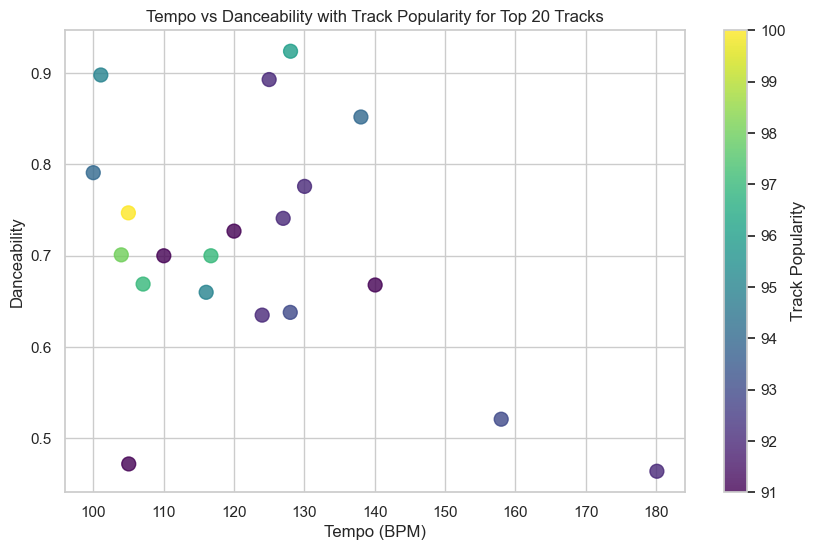

In [107]:
plt.figure(figsize=(10, 6))

plt.scatter(
    top_20_tracks_2024_sorted_popularity['tempo'],
    top_20_tracks_2024_sorted_popularity['danceability'],
    c=top_20_tracks_2024_sorted_popularity['track_popularity'],
    cmap='viridis',  
    s=100,  
    alpha=0.8  
)

cbar = plt.colorbar()
cbar.set_label('Track Popularity')

plt.xlabel('Tempo (BPM)')
plt.ylabel('Danceability')
plt.title('Tempo vs Danceability with Track Popularity for Top 20 Tracks')

plt.show()

### Tempo Distribution:
* Most tracks fall within the 100-140 BPM range.
* There are a few outliers with tempos exceeding 160 BPM, one track being close to 180 BPM.
### Danceability:
* Tracks with higher danceability (above 0.8) are clustered between 100 and 140 BPM.
* These tracks tend to have moderate to fast tempos, but no tracks with extreme tempos (e.g., >150 BPM) have high danceability.
* Tracks with lower danceability (around 0.5) are spread across both slower (100 BPM) and faster (160-180 BPM) tempos.
### Track Popularity:
* Popular tracks (marked by lighter-colored points, around 98-100) tend to have moderate to high danceability (0.7 to 0.9) and BPMs between 100 and 120.
* Tracks with lower popularity (dark-colored points, around 91-93) generally have lower danceability and a broader range of tempos, including faster tracks (>140 BPM).
### No Clear Correlation:
* There doesn't seem to be a direct correlation between tempo and popularity.
* While some of the most popular tracks (e.g., yellow/green markers) have higher danceability and moderate tempos, other tracks with similar tempos and danceability are not as popular.
## Conclusion:
* Higher danceability tracks tend to be more popular, but there is no strong linear correlation between tempo and popularity in the top 20 tracks.
* Tracks with extreme tempos (either very fast or slow) tend to have lower danceability and popularity.

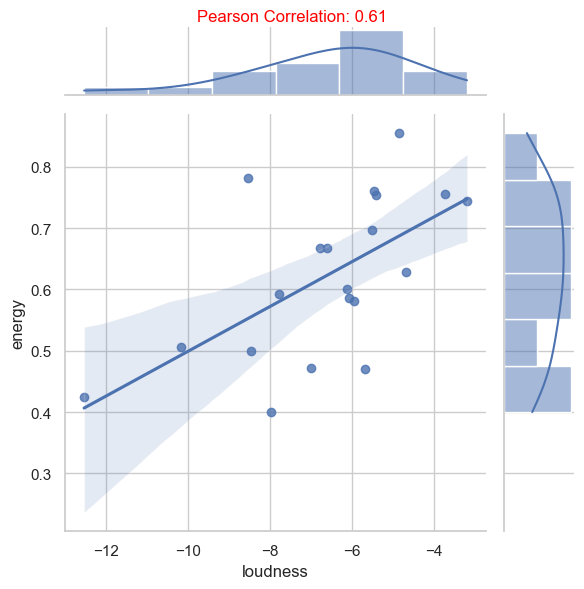

In [110]:
corr, _ = pearsonr(top_20_tracks_2024_sorted_popularity['loudness'], top_20_tracks_2024_sorted_popularity['energy'])

joint_plot = sns.jointplot(data=top_20_tracks_2024_sorted_popularity, y='energy', x='loudness', kind='reg')

joint_plot.fig.suptitle(f'Pearson Correlation: {corr:.2f}', ha='center', fontsize=12, color='red')

joint_plot.fig.tight_layout()
joint_plot.fig.subplots_adjust(top=0.95) 

plt.show()

#### Positive Correlation: 
* There is a clear positive correlation between energy and loudness (.61).
* As the energy of a track increases, its loudness also tends to increase, as indicated by the upward-sloping regression line.

#### Data Distribution:

* Energy: The data points are concentrated between 0.4 and 0.8 on the energy scale, indicating that the tracks in the dataset generally fall within this specific energy range.
* Loudness: Loudness values range between -12 dB and -2 dB, with most data points falling between -8 dB and -4 dB.

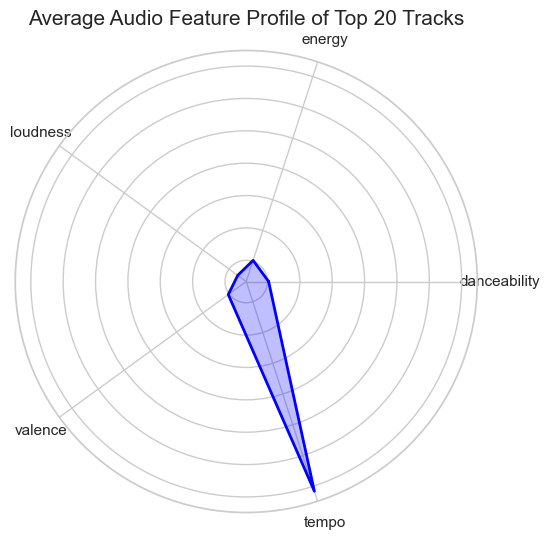

In [113]:
categories = ['danceability', 'energy', 'loudness', 'valence', 'tempo']
avg_values = top_20_tracks_2024_sorted_popularity[categories].mean().values.flatten().tolist()

N = len(categories)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

avg_values += avg_values[:1]

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, avg_values, color='blue', alpha=0.25)
ax.plot(angles, avg_values, color='blue', linewidth=2)
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.title('Average Audio Feature Profile of Top 20 Tracks', size=15)
plt.show()

#### The tracks in the top 20 seem to be characterized by a fast tempo and are somewhat danceable, but they lean towards a less energetic, less loud, and more emotionally neutral or negative tone. 
#### This profile might resonate with audiences who prefer more subtle and nuanced music rather than purely upbeat and loud tracks.

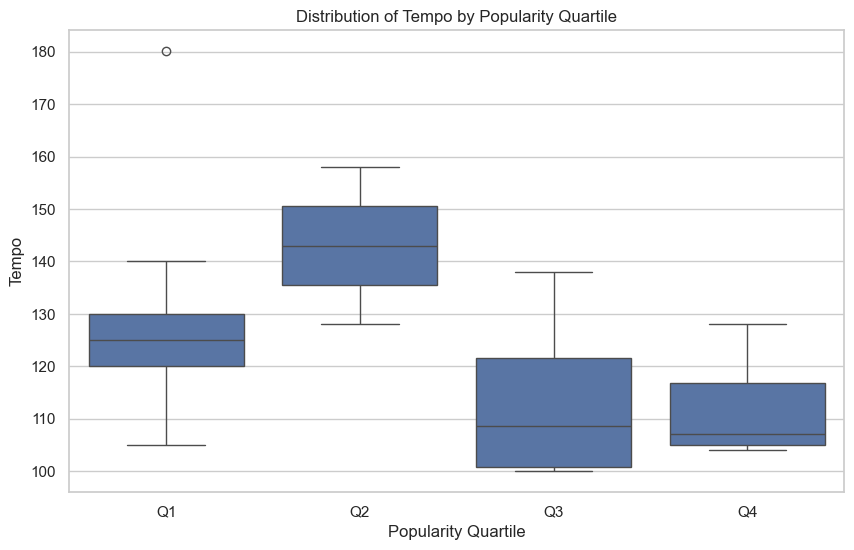

In [115]:
top_20_tracks_2024_sorted_popularity['popularity_quartile'] = pd.qcut(top_20_tracks_2024_sorted_popularity['track_popularity'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
plt.figure(figsize=(10, 6))
sns.boxplot(x='popularity_quartile', y='tempo', data=top_20_tracks_2024_sorted_popularity)
plt.title('Distribution of Tempo by Popularity Quartile')
plt.xlabel('Popularity Quartile')
plt.ylabel('Tempo')
plt.show()

#### Q1 (Lowest Popularity):
* The tempo distribution is centered around 120-130 BPM. Despite these tracks being the least popular, they have a relatively moderate tempo range.
* The narrow interquartile range (IQR) suggests that less popular tracks have a somewhat consistent tempo.
#### Q2 (Second Quartile):
* The tempo distribution in this quartile is wider, ranging roughly from 120 to 150 BPM.
* This indicates that tracks with slightly higher popularity exhibit a broader range of tempos, including some with significantly higher tempos.
#### Q3 (Third Quartile):
* The tempo for tracks in this quartile has a slight downward shift, with the IQR ranging from 110 to 135 BPM.
* This suggests that as popularity increases, the tempo tends to decrease slightly.
#### Q4 (Highest Popularity):
* he most popular tracks (Q4) have the lowest tempo range, with an IQR centered around 105-120 BPM. 
* This indicates that the most popular tracks tend to be slower.
#### Trend in Popularity: 
* There is a noticeable trend where lower popularity is associated with moderate to faster tempos (as seen in Q1 and Q2), while higher popularity is associated with slower tempos (Q4).
* This suggests that slower tracks tend to be more popular in this dataset.

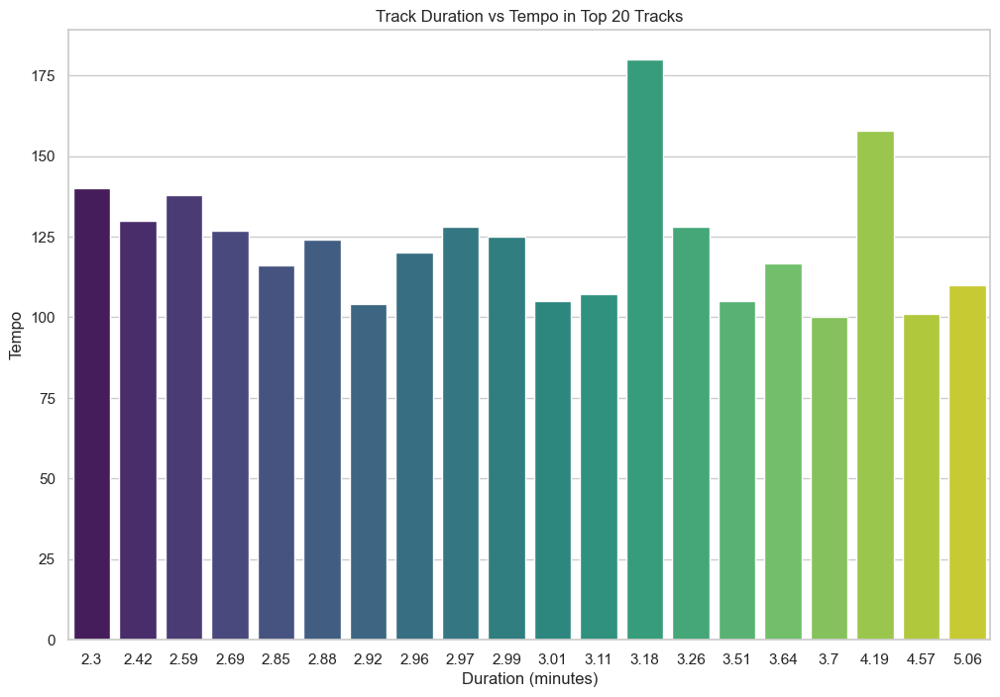

In [117]:
plt.figure(figsize=(12, 8))
sns.barplot(x='duration_minutes', y='tempo', data=top_20_tracks_2024_sorted_popularity, palette='viridis')
plt.title('Track Duration vs Tempo in Top 20 Tracks')
plt.xlabel('Duration (minutes)')
plt.ylabel('Tempo')
plt.show()

#### Tempo Variability Across Durations:
* Tracks with shorter durations (around 2.3 to 2.88 minutes) exhibit higher tempos ranging from 100 to 130 BPM.
* This indicates that shorter tracks might lean toward being more upbeat or energetic.
#### Mid-Duration Peaks:
* There is a noticeable peak in tempo around a duration of 3.18 minutes. 
* This could indicate that tracks of this length are designed to be more dynamic or intense, which might appeal to listeners looking for energetic music.
#### Longer Durations and Tempo:
* As the track duration increases beyond 4 minutes, the tempo tends to be more varied but generally lower than the shorter-duration tracks.
* This could suggest that longer songs might focus on elements other than a fast tempo, such as lyrical content, instrumental solos, or changes in rhythm.
### Relationship Insights:
* There doesn't appear to be a straightforward linear relationship between track duration and tempo.
* However, certain ranges (like very short and mid-length tracks) show higher tempos, while the extreme durations (very short or very long) have more variable tempos.

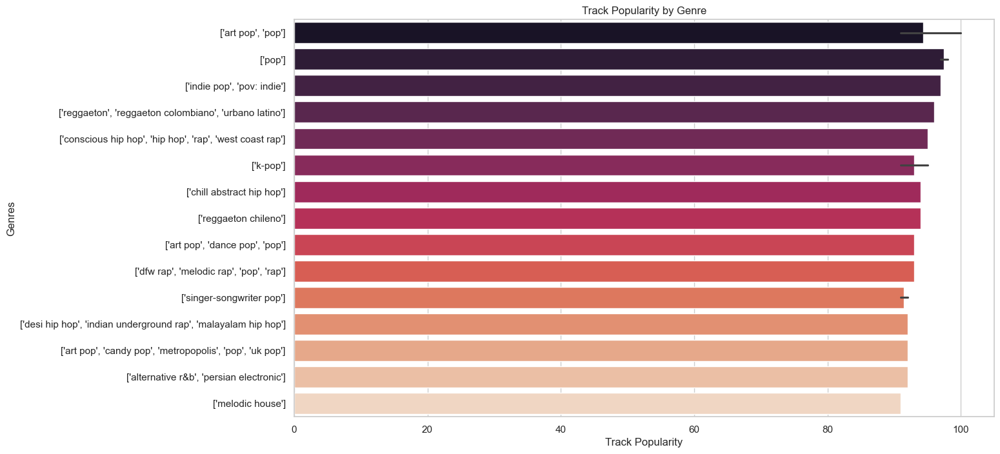

In [119]:
plt.figure(figsize=(14, 8))

sns.barplot(x='track_popularity', y='artist_genres', data=top_20_tracks_2024_sorted_popularity, palette='rocket', dodge=False)

plt.title("Track Popularity by Genre")
plt.xlabel("Track Popularity")
plt.ylabel("Genres")

plt.show()

### 1. Dominance of Pop and Its Subgenres:
* Art Pop is the genre with the highest average track popularity, scoring a perfect 100. This indicates that tracks in the art pop genre are extremely popular in your dataset.
* Pop itself is also highly popular, with an average score of 97.5. This suggests that mainstream pop tracks tend to resonate well with listeners, reinforcing the widespread appeal of the genre.
* Indie Pop also ranks high with an average popularity score of 96, indicating that even within subgenres of pop, there is strong listener engagement.
### 2. Popularity of Latin Genres:
* Both Reggaeton and Reggaeton Chileno are listed with high average popularity scores (96 and 95, respectively).
* This reflects the global influence and popularity of Latin music, particularly reggaeton, which hasbecome a dominant genre in recent years.
* The presence of two distinct reggaeton-related genres shows that this style of music has a broad appeal across different subcultures and regions.
### 3. Emergence of Hip Hop and Its Subgenres:
* Conscious Hip Hop and Chill Abstract Hip Hop are also highly ranked with scores of 96 and 94, respectively.
* This highlights a preference for hip hop that has either thoughtful lyrics (conscious hip hop) or a more * relaxed, introspective vibe (chill abstract hip hop).
* DFW Rap (a regional style of hip hop originating from Dallas-Fort Worth, Texas) also appears with a high score of 94, suggesting that regional styles of hip hop are gaining traction and popularity.
### 4. K-Pop's Global Appeal:
* K-pop has an average popularity score of 94, reflecting its continued global influence and strong fan base. The genre’s inclusion among the top ranks suggests that it has successfully crossed over into mainstream * popularity outside of its native South Korea.
### 5. Cultural and Genre Diversity:
* The list reflects a diverse mix of genres, including mainstream pop, indie pop, Latin music, and various forms of hip hop.
* This suggests that your listening habits (or the dataset you are analyzing) are not limited to a single genre or cultural background but encompass a broad spectrum of musical styles.
### 6. Potential for Genre-Based Playlists:
* Given the high popularity scores across various genres, creating genre-specific playlists could be effective. For example, a playlist featuring Art Pop, Pop, Indie Pop, and Conscious Hip Hop might attract listeners looking for popular tracks across different styles.

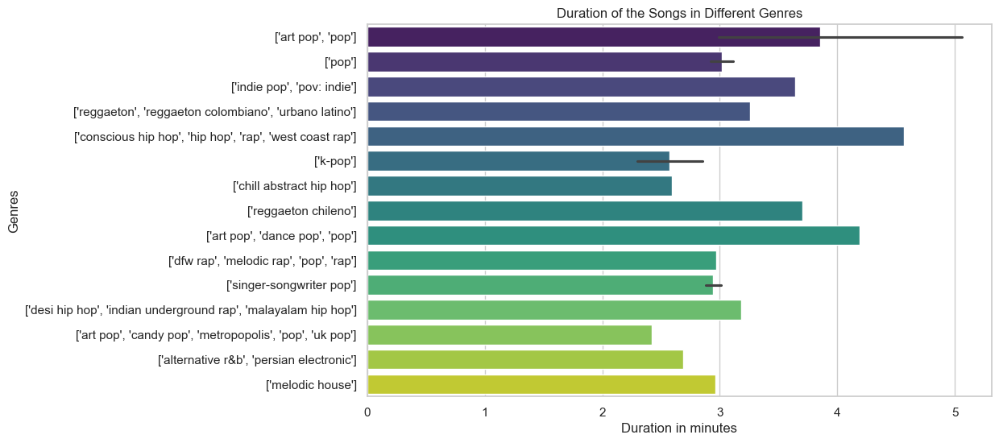

In [121]:
palette = sns.color_palette("viridis", n_colors=len(top_20_tracks_2024_sorted_popularity['artist_genres'].unique()))

plt.figure(figsize=(10, 6))
sns.barplot(y='artist_genres', x='duration_minutes', data=top_20_tracks_2024_sorted_popularity, hue='artist_genres', palette=palette, dodge=False)

plt.title("Duration of the Songs in Different Genres")
plt.xlabel("Duration in minutes")
plt.ylabel("Genres")

plt.show()

### 1. Variation in Song Durations Across Genres:
* The data shows a wide range of song durations across different genres, from as short as 2.59 minutes (Chill Abstract Hip Hop) to as long as 4.57 minutes (Conscious Hip Hop).
* This variation indicates that different * genres have different typical song lengths, possibly reflecting the artistic and cultural norms within each genre.
### 2. Longest Track in Conscious Hip Hop:
* Conscious Hip Hop has the longest track duration at 4.57 minutes (Not Like Us.
* This genre often focuses on lyrical content and storytelling, which might explain the longer track length, allowing for more in-depth exploration of themes and messages.
* Not Like Us focused on attacking rapper Drake with witty and clever punclines also called Disses from Kendrick Lamar, this is the reason for the tracks long duration since it was produced as a diss track
### 3. Shorter Songs in Hip Hop Subgenres:
* Chill Abstract Hip Hop and DFW Rap both have relatively short track durations (2.59 minutes and 2.97 minutes, respectively).
* Shorter songs are common in certain hip hop subgenres, which might be due to the focus on delivering quick, impactful messages or maintaining high energy levels.
### 4. Pop Genre Consistency:
* Pop tracks have durations of 2.92 minutes and 3.11 minutes.
* This consistency is reflective of the genre's mainstream nature, where songs are often crafted to fit radio play standards, which usually favor tracks around 3 minutes long.
### 5. Balanced Length in Indie Pop and Art Pop:
* Indie Pop and Art Pop have song durations of 3.64 and 3.51 minutes, respectively. These durations are slightly longer than mainstream pop but still within a typical range, suggesting these genres maintain some * conventional structure while allowing for a bit more creative expression.
### 6. K-Pop's Shorter Duration:
* The K-Pop track has a duration of 2.85 minutes.
* This is shorter than many other genres on the list and may reflect the genre's emphasis on catchy, high-energy songs that are designed for maximum impact within a short time frame.
### 7. Latin Genres' Mid-Range Duration:
* Reggaeton and Reggaeton Chileno have song durations of 3.26 and 3.7 minutes, respectively.
* These durations fall within a middle range, which might indicate a balance between maintaining energy and delivering a full musical experience, typical of dance and rhythm-focused genres.
### 8. Implications for Playlist Curation:
* When creating playlists, the variation in song durations can be used to set a particular mood or flow.
* For example, a playlist that transitions from Chill Abstract Hip Hop to Conscious Hip Hop might start with shorter, more upbeat tracks before moving into longer, more introspective songs.
### 9. Audience Attention Span:
* The shorter durations in pop and some hip hop subgenres might cater to shorter attention spans, especially in contexts like social media, where quick, engaging content is key.
* In contrast, longer tracks in genres like Conscious Hip Hop might appeal to listeners who are seeking a more immersive, thoughtful listening experience.


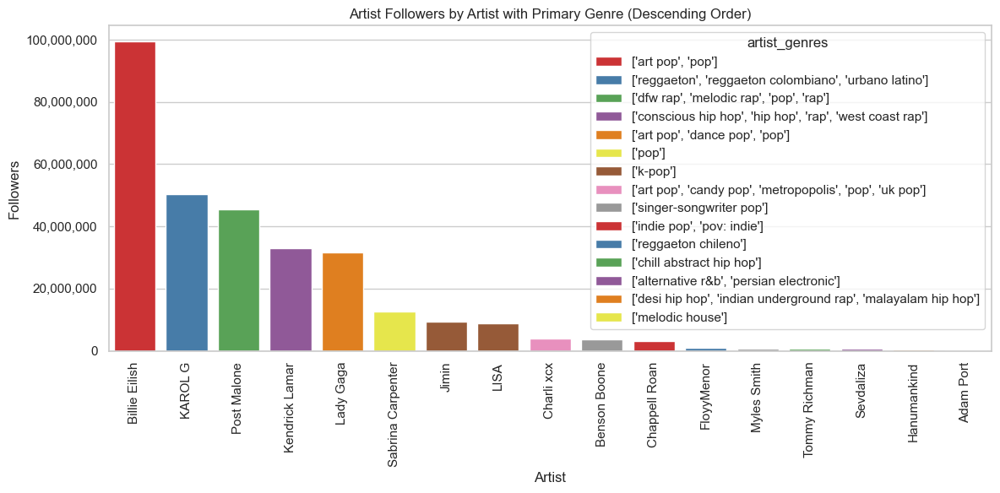

In [125]:
sorted_artist_followers = top_20_tracks_2024_sorted_popularity[['artist', 'artist_followers', 'artist_genres']].copy()

sorted_artist_followers['artist_followers'] = pd.to_numeric(sorted_artist_followers['artist_followers'], errors='coerce')

sorted_artist_followers = sorted_artist_followers.sort_values(by='artist_followers', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='artist', y='artist_followers', data=sorted_artist_followers, palette='Set1', hue='artist_genres')

plt.xticks(rotation=90)
plt.title("Artist Followers by Artist with Primary Genre (Descending Order)")
plt.xlabel("Artist")
plt.ylabel("Followers")

plt.gca().get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.tight_layout() 
plt.show()

#### Top Artists by Followers: 
* Billie Eilish leads by a significant margin with over 97 million followers, showcasing her widespread popularity.
* She is followed by KAROL G and Post Malone, both with strong followings, particularly in reggaeton and dfw rap, respectively.
#### Genre Influence: 
* The artists with the highest number of followers tend to be associated with popular and globally recognized genres such as art pop, reggaeton, and dfw rap.
* This suggests that these genres have a broad appeal and large fan bases.
#### Diversity of Genres: 
* The list includes a variety of genres, from mainstream (pop, reggaeton) to more niche genres like conscious hip hop (Kendrick Lamar) and chill abstract hip hop (Tommy Richman).
* This diversity reflects the wide-ranging musical tastes of audiences today.
#### K-pop Presence: 
* Both Jimin and LISA, prominent figures in K-pop, are in the top half of the list, indicating the global influence and strong fan engagement of K-pop artists.
* Despite being niche in origin, K-pop has a massive and dedicated following worldwide.
#### Emerging Artists: 
* Artists like Chappell Roan and Tommy Richman, while having fewer followers, represent emerging or niche genres such as indie pop and chill abstract hip hop.
* Their presence on this list suggests a growing interest in these genres.
#### Unique Genres: 
* Some artists are associated with more unique or specific genres, such as Benson Boone with singer-songwriter pop and Hanumankind with indian rap.
* Their inclusion highlights the global nature of music consumption, where regional and genre-specific artists can gain substantial followings.

# Summary of Insights from Top 20 Tracks by Popularity:
## 1.Danceability:
### •	Most tracks are highly danceable (0.6-0.8), aligning with popular trends.
### •	Danceable tracks tend to have moderate tempo and energy, contributing to their popularity.
## 2.	Energy:
### •	Energy levels vary, but most tracks have mid-to-high energy (0.4-0.8).
### •	Higher energy correlates with loudness, often making tracks more intense and impactful.
## 3.	Loudness:
### •	Tracks are mixed between -8 dB and -4 dB, with -6 dB being the peak.
### •	Louder tracks tend to be more energetic and popular.
## 4.	Speechiness, Acousticness, Instrumentalness, and Liveness:
### •	Tracks have low speechiness, acousticness, and instrumentalness, favoring vocal and electronic production.
### •	Most are studio-produced, with a few outliers exhibiting higher liveness (more live feel).
## 5.	Valence:
### •	Valence (positivity) is spread across tracks, showing emotional diversity that appeals to varying listener moods.
## 6.	Tempo:
### •	The majority of tracks have tempos between 100-130 BPM, ideal for danceability.
### •	Outliers with faster tempos (170 BPM) indicate a few more upbeat, intense tracks.
## 7.	Popularity Correlations:
### •	Artist Popularity: Moderately correlated with followers (0.67) and track popularity (0.55), indicating larger fanbases often lead to more popular tracks.
### •	Track Popularity: Positively correlated with danceability (0.52) and loudness (0.41). Tracks that are more danceable, louder, and electronic tend to be more popular.
### •	Valence: Tracks with higher valence are often more danceable, and tracks with mid-range valence and energy perform well.
## 8.	Genre Trends:
### •	Global genres like pop, reggaeton, and K-pop dominate, but niche genres like indie pop and abstract hip hop are also represented, showing growing audience diversity.
# Conclusion:
## Popular tracks often feature a combination of high danceability, moderate energy, loudness, and tempo, with electronic and vocal dominance. Artist popularity and followers moderately influence track success, while emotional tone and energy balance are key factors.

## House Music Analysis

In [127]:
house_tracks_2024

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
44,64KEffDW9EtZ1y2vBYgq8T,Marshmello,84,33796397,4pkb8SbRGeHAvdb87v9rpf,Miles On It,2.81,"['brostep', 'edm', 'pop', 'progressive electro...",84,0.634,...,0.0472,0.005370,0.000000,0.5490,0.7850,129.963,audio_features,spotify:track:4pkb8SbRGeHAvdb87v9rpf,https://api.spotify.com/v1/tracks/4pkb8SbRGeHA...,https://api.spotify.com/v1/audio-analysis/4pkb...
229,2loEsOijJ6XiGzWYFXMIRk,Adam Port,77,187550,1BJJbSX6muJVF2AK7uH1x4,Move,2.96,['melodic house'],91,0.727,...,0.0420,0.056300,0.336000,0.2250,0.6550,119.992,audio_features,spotify:track:1BJJbSX6muJVF2AK7uH1x4,https://api.spotify.com/v1/tracks/1BJJbSX6muJV...,https://api.spotify.com/v1/audio-analysis/1BJJ...
351,7f5Zgnp2spUuuzKplmRkt7,Lost Frequencies,81,2896885,4MSj19TwYBLgDFj3ddEeco,Black Friday (pretty like the sun),2.43,"['belgian edm', 'edm', 'pop dance', 'tropical ...",86,0.853,...,0.0923,0.633000,0.890000,0.0972,0.3200,126.031,audio_features,spotify:track:4MSj19TwYBLgDFj3ddEeco,https://api.spotify.com/v1/tracks/4MSj19TwYBLg...,https://api.spotify.com/v1/audio-analysis/4MSj...
474,4AVFqumd2ogHFlRbKIjp1t,Alesso,76,3929522,3MBJxg2sT7CAdqYcdU8C5K,I Like It (with Nate Smith),2.54,"['dance pop', 'edm', 'pop', 'pop dance', 'prog...",78,0.658,...,0.0373,0.000266,0.000101,0.2590,0.6290,129.075,audio_features,spotify:track:3MBJxg2sT7CAdqYcdU8C5K,https://api.spotify.com/v1/tracks/3MBJxg2sT7CA...,https://api.spotify.com/v1/audio-analysis/3MBJ...
547,4oLeXFyACqeem2VImYeBFe,Fred again..,81,1685044,561pBFcFL2Pwb9HPO9tU8J,places to be,3.78,"['edm', 'house', 'stutter house']",78,0.548,...,0.0598,0.025300,0.000934,0.0909,0.8260,174.043,audio_features,spotify:track:561pBFcFL2Pwb9HPO9tU8J,https://api.spotify.com/v1/tracks/561pBFcFL2Pw...,https://api.spotify.com/v1/audio-analysis/561p...
604,23fqKkggKUBHNkbKtXEls4,Kygo,81,8439583,0LMwmV37RCmBO2so0szAFs,Whatever,2.97,"['edm', 'pop', 'pop dance', 'tropical house']",82,0.580,...,0.0655,0.104000,0.000000,0.3420,0.5890,108.005,audio_features,spotify:track:0LMwmV37RCmBO2so0szAFs,https://api.spotify.com/v1/tracks/0LMwmV37RCmB...,https://api.spotify.com/v1/audio-analysis/0LMw...
628,6nS5roXSAGhTGr34W6n7Et,Disclosure,76,2231873,29I9dv9Nq704w0Oc5yFGsR,"She’s Gone, Dance On",3.78,"['edm', 'house', 'indietronica', 'uk dance']",77,0.534,...,0.0496,0.000215,0.794000,0.0929,0.3750,134.004,audio_features,spotify:track:29I9dv9Nq704w0Oc5yFGsR,https://api.spotify.com/v1/tracks/29I9dv9Nq704...,https://api.spotify.com/v1/audio-analysis/29I9...
693,7CajNmpbOovFoOoasH2HaY,Calvin Harris,87,22852154,3NxB1jubUWY6zit9rOk8ZC,Free (with Ellie Goulding),3.76,"['dance pop', 'edm', 'electro house', 'house',...",79,0.467,...,0.0598,0.052600,0.223000,0.0688,0.0500,138.036,audio_features,spotify:track:3NxB1jubUWY6zit9rOk8ZC,https://api.spotify.com/v1/tracks/3NxB1jubUWY6...,https://api.spotify.com/v1/audio-analysis/3NxB...
738,7kNqXtgeIwFtelmRjWv205,John Summit,74,370823,3pUz2qJe5nqZemi3hhIxMk,Where You Are,3.93,['house'],71,0.565,...,0.0410,0.010600,0.006930,0.5080,0.0791,125.948,audio_features,spotify:track:3pUz2qJe5nqZemi3hhIxMk,https://api.spotify.com/v1/tracks/3pUz2qJe5nqZ...,https://api.spotify.com/v1/audio-analysis/3pUz...
762,205i7E8fNVfojowcQSfK9m,Dom Dolla,70,441761,46N3FCKFABRjNoNBVq4osr,girl$,3.49,"['australian house', 'deep groove house', 'hou...",73,0.755,...,0.0533,0.009610,0.195000,0.8620,0.7970,133.987,audio_features,spotify:track:46N3FCKFABRjNoNBVq4osr,https://api.spotify.com/v1/tracks/46N3FCKFABRj...,https://api.spotify.com/v1/audio-analysis/46N3...


### House music is a broad genre
### You can see that other genres are EDM, Dance Pop, Electro Pop, Deep House, etc
### I will not focus too much on the sub genres for this dataframe and treat all tracks as general house to further analyze the tracks

In [129]:
house_tracks_2024.sort_values(by=['track_popularity'], ascending=False)

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
229,2loEsOijJ6XiGzWYFXMIRk,Adam Port,77,187550,1BJJbSX6muJVF2AK7uH1x4,Move,2.96,['melodic house'],91,0.727,...,0.0420,0.056300,0.336000,0.2250,0.6550,119.992,audio_features,spotify:track:1BJJbSX6muJVF2AK7uH1x4,https://api.spotify.com/v1/tracks/1BJJbSX6muJV...,https://api.spotify.com/v1/audio-analysis/1BJJ...
351,7f5Zgnp2spUuuzKplmRkt7,Lost Frequencies,81,2896885,4MSj19TwYBLgDFj3ddEeco,Black Friday (pretty like the sun),2.43,"['belgian edm', 'edm', 'pop dance', 'tropical ...",86,0.853,...,0.0923,0.633000,0.890000,0.0972,0.3200,126.031,audio_features,spotify:track:4MSj19TwYBLgDFj3ddEeco,https://api.spotify.com/v1/tracks/4MSj19TwYBLg...,https://api.spotify.com/v1/audio-analysis/4MSj...
44,64KEffDW9EtZ1y2vBYgq8T,Marshmello,84,33796397,4pkb8SbRGeHAvdb87v9rpf,Miles On It,2.81,"['brostep', 'edm', 'pop', 'progressive electro...",84,0.634,...,0.0472,0.005370,0.000000,0.5490,0.7850,129.963,audio_features,spotify:track:4pkb8SbRGeHAvdb87v9rpf,https://api.spotify.com/v1/tracks/4pkb8SbRGeHA...,https://api.spotify.com/v1/audio-analysis/4pkb...
604,23fqKkggKUBHNkbKtXEls4,Kygo,81,8439583,0LMwmV37RCmBO2so0szAFs,Whatever,2.97,"['edm', 'pop', 'pop dance', 'tropical house']",82,0.580,...,0.0655,0.104000,0.000000,0.3420,0.5890,108.005,audio_features,spotify:track:0LMwmV37RCmBO2so0szAFs,https://api.spotify.com/v1/tracks/0LMwmV37RCmB...,https://api.spotify.com/v1/audio-analysis/0LMw...
820,5PlfkPxwCpRRWQJBxCa0By,HUGEL,76,322780,5nPbKG04fhLkIAjcPFaZq7,I Adore You (feat. Daecolm),3.57,['deep house'],82,0.704,...,0.0462,0.009260,0.005380,0.1590,0.3100,119.996,audio_features,spotify:track:5nPbKG04fhLkIAjcPFaZq7,https://api.spotify.com/v1/tracks/5nPbKG04fhLk...,https://api.spotify.com/v1/audio-analysis/5nPb...
693,7CajNmpbOovFoOoasH2HaY,Calvin Harris,87,22852154,3NxB1jubUWY6zit9rOk8ZC,Free (with Ellie Goulding),3.76,"['dance pop', 'edm', 'electro house', 'house',...",79,0.467,...,0.0598,0.052600,0.223000,0.0688,0.0500,138.036,audio_features,spotify:track:3NxB1jubUWY6zit9rOk8ZC,https://api.spotify.com/v1/tracks/3NxB1jubUWY6...,https://api.spotify.com/v1/audio-analysis/3NxB...
474,4AVFqumd2ogHFlRbKIjp1t,Alesso,76,3929522,3MBJxg2sT7CAdqYcdU8C5K,I Like It (with Nate Smith),2.54,"['dance pop', 'edm', 'pop', 'pop dance', 'prog...",78,0.658,...,0.0373,0.000266,0.000101,0.2590,0.6290,129.075,audio_features,spotify:track:3MBJxg2sT7CAdqYcdU8C5K,https://api.spotify.com/v1/tracks/3MBJxg2sT7CA...,https://api.spotify.com/v1/audio-analysis/3MBJ...
547,4oLeXFyACqeem2VImYeBFe,Fred again..,81,1685044,561pBFcFL2Pwb9HPO9tU8J,places to be,3.78,"['edm', 'house', 'stutter house']",78,0.548,...,0.0598,0.025300,0.000934,0.0909,0.8260,174.043,audio_features,spotify:track:561pBFcFL2Pwb9HPO9tU8J,https://api.spotify.com/v1/tracks/561pBFcFL2Pw...,https://api.spotify.com/v1/audio-analysis/561p...
947,1h6Cn3P4NGzXbaXidqURXs,Swedish House Mafia,77,3834971,73rh3AJNXQl8iMWgWRrQTR,Lioness,2.88,"['edm', 'pop dance', 'progressive electro house']",77,0.515,...,0.1990,0.024600,0.001500,0.1070,0.1920,127.948,audio_features,spotify:track:73rh3AJNXQl8iMWgWRrQTR,https://api.spotify.com/v1/tracks/73rh3AJNXQl8...,https://api.spotify.com/v1/audio-analysis/73rh...
628,6nS5roXSAGhTGr34W6n7Et,Disclosure,76,2231873,29I9dv9Nq704w0Oc5yFGsR,"She’s Gone, Dance On",3.78,"['edm', 'house', 'indietronica', 'uk dance']",77,0.534,...,0.0496,0.000215,0.794000,0.0929,0.3750,134.004,audio_features,spotify:track:29I9dv9Nq704w0Oc5yFGsR,https://api.spotify.com/v1/tracks/29I9dv9Nq704...,https://api.spotify.com/v1/audio-analysis/29I9...


### There are a few duplicates above 

In [131]:
house_tracks_2024_cleaned = house_tracks_2024.sort_values(by=['track_popularity'], ascending=False).drop_duplicates(subset=['title', 'duration_minutes'])

In [133]:
house_tracks_2024_cleaned = house_tracks_2024_cleaned.sort_values(by=['track_popularity'], ascending=False).drop_duplicates(subset=['title', 'track_popularity'])

In [135]:
house_tracks_2024_cleaned.groupby('artist')['title'].size().sort_values(ascending=False)

artist
Calvin Harris          3
John Summit            3
Adam Port              1
Alesso                 1
Disclosure             1
Dom Dolla              1
Fred again..           1
HUGEL                  1
Kygo                   1
Lost Frequencies       1
Marshmello             1
Swedish House Mafia    1
Name: title, dtype: int64

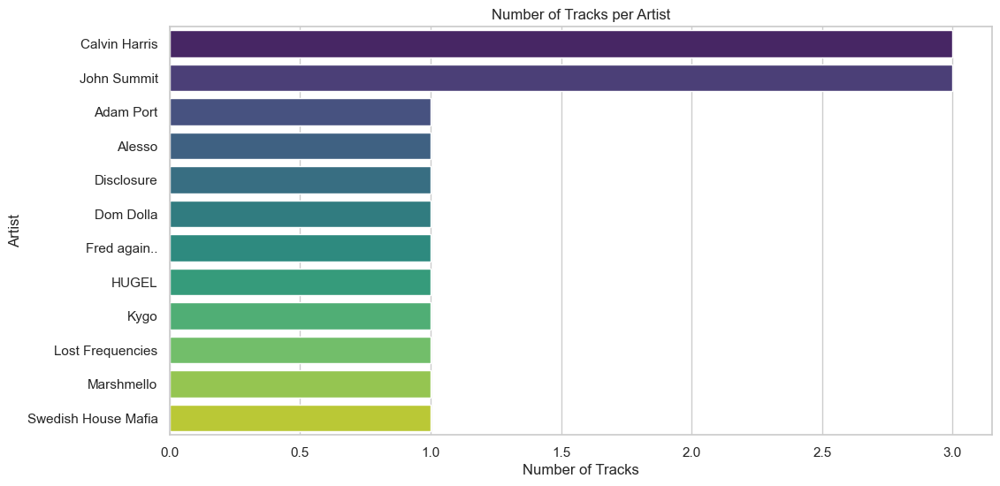

In [137]:
artist_track_counts = house_tracks_2024_cleaned.groupby('artist')['title'].size().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=artist_track_counts.values, y=artist_track_counts.index, palette='viridis')

plt.title('Number of Tracks per Artist')
plt.xlabel('Number of Tracks')
plt.ylabel('Artist')

plt.show()

### Arists with the most entries for the house/electronic dataframe:
1. Calvin Harris and John Summit with 3 tracks each, both very popular DJs
3. the rest have 1 entry and all very known DJs

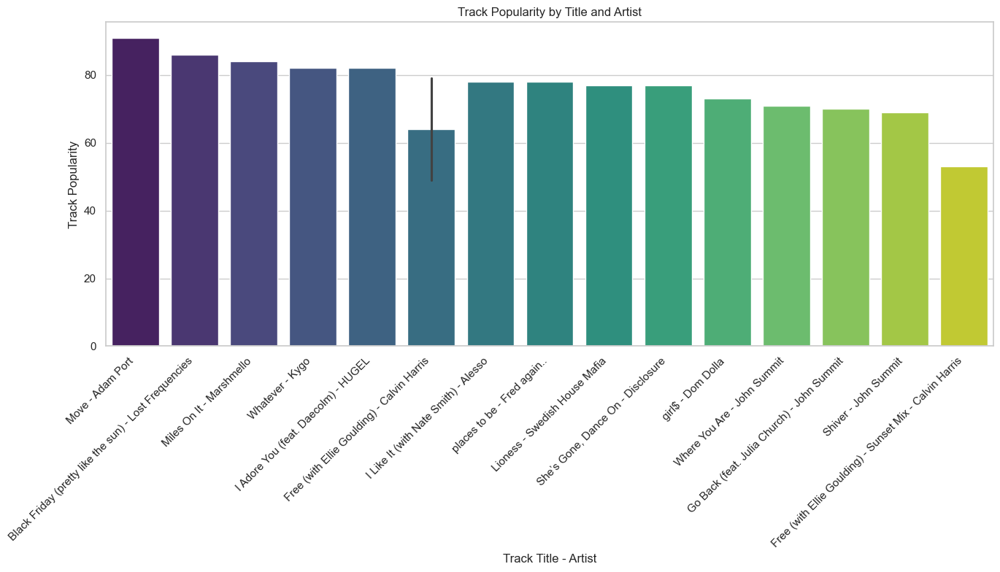

In [143]:
house_tracks_2024_cleaned['title_artist'] = house_tracks_2024_cleaned['title'] + ' - ' + house_tracks_2024_cleaned['artist']

plt.figure(figsize=(14, 8))
sns.barplot(x='title_artist', y='track_popularity', data=house_tracks_2024_cleaned, palette="viridis")

plt.xticks(rotation=45, ha='right')
plt.title('Track Popularity by Title and Artist')
plt.xlabel('Track Title - Artist')
plt.ylabel('Track Popularity')

plt.tight_layout()

plt.show()

### Above are the tracks sorted by track popularity 
#### Free by calvin harris is repeated which shows the diffrence of 2 track popularity values
#### Move - Adam Port is the highest rated track with a score of 91

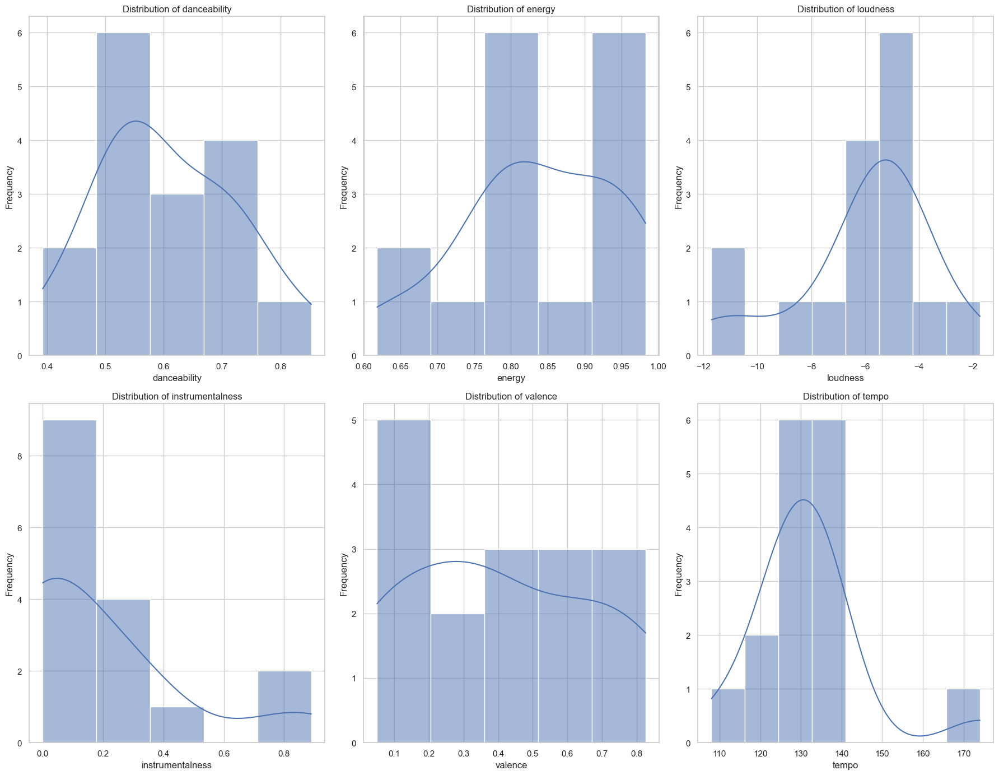

In [145]:
house_features = ['danceability', 'energy', 'loudness', 
                  'instrumentalness', 'valence', 'tempo']

fig, axes = plt.subplots(2, 3, figsize=(18, 14))


axes = axes.flatten()


for i, feature in enumerate(house_features):
    sns.histplot(house_tracks_2024_cleaned[feature], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')


plt.tight_layout()


plt.show()

### Danceability/Energy:
* The house tracks in this dataset generally have moderate to high danceability and energy, making them suitable for dance environments.
### Loudness:
* The tracks are typically loud but within a range that is comfortable for electronic music.
### Instrumentalness:
* Most tracks include vocal elements, as indicated by low instrumentalness.
### Valence:
* The mood (valence) of the tracks varies, but there is a noticeable preference for slightly somber or neutral tones.
### Tempo:
* The tempos are generally within the expected range for house music, with most tracks between 120 and 130 BPM.

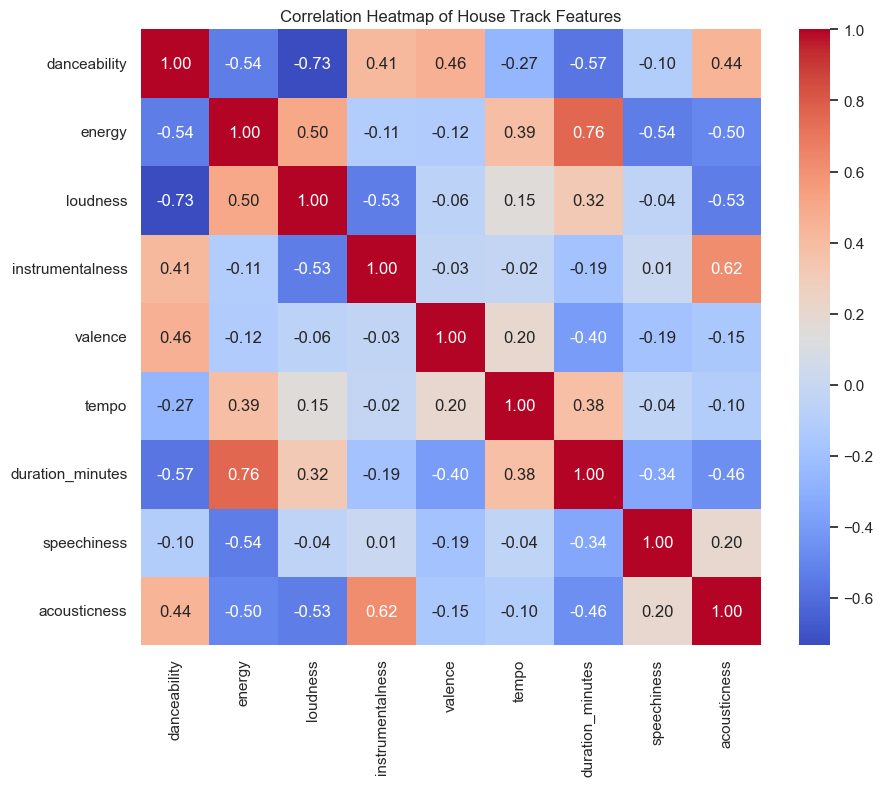

In [148]:
house_features = ['danceability', 'energy', 'loudness', 
                  'instrumentalness', 'valence', 'tempo',
                 'duration_minutes', 'speechiness', 'acousticness']

house_correlation_matrix = house_tracks_2024_cleaned[house_features].corr()

plt.figure(figsize=(10, 8))

sns.heatmap(house_correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)

plt.title('Correlation Heatmap of House Track Features')

plt.show()

### Energy and Duration:
* Strong positive correlation (0.76), indicating that house tracks with higher energy tend to have longer durations.
### Loudness and Danceability:
* Negative correlation (-0.73), suggesting that as loudness increases, danceability tends to decrease in house tracks.
### Instrumentalness and Acousticness:
* Strong positive correlation (0.62), meaning that more instrumental tracks are also likely to be more acoustic.
### Energy and Danceability:
* Moderate negative correlation (-0.54), implying that tracks with higher energy might be less danceable.
### Energy and Loudness:
* Positive correlation (0.50), indicating that louder tracks are generally perceived as more energetic.
### Duration and Loudness:
* Moderate positive correlation (0.32), suggesting that longer tracks tend to be louder.
### Speechiness and Energy:
* Negative correlation (-0.54), implying that house tracks with higher speech content tend to have lower energy.

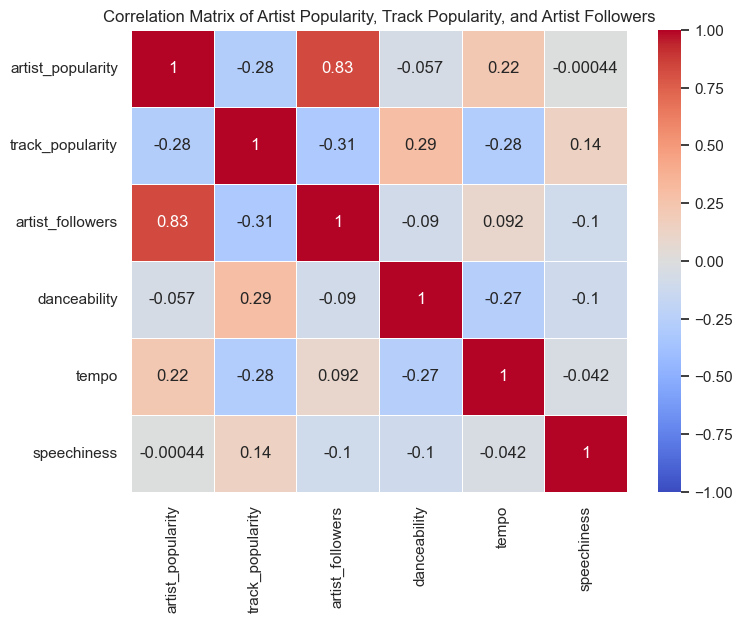

In [150]:
house_correlation_data = house_tracks_2024_cleaned[['artist_popularity', 'track_popularity', 'artist_followers', 'danceability', 'tempo', 'speechiness']]

correlation_matrix = house_correlation_data.corr()

plt.figure(figsize=(8, 6))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)

plt.title("Correlation Matrix of Artist Popularity, Track Popularity, and Artist Followers")

plt.show()

### Artist Popularity and Artist Followers:
* Very strong positive correlation (0.83), indicating that more popular artists tend to have a larger number of followers.
### Artist Popularity and Track Popularity:
* Negative correlation (-0.28), suggesting that more popular artists might not necessarily have higher track popularity.
### Track Popularity and Danceability:
* Moderate positive correlation (0.29), implying that tracks with higher danceability tend to be more popular.
### Artist Followers and Track Popularity:
* Moderate negative correlation (-0.31), which suggests that having more followers does not directly lead to more popular tracks.
### Artist Popularity and Tempo:
* Moderate positive correlation (0.22), meaning that artists with higher popularity tend to produce tracks with higher tempos.
### Track Popularity and Tempo:
* Moderate negative correlation (-0.28), indicating that faster tempo tracks might not be as popular.
### Speechiness and Popularity:
* Negligible correlations with both artist popularity (-0.00044) and track popularity (0.14), suggesting speechiness doesn’t have a strong impact on popularity.

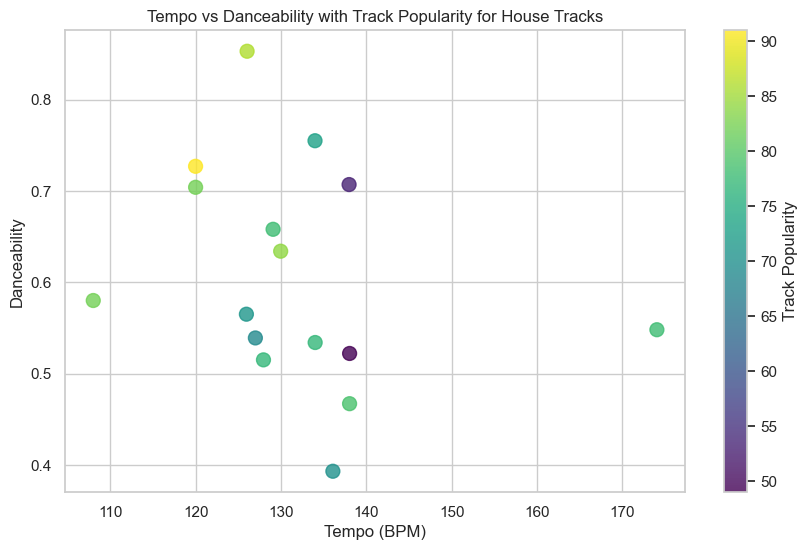

In [152]:
plt.figure(figsize=(10, 6))

plt.scatter(
    house_tracks_2024_cleaned['tempo'],
    house_tracks_2024_cleaned['danceability'],
    c=house_tracks_2024_cleaned['track_popularity'],
    cmap='viridis',  
    s=100,  
    alpha=0.8  
)

cbar = plt.colorbar()
cbar.set_label('Track Popularity')

plt.xlabel('Tempo (BPM)')
plt.ylabel('Danceability')
plt.title('Tempo vs Danceability with Track Popularity for House Tracks')

plt.show()

### BPM is clustered between 120 and 140 while danceabilty ranges from .4 and .8

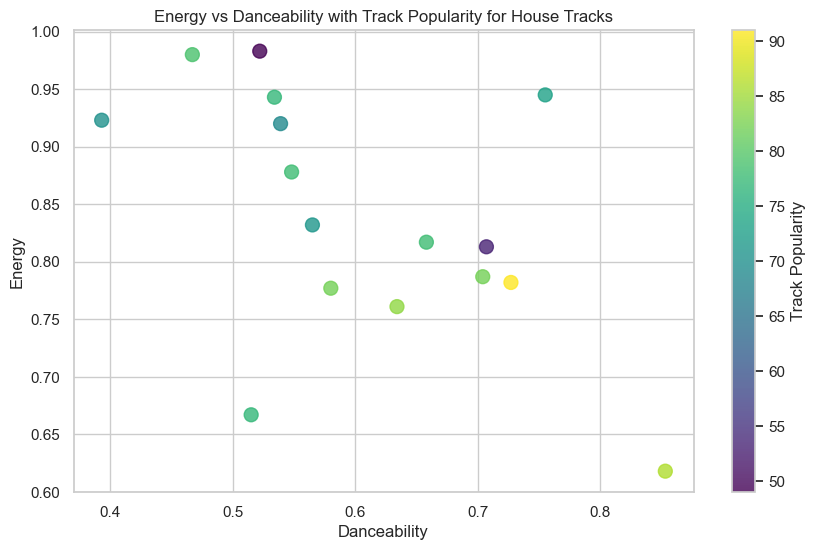

In [155]:
plt.figure(figsize=(10, 6))

plt.scatter(
    house_tracks_2024_cleaned['danceability'],
    house_tracks_2024_cleaned['energy'],
    c=house_tracks_2024_cleaned['track_popularity'],
    cmap='viridis',  
    s=100,  
    alpha=0.8  
)

cbar = plt.colorbar()
cbar.set_label('Track Popularity')

plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.title('Energy vs Danceability with Track Popularity for House Tracks')

plt.show()

#### Popularity above 75 shows tracks to be .6 and .8 danceability and energy between .75 and .85

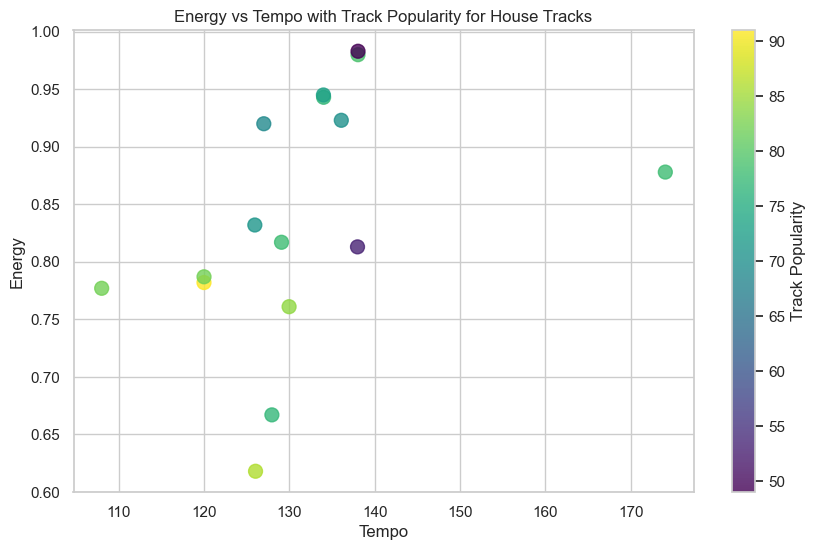

In [157]:
plt.figure(figsize=(10, 6))

plt.scatter(
    house_tracks_2024_cleaned['tempo'],
    house_tracks_2024_cleaned['energy'],
    c=house_tracks_2024_cleaned['track_popularity'],
    cmap='viridis',  
    s=100,  
    alpha=0.8  
)

cbar = plt.colorbar()
cbar.set_label('Track Popularity')

plt.xlabel('Tempo')
plt.ylabel('Energy')
plt.title('Energy vs Tempo with Track Popularity for House Tracks')

plt.show()

#### As energy increases, track popularity decreases
#### Above shows that popluarity in tracks is higher when energy is belowe .80 and between a tempo of 120 - 130
#### Tracks above .80 show popularity below .70

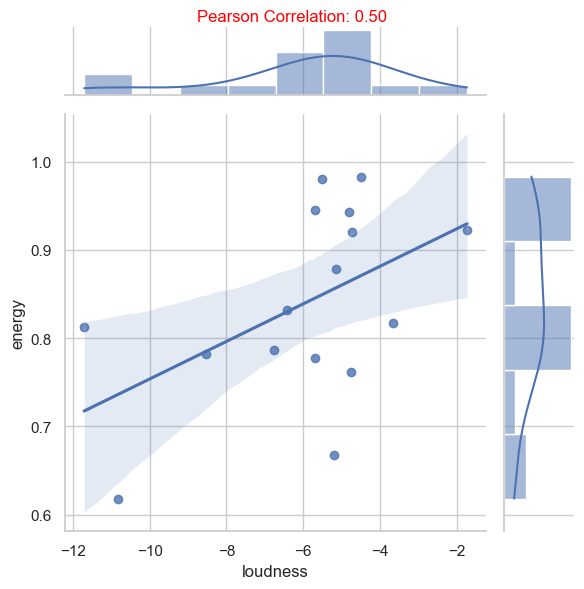

In [159]:
corr, _ = pearsonr(house_tracks_2024_cleaned['loudness'], house_tracks_2024_cleaned['energy'])

joint_plot = sns.jointplot(data=house_tracks_2024_cleaned, y='energy', x='loudness', kind='reg')

joint_plot.fig.suptitle(f'Pearson Correlation: {corr:.2f}', ha='center', fontsize=12, color='red')

joint_plot.fig.tight_layout()
joint_plot.fig.subplots_adjust(top=0.95) 

plt.show()

#### Positive Correlation (Pearson Correlation: 0.50):
* There is a moderate positive correlation between loudness and energy (0.50).
* This indicates that as loudness increases, energy also tends to increase, but the relationship is not perfect.
#### Data Distribution:
* The data points show a general upward trend, meaning tracks that are louder also tend to have higher energy.
* However, the scatter of the points suggests that there is variability, so loudness is not the sole determinant of energy.
* The histograms on the top and right sides show the distribution of the loudness and energy values.
* Loudness seems to be mostly concentrated around -6 to -2 dB, while energy is mostly concentrated around 0.8 to 1.0.
#### Confidence Interval:
* The shaded region around the regression line represents the confidence interval.
* It shows that while there is a clear positive trend, there is some uncertainty in predicting energy based on loudness alone.
### Tracks that are louder generally convey more energy, which is consistent with the perception that higher loudness levels contribute to a feeling of intensity or excitement in music.

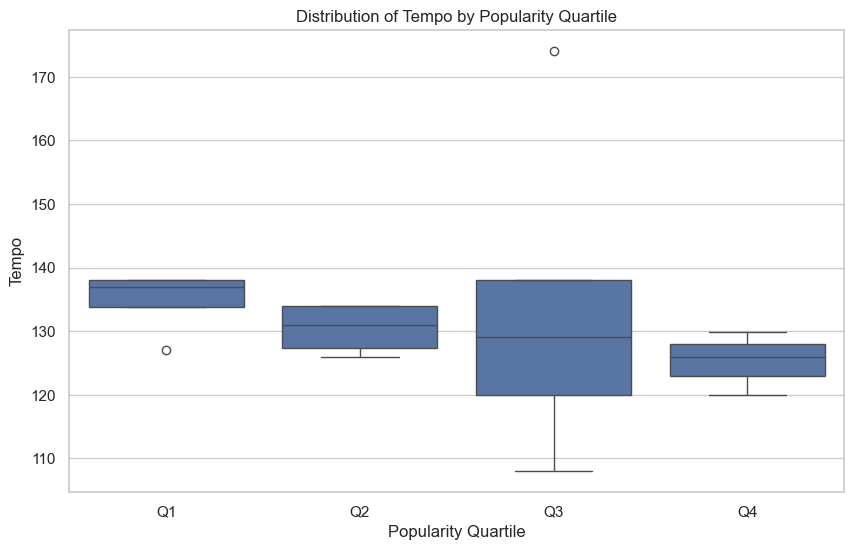

In [161]:
house_tracks_2024_cleaned['popularity_quartile'] = pd.qcut(house_tracks_2024_cleaned['track_popularity'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
plt.figure(figsize=(10, 6))
sns.boxplot(x='popularity_quartile', y='tempo', data=house_tracks_2024_cleaned)
plt.title('Distribution of Tempo by Popularity Quartile')
plt.xlabel('Popularity Quartile')
plt.ylabel('Tempo')
plt.show()

#### Q1 (Lowest Popularity):
* The tempo distribution in Q1 is relatively narrow, with most tracks having tempos around 138-140 BPM.
* There is one outlier with a tempo below 120 BPM.
#### Q2:
* Q2 shows a slightly lower tempo range compared to Q1, with most tracks clustering around 130 BPM.
* The tempo range in Q2 is more compact, indicating that these tracks have a more consistent tempo.
#### Q3:
* Q3 displays a wider range of tempos, from around 110 BPM to 160 BPM, indicating greater variability in tempo among these tracks.
* This quartile has the largest interquartile range (IQR), suggesting that tracks with mid-level popularity are spread across a wider range of tempos.
* There is a single high outlier around 170 BPM.
#### Q4 (Highest Popularity):
* Tracks in Q4, the highest popularity quartile, tend to have tempos between 125-135 BPM, with less variation compared to Q3.
* The median tempo for Q4 is around 130 BPM, which is slightly lower than in Q1.
#### General Insights:
* Q3 has the most diverse tempo range, which could indicate that tracks with mid-level popularity explore a wider variety of tempos compared to tracks with either very high or very low popularity.
* The most popular tracks (Q4) have a more consistent tempo range, potentially reflecting a more refined or mainstream appeal.
* The narrow range of tempos in Q2 and Q4 suggests that these popularity levels might favor tracks with specific tempo characteristics.
### Overall, this plot suggests that while highly popular tracks (Q4) tend to have a specific tempo range, mid-popularity tracks (Q3) experiment more with different tempos.

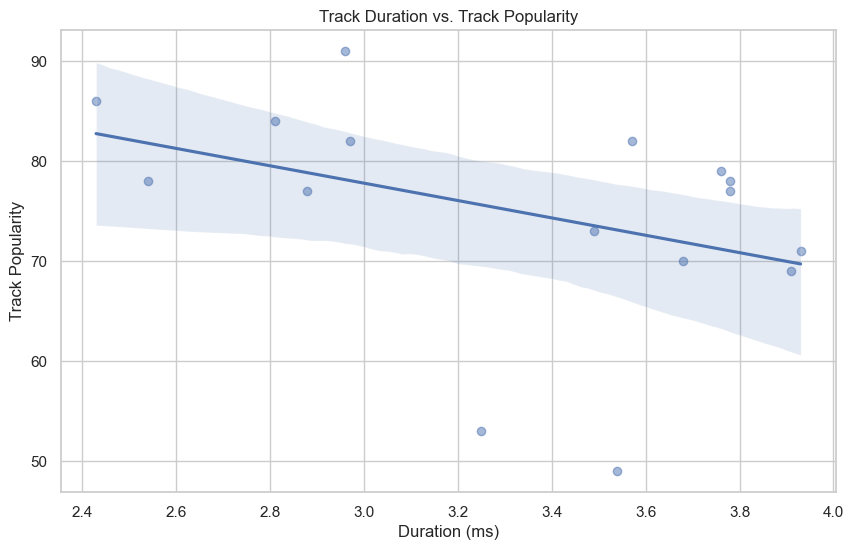

In [163]:
plt.figure(figsize=(10, 6))
sns.regplot(x='duration_minutes', y='track_popularity', data=house_tracks_2024_cleaned, scatter_kws={'alpha':0.5})
plt.title("Track Duration vs. Track Popularity")
plt.xlabel("Duration (ms)")
plt.ylabel("Track Popularity")
plt.show()

#### Negative Correlation: The plot indicates a negative correlation between track duration and track popularity. As the duration increases, the popularity tends to decrease.
#### Regression Line: The downward slope of the regression line reinforces the negative correlation, suggesting that shorter tracks might be slightly more popular.
#### Spread of Data: The points are somewhat spread out, and the confidence interval (shaded area) around the regression line is relatively wide, indicating that the correlation is not particularly strong or that there is variability in popularity that isn’t explained by duration alone.

### I will now analyze my 3 favorite tracks from the house dataframe 
* Adam Port - Move
* HUGEL - I Adore You
* Fred again.. - Places to be

In [165]:
house_tracks_2024_cleaned['artist'].unique()

array(['Adam Port', 'Lost Frequencies', 'Marshmello', 'Kygo', 'HUGEL',
       'Calvin Harris', 'Alesso', 'Fred again..', 'Swedish House Mafia',
       'Disclosure', 'Dom Dolla', 'John Summit'], dtype=object)

In [167]:
favorite_house_artists = ['HUGEL', 'Dom Dolla', 'Adam Port']
fav_tracks_house = house_tracks_2024_cleaned[house_tracks_2024_cleaned['artist'].isin(favorite_house_artists)]
fav_tracks_house

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,title_artist,popularity_quartile
229,2loEsOijJ6XiGzWYFXMIRk,Adam Port,77,187550,1BJJbSX6muJVF2AK7uH1x4,Move,2.96,['melodic house'],91,0.727,...,0.33600,0.225,0.655,119.992,audio_features,spotify:track:1BJJbSX6muJVF2AK7uH1x4,https://api.spotify.com/v1/tracks/1BJJbSX6muJV...,https://api.spotify.com/v1/audio-analysis/1BJJ...,Move - Adam Port,Q4
820,5PlfkPxwCpRRWQJBxCa0By,HUGEL,76,322780,5nPbKG04fhLkIAjcPFaZq7,I Adore You (feat. Daecolm),3.57,['deep house'],82,0.704,...,0.00538,0.159,0.310,119.996,audio_features,spotify:track:5nPbKG04fhLkIAjcPFaZq7,https://api.spotify.com/v1/tracks/5nPbKG04fhLk...,https://api.spotify.com/v1/audio-analysis/5nPb...,I Adore You (feat. Daecolm) - HUGEL,Q3
762,205i7E8fNVfojowcQSfK9m,Dom Dolla,70,441761,46N3FCKFABRjNoNBVq4osr,girl$,3.49,"['australian house', 'deep groove house', 'hou...",73,0.755,...,0.19500,0.862,0.797,133.987,audio_features,spotify:track:46N3FCKFABRjNoNBVq4osr,https://api.spotify.com/v1/tracks/46N3FCKFABRj...,https://api.spotify.com/v1/audio-analysis/46N3...,girl$ - Dom Dolla,Q2


In [169]:
fav_tracks_house.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,3.000000,3.000000,3.000000,3.0,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
mean,74.333333,317363.666667,3.340000,82.0,0.728667,0.838000,6.333333,-6.991667,0.333333,0.047167,0.025057,0.178793,0.415333,0.587333,124.658333
std,3.785939,127192.022668,0.331512,9.0,0.025541,0.092698,5.686241,1.432246,0.577350,0.005712,0.027058,0.165905,0.388230,0.250452,8.078863
min,70.000000,187550.000000,2.960000,73.0,0.704000,0.782000,0.000000,-8.529000,0.000000,0.042000,0.009260,0.005380,0.159000,0.310000,119.992000
25%,73.000000,255165.000000,3.225000,77.5,0.715500,0.784500,4.000000,-7.640000,0.000000,0.044100,0.009435,0.100190,0.192000,0.482500,119.994000
50%,76.000000,322780.000000,3.490000,82.0,0.727000,0.787000,8.000000,-6.751000,0.000000,0.046200,0.009610,0.195000,0.225000,0.655000,119.996000
75%,76.500000,382270.500000,3.530000,86.5,0.741000,0.866000,9.500000,-6.223000,0.500000,0.049750,0.032955,0.265500,0.543500,0.726000,126.991500
max,77.000000,441761.000000,3.570000,91.0,0.755000,0.945000,11.000000,-5.695000,1.000000,0.053300,0.056300,0.336000,0.862000,0.797000,133.987000


### Artist Popularity:
* The mean artist popularity is 74.33, indicating that these artists are fairly popular.
* There is a small variation in artist popularity (standard deviation of 3.79), suggesting that all three artists have relatively similar popularity levels.
* The artist with the lowest popularity has a score of 70, while the highest is 77.
### Artist Followers:
* The average number of followers is 317,364, with a significant variation (standard deviation of 127,192), indicating that while one artist has a notably larger following, others have relatively fewer.
* The maximum number of followers is 441,761, while the minimum is 187,550.
### Duration of Tracks:
* The average duration of tracks is around 3.34 minutes, which is typical for most popular songs.
* The range of track duration is from 2.96 minutes to 3.57 minutes, showing that the songs are relatively close in length.
### Track Popularity:
* The average track popularity is 82, which is high, indicating that these tracks are widely liked.
* Track popularity ranges from 73 to 91, showing that all three tracks are well received.
### Danceability:
* The average danceability is 0.73, suggesting that these tracks are generally quite suited for dancing.
* There's minimal variation (standard deviation of 0.025), indicating that all three tracks have a similar level of danceability.
### Energy:
* The energy level is quite high, with an average of 0.84, suggesting that these tracks are energetic and upbeat.
* The energy levels vary slightly, with a minimum of 0.78 and a maximum of 0.95.
### Tempo:
* The average tempo is 124.66 BPM, which falls within the typical range for energetic tracks.
* The tempo ranges from 119.99 to 133.99 BPM, showing moderate variation in the speed of the songs.
### Key and Mode:
* The average key is 6.33, with a large standard deviation (5.69), indicating the use of different musical keys across the tracks.
* The mode (whether the song is in a major or minor key) has an average of 0.33, indicating that some tracks are in major keys and others in minor.
### Speechiness, Acousticness, Instrumentalness:
* The speechiness average is low (0.047), meaning that these tracks don't have significant spoken word content.
* Acousticness is minimal (0.025 on average), indicating that these tracks are heavily produced and not acoustic.
* Instrumentalness is low (0.1787), meaning these tracks are likely to have vocals rather than being purely instrumental.
### Valence:
* The valence average is 0.59, which suggests a fairly positive and happy tone to the tracks.
* There is significant variation in valence, ranging from 0.31 to 0.79, showing different emotional tones in the tracks.
## Conclusion:
* These tracks are energetic, danceable, and popular, with slight differences in tempo and emotional tone (valence).
* The artists have varying levels of popularity and followers, but their tracks generally perform well in terms of popularity.

In [172]:
fav_tracks_house_reset = fav_tracks_house.reset_index(drop=True)

In [174]:
fav_tracks_house_reset

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,title_artist,popularity_quartile
0,2loEsOijJ6XiGzWYFXMIRk,Adam Port,77,187550,1BJJbSX6muJVF2AK7uH1x4,Move,2.96,['melodic house'],91,0.727,...,0.33600,0.225,0.655,119.992,audio_features,spotify:track:1BJJbSX6muJVF2AK7uH1x4,https://api.spotify.com/v1/tracks/1BJJbSX6muJV...,https://api.spotify.com/v1/audio-analysis/1BJJ...,Move - Adam Port,Q4
1,5PlfkPxwCpRRWQJBxCa0By,HUGEL,76,322780,5nPbKG04fhLkIAjcPFaZq7,I Adore You (feat. Daecolm),3.57,['deep house'],82,0.704,...,0.00538,0.159,0.310,119.996,audio_features,spotify:track:5nPbKG04fhLkIAjcPFaZq7,https://api.spotify.com/v1/tracks/5nPbKG04fhLk...,https://api.spotify.com/v1/audio-analysis/5nPb...,I Adore You (feat. Daecolm) - HUGEL,Q3
2,205i7E8fNVfojowcQSfK9m,Dom Dolla,70,441761,46N3FCKFABRjNoNBVq4osr,girl$,3.49,"['australian house', 'deep groove house', 'hou...",73,0.755,...,0.19500,0.862,0.797,133.987,audio_features,spotify:track:46N3FCKFABRjNoNBVq4osr,https://api.spotify.com/v1/tracks/46N3FCKFABRj...,https://api.spotify.com/v1/audio-analysis/46N3...,girl$ - Dom Dolla,Q2


In [176]:
fav_tracks_house_reset['danceability'].unique()

array([0.727, 0.704, 0.755])

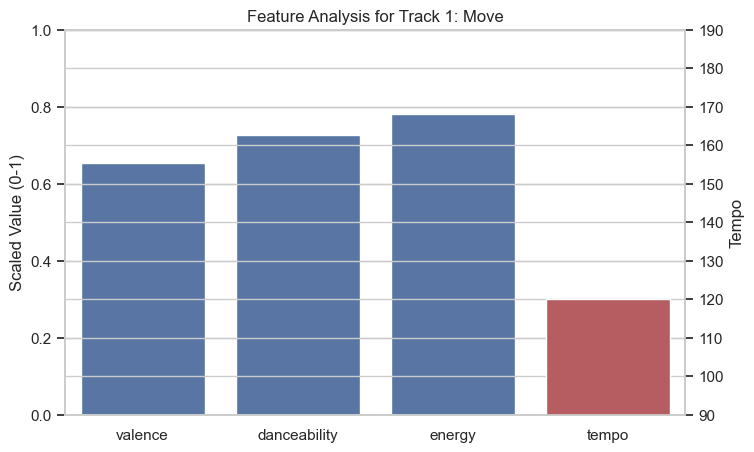

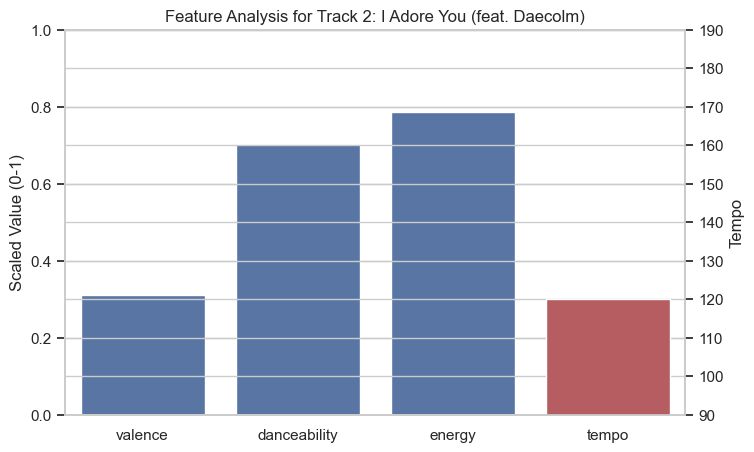

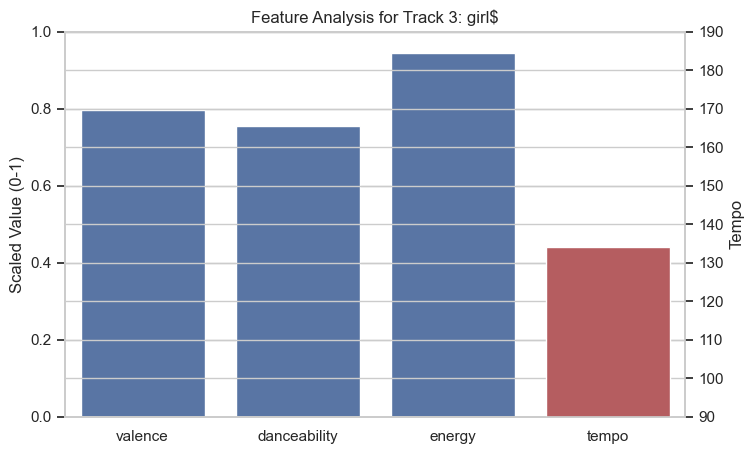

In [178]:
features = ['tempo', 'valence', 'danceability', 'energy']

min_tempo = 90
max_tempo = 190

for index, row in fav_tracks_house_reset.iterrows():
    # Create subplots for the bar plots
    fig, ax1 = plt.subplots(figsize=(8, 5))
    
    sns.barplot(x=features[1:], y=row[features[1:]].values, ax=ax1, color='b')
    ax1.set_ylabel('Scaled Value (0-1)')
    ax1.set_ylim(0, 1)

    ax2 = ax1.twinx()
    sns.barplot(x=['tempo'], y=[row['tempo']], ax=ax2, color='r')
    ax2.set_ylabel('Tempo')
    ax2.set_ylim(min_tempo, max_tempo)
    ax2.set_yticks(range(min_tempo, max_tempo + 10, 10)) 

    track_title = row['title']
    
    plt.title(f'Feature Analysis for Track {index + 1}: {track_title}')
    plt.show()

#### Track 1: “Move”

* Tempo: 119.992 BPM
* Danceability: Around 0.7
* Valence: 0.6
* Energy:.78

### This track has a moderate tempo, making it versatile and fitting for various environments, whether it’s a casual gathering or a relaxed dance setting. The balance between danceability and valence provides an uplifting yet mellow vibe.

#### Track 2: “I Adore You (feat. Daecolm)”

* Tempo: 119.996 BPM
* Danceability: Around 0.7
* Valence: 0.3
* Energy: .78

### With a similar moderate tempo, this track is also adaptable to different settings. However, the lower valence suggests a more introspective or emotionally nuanced atmosphere, ideal for moments that require a touch of depth and reflection.

#### Track 3: “girl$”

* Tempo: 133.98 BPM
* Energy: .94
* Danceability: .75
* Valence: 0.79

### This track’s faster tempo, high energy, and high valence make it perfect for high-energy situations, such as workouts or parties where an adrenaline boost is needed. Its strong, positive vibe encourages an active and lively environment.

#### Conclusion

#### Each track is suitable for different occasions:
* “Move” and “I Adore You” are versatile tracks that work well in various settings, with “Move” being more uplifting and “I Adore You” being more reflective.
* “girl$” is best for energetic and lively occasions, where high tempo and energy are needed to keep the atmosphere vibrant.

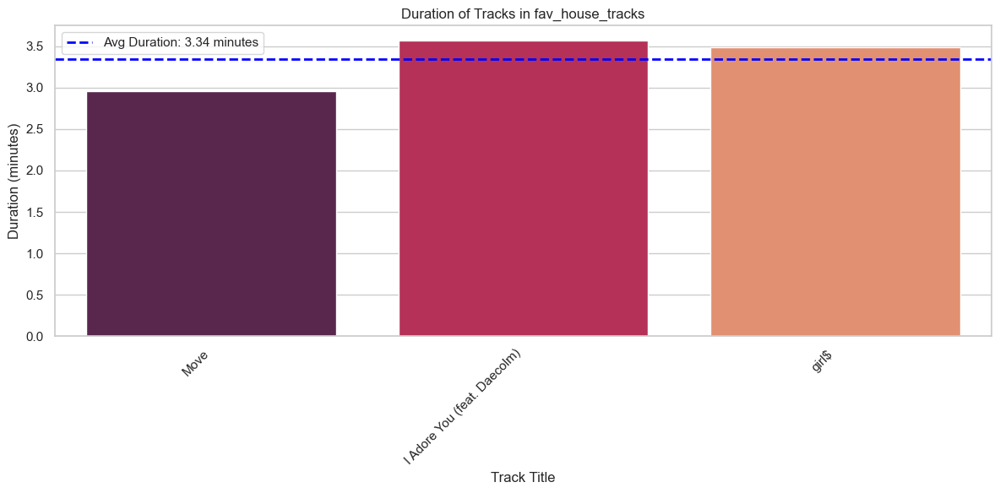

In [180]:
mean_duration = fav_tracks_house_reset['duration_minutes'].mean()

plt.figure(figsize=(12, 6))

sns.barplot(x='title', y='duration_minutes', data=fav_tracks_house_reset, palette='rocket')

plt.axhline(mean_duration, color='blue', linestyle='--', linewidth=2, label=f'Avg Duration: {mean_duration:.2f} minutes')

plt.xlabel('Track Title')
plt.ylabel('Duration (minutes)')
plt.title('Duration of Tracks in fav_house_tracks')
plt.xticks(rotation=45, ha='right')


plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

### Tracks range from 2.96 - 3.49 minutes 
#### Avg track duration is 3.34 minutes 

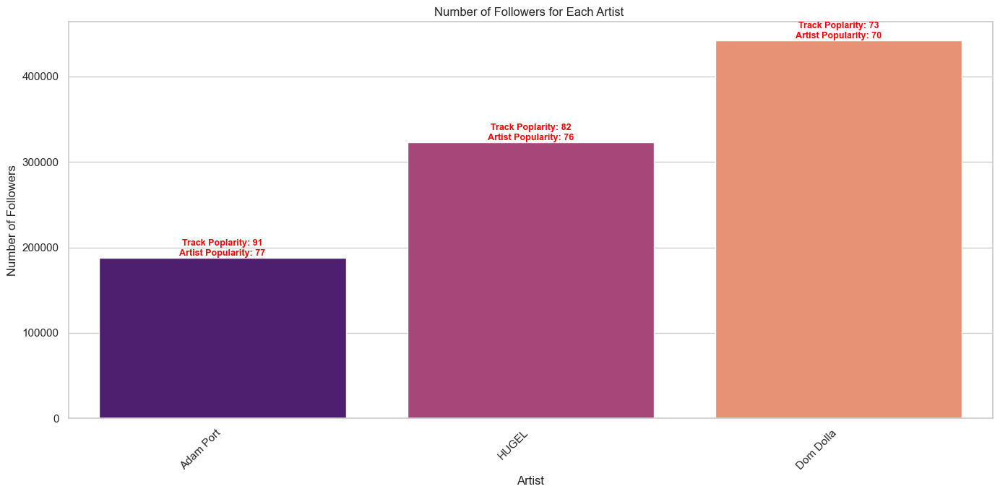

In [182]:
plt.figure(figsize=(14, 7))

barplot = sns.barplot(x='artist', y='artist_followers', data=fav_tracks_house_reset, palette='magma')

plt.xlabel('Artist')
plt.ylabel('Number of Followers')
plt.title('Number of Followers for Each Artist ')

plt.xticks(rotation=45, ha='right')

for index, row in fav_tracks_house_reset.iterrows():
    barplot.text(index, row['artist_followers'], 
                 f"Track Poplarity: {row['track_popularity']:.0f}\nArtist Popularity: {row['artist_popularity']:.0f}", 
                 ha="center", va="bottom", fontsize=9, color='red', fontweight='bold')

plt.tight_layout()
plt.show()

### Among the three artists, Adam Port has the fewest followers despite having the most popular track.
### Dom Dolla, with over double the followers of Adam Port, has an artist popularity score of 70, the lowest among the group.
### HUGEL falls in between, boasting over 300,000 followers and a track popularity of 82.
### Adam Port's success with a highly popular track despite fewer followers suggests that quality and impact can outweigh sheer numbers in the music industry.

# Summary of Insights from House Tracks dataframe:
## 1.	Danceability:
### •	Most tracks are highly danceable (0.6-0.8), aligning with popular trends.
### •	Danceable tracks tend to have moderate tempo and energy, contributing to their popularity.
## 2.	Energy:
### •	Energy levels vary, but most tracks have mid-to-high energy (0.4-0.8).
### •	Higher energy correlates with loudness, often making tracks more intense and impactful.
## 3.	Loudness:
### •	Tracks are mixed between -8 dB and -4 dB, with -6 dB being the peak.
### •	Louder tracks tend to be more energetic and popular.
## 4.	Speechiness, Acousticness, Instrumentalness, and Liveness:
### •	Tracks have low speechiness, acousticness, and instrumentalness, favoring vocal and electronic production.
### •	Most are studio-produced, with a few outliers exhibiting higher liveness (more live feel).
## 5.	Valence:
### •	Valence (positivity) is spread across tracks, showing emotional diversity that appeals to varying listener moods.
## 6.	Tempo and Popularity Analysis::
### •	House tracks are mostly clustered between 120 and 140 BPM.
### •	Q1 (Lowest Popularity): Narrow tempo range (138-140 BPM).
### •	Q4 (Highest Popularity): Tracks with the highest popularity have more consistent tempos, typically between 125-135 BPM.
### •   Q3 These tracks show the most variety in tempo (110-160 BPM), suggesting experimentation with different tempos occurs more in moderately popular house tracks.
## 7.	Popularity Correlations:
### •	Artist Popularity: Moderately correlated with followers (0.67) and track popularity (0.55), indicating larger fanbases often lead to more popular tracks.
### •	Track Popularity: Positively correlated with danceability (0.52) and loudness (0.41). 
### •   Tracks that are more danceable, louder, and electronic tend to be more popular.
### •   Popularity tends to drop as energy increases beyond 0.80, suggesting listeners may favor slightly less intense tracks.
### •   Tracks with higher popularity generally fall within the 120-130 BPM range, a sweet spot for danceability and energy.
### •	Valence: Tracks with higher valence are often more danceable, and tracks with mid-range valence and energy perform well.
## 8.	Genre Trends:
### •	Global genres like pop, reggaeton, and K-pop dominate, but niche genres like indie pop and abstract hip hop are also represented, showing growing audience diversity.

## Conclusion:
## In house music, tracks with moderate danceability, high energy, and mid-range tempos (120-130 BPM) tend to perform better in terms of popularity. 
## Louder, high-energy tracks may sacrifice danceability, and shorter tracks often see more success. Experimentation with tempo occurs mostly in mid-level popularity tracks, while highly popular tracks maintain a more consistent tempo range. 
## Popularity in house music appears to be influenced more by track-specific elements like tempo and energy than by the overall popularity of the artist.

In [185]:
fav_tracks_house_reset.to_csv('fav_tracks_house_3.csv', index=False)

# Moving on to Reggaeton

In [187]:
reggaeton_tracks_2024.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,19.000000,1.900000e+01,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,84.684211,1.382294e+07,3.438947,82.473684,0.784632,0.672263,5.473684,-5.283737,0.421053,0.077247,0.219832,0.000256,0.120563,0.624053,107.003053
std,6.245466,1.607779e+07,0.720670,6.818019,0.063983,0.126831,3.805966,1.952091,0.507257,0.043185,0.140206,0.000589,0.057776,0.200922,19.211937
min,71.000000,5.755140e+05,2.280000,71.000000,0.674000,0.442000,0.000000,-8.990000,0.000000,0.036500,0.028600,0.000000,0.062600,0.250000,92.940000
25%,82.000000,1.678548e+06,3.045000,77.000000,0.725000,0.589000,2.000000,-6.302000,0.000000,0.048200,0.088700,0.000000,0.081100,0.505500,99.494000
50%,84.000000,8.046120e+06,3.220000,83.000000,0.789000,0.681000,6.000000,-5.017000,0.000000,0.063400,0.266000,0.000024,0.107000,0.648000,100.021000
75%,89.000000,1.638146e+07,3.790000,86.500000,0.819000,0.731000,8.000000,-4.417000,1.000000,0.076900,0.321000,0.000189,0.127000,0.774500,104.509500
max,92.000000,5.030322e+07,5.150000,96.000000,0.924000,0.890000,11.000000,-1.502000,1.000000,0.183000,0.446000,0.002490,0.289000,0.905000,175.956000


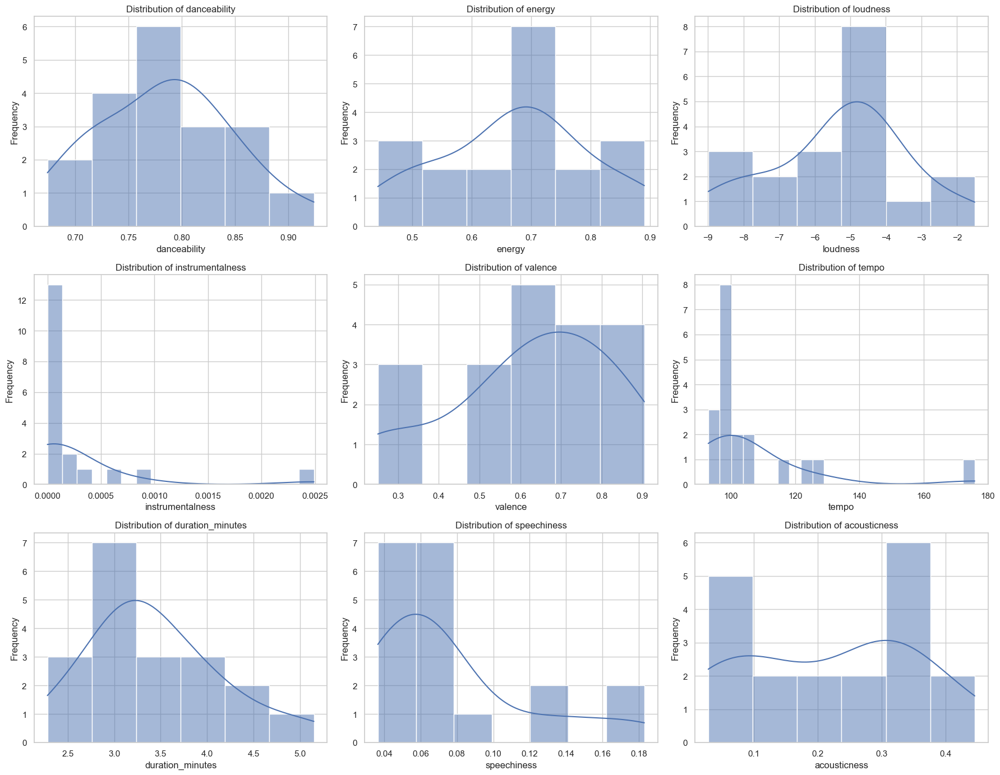

In [189]:
fig, axes = plt.subplots(3, 3, figsize=(18, 14))

axes = axes.flatten()

for i, feature in enumerate(house_features):
    sns.histplot(reggaeton_tracks_2024[feature], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()

plt.show()

### Artist Popularity and Followers:
#### Artist Popularity:

* The average artist popularity is quite high at 84.1, indicating that these are well-known artists.
* The popularity ranges from 71 to 91, showing some variation but all within a relatively high popularity range.
#### Artist Followers:

* The average number of followers is around 13.5 million, but there's significant variability as seen by the high standard deviation (15.9 million). This suggests a mix of both very popular and less-followed artists.
* The minimum number of followers is about 559,175, and the maximum is 49.5 million, indicating that while some artists are extremely popular, others are relatively less so.
### Track Features:
#### Duration:

* The average duration of the tracks is approximately 3.44 minutes, which aligns well with the typical length of reggaeton songs.
* The shortest track is 2.28 minutes, and the longest is 5.15 minutes, suggesting variability in track length.
#### Track Popularity:

* Track popularity is high on average at 82.5, with a range from 71 to 96. This indicates that the tracks are generally well-received.
#### Danceability:

* With an average danceability of 0.785, these tracks are highly danceable, which is characteristic of reggaeton.
* The range is from 0.674 to 0.924, showing that all tracks have a strong danceable rhythm.
#### Energy:

* The energy level is moderate to high, with a mean of 0.672. Reggaeton tracks are known for their energetic beats, and this dataset supports that with a range from 0.442 to 0.89.
#### Valence:

* The mean valence is 0.624, suggesting that most tracks have a generally positive or happy mood, though the range varies from 0.25 to 0.905, indicating some tracks might have a more melancholic or aggressive tone.
#### Tempo:

* The tempo of these tracks varies significantly, from 92.94 BPM to 175.96 BPM. This wide range suggests a mix of both slower and faster-paced reggaeton songs, though the mean tempo is around 107 BPM, which is typical * for the genre.
### Acoustic and Instrumental Features:
#### Loudness:

* The tracks are relatively loud on average at -5.28 dB, which is typical for popular music aiming to stand out.
#### Acousticness:

* Low acousticness values (average of 0.22) suggest that these tracks rely heavily on electronic production rather than acoustic elements.
#### Instrumentalness:

* Instrumentalness is near zero, indicating that these tracks are predominantly vocal.
#### Speechiness:

* The speechiness average is 0.077, which is consistent with reggaeton's characteristic mix of singing and rapping.

In [191]:
reggaeton_tracks_2024.sort_values(by=['track_popularity'], ascending=False)

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
29,790FomKkXshlbRYZFtlgla,KAROL G,92,50303215,6WatFBLVB0x077xWeoVc2k,Si Antes Te Hubiera Conocido,3.26,"['reggaeton', 'reggaeton colombiano', 'urbano ...",96,0.924,...,0.0469,0.4460,0.000594,0.0678,0.787,128.027,audio_features,spotify:track:6WatFBLVB0x077xWeoVc2k,https://api.spotify.com/v1/tracks/6WatFBLVB0x0...,https://api.spotify.com/v1/audio-analysis/6Wat...
46,7CvTknweLr9feJtRGrpDBy,FloyyMenor,83,858296,6XjDF6nds4DE2BBbagZol6,Gata Only,3.70,['reggaeton chileno'],94,0.791,...,0.0509,0.4460,0.000024,0.0899,0.669,99.986,audio_features,spotify:track:6XjDF6nds4DE2BBbagZol6,https://api.spotify.com/v1/tracks/6XjDF6nds4DE...,https://api.spotify.com/v1/audio-analysis/6XjD...
266,2LRoIwlKmHjgvigdNGBHNo,Feid,92,13731153,63pLfjK6FvcYJYMGwtHjd6,SORRY 4 THAT MUCH,3.46,"['colombian pop', 'pop reggaeton', 'reggaeton'...",88,0.819,...,0.0727,0.0318,0.000000,0.2890,0.602,92.990,audio_features,spotify:track:63pLfjK6FvcYJYMGwtHjd6,https://api.spotify.com/v1/tracks/63pLfjK6FvcY...,https://api.spotify.com/v1/audio-analysis/63pL...
286,1TA5sGRlKUJXBN4ZyJuDIX,Blessd,81,4868804,2btNsI4OvcVl7SAHQQDHFB,Mirame,2.62,"['reggaeton', 'urbano latino']",88,0.717,...,0.0797,0.1410,0.000030,0.0661,0.695,175.956,audio_features,spotify:track:2btNsI4OvcVl7SAHQQDHFB,https://api.spotify.com/v1/tracks/2btNsI4OvcVl...,https://api.spotify.com/v1/audio-analysis/2btN...
237,7iK8PXO48WeuP03g8YR51W,Myke Towers,89,16381462,0LZy30mVmxqUpdQmaXKXBd,ADIVINO,4.64,"['reggaeton', 'trap latino', 'urbano latino']",87,0.786,...,0.0741,0.1690,0.000024,0.1060,0.522,117.994,audio_features,spotify:track:0LZy30mVmxqUpdQmaXKXBd,https://api.spotify.com/v1/tracks/0LZy30mVmxqU...,https://api.spotify.com/v1/audio-analysis/0LZy...
350,1fctva4kpRbg2k3v7kwRuS,Rvssian,76,2498799,5bi0gh89wRuH2OgjdAKFsb,Santa,3.22,"['reggaeton', 'reggaeton flow', 'trap latino',...",86,0.725,...,0.1290,0.3210,0.000189,0.1140,0.648,99.993,audio_features,spotify:track:5bi0gh89wRuH2OgjdAKFsb,https://api.spotify.com/v1/tracks/5bi0gh89wRuH...,https://api.spotify.com/v1/audio-analysis/5bi0...
613,2NfSBtmWe7oPw1EmetJVso,Boza,71,575514,5pVJ3IlnpIorU44oXizzG5,Orion,4.02,"['panamanian pop', 'reggaeton', 'urbano latino']",85,0.857,...,0.1830,0.3220,0.002490,0.1970,0.874,105.011,audio_features,spotify:track:5pVJ3IlnpIorU44oXizzG5,https://api.spotify.com/v1/tracks/5pVJ3IlnpIor...,https://api.spotify.com/v1/audio-analysis/5pVJ...
506,7CvTknweLr9feJtRGrpDBy,FloyyMenor,83,858296,4yyCGGdTVaYG17vhsrUPoL,APAGA EL CEL,3.08,['reggaeton chileno'],85,0.696,...,0.0365,0.2730,0.000397,0.0626,0.476,100.025,audio_features,spotify:track:4yyCGGdTVaYG17vhsrUPoL,https://api.spotify.com/v1/tracks/4yyCGGdTVaYG...,https://api.spotify.com/v1/audio-analysis/4yyC...
546,1fctva4kpRbg2k3v7kwRuS,Rvssian,76,2498799,6a9Z1jUms915w4O7N1PxjY,Santa,3.22,"['reggaeton', 'reggaeton flow', 'trap latino',...",84,0.725,...,0.1290,0.3210,0.000189,0.1140,0.648,99.993,audio_features,spotify:track:6a9Z1jUms915w4O7N1PxjY,https://api.spotify.com/v1/tracks/6a9Z1jUms915...,https://api.spotify.com/v1/audio-analysis/6a9Z...
419,2LRoIwlKmHjgvigdNGBHNo,Feid,92,13731153,0rNqDh9zWWJVTLS4VfceHP,Brickell,3.01,"['colombian pop', 'pop reggaeton', 'reggaeton'...",83,0.805,...,0.0634,0.0704,0.000000,0.1210,0.489,93.037,audio_features,spotify:track:0rNqDh9zWWJVTLS4VfceHP,https://api.spotify.com/v1/tracks/0rNqDh9zWWJV...,https://api.spotify.com/v1/audio-analysis/0rNq...


### Santa is shown twice, I will delete the second entry and also reset the index

In [194]:
reggaeton_tracks_2024 = reggaeton_tracks_2024.loc[reggaeton_tracks_2024['track_id'] != '6a9Z1jUms915w4O7N1PxjY']

reggaeton_tracks_2024 = reggaeton_tracks_2024.reset_index(drop=True)

reggaeton_tracks_2024.head()

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
0,790FomKkXshlbRYZFtlgla,KAROL G,92,50303215,6WatFBLVB0x077xWeoVc2k,Si Antes Te Hubiera Conocido,3.26,"['reggaeton', 'reggaeton colombiano', 'urbano ...",96,0.924,...,0.0469,0.4460,0.000594,0.0678,0.787,128.027,audio_features,spotify:track:6WatFBLVB0x077xWeoVc2k,https://api.spotify.com/v1/tracks/6WatFBLVB0x0...,https://api.spotify.com/v1/audio-analysis/6Wat...
1,7CvTknweLr9feJtRGrpDBy,FloyyMenor,83,858296,6XjDF6nds4DE2BBbagZol6,Gata Only,3.70,['reggaeton chileno'],94,0.791,...,0.0509,0.4460,0.000024,0.0899,0.669,99.986,audio_features,spotify:track:6XjDF6nds4DE2BBbagZol6,https://api.spotify.com/v1/tracks/6XjDF6nds4DE...,https://api.spotify.com/v1/audio-analysis/6XjD...
2,7iK8PXO48WeuP03g8YR51W,Myke Towers,89,16381462,0LZy30mVmxqUpdQmaXKXBd,ADIVINO,4.64,"['reggaeton', 'trap latino', 'urbano latino']",87,0.786,...,0.0741,0.1690,0.000024,0.1060,0.522,117.994,audio_features,spotify:track:0LZy30mVmxqUpdQmaXKXBd,https://api.spotify.com/v1/tracks/0LZy30mVmxqU...,https://api.spotify.com/v1/audio-analysis/0LZy...
3,2LRoIwlKmHjgvigdNGBHNo,Feid,92,13731153,63pLfjK6FvcYJYMGwtHjd6,SORRY 4 THAT MUCH,3.46,"['colombian pop', 'pop reggaeton', 'reggaeton'...",88,0.819,...,0.0727,0.0318,0.000000,0.2890,0.602,92.990,audio_features,spotify:track:63pLfjK6FvcYJYMGwtHjd6,https://api.spotify.com/v1/tracks/63pLfjK6FvcY...,https://api.spotify.com/v1/audio-analysis/63pL...
4,1TA5sGRlKUJXBN4ZyJuDIX,Blessd,81,4868804,2btNsI4OvcVl7SAHQQDHFB,Mirame,2.62,"['reggaeton', 'urbano latino']",88,0.717,...,0.0797,0.1410,0.000030,0.0661,0.695,175.956,audio_features,spotify:track:2btNsI4OvcVl7SAHQQDHFB,https://api.spotify.com/v1/tracks/2btNsI4OvcVl...,https://api.spotify.com/v1/audio-analysis/2btN...


In [196]:
reggaeton_tracks_2024.groupby('artist')['title'].size().sort_values(ascending=False)

artist
FloyyMenor        4
Myke Towers       3
Feid              2
KAROL G           2
Blessd            1
Boza              1
J Balvin          1
JHAYCO            1
Rauw Alejandro    1
Rvssian           1
Ryan Castro       1
Name: title, dtype: int64

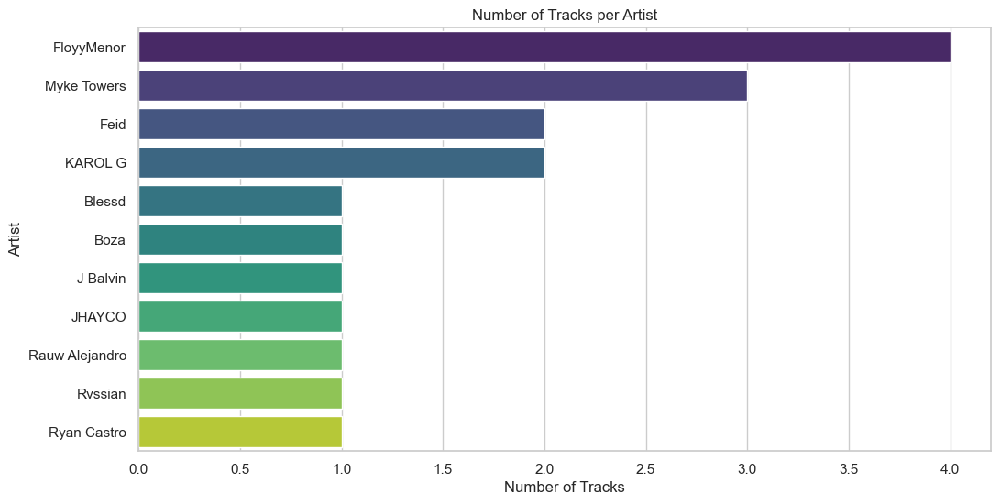

In [198]:
artist_track_counts_reggaeton = reggaeton_tracks_2024.groupby('artist')['title'].size().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=artist_track_counts_reggaeton.values, y=artist_track_counts_reggaeton.index, palette='viridis')

plt.title('Number of Tracks per Artist')
plt.xlabel('Number of Tracks')
plt.ylabel('Artist')

plt.show()

### FLoyyMenor, chilean breakthrough artist, has climbed possitioned himself  as the mostr listened to chilean song in history and the first chilean artist 
### to have a song in the number 1 billboard hot latin for more than 13 consecutive weeks
### With 4 song entries, 1 being his number hit single Gata Only, and Gata Only Remix, followed by two other songs from his newly released album
### FLoyyMenor is enjoying his success at the top with his album reaching 1.2 billion streams on Spotify
### Myke Towers shows 3 tracks that made the dataframe, unlike FloyyMenor, Myke Towers is a regggaeton veteran having colabs with all of the top artist in the genre
### Feid and Karol G also have 2 entries that made the dataframe, both Colombian reggaeton stars with many hot billboard tracks under their belt

In [200]:
artist_country_map = {
    'FloyyMenor': 'Chile',
    'Myke Towers': 'Puerto Rico',
    'Rauw Alejandro': 'Puerto Rico',
    'JHAYCO': 'Puerto Rico',
    'Feid': 'Colombia',
    'KAROL G': 'Colombia',
    'Blessd': 'Colombia',
    'J Balvin': 'Colombia',
    'Ryan Castro': 'Colombia',
    'Boza': 'Panama',
    'Rvssian': 'Jamaica'
}

def map_country(artist):
    artist_list = artist.split(', ')
    countries = {artist_country_map.get(a, 'Unknown') for a in artist_list}
    return ', '.join(countries)

reggaeton_tracks_2024['Country'] = reggaeton_tracks_2024['artist'].apply(map_country)

reggaeton_tracks_2024.head()

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,Country
0,790FomKkXshlbRYZFtlgla,KAROL G,92,50303215,6WatFBLVB0x077xWeoVc2k,Si Antes Te Hubiera Conocido,3.26,"['reggaeton', 'reggaeton colombiano', 'urbano ...",96,0.924,...,0.4460,0.000594,0.0678,0.787,128.027,audio_features,spotify:track:6WatFBLVB0x077xWeoVc2k,https://api.spotify.com/v1/tracks/6WatFBLVB0x0...,https://api.spotify.com/v1/audio-analysis/6Wat...,Colombia
1,7CvTknweLr9feJtRGrpDBy,FloyyMenor,83,858296,6XjDF6nds4DE2BBbagZol6,Gata Only,3.70,['reggaeton chileno'],94,0.791,...,0.4460,0.000024,0.0899,0.669,99.986,audio_features,spotify:track:6XjDF6nds4DE2BBbagZol6,https://api.spotify.com/v1/tracks/6XjDF6nds4DE...,https://api.spotify.com/v1/audio-analysis/6XjD...,Chile
2,7iK8PXO48WeuP03g8YR51W,Myke Towers,89,16381462,0LZy30mVmxqUpdQmaXKXBd,ADIVINO,4.64,"['reggaeton', 'trap latino', 'urbano latino']",87,0.786,...,0.1690,0.000024,0.1060,0.522,117.994,audio_features,spotify:track:0LZy30mVmxqUpdQmaXKXBd,https://api.spotify.com/v1/tracks/0LZy30mVmxqU...,https://api.spotify.com/v1/audio-analysis/0LZy...,Puerto Rico
3,2LRoIwlKmHjgvigdNGBHNo,Feid,92,13731153,63pLfjK6FvcYJYMGwtHjd6,SORRY 4 THAT MUCH,3.46,"['colombian pop', 'pop reggaeton', 'reggaeton'...",88,0.819,...,0.0318,0.000000,0.2890,0.602,92.990,audio_features,spotify:track:63pLfjK6FvcYJYMGwtHjd6,https://api.spotify.com/v1/tracks/63pLfjK6FvcY...,https://api.spotify.com/v1/audio-analysis/63pL...,Colombia
4,1TA5sGRlKUJXBN4ZyJuDIX,Blessd,81,4868804,2btNsI4OvcVl7SAHQQDHFB,Mirame,2.62,"['reggaeton', 'urbano latino']",88,0.717,...,0.1410,0.000030,0.0661,0.695,175.956,audio_features,spotify:track:2btNsI4OvcVl7SAHQQDHFB,https://api.spotify.com/v1/tracks/2btNsI4OvcVl...,https://api.spotify.com/v1/audio-analysis/2btN...,Colombia


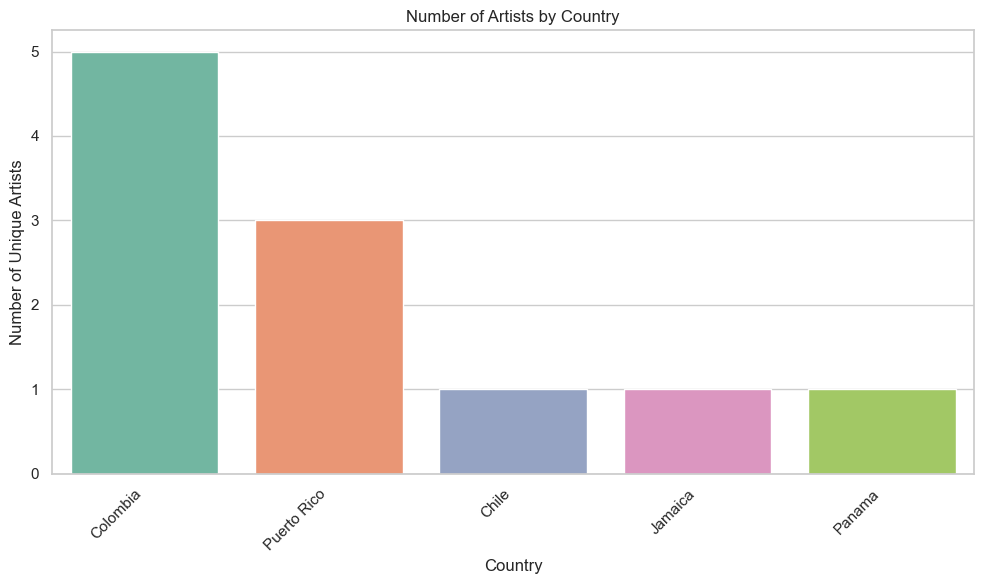

In [202]:
unique_artists = reggaeton_tracks_2024[['artist', 'Country']].drop_duplicates()

country_artist_counts = unique_artists['Country'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=country_artist_counts.index, y=country_artist_counts.values, palette='Set2')

plt.xlabel('Country')
plt.ylabel('Number of Unique Artists')
plt.title('Number of Artists by Country')


plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Colombia holds the lead with the most artist in the top reggaton tracks with 5 artist 
### second place is Puerto Rico with 3

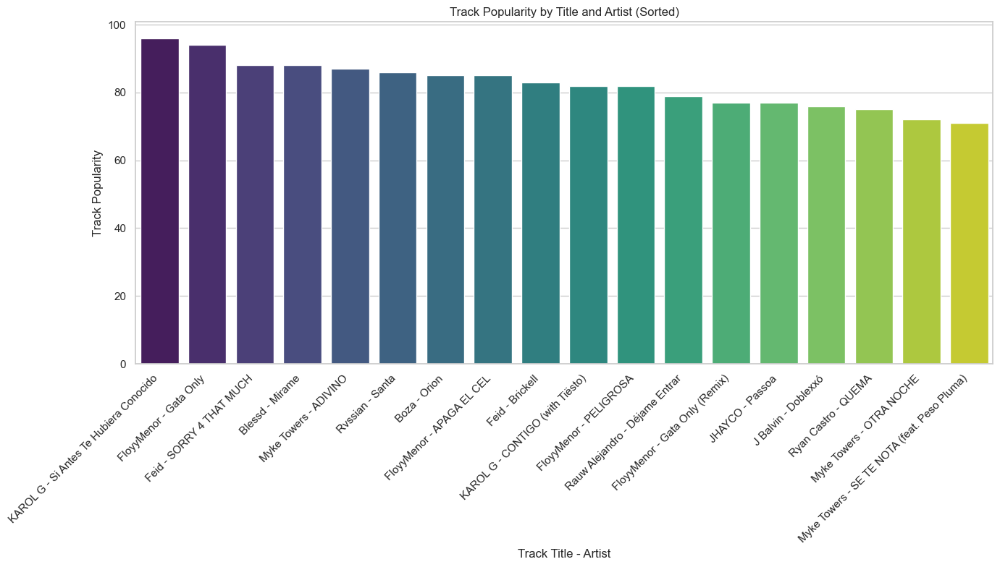

In [211]:
reggaeton_tracks_2024['title_artist'] = reggaeton_tracks_2024['artist'] + ' - ' + reggaeton_tracks_2024['title']

reggaeton_tracks_2024_sorted = reggaeton_tracks_2024.sort_values('track_popularity', ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(x='title_artist', y='track_popularity', data=reggaeton_tracks_2024_sorted, palette="viridis")
plt.xticks(rotation=45, ha='right')
plt.title('Track Popularity by Title and Artist (Sorted)')
plt.xlabel('Track Title - Artist')
plt.ylabel('Track Popularity')

plt.tight_layout()

#### KAROL G holds the number 1 spot with 'Si Antes Te Hubiera Conocido' with a track popularity of 96
#### FLoyyMenor has second place with 'Gata Only' with a track popularity of 94
#### 3rd place is tied with Feid and Blessd with 'SORRY 4 THAT MUCH' and 'Mirame' with a track popularity of 88

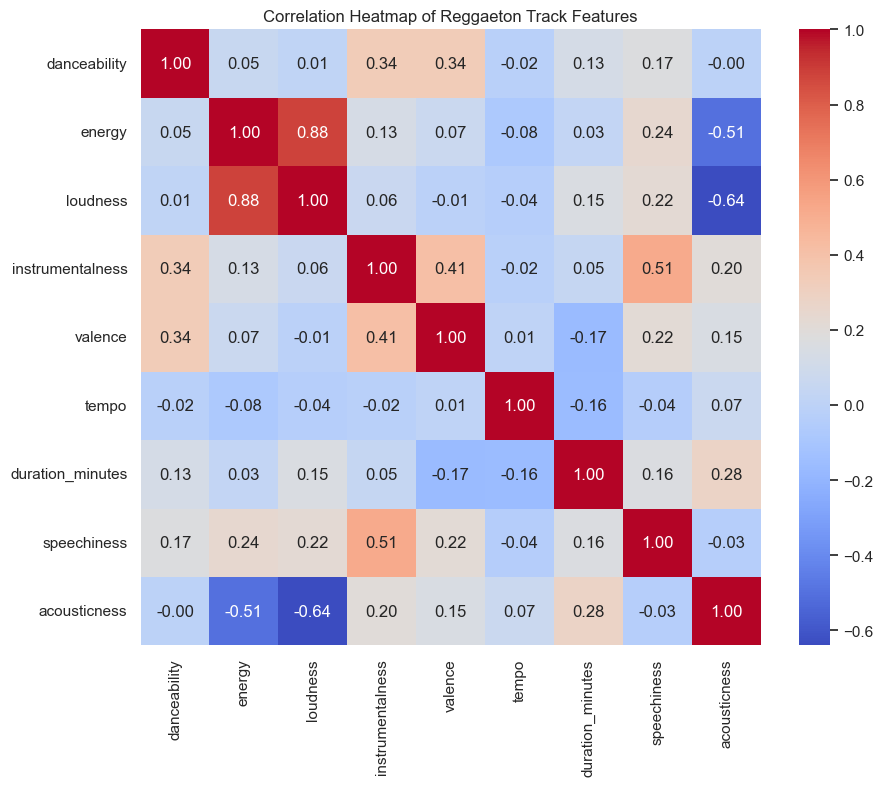

In [213]:
house_features = ['danceability', 'energy', 'loudness', 
                  'instrumentalness', 'valence', 'tempo',
                 'duration_minutes', 'speechiness', 'acousticness']

reggaeton_tracks_2024_correlation = reggaeton_tracks_2024[house_features].corr()

# Set up the figure and axis
plt.figure(figsize=(10, 8))

# Create a heatmap using seaborn
sns.heatmap(reggaeton_tracks_2024_correlation, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)

# Set the title for the heatmap
plt.title('Correlation Heatmap of Reggaeton Track Features')

# Display the heatmap
plt.show()

### Not that many strong possitive correlations
### Energy and Loudness: There is a very strong positive correlation (0.88) between energy and loudness, which makes sense as louder songs tend to feel more energetic.

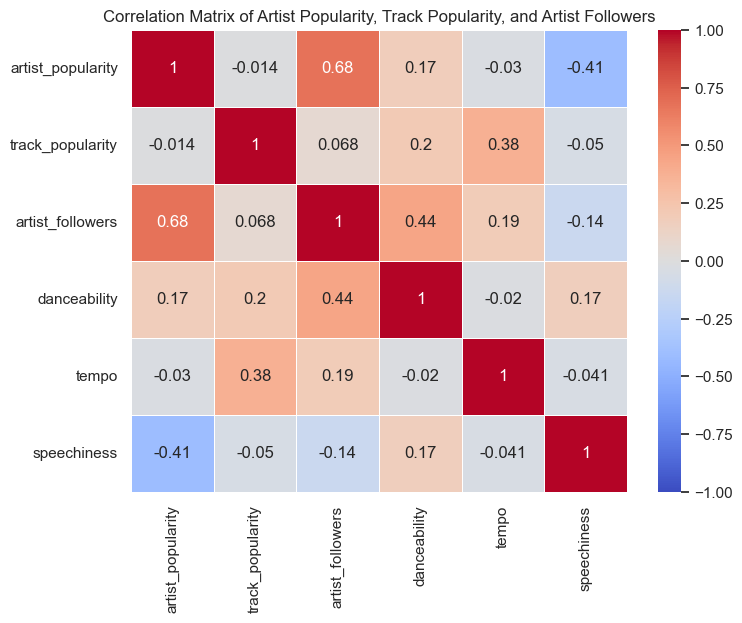

In [215]:
reggaeton_correlation_data = reggaeton_tracks_2024[['artist_popularity', 'track_popularity', 'artist_followers', 'danceability', 'tempo', 'speechiness']]

correlation_matrix_reggaeton = reggaeton_correlation_data.corr()

plt.figure(figsize=(8, 6))

sns.heatmap(correlation_matrix_reggaeton, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)

plt.title("Correlation Matrix of Artist Popularity, Track Popularity, and Artist Followers")

plt.show()

#### Artist Popularity and Artist Followers: 
* There is a strong positive correlation (0.68) between artist popularity and artist followers.
* This suggests that more popular artists tend to have larger followings, which aligns with expectations.
#### Track Popularity and Tempo: 
* There is a moderate positive correlation (0.38) between track popularity and tempo. *
* This indicates that tracks with a higher tempo tend to be more popular, which could imply that faster-paced songs are more favorable among listeners.
#### Artist Followers and Danceability: 
* There is a moderate positive correlation (0.44) between artist followers and danceability, suggesting that artists with more followers tend to produce more danceable tracks.

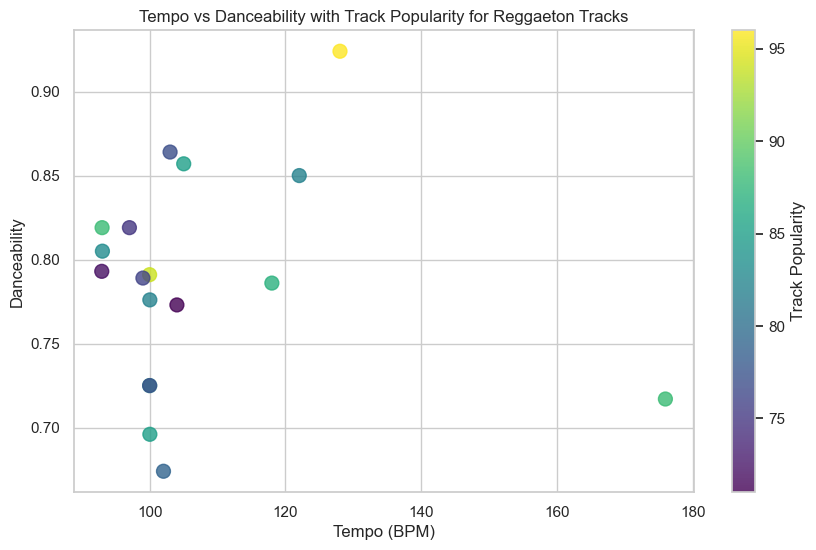

In [217]:
plt.figure(figsize=(10, 6))

plt.scatter(
    reggaeton_tracks_2024['tempo'],
    reggaeton_tracks_2024['danceability'],
    c=reggaeton_tracks_2024['track_popularity'],
    cmap='viridis',  
    s=100,  
    alpha=0.8  
)

cbar = plt.colorbar()
cbar.set_label('Track Popularity')

plt.xlabel('Tempo (BPM)')
plt.ylabel('Danceability')
plt.title('Tempo vs Danceability with Track Popularity for Reggaeton Tracks')

plt.show()

#### Most tracks are found between 90 and 130 tempo
#### the most popular song has a tempo of 128 and danceability of .9

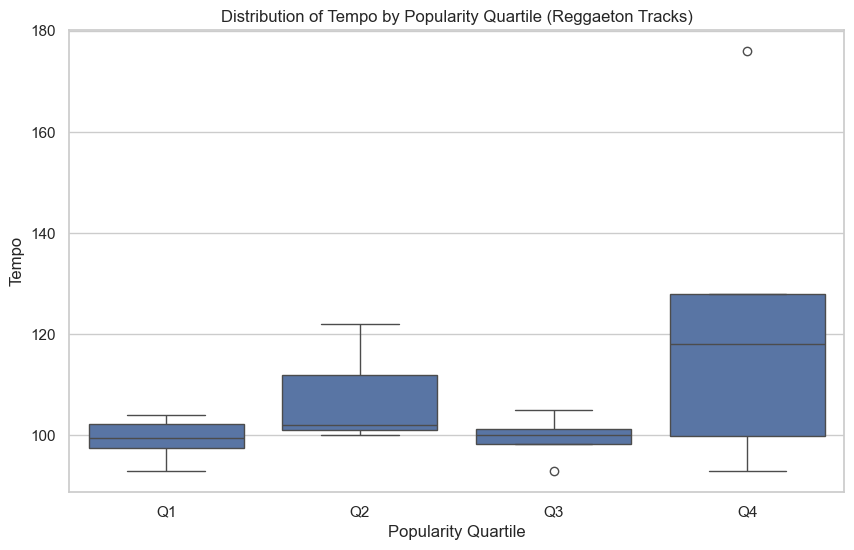

In [219]:
reggaeton_tracks_2024['popularity_quartile'] = pd.qcut(reggaeton_tracks_2024['track_popularity'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
plt.figure(figsize=(10, 6))
sns.boxplot(x='popularity_quartile', y='tempo', data=reggaeton_tracks_2024)
plt.title('Distribution of Tempo by Popularity Quartile (Reggaeton Tracks)')
plt.xlabel('Popularity Quartile')
plt.ylabel('Tempo')
plt.show()

#### Q1 (Lowest Popularity Quartile):
* The tempo is tightly clustered around a median just above 100 BPM, with a narrow interquartile range (IQR) and small variability. This suggests that less popular tracks tend to have similar, relatively slower tempos.
#### Q2:
* The tempo for this quartile has a larger spread, with a median tempo around 110 BPM and a wider IQR. This indicates more variability in the tempos of tracks that are slightly more popular but not the most popular.
#### Q3:
* Tracks in this quartile have a very narrow IQR and a lower median tempo (around 100 BPM), with minimal variation. It seems that moderately popular reggaeton tracks also tend to cluster around slower tempos, similar to the Q1 quartile.
#### Q4 (Highest Popularity Quartile):
* The most popular tracks have a much wider range of tempos, with the median around 120 BPM. There is greater variability in tempos, with some tracks having much faster tempos, as indicated by the presence of outliers near 180 BPM. This suggests that highly popular tracks in reggaeton tend to have faster tempos and more diversity in tempo than tracks in lower popularity quartiles.

### General Insight:

* The most popular reggaeton tracks (Q4) tend to have faster and more varied tempos, while less popular tracks (Q1 and Q3) cluster around slower, more consistent tempos. This could imply that higher energy (faster tempo) tracks tend to resonate more with listeners.

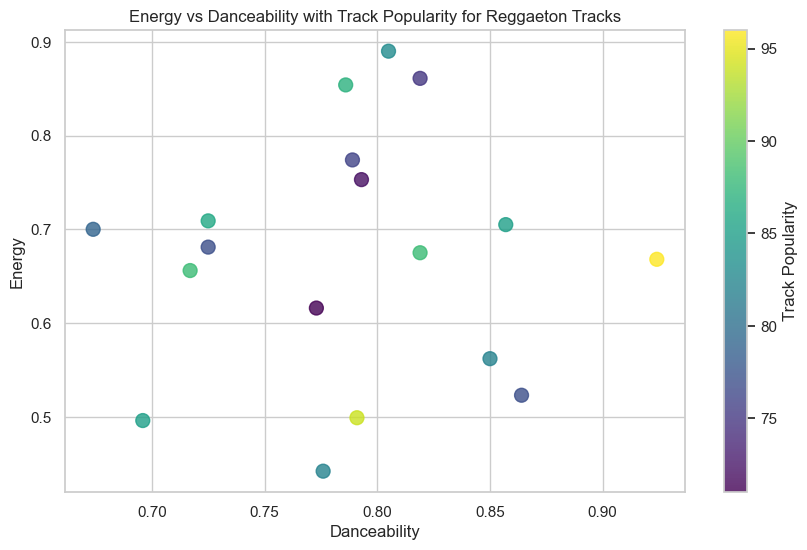

In [221]:
plt.figure(figsize=(10, 6))

plt.scatter(
    reggaeton_tracks_2024['danceability'],
    reggaeton_tracks_2024['energy'],
    c=reggaeton_tracks_2024['track_popularity'],
    cmap='viridis',  
    s=100,  
    alpha=0.8  
)

cbar = plt.colorbar()
cbar.set_label('Track Popularity')

plt.xlabel('Danceability')
plt.ylabel('Energy')
plt.title('Energy vs Danceability with Track Popularity for Reggaeton Tracks')

plt.show()

#### Energy and Danceability Clustering:
* The tracks are generally clustered between 0.7 and 0.9 for danceability and 0.5 to 0.9 for energy, indicating that these house tracks tend to have relatively high danceability and energy.
* A noticeable grouping is seen around the 0.8 danceability and 0.8-0.9 energy range.
#### Track Popularity:
* More popular tracks (yellow-green) tend to have higher energy and danceability. 
* The highest popularity (yellow) is observed near 0.85 danceability and 0.75 energy (KAROL G - Si Antes Te Hubiera Conocido) has Merengue/mambo rythym mixed with reggaeton which is why it has such a high Danceabilty
* Tracks with lower popularity (darker colors) are spread out across the plot, indicating that higher danceability or energy alone does not guarantee popularity.


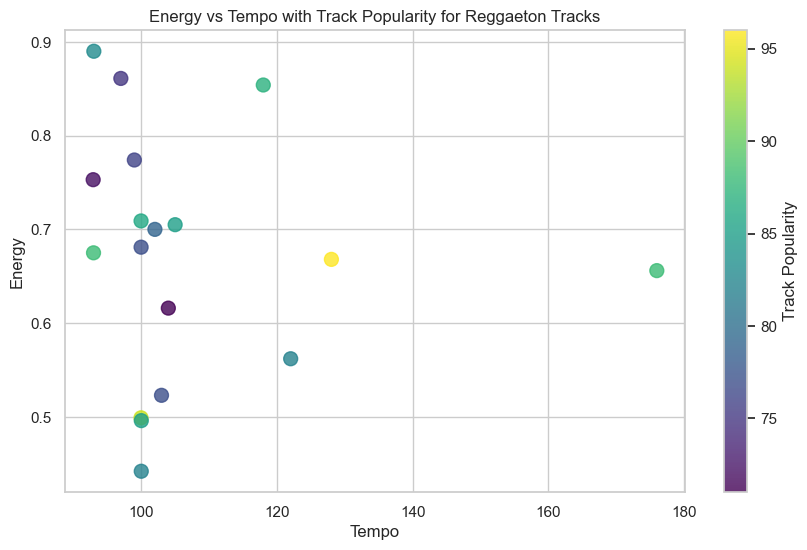

In [223]:
plt.figure(figsize=(10, 6))

plt.scatter(
    reggaeton_tracks_2024['tempo'],
    reggaeton_tracks_2024['energy'],
    c=reggaeton_tracks_2024['track_popularity'],
    cmap='viridis',  
    s=100,  
    alpha=0.8  
)

cbar = plt.colorbar()
cbar.set_label('Track Popularity')

plt.xlabel('Tempo')
plt.ylabel('Energy')
plt.title('Energy vs Tempo with Track Popularity for Reggaeton Tracks')

plt.show()

#### Tempo Distribution:
* Most of the tracks cluster around the 90-110 BPM (beats per minute) range.
* There are a few outliers with much higher tempos (around 160-180 BPM), but these are fewer in number.
#### Energy Levels:
* Tracks generally range from 0.5 to 0.9 in energy, but there is no clear trend between tempo and energy.
* Energy levels appear to be relatively consistent across various tempos, except for the few high-tempo outliers.
#### Track Popularity:
* The most popular track (yellow, around 95 in popularity) has a tempo around 110 BPM and moderate energy (approximately 0.7).
* Tracks with lower popularity (darker colors) are spread more broadly across different energy and tempo values, suggesting that tempo and energy alone don't predict popularity.
* A few tracks with moderate popularity (green, around 80-85) appear at both low and high tempos, indicating that popularity can exist across a wide tempo range.

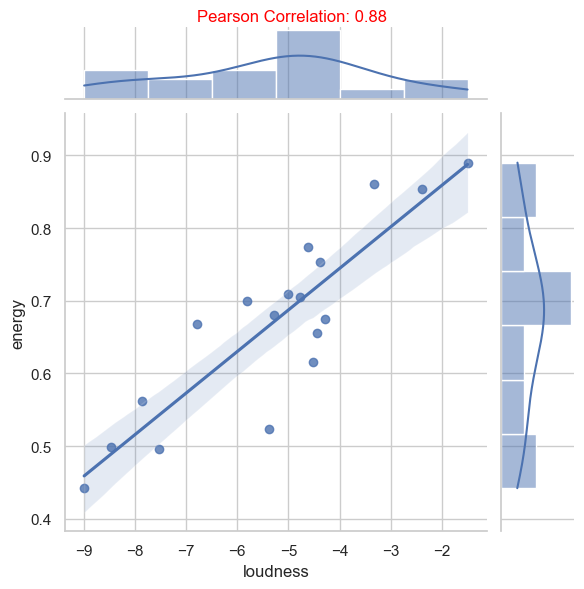

In [225]:
corr, _ = pearsonr(reggaeton_tracks_2024['loudness'], reggaeton_tracks_2024['energy'])

joint_plot = sns.jointplot(data=reggaeton_tracks_2024, y='energy', x='loudness', kind='reg')

joint_plot.fig.suptitle(f'Pearson Correlation: {corr:.2f}', ha='center', fontsize=12, color='red')
joint_plot.fig.subplots_adjust(top=0.95) 
plt.show()

#### Positive Correlation:
* The Pearson correlation value of 0.88 suggests a strong positive linear relationship between loudness and energy.
* As loudness increases (less negative), energy tends to increase as well.
#### Linear Trend:
* The regression line shows a clear upward trend, and the data points closely follow this line, further confirming the strong correlation.
* The shaded area around the regression line represents the confidence interval.
#### Data Distribution:
* Both loudness and energy appear to be roughly normally distributed, with most of the loudness values concentrated between -7 and -3 dB and energy values between 0.6 and 0.9.
* The histograms and KDE (kernel density estimate) plots on the margins indicate a slight skewness, but overall, the distributions are relatively symmetrical.
### In summary, there is a strong positive correlation between energy and loudness, meaning tracks with higher energy tend to be louder. The data closely aligns with the regression line, reinforcing this relationship.

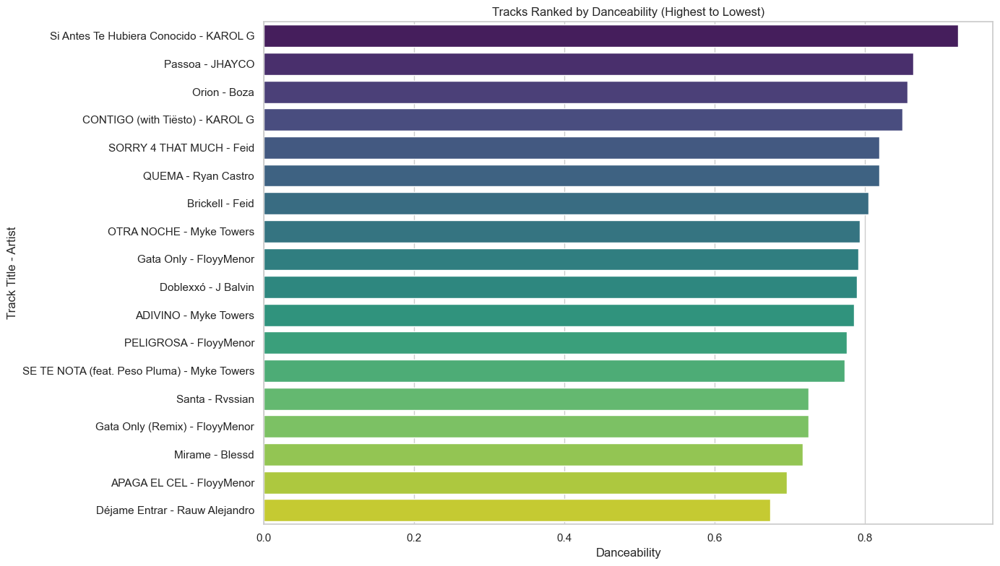

In [227]:
reggaeton_tracks_2024_sorted = reggaeton_tracks_2024.sort_values(by='danceability', ascending=False)

reggaeton_tracks_2024_sorted['title_artist'] = reggaeton_tracks_2024_sorted['title'] + ' - ' + reggaeton_tracks_2024_sorted['artist']

plt.figure(figsize=(14, 8))
sns.barplot(x='danceability', y='title_artist', data=reggaeton_tracks_2024_sorted, palette='viridis')

plt.title('Tracks Ranked by Danceability (Highest to Lowest)')
plt.xlabel('Danceability')
plt.ylabel('Track Title - Artist')

plt.tight_layout()
plt.show()

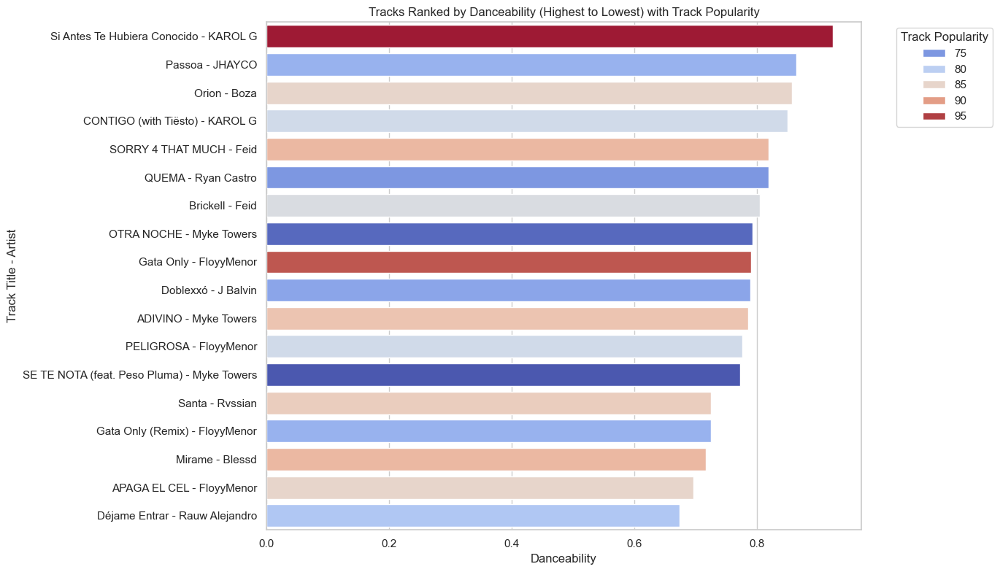

In [229]:
reggaeton_tracks_2024_sorted = reggaeton_tracks_2024.sort_values(by='danceability', ascending=False)

reggaeton_tracks_2024_sorted['title_artist'] = reggaeton_tracks_2024_sorted['title'] + ' - ' + reggaeton_tracks_2024_sorted['artist']

plt.figure(figsize=(14, 8))

sns.barplot(x='danceability', y='title_artist', data=reggaeton_tracks_2024_sorted, 
            palette='coolwarm', hue='track_popularity', dodge=False)

plt.title('Tracks Ranked by Danceability (Highest to Lowest) with Track Popularity')
plt.xlabel('Danceability')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

#### The track "Si Antes Te Hubiera Conocido" by KAROL G stands out as the most popular song in the dataset and also exhibits the highest danceability score.
#### While danceability is a key characteristic of reggaeton tracks, the data suggests that it is not the sole determinant of a song's popularity, indicating the influence of other factors.

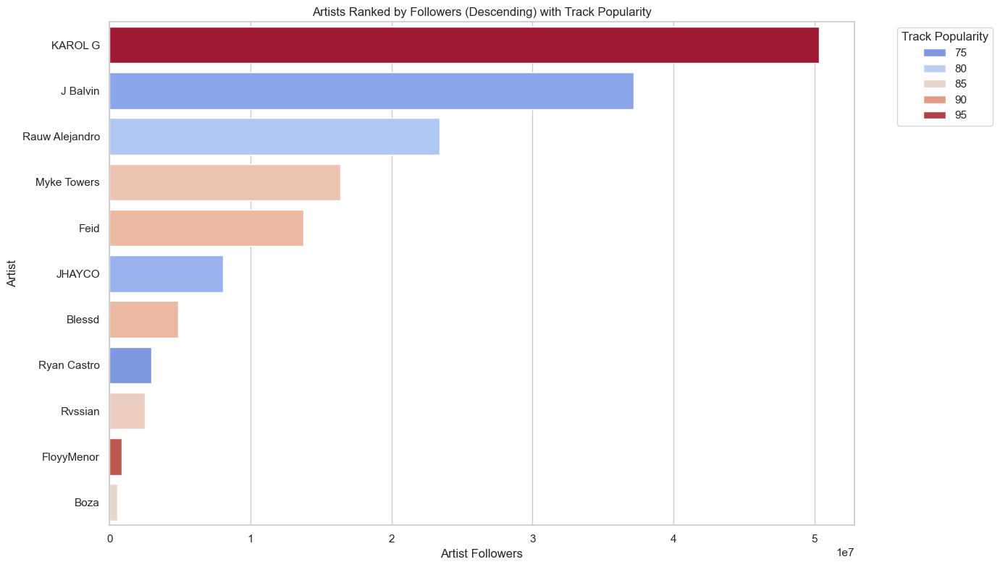

In [231]:
reggaeton_tracks_2024_sorted = reggaeton_tracks_2024.sort_values(by='artist_followers', ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(x='artist_followers', y='artist', data=reggaeton_tracks_2024_sorted, 
            palette='coolwarm', hue='track_popularity', dodge=False)

plt.title('Artists Ranked by Followers (Descending) with Track Popularity')
plt.xlabel('Artist Followers')
plt.ylabel('Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

#### KAROL G again at the top with the most followers 49,480,008 
#### J Bavin is 2nd with 36,995,639 but has a track popularity of 76
#### While FLoyyMenor has the 2nd hottest track but only 678,666 (New breakthrough artist)

# Reggaeton Music Analysis Summary:
## Artist Popularity & Followers:
### Artist Popularity:
### •	The average popularity of artists in the dataset is high, at 84.1. The range of popularity (71 to 91) indicates some variation but generally showcases well-known artists.
### •	Artist Followers:
### •	On average, artists have 13.5 million followers, with significant variability (SD of 15.9 million). The minimum number of followers is 559,175, while the maximum reaches 49.5 million, showing the mix of both mainstream and emerging artists.

## Track Features:
### Duration:
### •	Average track duration is 3.44 minutes, typical for reggaeton, with a range from 2.28 to 5.15 minutes, indicating variability in track lengths.
### •	Track Popularity:
### •	The tracks are popular, with an average popularity score of 82.5 and a range from 71 to 96, showing that most tracks are widely liked.
### •	Danceability:
### •	High average danceability at 0.785, ranging from 0.674 to 0.924. This confirms reggaeton’s characteristic danceable rhythm.
### •	Energy:
### •	Moderate to high energy, with an average of 0.672 and a range from 0.442 to 0.89, reflecting the energetic nature of reggaeton.
### •	Valence:
### •	Average valence is 0.624, indicating a generally positive or upbeat mood, though the range (0.25 to 0.905) shows that some tracks may have melancholic tones.
### •	Tempo:
### •	Track tempos range widely from 92.94 BPM to 175.96 BPM, though the average tempo is around 107 BPM, which is typical for reggaeton.
## Artists’ Success in the Dataset:
### FLoyyMenor (Chile):
### •	Chilean breakthrough artist FLoyyMenor has become the most listened-to Chilean artist, holding the Billboard Hot Latin No. 1 spot for over 13 weeks. His single “Gata Only” and its remix, along with two other tracks from his album, dominate the charts with 1.2 billion streams on Spotify.
### Myke Towers (Puerto Rico):
### •	Reggaeton veteran Myke Towers has 3 tracks in the dataset, showcasing his collaboration with many top artists in the genre.
### Feid & Karol G (Colombia):
### •	Both have 2 entries in the dataset, with Karol G’s most popular track “Si Antes Te Hubiera Conocido” leading the way with high danceability.
## Geographic Influence:
### •	Colombia: Leads the dataset with 5 artists featured in the top reggaeton tracks.
### •	Puerto Rico: Comes in second with 3 artists.
## Correlations in Reggaeton Data:

### Artist Popularity and Followers:
### •	Strong positive correlation (0.68): More popular artists tend to have larger followings, aligning with expectations in the genre.
### Track Popularity and Tempo:
### •	Moderate positive correlation (0.38): Faster tempo tracks tend to be more popular, suggesting that higher energy resonates with listeners.
### Artist Followers and Danceability:
### •	Moderate positive correlation (0.44): Artists with more followers tend to produce more danceable tracks, a characteristic that may contribute to their broad appeal.
## Quartile Analysis (Popularity & Tempo):

### Q1 (Lowest Popularity):
### •	Tracks have slower, more consistent tempos, clustered just above 100 BPM.
### Q2:
### •	Wider tempo spread with a median around 110 BPM.
### Q3:
### •	Tracks here cluster around slower tempos, similar to Q1, with minimal variation (median around 100 BPM).
### Q4 (Highest Popularity):
### •	Tracks have faster tempos, with a median around 120 BPM and greater variability, including outliers near 180 BPM. This suggests faster-paced tracks in reggaeton are more popular.

## Insights into Track Popularity:

### Energy and Danceability Clustering:
### •	Most tracks cluster between 0.7 and 0.9 for danceability and 0.5 to 0.9 for energy. The most popular tracks, like Karol G’s “Si Antes Te Hubiera Conocido”, score high in both energy and danceability.
### Tempo Distribution:
### •	Most tracks have tempos between 90-110 BPM, but popular tracks vary more in tempo. Some outliers reach up to 180 BPM, though they are less frequent.
### Energy Levels:
### •	Tracks tend to have consistent energy across various tempos. Popular tracks generally have moderate energy (around 0.7), but tempo alone doesn’t predict popularity.

## Energy & Loudness:
### •	Strong positive correlation (0.88): Tracks with higher energy tend to be louder. This reinforces the idea that energetic tracks often feel louder, creating a more intense listening experience.

## Conclusion:

## In reggaeton, tracks with higher energy and faster tempos tend to be more popular, though danceability is an essential factor in determining success. 
## Popular tracks often balance a range of tempos and exhibit higher energy and loudness, which contributes to their appeal. Tracks like Karol G’s “Si Antes Te Hubiera Conocido” exemplify this balance, making them stand out as fan favorites. 
## The strong correlation between artist popularity and followers indicates that reggaeton’s biggest stars are supported by large fanbases, but track-specific features like tempo, energy, and danceability play crucial roles in shaping a song’s popularity.

## I will now analyze my 3 favorite tracks from the reggaeton dataframe
### Rvssian - Santa	
### Rauw Alejandro - Déjame Entrar
### Feid - SORRY 4 THAT MUCH

In [235]:
favorite_reggaeton_tracks = ['63pLfjK6FvcYJYMGwtHjd6', '5bi0gh89wRuH2OgjdAKFsb', '3TlghSCu53YEUigL9RuqnU']
fav_tracks_reggaeton = reggaeton_tracks_2024[reggaeton_tracks_2024['track_id'].isin(favorite_reggaeton_tracks)]
fav_tracks_reggaeton

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,liveness,valence,tempo,type,uri,track_href,analysis_url,Country,title_artist,popularity_quartile
3,2LRoIwlKmHjgvigdNGBHNo,Feid,92,13731153,63pLfjK6FvcYJYMGwtHjd6,SORRY 4 THAT MUCH,3.46,"['colombian pop', 'pop reggaeton', 'reggaeton'...",88,0.819,...,0.2890,0.602,92.990,audio_features,spotify:track:63pLfjK6FvcYJYMGwtHjd6,https://api.spotify.com/v1/tracks/63pLfjK6FvcY...,https://api.spotify.com/v1/audio-analysis/63pL...,Colombia,Feid - SORRY 4 THAT MUCH,Q4
5,1fctva4kpRbg2k3v7kwRuS,Rvssian,76,2498799,5bi0gh89wRuH2OgjdAKFsb,Santa,3.22,"['reggaeton', 'reggaeton flow', 'trap latino',...",86,0.725,...,0.1140,0.648,99.993,audio_features,spotify:track:5bi0gh89wRuH2OgjdAKFsb,https://api.spotify.com/v1/tracks/5bi0gh89wRuH...,https://api.spotify.com/v1/audio-analysis/5bi0...,Jamaica,Rvssian - Santa,Q3
7,1mcTU81TzQhprhouKaTkpq,Rauw Alejandro,89,23402791,3TlghSCu53YEUigL9RuqnU,Déjame Entrar,4.25,"['puerto rican pop', 'reggaeton', 'trap latino...",79,0.674,...,0.0994,0.255,102.031,audio_features,spotify:track:3TlghSCu53YEUigL9RuqnU,https://api.spotify.com/v1/tracks/3TlghSCu53YE...,https://api.spotify.com/v1/audio-analysis/3Tlg...,Puerto Rico,Rauw Alejandro - Déjame Entrar,Q2


In [237]:
fav_tracks_reggaeton_reset = fav_tracks_reggaeton.reset_index(drop=True)
fav_tracks_reggaeton_reset.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,3.000000,3.000000e+00,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.00000,3.000000,3.000000,3.000000,3.000000
mean,85.666667,1.321091e+07,3.643333,84.333333,0.739333,0.694667,3.333333,-5.035667,0.666667,0.083000,0.23160,0.000075,0.167467,0.501667,98.338000
std,8.504901,1.046170e+07,0.538919,4.725816,0.073555,0.017616,3.511885,0.764171,0.577350,0.041813,0.17335,0.000100,0.105504,0.214854,4.742277
min,76.000000,2.498799e+06,3.220000,79.000000,0.674000,0.675000,0.000000,-5.809000,0.000000,0.047300,0.03180,0.000000,0.099400,0.255000,92.990000
25%,82.500000,8.114976e+06,3.340000,82.500000,0.699500,0.687500,1.500000,-5.413000,0.500000,0.060000,0.17640,0.000018,0.106700,0.428500,96.491500
50%,89.000000,1.373115e+07,3.460000,86.000000,0.725000,0.700000,3.000000,-5.017000,1.000000,0.072700,0.32100,0.000036,0.114000,0.602000,99.993000
75%,90.500000,1.856697e+07,3.855000,87.000000,0.772000,0.704500,5.000000,-4.649000,1.000000,0.100850,0.33150,0.000112,0.201500,0.625000,101.012000
max,92.000000,2.340279e+07,4.250000,88.000000,0.819000,0.709000,7.000000,-4.281000,1.000000,0.129000,0.34200,0.000189,0.289000,0.648000,102.031000


### Artist Popularity:
* The mean artist popularity is 85.67, with a standard deviation of 8.50.
* The popularity ranges from 76 to 92, suggesting that the artists in this dataset are quite popular, but there’s a noticeable spread in popularity.
### Artist Followers:
* The mean number of followers is 13.21 million, with a large standard deviation of 10.46 million, indicating a high variance in follower counts.
* The minimum is around 2.5 million followers, while the maximum is 23.4 million. This suggests that while some artists are extremely well-known, others are still gaining traction.
### Track Duration (minutes):
* The mean track duration is about 3.64 minutes, with a standard deviation of 0.54 minutes.
* Tracks range from 3.22 to 4.25 minutes, indicating that most songs follow typical radio-friendly durations.
### Track Popularity:
* The average track popularity is 84.33, with a range from 79 to 88. This indicates that the tracks are very popular, but some are slightly more successful than others.
### Danceability:
* The mean danceability score is 0.74, with a small standard deviation of 0.07.
* Scores range from 0.67 to 0.82, indicating that all tracks are highly danceable but with some variation in how easy they are to dance to.
### Energy:
* The mean energy score is 0.69, with a low standard deviation of 0.02.
* The range of energy is from 0.67 to 0.71, suggesting that most tracks are energetic but not overly intense.
### Key:
* The average key is around 3.33 (with a range of 0 to 7), meaning these tracks are generally in lower keys.
### Loudness:
* The mean loudness is -5.04 dB, with a standard deviation of 0.76 dB.
* Tracks range from -5.81 dB to -4.28 dB, suggesting that the tracks are generally mixed at loud volumes, with a focus on impact.
### Mode:
* The mean mode is 0.67, suggesting that two-thirds of the tracks are in a major mode, which generally contributes to a more positive or uplifting sound.
### Speechiness:
* The mean speechiness is 0.083, indicating that the tracks are mostly musical rather than spoken-word oriented.
### Acousticness:
* The mean acousticness is 0.23, showing that most tracks rely more on electronic production than acoustic elements.
### Instrumentalness:
* The mean instrumentalness is 0.000075, meaning that the tracks are almost entirely vocal with minimal instrumental sections.
### Liveness:
* The average liveness is 0.167, with a standard deviation of 0.105, suggesting that most tracks are likely studio-produced with limited live elements.
### Valence:
* The mean valence is 0.50, indicating a mix of positive and neutral moods in the tracks.
### Tempo:
* The mean tempo is 98.34 BPM, with a range from 92.99 BPM to 102.03 BPM, indicating that the tracks have a slower, more laid-back tempo overall.
## Summary:
* Artist Popularity and Followers: There is a wide range of artist popularity and follower counts, from mid-tier to extremely popular.
* Track Characteristics: The tracks are highly danceable, energetic, and loud, with a preference for electronic production over acoustic. Most tracks are likely to feature vocals and are in a major key.
* Mood and Tempo: Valence is balanced, suggesting a mix of emotional tones in the tracks, while tempo tends to be on the slower side, but still within danceable ranges.


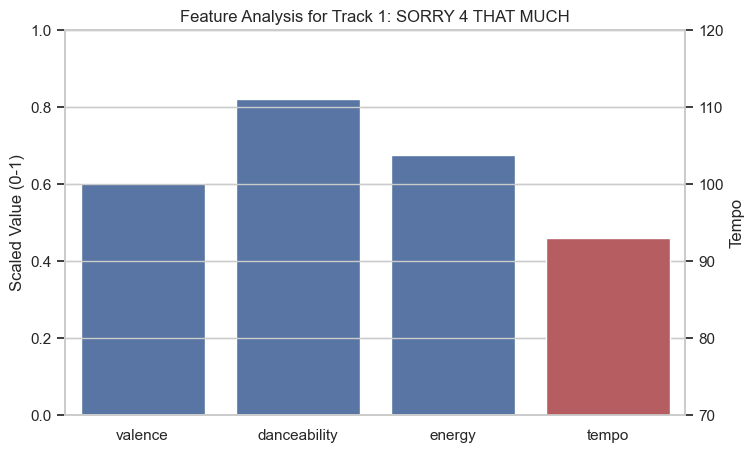

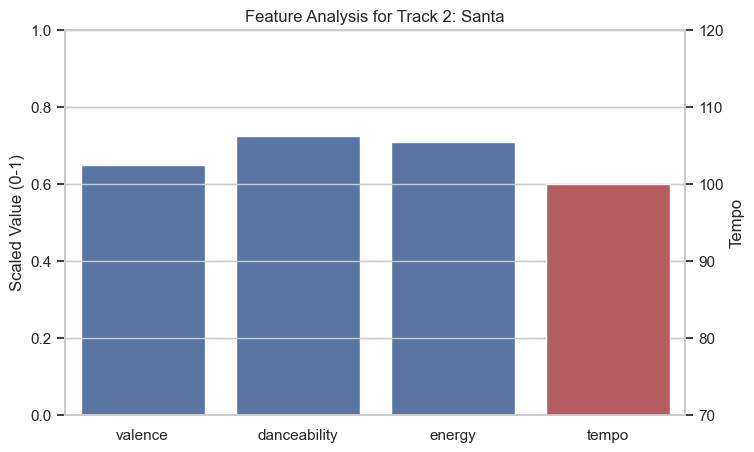

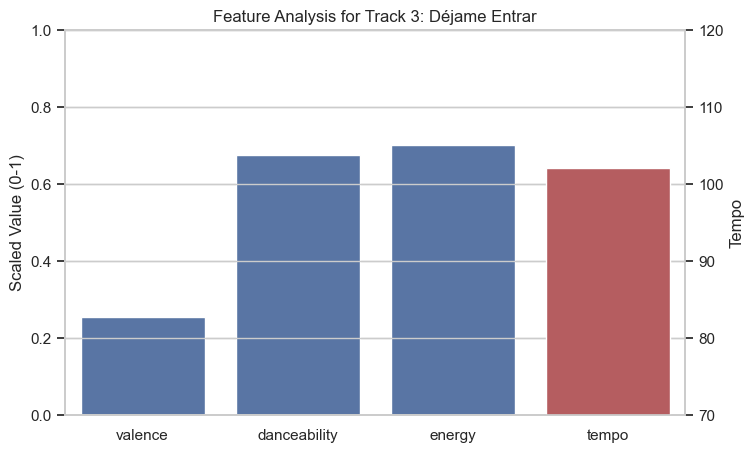

In [242]:
features = ['tempo', 'valence', 'danceability', 'energy']

min_tempo = 70
max_tempo = 120

for index, row in fav_tracks_reggaeton_reset.iterrows():
    fig, ax1 = plt.subplots(figsize=(8, 5))
    
    sns.barplot(x=features[1:], y=row[features[1:]].values, ax=ax1, color='b')
    ax1.set_ylabel('Scaled Value (0-1)')
    ax1.set_ylim(0, 1)

    ax2 = ax1.twinx()
    sns.barplot(x=['tempo'], y=[row['tempo']], ax=ax2, color='r')
    ax2.set_ylabel('Tempo')
    ax2.set_ylim(min_tempo, max_tempo)
    ax2.set_yticks(range(min_tempo, max_tempo + 10, 10)) 

    track_title = row['title']
    
    plt.title(f'Feature Analysis for Track {index + 1}: {track_title}')
    plt.show()

### Variation in Valence:
* "SORRY 4 THAT MUCH" and "Santa" have moderate valence values around 0.5, suggesting a neutral to slightly positive feel.
* "Déjame Entrar," however, has a much lower valence, closer to 0.2, indicating a more melancholic or serious tone compared to the others.
* This variation in valence could suggest different emotional themes among the tracks, catering to a range of listener moods.
### Energy Levels are High Across Tracks:
* All tracks maintain high energy levels, with scores near or above 0.6.
* This aligns with reggaeton’s energetic style, but the variation is minimal, suggesting a consistent intensity in the production of these tracks.
### Tempo Differences:
* "SORRY 4 THAT MUCH" has a lower tempo, below 100 BPM, making it relatively slower compared to the others.
* "Santa" and "Déjame Entrar" have similar tempos, around 100 BPM, which is more typical for reggaeton tracks that are meant for dancing.
* The slightly slower tempo of "SORRY 4 THAT MUCH" could indicate a potential for a more relaxed dance pace or a unique stylistic choice by the artist.

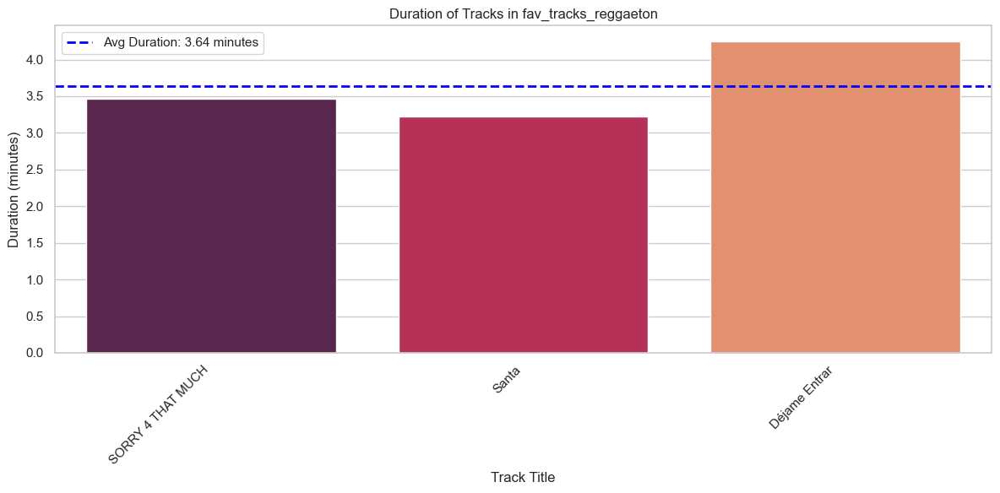

In [244]:
mean_duration = fav_tracks_reggaeton_reset['duration_minutes'].mean()

plt.figure(figsize=(12, 6))

sns.barplot(x='title', y='duration_minutes', data=fav_tracks_reggaeton_reset, palette='rocket')

plt.axhline(mean_duration, color='blue', linestyle='--', linewidth=2, label=f'Avg Duration: {mean_duration:.2f} minutes')

plt.xlabel('Track Title')
plt.ylabel('Duration (minutes)')
plt.title('Duration of Tracks in fav_tracks_reggaeton')

plt.xticks(rotation=45, ha='right')

plt.legend()

plt.tight_layout()
plt.show()

### Avg track duration of 3.64 minutes

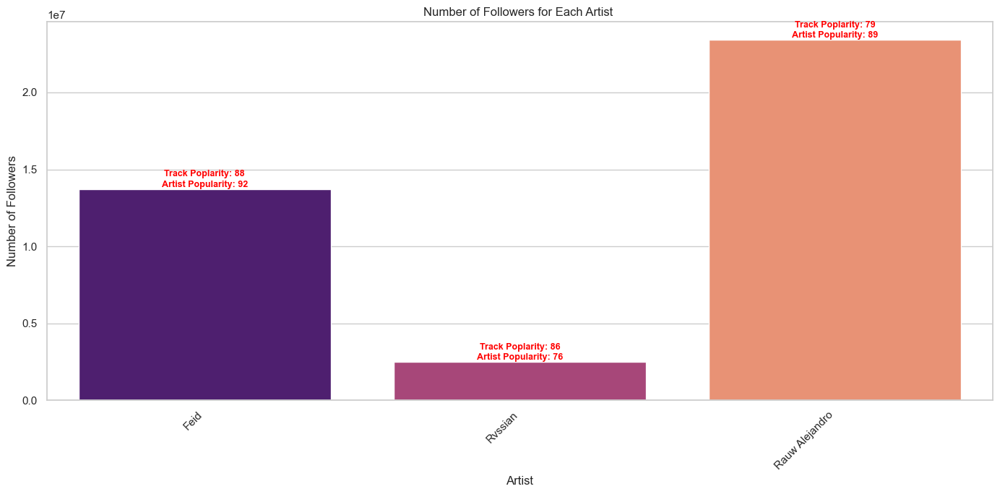

In [246]:
plt.figure(figsize=(14, 7))

barplot = sns.barplot(x='artist', y='artist_followers', data=fav_tracks_reggaeton_reset, palette='magma')

plt.xlabel('Artist')
plt.ylabel('Number of Followers')
plt.title('Number of Followers for Each Artist ')

plt.xticks(rotation=45, ha='right')

for index, row in fav_tracks_reggaeton_reset.iterrows():
    barplot.text(index, row['artist_followers'], 
                 f"Track Poplarity: {row['track_popularity']:.0f}\nArtist Popularity: {row['artist_popularity']:.0f}", 
                 ha="center", va="bottom", fontsize=9, color='red', fontweight='bold')

plt.tight_layout()
plt.show()

### Rauw Alejandro shows the most followers yet falls in second in artist popularity
### Feid records the highest artist popularity with 91

In [248]:
fav_tracks_reggaeton_reset.to_csv('fav_tracks_reggaeton_3.csv', index=False)

## Moving on to Rap tracks

In [250]:
rap_tracks_2024.sort_values(by=['track_popularity'], ascending=False)

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"['conscious hip hop', 'hip hop', 'rap', 'west ...",95,0.898,...,0.0776,0.010700,0.000000,0.1410,0.2140,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...
5,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,7221xIgOnuakPdLqT0F3nP,I Had Some Help (Feat. Morgan Wallen),2.97,"['dfw rap', 'melodic rap', 'pop', 'rap']",93,0.638,...,0.0264,0.007570,0.000000,0.2450,0.7310,127.986,audio_features,spotify:track:7221xIgOnuakPdLqT0F3nP,https://api.spotify.com/v1/tracks/7221xIgOnuak...,https://api.spotify.com/v1/audio-analysis/7221...
18,4nVa6XlBFlIkF6msW57PHp,Hanumankind,77,451050,0OA00aPt3BV10qeMIs3meW,Big Dawgs,3.18,"['desi hip hop', 'indian underground rap', 'ma...",92,0.464,...,0.1610,0.023500,0.000000,0.3630,0.2620,180.098,audio_features,spotify:track:0OA00aPt3BV10qeMIs3meW,https://api.spotify.com/v1/tracks/0OA00aPt3BV1...,https://api.spotify.com/v1/audio-analysis/0OA0...
9,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,2FQrifJ1N335Ljm3TjTVVf,A Bar Song (Tipsy),2.85,"['modern country pop', 'pop rap']",91,0.722,...,0.0273,0.063300,0.000000,0.0804,0.6040,81.012,audio_features,spotify:track:2FQrifJ1N335Ljm3TjTVVf,https://api.spotify.com/v1/tracks/2FQrifJ1N335...,https://api.spotify.com/v1/audio-analysis/2FQr...
581,2x7PC78TmgqpEIjaGAZ0Oz,Trueno,82,7469721,1pymWRCuZfCd0zdiBJo0Hj,REAL GANGSTA LOVE,2.42,"['argentine hip hop', 'bases de freestyle', 't...",90,0.831,...,0.0568,0.388000,0.000069,0.3740,0.5700,97.013,audio_features,spotify:track:1pymWRCuZfCd0zdiBJo0Hj,https://api.spotify.com/v1/tracks/1pymWRCuZfCd...,https://api.spotify.com/v1/audio-analysis/1pym...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,74lpiAq9Vn7KrIMSbn6CP4,Go To Hell,4.46,"['dfw rap', 'melodic rap', 'pop', 'rap']",42,0.361,...,0.0408,0.000457,0.000002,0.3660,0.5360,124.165,audio_features,spotify:track:74lpiAq9Vn7KrIMSbn6CP4,https://api.spotify.com/v1/tracks/74lpiAq9Vn7K...,https://api.spotify.com/v1/audio-analysis/74lp...
222,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,3cdvuWlgolu8yubj9XR66W,California Sober (Feat. Chris Stapleton),3.41,"['dfw rap', 'melodic rap', 'pop', 'rap']",38,0.452,...,0.0387,0.004620,0.000012,0.2160,0.6150,92.501,audio_features,spotify:track:3cdvuWlgolu8yubj9XR66W,https://api.spotify.com/v1/tracks/3cdvuWlgolu8...,https://api.spotify.com/v1/audio-analysis/3cdv...
221,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,53MOb9isu1bJlCkDTObrCB,Wrong Ones (Feat. Tim McGraw),3.26,"['dfw rap', 'melodic rap', 'pop', 'rap']",36,0.431,...,0.0373,0.005890,0.000000,0.2470,0.4790,161.988,audio_features,spotify:track:53MOb9isu1bJlCkDTObrCB,https://api.spotify.com/v1/tracks/53MOb9isu1bJ...,https://api.spotify.com/v1/audio-analysis/53MO...
223,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,4Xkea40brwV7ImJz5vlWbY,Hide My Gun (Feat. HARDY),3.67,"['dfw rap', 'melodic rap', 'pop', 'rap']",33,0.520,...,0.0360,0.025800,0.000000,0.1090,0.3480,146.101,audio_features,spotify:track:4Xkea40brwV7ImJz5vlWbY,https://api.spotify.com/v1/tracks/4Xkea40brwV7...,https://api.spotify.com/v1/audio-analysis/4Xke...


#### I also see Post Molones album F-1 Trillion made it to the to of popularity but this album is country/pop
#### I need to clean this dataframe up a bit

In [253]:
rap_tracks_2024[rap_tracks_2024['artist'] == 'Post Malone']

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
5,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,7221xIgOnuakPdLqT0F3nP,I Had Some Help (Feat. Morgan Wallen),2.97,"['dfw rap', 'melodic rap', 'pop', 'rap']",93,0.638,...,0.0264,0.00757,0.000000,0.245,0.731,127.986,audio_features,spotify:track:7221xIgOnuakPdLqT0F3nP,https://api.spotify.com/v1/tracks/7221xIgOnuak...,https://api.spotify.com/v1/audio-analysis/7221...
34,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,5IZXB5IKAD2qlvTPJYDCFB,I Had Some Help (Feat. Morgan Wallen),2.97,"['dfw rap', 'melodic rap', 'pop', 'rap']",82,0.644,...,0.0265,0.01130,0.000000,0.227,0.753,128.017,audio_features,spotify:track:5IZXB5IKAD2qlvTPJYDCFB,https://api.spotify.com/v1/tracks/5IZXB5IKAD2q...,https://api.spotify.com/v1/audio-analysis/5IZX...
43,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,5crxqqibcvoOQQgg4HjAFQ,Guy For That (Feat. Luke Combs),2.73,"['dfw rap', 'melodic rap', 'pop', 'rap']",84,0.608,...,0.0721,0.00545,0.000000,0.137,0.511,120.010,audio_features,spotify:track:5crxqqibcvoOQQgg4HjAFQ,https://api.spotify.com/v1/tracks/5crxqqibcvoO...,https://api.spotify.com/v1/audio-analysis/5crx...
48,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,2CIXO1jQbrV1hlfI7FUKld,Wrong Ones (Feat. Tim McGraw),3.26,"['dfw rap', 'melodic rap', 'pop', 'rap']",78,0.476,...,0.0332,0.00552,0.000000,0.142,0.601,80.946,audio_features,spotify:track:2CIXO1jQbrV1hlfI7FUKld,https://api.spotify.com/v1/tracks/2CIXO1jQbrV1...,https://api.spotify.com/v1/audio-analysis/2CIX...
55,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,6StwwqB84sJeLr7tZDTxEX,Guy For That (Feat. Luke Combs),2.73,"['dfw rap', 'melodic rap', 'pop', 'rap']",78,0.611,...,0.0647,0.00610,0.000000,0.135,0.495,119.986,audio_features,spotify:track:6StwwqB84sJeLr7tZDTxEX,https://api.spotify.com/v1/tracks/6StwwqB84sJe...,https://api.spotify.com/v1/audio-analysis/6Stw...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,5P4ES4VjLK3lgT1SiOeWKo,Two Hearts,3.45,"['dfw rap', 'melodic rap', 'pop', 'rap']",42,0.536,...,0.0276,0.57800,0.000000,0.134,0.495,147.905,audio_features,spotify:track:5P4ES4VjLK3lgT1SiOeWKo,https://api.spotify.com/v1/tracks/5P4ES4VjLK3l...,https://api.spotify.com/v1/audio-analysis/5P4E...
220,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,1HEJLYh1GIkkhdBHhsf1rW,Right About You,3.05,"['dfw rap', 'melodic rap', 'pop', 'rap']",42,0.441,...,0.0336,0.00630,0.000000,0.159,0.749,171.922,audio_features,spotify:track:1HEJLYh1GIkkhdBHhsf1rW,https://api.spotify.com/v1/tracks/1HEJLYh1GIkk...,https://api.spotify.com/v1/audio-analysis/1HEJ...
221,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,53MOb9isu1bJlCkDTObrCB,Wrong Ones (Feat. Tim McGraw),3.26,"['dfw rap', 'melodic rap', 'pop', 'rap']",36,0.431,...,0.0373,0.00589,0.000000,0.247,0.479,161.988,audio_features,spotify:track:53MOb9isu1bJlCkDTObrCB,https://api.spotify.com/v1/tracks/53MOb9isu1bJ...,https://api.spotify.com/v1/audio-analysis/53MO...
222,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,3cdvuWlgolu8yubj9XR66W,California Sober (Feat. Chris Stapleton),3.41,"['dfw rap', 'melodic rap', 'pop', 'rap']",38,0.452,...,0.0387,0.00462,0.000012,0.216,0.615,92.501,audio_features,spotify:track:3cdvuWlgolu8yubj9XR66W,https://api.spotify.com/v1/tracks/3cdvuWlgolu8...,https://api.spotify.com/v1/audio-analysis/3cdv...


### Post Malone shows 107 tracks within the rap dataframe, about 1/3 of the entire dataframe

In [255]:
post_malone_tracks = rap_tracks_2024[rap_tracks_2024['artist'] == 'Post Malone']

post_malone_tracks_unique = post_malone_tracks.drop_duplicates(subset='title')

print(post_malone_tracks_unique)

                  artist_id       artist  artist_popularity  artist_followers  \
5    246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
43   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
48   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
57   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
65   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
67   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
68   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
71   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
72   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
76   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
77   246dkjvS1zLTtiykXe5h60  Post Malone                 93          45344013   
80   246dkjvS1zLTtiykXe5h60 

#### I will drop all of Post Malones tracks from the rap dataframe because they are from his country album

In [262]:
rap_tracks_2024.drop(rap_tracks_2024[rap_tracks_2024['artist'] == 'Post Malone'].index, inplace=True)
rap_tracks_2024

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"['conscious hip hop', 'hip hop', 'rap', 'west ...",95,0.898,...,0.0776,0.01070,0.000000,0.1410,0.214,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...
9,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,2FQrifJ1N335Ljm3TjTVVf,A Bar Song (Tipsy),2.85,"['modern country pop', 'pop rap']",91,0.722,...,0.0273,0.06330,0.000000,0.0804,0.604,81.012,audio_features,spotify:track:2FQrifJ1N335Ljm3TjTVVf,https://api.spotify.com/v1/tracks/2FQrifJ1N335...,https://api.spotify.com/v1/audio-analysis/2FQr...
14,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,2tudvzsrR56uom6smgOcSf,Like That,4.46,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",88,0.814,...,0.2310,0.00709,0.000013,0.1190,0.312,162.012,audio_features,spotify:track:2tudvzsrR56uom6smgOcSf,https://api.spotify.com/v1/tracks/2tudvzsrR56u...,https://api.spotify.com/v1/audio-analysis/2tud...
18,4nVa6XlBFlIkF6msW57PHp,Hanumankind,77,451050,0OA00aPt3BV10qeMIs3meW,Big Dawgs,3.18,"['desi hip hop', 'indian underground rap', 'ma...",92,0.464,...,0.1610,0.02350,0.000000,0.3630,0.262,180.098,audio_features,spotify:track:0OA00aPt3BV10qeMIs3meW,https://api.spotify.com/v1/tracks/0OA00aPt3BV1...,https://api.spotify.com/v1/audio-analysis/0OA0...
20,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,5fZJQrFKWQLb7FpJXZ1g7K,A Bar Song (Tipsy),2.85,"['modern country pop', 'pop rap']",88,0.722,...,0.0292,0.07200,0.000000,0.0670,0.599,80.969,audio_features,spotify:track:5fZJQrFKWQLb7FpJXZ1g7K,https://api.spotify.com/v1/tracks/5fZJQrFKWQLb...,https://api.spotify.com/v1/audio-analysis/5fZJ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,6AgTAQt8XS6jRWi4sX7w49,Polo G,81,11763704,6UTLdGOkbRPJzlU2nPvZlH,We Uh Shoot (feat. Lil Durk),2.56,"['chicago rap', 'rap']",68,0.687,...,0.2660,0.17100,0.000000,0.1770,0.624,142.996,audio_features,spotify:track:6UTLdGOkbRPJzlU2nPvZlH,https://api.spotify.com/v1/tracks/6UTLdGOkbRPJ...,https://api.spotify.com/v1/audio-analysis/6UTL...
985,2CmaKO2zEGJ1NWpS1yfVGz,Falling In Reverse,76,3420088,7uAWPqXthO4pO2Exc8V90t,Bad Guy,2.63,"['alternative metal', 'rap metal']",67,0.597,...,0.0449,0.00132,0.000000,0.1210,0.598,92.972,audio_features,spotify:track:7uAWPqXthO4pO2Exc8V90t,https://api.spotify.com/v1/tracks/7uAWPqXthO4p...,https://api.spotify.com/v1/audio-analysis/7uAW...
986,1VPmR4DJC1PlOtd0IADAO0,$uicideboy$,87,7676451,0lZYlxoSG7DCecuLvMERfP,The Thin Grey Line,1.76,"['cloud rap', 'dark trap', 'new orleans rap', ...",66,0.761,...,0.1740,0.02320,0.000017,0.2770,0.381,142.908,audio_features,spotify:track:0lZYlxoSG7DCecuLvMERfP,https://api.spotify.com/v1/tracks/0lZYlxoSG7DC...,https://api.spotify.com/v1/audio-analysis/0lZY...
991,6MPCFvOQv5cIGfw3jODMF0,Internet Money,70,857282,53lS5rsYcbEMtpM2grepw5,KEEP IT COOL,1.78,"['pop rap', 'trap']",69,0.626,...,0.0419,0.01780,0.000014,0.1250,0.131,162.004,audio_features,spotify:track:53lS5rsYcbEMtpM2grepw5,https://api.spotify.com/v1/tracks/53lS5rsYcbEM...,https://api.spotify.com/v1/audio-analysis/53lS...


#### The rap dataframe now has 200 tracks and does not include Post Malone's great country album which is a must listen

In [265]:
rap_tracks_2024.sort_values(by=['track_popularity'], ascending=True).head(10)

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
957,6Xgp2XMz1fhVYe7i6yNAax,Trippie Redd,81,9785335,7FLa9koJXHZHPcC0bs43Ak,Murderman (feat. LAZER DIM 700 & VonOff1700),2.77,"['melodic rap', 'rap', 'trap']",30,0.591,...,0.0629,0.026900,0.006400,0.1250,0.0407,76.483,audio_features,spotify:track:7FLa9koJXHZHPcC0bs43Ak,https://api.spotify.com/v1/tracks/7FLa9koJXHZH...,https://api.spotify.com/v1/audio-analysis/7FLa...
659,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,2hBt2m4a1ed6c1LbPZjGCp,Liar,3.42,"['country rap', 'modern country pop', 'nashvil...",42,0.649,...,0.0303,0.037500,0.000000,0.0839,0.6000,114.036,audio_features,spotify:track:2hBt2m4a1ed6c1LbPZjGCp,https://api.spotify.com/v1/tracks/2hBt2m4a1ed6...,https://api.spotify.com/v1/audio-analysis/2hBt...
656,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,2cSD4HuDL5WAFA7S48MPth,I Am Not Okay,3.29,"['country rap', 'modern country pop', 'nashvil...",42,0.545,...,0.0317,0.068400,0.000000,0.1430,0.3660,76.968,audio_features,spotify:track:2cSD4HuDL5WAFA7S48MPth,https://api.spotify.com/v1/tracks/2cSD4HuDL5WA...,https://api.spotify.com/v1/audio-analysis/2cSD...
649,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,7mTLY2O2uXTonI3yvmI4ze,I Am Not Okay,3.29,"['country rap', 'modern country pop', 'nashvil...",46,0.529,...,0.0290,0.064300,0.000000,0.1610,0.3750,76.945,audio_features,spotify:track:7mTLY2O2uXTonI3yvmI4ze,https://api.spotify.com/v1/tracks/7mTLY2O2uXTo...,https://api.spotify.com/v1/audio-analysis/7mTL...
646,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,4gJGwdUXCNWHGzwkaF7yhs,Liar,3.42,"['country rap', 'modern country pop', 'nashvil...",47,0.635,...,0.0319,0.038800,0.000000,0.0900,0.5920,114.045,audio_features,spotify:track:4gJGwdUXCNWHGzwkaF7yhs,https://api.spotify.com/v1/tracks/4gJGwdUXCNWH...,https://api.spotify.com/v1/audio-analysis/4gJG...
640,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,3UlylFCWSvSCpBqgwC6FCE,Get By - College Football Edition,2.67,"['country rap', 'modern country pop', 'nashvil...",48,0.760,...,0.0418,0.091000,0.000000,0.0739,0.7450,109.025,audio_features,spotify:track:3UlylFCWSvSCpBqgwC6FCE,https://api.spotify.com/v1/tracks/3UlylFCWSvSC...,https://api.spotify.com/v1/audio-analysis/3Uly...
827,6icQOAFXDZKsumw3YXyusw,Lil Yachty,80,10157516,5sULVkTMo6jaRCBuonIsPA,Lets Get On Dey Ass,2.68,"['atl hip hop', 'melodic rap', 'rap', 'trap']",53,0.582,...,0.0425,0.000064,0.000087,0.3700,0.1800,151.951,audio_features,spotify:track:5sULVkTMo6jaRCBuonIsPA,https://api.spotify.com/v1/tracks/5sULVkTMo6ja...,https://api.spotify.com/v1/audio-analysis/5sUL...
796,6icQOAFXDZKsumw3YXyusw,Lil Yachty,80,10157516,7fB7j0gPkZNbUaT7N3buow,Hate Me,2.69,"['atl hip hop', 'melodic rap', 'rap', 'trap']",55,0.626,...,0.1700,0.001480,0.687000,0.1540,0.1140,139.965,audio_features,spotify:track:7fB7j0gPkZNbUaT7N3buow,https://api.spotify.com/v1/tracks/7fB7j0gPkZNb...,https://api.spotify.com/v1/audio-analysis/7fB7...
978,2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,82,7003913,1ySMy62a0S518coHU7MJpt,Rodeo Drive - Twitch Tapes,2.09,"['canadian hip hop', 'canadian trap', 'melodic...",56,0.602,...,0.1210,0.162000,0.000000,0.3520,0.1700,122.630,audio_features,spotify:track:1ySMy62a0S518coHU7MJpt,https://api.spotify.com/v1/tracks/1ySMy62a0S51...,https://api.spotify.com/v1/audio-analysis/1ySM...
971,2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,82,7003913,2020VfdREFRx818hNGeO7x,Featherweight - Prison Tapes,1.93,"['canadian hip hop', 'canadian trap', 'melodic...",57,0.748,...,0.3190,0.021200,0.000003,0.1150,0.5830,90.050,audio_features,spotify:track:2020VfdREFRx818hNGeO7x,https://api.spotify.com/v1/tracks/2020VfdREFRx...,https://api.spotify.com/v1/audio-analysis/2020...


#### I see Jelly Roll has many song entries. Jelly Roll a bit similar to Post Malones trend, has many country songs
#### I will investigates Jelly Roll's tracks to determine if it is truly worth keeping in the rap dataframe

In [267]:
rap_tracks_2024[rap_tracks_2024['artist'] == 'Jelly Roll']

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
144,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,76ODTQOl0JZQbhfxs6nRV9,I Am Not Okay,3.29,"['country rap', 'modern country pop', 'nashvil...",78,0.512,...,0.0300,0.060200,0.0,0.1580,0.393,76.821,audio_features,spotify:track:76ODTQOl0JZQbhfxs6nRV9,https://api.spotify.com/v1/tracks/76ODTQOl0JZQ...,https://api.spotify.com/v1/audio-analysis/76OD...
459,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,0BKLYnngsUyaEwWPOJjGxc,Liar,3.42,"['country rap', 'modern country pop', 'nashvil...",71,0.642,...,0.0323,0.046800,0.0,0.0901,0.568,114.035,audio_features,spotify:track:0BKLYnngsUyaEwWPOJjGxc,https://api.spotify.com/v1/tracks/0BKLYnngsUya...,https://api.spotify.com/v1/audio-analysis/0BKL...
521,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,5CEkI4CA4yHWEdiRDt1qlr,Get By,2.67,"['country rap', 'modern country pop', 'nashvil...",61,0.764,...,0.0441,0.084600,0.0,0.0644,0.694,109.002,audio_features,spotify:track:5CEkI4CA4yHWEdiRDt1qlr,https://api.spotify.com/v1/tracks/5CEkI4CA4yHW...,https://api.spotify.com/v1/audio-analysis/5CEk...
640,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,3UlylFCWSvSCpBqgwC6FCE,Get By - College Football Edition,2.67,"['country rap', 'modern country pop', 'nashvil...",48,0.760,...,0.0418,0.091000,0.0,0.0739,0.745,109.025,audio_features,spotify:track:3UlylFCWSvSCpBqgwC6FCE,https://api.spotify.com/v1/tracks/3UlylFCWSvSC...,https://api.spotify.com/v1/audio-analysis/3Uly...
646,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,4gJGwdUXCNWHGzwkaF7yhs,Liar,3.42,"['country rap', 'modern country pop', 'nashvil...",47,0.635,...,0.0319,0.038800,0.0,0.0900,0.592,114.045,audio_features,spotify:track:4gJGwdUXCNWHGzwkaF7yhs,https://api.spotify.com/v1/tracks/4gJGwdUXCNWH...,https://api.spotify.com/v1/audio-analysis/4gJG...
649,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,7mTLY2O2uXTonI3yvmI4ze,I Am Not Okay,3.29,"['country rap', 'modern country pop', 'nashvil...",46,0.529,...,0.0290,0.064300,0.0,0.1610,0.375,76.945,audio_features,spotify:track:7mTLY2O2uXTonI3yvmI4ze,https://api.spotify.com/v1/tracks/7mTLY2O2uXTo...,https://api.spotify.com/v1/audio-analysis/7mTL...
656,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,2cSD4HuDL5WAFA7S48MPth,I Am Not Okay,3.29,"['country rap', 'modern country pop', 'nashvil...",42,0.545,...,0.0317,0.068400,0.0,0.1430,0.366,76.968,audio_features,spotify:track:2cSD4HuDL5WAFA7S48MPth,https://api.spotify.com/v1/tracks/2cSD4HuDL5WA...,https://api.spotify.com/v1/audio-analysis/2cSD...
659,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,2hBt2m4a1ed6c1LbPZjGCp,Liar,3.42,"['country rap', 'modern country pop', 'nashvil...",42,0.649,...,0.0303,0.037500,0.0,0.0839,0.600,114.036,audio_features,spotify:track:2hBt2m4a1ed6c1LbPZjGCp,https://api.spotify.com/v1/tracks/2hBt2m4a1ed6...,https://api.spotify.com/v1/audio-analysis/2hBt...
777,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,39aAZlxQg4JM9g00kec16w,Dead End Road (From Twisters: The Album),2.54,"['country rap', 'modern country pop', 'nashvil...",67,0.578,...,0.0332,0.000997,0.0,0.2970,0.889,123.913,audio_features,spotify:track:39aAZlxQg4JM9g00kec16w,https://api.spotify.com/v1/tracks/39aAZlxQg4JM...,https://api.spotify.com/v1/audio-analysis/39aA...
974,19k8AgwwTSxeaxkOuCQEJs,Jelly Roll,82,4239864,1unTSILv272aGjufNBJjQj,Dead End Road,2.54,"['country rap', 'modern country pop', 'nashvil...",66,0.578,...,0.0332,0.000997,0.0,0.2970,0.889,123.913,audio_features,spotify:track:1unTSILv272aGjufNBJjQj,https://api.spotify.com/v1/tracks/1unTSILv272a...,https://api.spotify.com/v1/audio-analysis/1unT...


#### Jelly Roll has duplicates of multipes songs
#### All of the above songs are also country so I will drop all of Jelly Roll's tracks, which are also really great, from the rap dataframe 

In [269]:
rap_tracks_2024.drop(rap_tracks_2024[rap_tracks_2024['artist'] == 'Jelly Roll'].index, inplace=True)
rap_tracks_2024

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"['conscious hip hop', 'hip hop', 'rap', 'west ...",95,0.898,...,0.0776,0.01070,0.000000,0.1410,0.214,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...
9,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,2FQrifJ1N335Ljm3TjTVVf,A Bar Song (Tipsy),2.85,"['modern country pop', 'pop rap']",91,0.722,...,0.0273,0.06330,0.000000,0.0804,0.604,81.012,audio_features,spotify:track:2FQrifJ1N335Ljm3TjTVVf,https://api.spotify.com/v1/tracks/2FQrifJ1N335...,https://api.spotify.com/v1/audio-analysis/2FQr...
14,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,2tudvzsrR56uom6smgOcSf,Like That,4.46,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",88,0.814,...,0.2310,0.00709,0.000013,0.1190,0.312,162.012,audio_features,spotify:track:2tudvzsrR56uom6smgOcSf,https://api.spotify.com/v1/tracks/2tudvzsrR56u...,https://api.spotify.com/v1/audio-analysis/2tud...
18,4nVa6XlBFlIkF6msW57PHp,Hanumankind,77,451050,0OA00aPt3BV10qeMIs3meW,Big Dawgs,3.18,"['desi hip hop', 'indian underground rap', 'ma...",92,0.464,...,0.1610,0.02350,0.000000,0.3630,0.262,180.098,audio_features,spotify:track:0OA00aPt3BV10qeMIs3meW,https://api.spotify.com/v1/tracks/0OA00aPt3BV1...,https://api.spotify.com/v1/audio-analysis/0OA0...
20,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,5fZJQrFKWQLb7FpJXZ1g7K,A Bar Song (Tipsy),2.85,"['modern country pop', 'pop rap']",88,0.722,...,0.0292,0.07200,0.000000,0.0670,0.599,80.969,audio_features,spotify:track:5fZJQrFKWQLb7FpJXZ1g7K,https://api.spotify.com/v1/tracks/5fZJQrFKWQLb...,https://api.spotify.com/v1/audio-analysis/5fZJ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
984,6AgTAQt8XS6jRWi4sX7w49,Polo G,81,11763704,6UTLdGOkbRPJzlU2nPvZlH,We Uh Shoot (feat. Lil Durk),2.56,"['chicago rap', 'rap']",68,0.687,...,0.2660,0.17100,0.000000,0.1770,0.624,142.996,audio_features,spotify:track:6UTLdGOkbRPJzlU2nPvZlH,https://api.spotify.com/v1/tracks/6UTLdGOkbRPJ...,https://api.spotify.com/v1/audio-analysis/6UTL...
985,2CmaKO2zEGJ1NWpS1yfVGz,Falling In Reverse,76,3420088,7uAWPqXthO4pO2Exc8V90t,Bad Guy,2.63,"['alternative metal', 'rap metal']",67,0.597,...,0.0449,0.00132,0.000000,0.1210,0.598,92.972,audio_features,spotify:track:7uAWPqXthO4pO2Exc8V90t,https://api.spotify.com/v1/tracks/7uAWPqXthO4p...,https://api.spotify.com/v1/audio-analysis/7uAW...
986,1VPmR4DJC1PlOtd0IADAO0,$uicideboy$,87,7676451,0lZYlxoSG7DCecuLvMERfP,The Thin Grey Line,1.76,"['cloud rap', 'dark trap', 'new orleans rap', ...",66,0.761,...,0.1740,0.02320,0.000017,0.2770,0.381,142.908,audio_features,spotify:track:0lZYlxoSG7DCecuLvMERfP,https://api.spotify.com/v1/tracks/0lZYlxoSG7DC...,https://api.spotify.com/v1/audio-analysis/0lZY...
991,6MPCFvOQv5cIGfw3jODMF0,Internet Money,70,857282,53lS5rsYcbEMtpM2grepw5,KEEP IT COOL,1.78,"['pop rap', 'trap']",69,0.626,...,0.0419,0.01780,0.000014,0.1250,0.131,162.004,audio_features,spotify:track:53lS5rsYcbEMtpM2grepw5,https://api.spotify.com/v1/tracks/53lS5rsYcbEM...,https://api.spotify.com/v1/audio-analysis/53lS...


In [271]:
rap_tracks_2024.sort_values(by=['track_popularity'], ascending=False).head(10)

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"['conscious hip hop', 'hip hop', 'rap', 'west ...",95,0.898,...,0.0776,0.01070,0.000000,0.1410,0.214,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...
18,4nVa6XlBFlIkF6msW57PHp,Hanumankind,77,451050,0OA00aPt3BV10qeMIs3meW,Big Dawgs,3.18,"['desi hip hop', 'indian underground rap', 'ma...",92,0.464,...,0.1610,0.02350,0.000000,0.3630,0.262,180.098,audio_features,spotify:track:0OA00aPt3BV10qeMIs3meW,https://api.spotify.com/v1/tracks/0OA00aPt3BV1...,https://api.spotify.com/v1/audio-analysis/0OA0...
9,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,2FQrifJ1N335Ljm3TjTVVf,A Bar Song (Tipsy),2.85,"['modern country pop', 'pop rap']",91,0.722,...,0.0273,0.06330,0.000000,0.0804,0.604,81.012,audio_features,spotify:track:2FQrifJ1N335Ljm3TjTVVf,https://api.spotify.com/v1/tracks/2FQrifJ1N335...,https://api.spotify.com/v1/audio-analysis/2FQr...
581,2x7PC78TmgqpEIjaGAZ0Oz,Trueno,82,7469721,1pymWRCuZfCd0zdiBJo0Hj,REAL GANGSTA LOVE,2.42,"['argentine hip hop', 'bases de freestyle', 't...",90,0.831,...,0.0568,0.38800,0.000069,0.3740,0.570,97.013,audio_features,spotify:track:1pymWRCuZfCd0zdiBJo0Hj,https://api.spotify.com/v1/tracks/1pymWRCuZfCd...,https://api.spotify.com/v1/audio-analysis/1pym...
106,1Yj5Xey7kTwvZla8sqdsdE,Cris Mj,87,3647708,5Uptvz6j1sjDKxidAcnH2L,SI NO ES CONTIGO,2.60,"['mambo chileno', 'trap latino', 'urbano chile...",89,0.763,...,0.0433,0.08590,0.225000,0.2050,0.780,100.020,audio_features,spotify:track:5Uptvz6j1sjDKxidAcnH2L,https://api.spotify.com/v1/tracks/5Uptvz6j1sjD...,https://api.spotify.com/v1/audio-analysis/5Upt...
30,7tYKF4w9nC0nq9CsPZTHyP,SZA,90,23055294,1bjeWoagtHmUKputLVyDxQ,Saturn,3.10,"['pop', 'r&b', 'rap']",89,0.411,...,0.0368,0.62000,0.000000,0.1100,0.337,177.937,audio_features,spotify:track:1bjeWoagtHmUKputLVyDxQ,https://api.spotify.com/v1/tracks/1bjeWoagtHmU...,https://api.spotify.com/v1/audio-analysis/1bje...
47,7dGJo4pcD2V6oG8kP0tJRR,Eminem,93,90172070,2HYFX63wP3otVIvopRS99Z,Houdini,3.79,"['detroit hip hop', 'hip hop', 'rap']",89,0.936,...,0.0683,0.02920,0.000002,0.0582,0.889,127.003,audio_features,spotify:track:2HYFX63wP3otVIvopRS99Z,https://api.spotify.com/v1/tracks/2HYFX63wP3ot...,https://api.spotify.com/v1/audio-analysis/2HYF...
14,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,2tudvzsrR56uom6smgOcSf,Like That,4.46,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",88,0.814,...,0.2310,0.00709,0.000013,0.1190,0.312,162.012,audio_features,spotify:track:2tudvzsrR56uom6smgOcSf,https://api.spotify.com/v1/tracks/2tudvzsrR56u...,https://api.spotify.com/v1/audio-analysis/2tud...
35,181bsRPaVXVlUKXrxwZfHK,Megan Thee Stallion,84,9755401,5b3XJ1pjrHO5JtY2PcTjnI,Mamushi (feat. Yuki Chiba),2.62,"['houston rap', 'pop', 'rap', 'trap queen']",88,0.892,...,0.2070,0.03300,0.000000,0.0824,0.209,81.036,audio_features,spotify:track:5b3XJ1pjrHO5JtY2PcTjnI,https://api.spotify.com/v1/tracks/5b3XJ1pjrHO5...,https://api.spotify.com/v1/audio-analysis/5b3X...
266,2LRoIwlKmHjgvigdNGBHNo,Feid,92,13731153,63pLfjK6FvcYJYMGwtHjd6,SORRY 4 THAT MUCH,3.46,"['colombian pop', 'pop reggaeton', 'reggaeton'...",88,0.819,...,0.0727,0.03180,0.000000,0.2890,0.602,92.990,audio_features,spotify:track:63pLfjK6FvcYJYMGwtHjd6,https://api.spotify.com/v1/tracks/63pLfjK6FvcY...,https://api.spotify.com/v1/audio-analysis/63pL...


In [273]:
genre_keywords = 'metal|reggaeton|country'
filtered_tracks = rap_tracks_2024[rap_tracks_2024['artist_genres'].str.contains(genre_keywords, case=False, na=False)]
filtered_tracks

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
9,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,2FQrifJ1N335Ljm3TjTVVf,A Bar Song (Tipsy),2.85,"['modern country pop', 'pop rap']",91,0.722,...,0.0273,0.063300,0.000000,0.0804,0.604,81.012,audio_features,spotify:track:2FQrifJ1N335Ljm3TjTVVf,https://api.spotify.com/v1/tracks/2FQrifJ1N335...,https://api.spotify.com/v1/audio-analysis/2FQr...
20,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,5fZJQrFKWQLb7FpJXZ1g7K,A Bar Song (Tipsy),2.85,"['modern country pop', 'pop rap']",88,0.722,...,0.0292,0.072000,0.000000,0.0670,0.599,80.969,audio_features,spotify:track:5fZJQrFKWQLb7FpJXZ1g7K,https://api.spotify.com/v1/tracks/5fZJQrFKWQLb...,https://api.spotify.com/v1/audio-analysis/5fZJ...
237,7iK8PXO48WeuP03g8YR51W,Myke Towers,89,16381462,0LZy30mVmxqUpdQmaXKXBd,ADIVINO,4.64,"['reggaeton', 'trap latino', 'urbano latino']",87,0.786,...,0.0741,0.169000,0.000024,0.1060,0.522,117.994,audio_features,spotify:track:0LZy30mVmxqUpdQmaXKXBd,https://api.spotify.com/v1/tracks/0LZy30mVmxqU...,https://api.spotify.com/v1/audio-analysis/0LZy...
266,2LRoIwlKmHjgvigdNGBHNo,Feid,92,13731153,63pLfjK6FvcYJYMGwtHjd6,SORRY 4 THAT MUCH,3.46,"['colombian pop', 'pop reggaeton', 'reggaeton'...",88,0.819,...,0.0727,0.031800,0.000000,0.2890,0.602,92.990,audio_features,spotify:track:63pLfjK6FvcYJYMGwtHjd6,https://api.spotify.com/v1/tracks/63pLfjK6FvcY...,https://api.spotify.com/v1/audio-analysis/63pL...
313,3y2cIKLjiOlp1Np37WiUdH,Shaboozey,81,658519,1WhCAd5sv7rIO78kVgFxIt,Drink Don't Need No Mix (feat. BigXthaPlug),2.22,"['modern country pop', 'pop rap']",74,0.885,...,0.2080,0.077200,0.000000,0.1130,0.697,128.091,audio_features,spotify:track:1WhCAd5sv7rIO78kVgFxIt,https://api.spotify.com/v1/tracks/1WhCAd5sv7rI...,https://api.spotify.com/v1/audio-analysis/1WhC...
350,1fctva4kpRbg2k3v7kwRuS,Rvssian,76,2498799,5bi0gh89wRuH2OgjdAKFsb,Santa,3.22,"['reggaeton', 'reggaeton flow', 'trap latino',...",86,0.725,...,0.1290,0.321000,0.000189,0.1140,0.648,99.993,audio_features,spotify:track:5bi0gh89wRuH2OgjdAKFsb,https://api.spotify.com/v1/tracks/5bi0gh89wRuH...,https://api.spotify.com/v1/audio-analysis/5bi0...
419,2LRoIwlKmHjgvigdNGBHNo,Feid,92,13731153,0rNqDh9zWWJVTLS4VfceHP,Brickell,3.01,"['colombian pop', 'pop reggaeton', 'reggaeton'...",83,0.805,...,0.0634,0.070400,0.000000,0.1210,0.489,93.037,audio_features,spotify:track:0rNqDh9zWWJVTLS4VfceHP,https://api.spotify.com/v1/tracks/0rNqDh9zWWJV...,https://api.spotify.com/v1/audio-analysis/0rNq...
445,2CmaKO2zEGJ1NWpS1yfVGz,Falling In Reverse,76,3420088,2p5LjvjZlMSxxwNUtDyG5x,All My Life,3.17,"['alternative metal', 'rap metal']",73,0.591,...,0.0766,0.000825,0.000000,0.1210,0.472,92.009,audio_features,spotify:track:2p5LjvjZlMSxxwNUtDyG5x,https://api.spotify.com/v1/tracks/2p5LjvjZlMSx...,https://api.spotify.com/v1/audio-analysis/2p5L...
477,1mcTU81TzQhprhouKaTkpq,Rauw Alejandro,89,23402791,3TlghSCu53YEUigL9RuqnU,Déjame Entrar,4.25,"['puerto rican pop', 'reggaeton', 'trap latino...",79,0.674,...,0.0473,0.342000,0.000036,0.0994,0.255,102.031,audio_features,spotify:track:3TlghSCu53YEUigL9RuqnU,https://api.spotify.com/v1/tracks/3TlghSCu53YE...,https://api.spotify.com/v1/audio-analysis/3Tlg...
546,1fctva4kpRbg2k3v7kwRuS,Rvssian,76,2498799,6a9Z1jUms915w4O7N1PxjY,Santa,3.22,"['reggaeton', 'reggaeton flow', 'trap latino',...",84,0.725,...,0.1290,0.321000,0.000189,0.1140,0.648,99.993,audio_features,spotify:track:6a9Z1jUms915w4O7N1PxjY,https://api.spotify.com/v1/tracks/6a9Z1jUms915...,https://api.spotify.com/v1/audio-analysis/6a9Z...


#### Most of the above tracks are not Rap genres except for Tom Mcdonald

In [275]:
filtered_tracks.drop(filtered_tracks[filtered_tracks['artist'] == 'Tom MacDonald'].index, inplace=True)
rap_tracks_2024.drop(filtered_tracks.index, inplace=True)
rap_tracks_2024

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"['conscious hip hop', 'hip hop', 'rap', 'west ...",95,0.898,...,0.0776,0.01070,0.000000,0.1410,0.214,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...
14,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,2tudvzsrR56uom6smgOcSf,Like That,4.46,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",88,0.814,...,0.2310,0.00709,0.000013,0.1190,0.312,162.012,audio_features,spotify:track:2tudvzsrR56uom6smgOcSf,https://api.spotify.com/v1/tracks/2tudvzsrR56u...,https://api.spotify.com/v1/audio-analysis/2tud...
18,4nVa6XlBFlIkF6msW57PHp,Hanumankind,77,451050,0OA00aPt3BV10qeMIs3meW,Big Dawgs,3.18,"['desi hip hop', 'indian underground rap', 'ma...",92,0.464,...,0.1610,0.02350,0.000000,0.3630,0.262,180.098,audio_features,spotify:track:0OA00aPt3BV10qeMIs3meW,https://api.spotify.com/v1/tracks/0OA00aPt3BV1...,https://api.spotify.com/v1/audio-analysis/0OA0...
30,7tYKF4w9nC0nq9CsPZTHyP,SZA,90,23055294,1bjeWoagtHmUKputLVyDxQ,Saturn,3.10,"['pop', 'r&b', 'rap']",89,0.411,...,0.0368,0.62000,0.000000,0.1100,0.337,177.937,audio_features,spotify:track:1bjeWoagtHmUKputLVyDxQ,https://api.spotify.com/v1/tracks/1bjeWoagtHmU...,https://api.spotify.com/v1/audio-analysis/1bje...
35,181bsRPaVXVlUKXrxwZfHK,Megan Thee Stallion,84,9755401,5b3XJ1pjrHO5JtY2PcTjnI,Mamushi (feat. Yuki Chiba),2.62,"['houston rap', 'pop', 'rap', 'trap queen']",88,0.892,...,0.2070,0.03300,0.000000,0.0824,0.209,81.036,audio_features,spotify:track:5b3XJ1pjrHO5JtY2PcTjnI,https://api.spotify.com/v1/tracks/5b3XJ1pjrHO5...,https://api.spotify.com/v1/audio-analysis/5b3X...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
978,2jku7tDXc6XoB6MO2hFuqg,Tory Lanez,82,7003913,1ySMy62a0S518coHU7MJpt,Rodeo Drive - Twitch Tapes,2.09,"['canadian hip hop', 'canadian trap', 'melodic...",56,0.602,...,0.1210,0.16200,0.000000,0.3520,0.170,122.630,audio_features,spotify:track:1ySMy62a0S518coHU7MJpt,https://api.spotify.com/v1/tracks/1ySMy62a0S51...,https://api.spotify.com/v1/audio-analysis/1ySM...
984,6AgTAQt8XS6jRWi4sX7w49,Polo G,81,11763704,6UTLdGOkbRPJzlU2nPvZlH,We Uh Shoot (feat. Lil Durk),2.56,"['chicago rap', 'rap']",68,0.687,...,0.2660,0.17100,0.000000,0.1770,0.624,142.996,audio_features,spotify:track:6UTLdGOkbRPJzlU2nPvZlH,https://api.spotify.com/v1/tracks/6UTLdGOkbRPJ...,https://api.spotify.com/v1/audio-analysis/6UTL...
986,1VPmR4DJC1PlOtd0IADAO0,$uicideboy$,87,7676451,0lZYlxoSG7DCecuLvMERfP,The Thin Grey Line,1.76,"['cloud rap', 'dark trap', 'new orleans rap', ...",66,0.761,...,0.1740,0.02320,0.000017,0.2770,0.381,142.908,audio_features,spotify:track:0lZYlxoSG7DCecuLvMERfP,https://api.spotify.com/v1/tracks/0lZYlxoSG7DC...,https://api.spotify.com/v1/audio-analysis/0lZY...
991,6MPCFvOQv5cIGfw3jODMF0,Internet Money,70,857282,53lS5rsYcbEMtpM2grepw5,KEEP IT COOL,1.78,"['pop rap', 'trap']",69,0.626,...,0.0419,0.01780,0.000014,0.1250,0.131,162.004,audio_features,spotify:track:53lS5rsYcbEMtpM2grepw5,https://api.spotify.com/v1/tracks/53lS5rsYcbEM...,https://api.spotify.com/v1/audio-analysis/53lS...


#### Rap dataframe now has about half less tracks than before (166 tracks)

In [278]:
rap_tracks_2024.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,166.000000,1.660000e+02,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000,166.000000
mean,83.698795,2.102659e+07,3.145663,73.656627,0.704012,0.669795,4.831325,-6.075825,0.548193,0.162351,0.138806,0.024443,0.237460,0.421749,129.138217
std,6.999974,3.006315e+07,1.059993,7.667099,0.136770,0.133811,3.660830,2.312037,0.499178,0.114345,0.177870,0.113108,0.191395,0.224170,29.424975
min,66.000000,1.212210e+05,0.620000,30.000000,0.242000,0.234000,0.000000,-20.597000,0.000000,0.027300,0.000064,0.000000,0.054700,0.034800,59.992000
25%,80.000000,4.892173e+06,2.465000,69.000000,0.624000,0.586500,1.000000,-7.179500,0.000000,0.063675,0.023425,0.000000,0.110250,0.234250,105.417500
50%,84.000000,7.873378e+06,2.910000,73.000000,0.717500,0.680500,5.000000,-5.630000,1.000000,0.129000,0.056800,0.000000,0.154000,0.418000,133.985000
75%,88.750000,1.853205e+07,3.725000,78.000000,0.807750,0.757500,8.000000,-4.602000,1.000000,0.265750,0.175500,0.000052,0.297250,0.594250,150.680000
max,96.000000,9.187815e+07,7.620000,95.000000,0.942000,0.950000,11.000000,-0.892000,1.000000,0.537000,0.809000,0.924000,0.952000,0.936000,199.226000


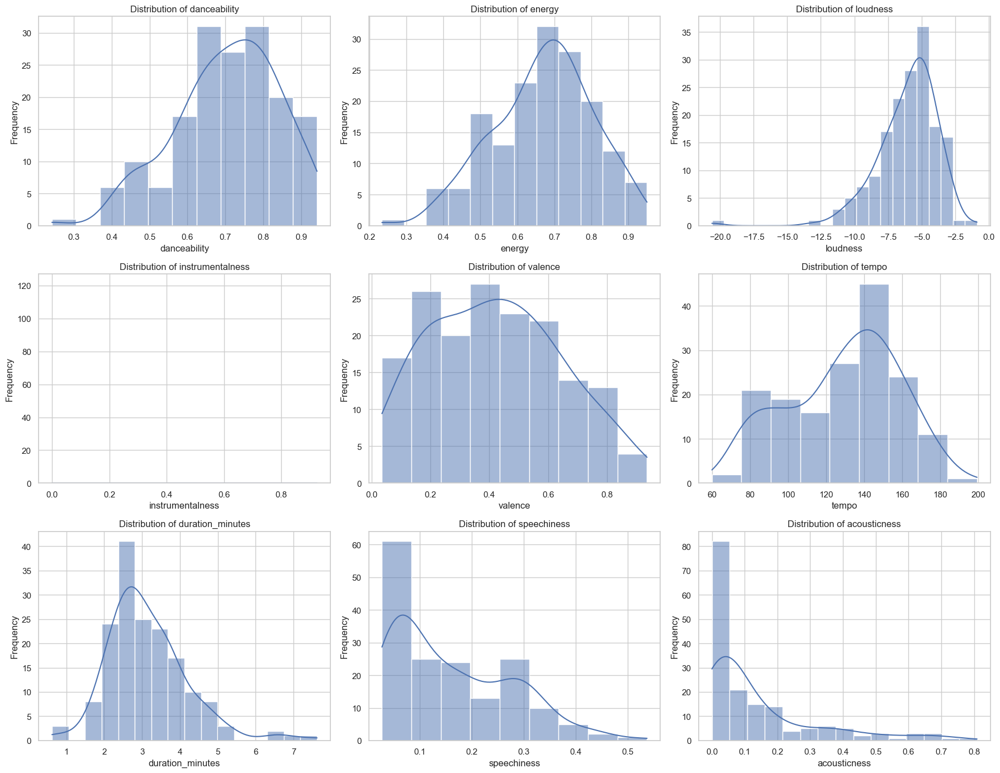

In [933]:
fig, axes = plt.subplots(3, 3, figsize=(18, 14))

axes = axes.flatten()

for i, feature in enumerate(house_features):
    sns.histplot(rap_tracks_2024[feature], kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()

plt.show()

## Artist Popularity and Followers
### Artist Popularity:
* The mean artist popularity is 83.7, indicating that the dataset includes generally popular artists.
* The range is from 66 to 96, meaning the least popular artist still has a high popularity score.
### Artist Followers:
* The mean number of followers is around 21 million, with a large standard deviation of 30 million, indicating a high variance in the number of followers.
* The number of followers ranges from 121,221 to 91.8 million, which shows a wide distribution in artist reach.
## Track Duration
### Duration:
* The average track duration is 3.15 minutes, aligning with typical modern music track lengths.
* Track durations range from 0.62 minutes (short) to 7.62 minutes (long).
* The 25th percentile is 2.46 minutes and the 75th percentile is 3.72 minutes, indicating that most tracks fall between these two values.
## Track Popularity
### Popularity:
* The mean track popularity is 73.7, suggesting that most tracks in the dataset are quite popular.
* The lowest track popularity is 30, while the highest is 95. This wide range suggests the inclusion of both moderately popular and very popular tracks.
## General Observations
* The dataset seems to contain a broad range of popular tracks from well-known artists.
* Most tracks are high-energy and danceable, with a significant electronic production (low acousticness and instrumentalness).
* There is a wide variety in tempo, allowing for both slower and faster songs.
* Lyrical content is present in most tracks (low instrumentalness), with minimal speech-dominated tracks (low speechiness).

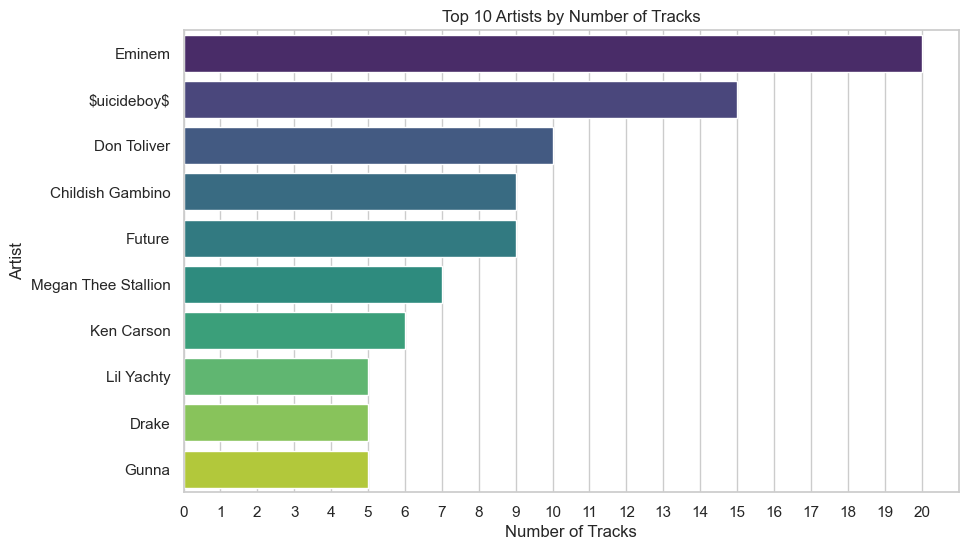

In [281]:
top_10_artists = rap_tracks_2024.groupby('artist')['title'].size().sort_values(ascending=False).head(10)

top_10_artists.index = [artist.replace('$', r'\$') for artist in top_10_artists.index]

plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_artists.values, y=top_10_artists.index, palette='viridis')

plt.xlabel('Number of Tracks')
plt.ylabel('Artist')
plt.title('Top 10 Artists by Number of Tracks')

plt.xticks(ticks=range(0, 21, 1))

plt.show()

#### Eminem leads with 20 tracks, followed by suicideboys with 15 tracks. 
#### Don Toliver has 10 tracks, while Childish Gambino and Future both have 9 tracks each. 
#### Other artists in the list include Megan Thee Stallion (7 tracks), Ken Carson (6 tracks), and Lil Yachty, Drake, and Gunna, each with 5 tracks.
### I will investigate the artists that have more than 9 tracks for duplicates 

In [283]:
top_10_artist_tracks = rap_tracks_2024[rap_tracks_2024['artist'].isin(top_10_artists.index)]

tracks_by_top_10_artists = top_10_artist_tracks.groupby('artist')['title'].apply(list)

for artist, tracks in tracks_by_top_10_artists.items():
    print(f"{artist}:")
    for track in tracks:
        print(f"  - {track}")
    print("\n")

Childish Gambino:
  - Lithonia
  - Lithonia
  - In The Night (feat. Jorja Smith & Amaarae)
  - Steps Beach
  - Yoshinoya
  - Talk My Shit (feat. Amaarae & Flo Milli)
  - Real Love
  - Survive (feat. Chlöe)
  - H3@RT$ W3RE M3@NT T0 F7¥


Don Toliver:
  - TORE UP
  - BANDIT
  - BANDIT
  - BROTHER STONE (FEAT. KODAK BLACK)
  - NEW DROP
  - ATTITUDE (FEAT. CHARLIE WILSON & CASH COBAIN)
  - KRYPTONITE
  - ATTITUDE (FEAT. CHARLIE WILSON & CASH COBAIN)
  - ICE AGE (FEAT. TRAVIS SCOTT)
  - BROTHER STONE (FEAT. KODAK BLACK)


Drake:
  - It's Up (feat. Young Thug & 21 Savage)
  - Push Ups
  - Family Matters
  - Blue Green Red
  - Housekeeping Knows (feat. Latto)


Eminem:
  - Houdini
  - Fuel
  - Somebody Save Me
  - Houdini
  - Habits
  - Renaissance
  - Brand New Dance
  - Tobey (feat. Big Sean and BabyTron)
  - Tobey (feat. Big Sean and BabyTron)
  - Evil
  - Trouble
  - Lucifer
  - Antichrist
  - Guilty Conscience 2
  - Temporary
  - Road Rage
  - Bad One
  - Head Honcho
  - Breaking News - 

### As suspected, there are duplicates for every artist

In [285]:
rap_tracks_2024_clean = rap_tracks_2024.drop_duplicates(subset=['artist', 'title'])

print(f"Number of tracks before removing duplicates: {rap_tracks_2024.shape[0]}")
print(f"Number of tracks after removing duplicates: {rap_tracks_2024_clean.shape[0]}")

Number of tracks before removing duplicates: 166
Number of tracks after removing duplicates: 148


### Successfully dropped duplicates from the dataframe, will visualize the artist and track entries again

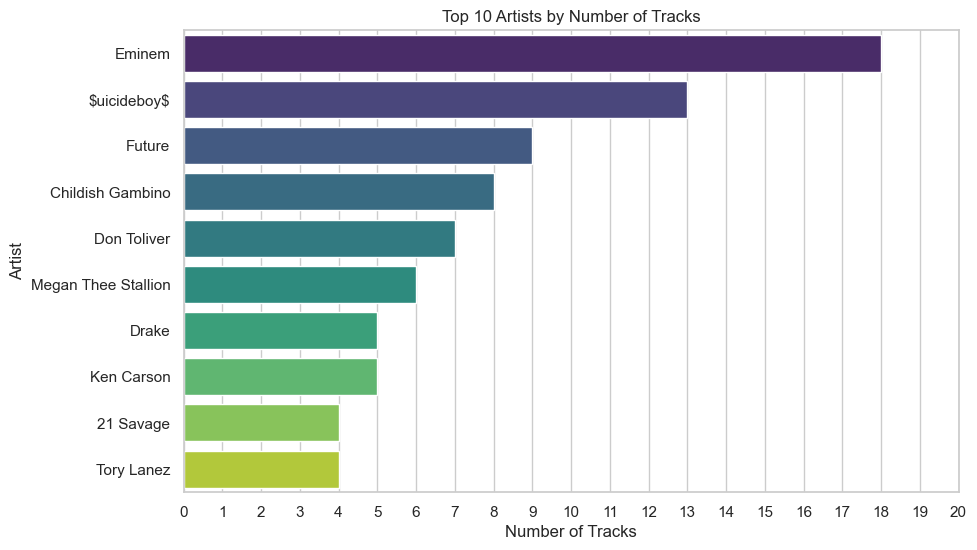

In [287]:
top_10_artists = rap_tracks_2024_clean.groupby('artist')['title'].size().sort_values(ascending=False).head(10)

top_10_artists.index = [artist.replace('$', r'\$') for artist in top_10_artists.index]

plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_artists.values, y=top_10_artists.index, palette='viridis')

plt.xlabel('Number of Tracks')
plt.ylabel('Artist')
plt.title('Top 10 Artists by Number of Tracks')

plt.xticks(ticks=range(0, 21, 1))

plt.show()

### Artist with many tracks are from Album tracks rather than from singles compared to house tracks and reggaeton tracks
### Eminen, one of the best rappers of all time just dropped a new album
### Suicideboys are an independant rap/hip hop duo classified as punk rap, and trap metal 

In [295]:
rap_tracks_2024_clean.sort_values(by=['track_popularity'], ascending=False).head(10)

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,title_artist
2,2YZyLoL8N0Wb9xBt1NhZWg,Kendrick Lamar,92,32831553,6AI3ezQ4o3HUoP6Dhudph3,Not Like Us,4.57,"['conscious hip hop', 'hip hop', 'rap', 'west ...",95,0.898,...,0.01070,0.000000,0.1410,0.214,101.061,audio_features,spotify:track:6AI3ezQ4o3HUoP6Dhudph3,https://api.spotify.com/v1/tracks/6AI3ezQ4o3HU...,https://api.spotify.com/v1/audio-analysis/6AI3...,Not Like Us - Kendrick Lamar
18,4nVa6XlBFlIkF6msW57PHp,Hanumankind,77,451050,0OA00aPt3BV10qeMIs3meW,Big Dawgs,3.18,"['desi hip hop', 'indian underground rap', 'ma...",92,0.464,...,0.02350,0.000000,0.3630,0.262,180.098,audio_features,spotify:track:0OA00aPt3BV10qeMIs3meW,https://api.spotify.com/v1/tracks/0OA00aPt3BV1...,https://api.spotify.com/v1/audio-analysis/0OA0...,Big Dawgs - Hanumankind
581,2x7PC78TmgqpEIjaGAZ0Oz,Trueno,82,7469721,1pymWRCuZfCd0zdiBJo0Hj,REAL GANGSTA LOVE,2.42,"['argentine hip hop', 'bases de freestyle', 't...",90,0.831,...,0.38800,0.000069,0.3740,0.570,97.013,audio_features,spotify:track:1pymWRCuZfCd0zdiBJo0Hj,https://api.spotify.com/v1/tracks/1pymWRCuZfCd...,https://api.spotify.com/v1/audio-analysis/1pym...,REAL GANGSTA LOVE - Trueno
30,7tYKF4w9nC0nq9CsPZTHyP,SZA,90,23055294,1bjeWoagtHmUKputLVyDxQ,Saturn,3.10,"['pop', 'r&b', 'rap']",89,0.411,...,0.62000,0.000000,0.1100,0.337,177.937,audio_features,spotify:track:1bjeWoagtHmUKputLVyDxQ,https://api.spotify.com/v1/tracks/1bjeWoagtHmU...,https://api.spotify.com/v1/audio-analysis/1bje...,Saturn - SZA
106,1Yj5Xey7kTwvZla8sqdsdE,Cris Mj,87,3647708,5Uptvz6j1sjDKxidAcnH2L,SI NO ES CONTIGO,2.60,"['mambo chileno', 'trap latino', 'urbano chile...",89,0.763,...,0.08590,0.225000,0.2050,0.780,100.020,audio_features,spotify:track:5Uptvz6j1sjDKxidAcnH2L,https://api.spotify.com/v1/tracks/5Uptvz6j1sjD...,https://api.spotify.com/v1/audio-analysis/5Upt...,SI NO ES CONTIGO - Cris Mj
47,7dGJo4pcD2V6oG8kP0tJRR,Eminem,93,90172070,2HYFX63wP3otVIvopRS99Z,Houdini,3.79,"['detroit hip hop', 'hip hop', 'rap']",89,0.936,...,0.02920,0.000002,0.0582,0.889,127.003,audio_features,spotify:track:2HYFX63wP3otVIvopRS99Z,https://api.spotify.com/v1/tracks/2HYFX63wP3ot...,https://api.spotify.com/v1/audio-analysis/2HYF...,Houdini - Eminem
35,181bsRPaVXVlUKXrxwZfHK,Megan Thee Stallion,84,9755401,5b3XJ1pjrHO5JtY2PcTjnI,Mamushi (feat. Yuki Chiba),2.62,"['houston rap', 'pop', 'rap', 'trap queen']",88,0.892,...,0.03300,0.000000,0.0824,0.209,81.036,audio_features,spotify:track:5b3XJ1pjrHO5JtY2PcTjnI,https://api.spotify.com/v1/tracks/5b3XJ1pjrHO5...,https://api.spotify.com/v1/audio-analysis/5b3X...,Mamushi (feat. Yuki Chiba) - Megan Thee Stallion
14,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,2tudvzsrR56uom6smgOcSf,Like That,4.46,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",88,0.814,...,0.00709,0.000013,0.1190,0.312,162.012,audio_features,spotify:track:2tudvzsrR56uom6smgOcSf,https://api.spotify.com/v1/tracks/2tudvzsrR56u...,https://api.spotify.com/v1/audio-analysis/2tud...,Like That - Future
58,0VRj0yCOv2FXJNP47XQnx5,Quavo,80,7568709,22DH8NChecsgPxDjA4pqer,Tough,3.15,"['atl hip hop', 'melodic rap', 'rap', 'trap']",87,0.582,...,0.45200,0.000019,0.1210,0.211,84.989,audio_features,spotify:track:22DH8NChecsgPxDjA4pqer,https://api.spotify.com/v1/tracks/22DH8NChecsg...,https://api.spotify.com/v1/audio-analysis/22DH...,Tough - Quavo
40,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,28drn6tQo95MRvO0jQEo5C,Type Shit,3.80,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",87,0.640,...,0.02150,0.000000,0.1190,0.112,144.941,audio_features,spotify:track:28drn6tQo95MRvO0jQEo5C,https://api.spotify.com/v1/tracks/28drn6tQo95M...,https://api.spotify.com/v1/audio-analysis/28dr...,Type Shit - Future


### Top 10 songs  by track popularity show Kendrick Lamar with the his Drake Diss trake on the top with a popularity of 95
### Second place with a track popularity of 92 is Hanumankind who has the lowest artist popularity of 77 which is the lowest out of the top 10 tracks by highest track popularity 
### There are some spanish rap songs within the the top 10 tracks showing how popular spanish rap is 

In [298]:
rap_tracks_2024_clean['artist'].nunique()

57

### There are 57 unique artist in this rap dataframe

In [301]:
rap_tracks_2024_clean['artist'].unique()

array(['Kendrick Lamar', 'Future', 'Hanumankind', 'SZA',
       'Megan Thee Stallion', 'Gunna', 'Eminem', 'Quavo', '21 Savage',
       'Bryson Tiller', 'mgk', 'Drake', 'Cris Mj', 'Lil Yachty',
       'Moneybagg Yo', 'Yeat', 'Ken Carson', 'Mustard', 'NLE Choppa',
       'Sexyy Red', 'Shoreline Mafia', '$uicideboy$', 'Don Toliver',
       'Childish Gambino', 'Flo Milli', 'A$AP Rocky', 'Lil Tecca',
       'PARTYNEXTDOOR', 'That Mexican OT', 'Young Miko', 'G-Eazy',
       'J. Cole', 'bbno$', 'Tory Lanez', 'Alvaro Diaz', 'Trueno',
       'Kehlani', 'El Alfa', 'Young Nudy', 'DJ Snake', 'Chris Brown',
       'Cordae', 'Denzel Curry', 'Trippie Redd', 'NAV', 'J Abdiel',
       'Cardi B', 'Veeze', 'Jeremih', 'Joey Valence & Brae', 'Big Sean',
       'Sleepy Hallow', 'Tom MacDonald', 'Omar Courtz', 'iZaak', 'Polo G',
       'Internet Money'], dtype=object)

### Dj Snake is a DJ, will investigate what track is by this artist

In [304]:
rap_tracks_2024_clean[rap_tracks_2024_clean['artist'] == 'DJ Snake']

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,title_artist
665,540vIaP2JwjQb9dm3aArA4,DJ Snake,79,8835897,555maXFEF9m0lE4UGRzCHk,Teka (with Peso Pluma),2.73,"['dance pop', 'edm', 'electronic trap', 'pop',...",78,0.863,...,0.014,0.0102,0.117,0.601,126.105,audio_features,spotify:track:555maXFEF9m0lE4UGRzCHk,https://api.spotify.com/v1/tracks/555maXFEF9m0...,https://api.spotify.com/v1/audio-analysis/555m...,Teka (with Peso Pluma) - DJ Snake


### The above song is not rap/hip hop at all , will drop from dataframe

In [307]:
rap_tracks_2024_clean = rap_tracks_2024_clean[rap_tracks_2024_clean['artist'] != 'DJ Snake']

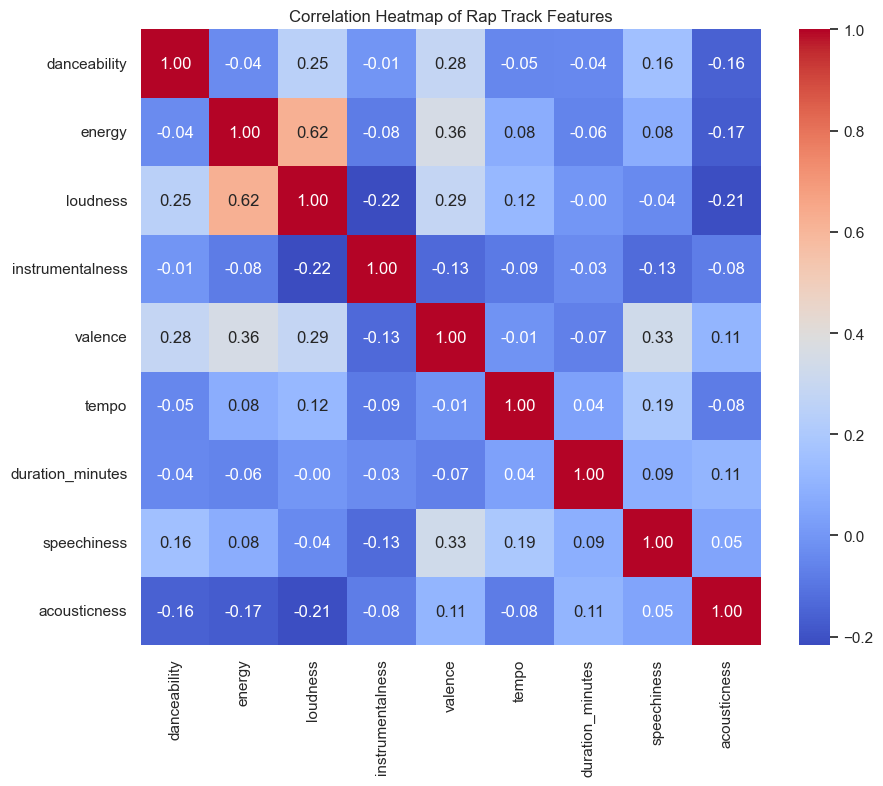

In [309]:
rap_tracks_2024_clean_correlation = rap_tracks_2024_clean[house_features].corr()

# Set up the figure and axis
plt.figure(figsize=(10, 8))

# Create a heatmap using seaborn
sns.heatmap(rap_tracks_2024_clean_correlation, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)

# Set the title for the heatmap
plt.title('Correlation Heatmap of Rap Track Features')

# Display the heatmap
plt.show()

### The rap dataframe has the least possitive correlations between features compared to the reggaeton and house dataframe

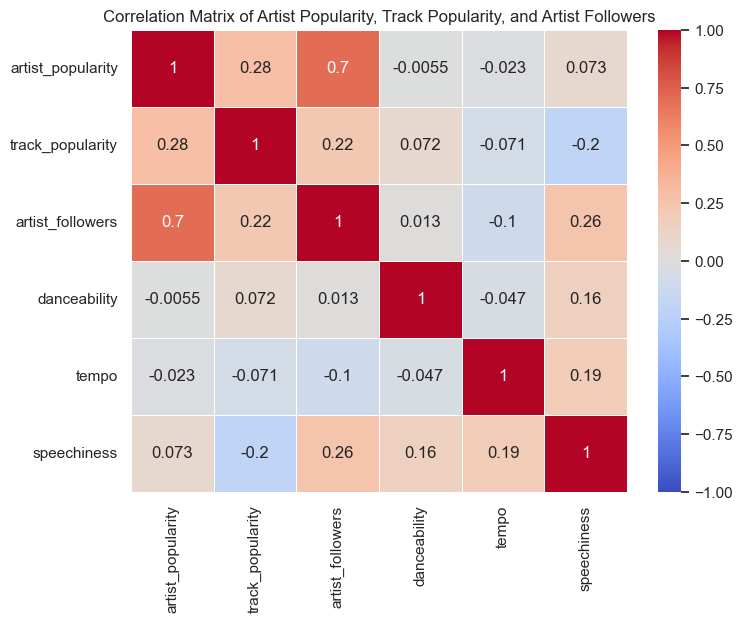

In [312]:
rap_correlation_data = rap_tracks_2024_clean[['artist_popularity', 'track_popularity', 'artist_followers', 'danceability', 'tempo', 'speechiness']]

correlation_matrix_reggaeton = rap_correlation_data.corr()

plt.figure(figsize=(8, 6))

sns.heatmap(correlation_matrix_reggaeton, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)

plt.title("Correlation Matrix of Artist Popularity, Track Popularity, and Artist Followers")

plt.show()

### Very low possitive correlations again compared to the other dataframes
### Rap music popularity is not so correlated with feautres 

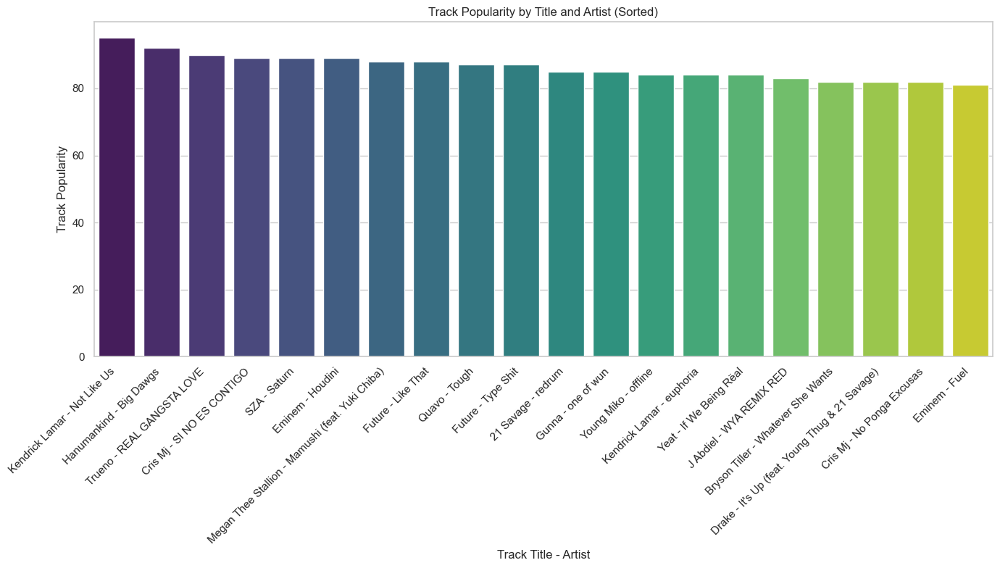

In [318]:
rap_tracks_2024_clean['title_artist'] = rap_tracks_2024_clean['artist'] + ' - ' + rap_tracks_2024_clean['title']

rap_tracks_2024_sorted = rap_tracks_2024_clean.sort_values('track_popularity', ascending=False).head(20)

plt.figure(figsize=(14, 8))
sns.barplot(x='title_artist', y='track_popularity', data=rap_tracks_2024_sorted, palette="viridis")
plt.xticks(rotation=45, ha='right')
plt.title('Track Popularity by Title and Artist (Sorted)')
plt.xlabel('Track Title - Artist')
plt.ylabel('Track Popularity')

plt.tight_layout()

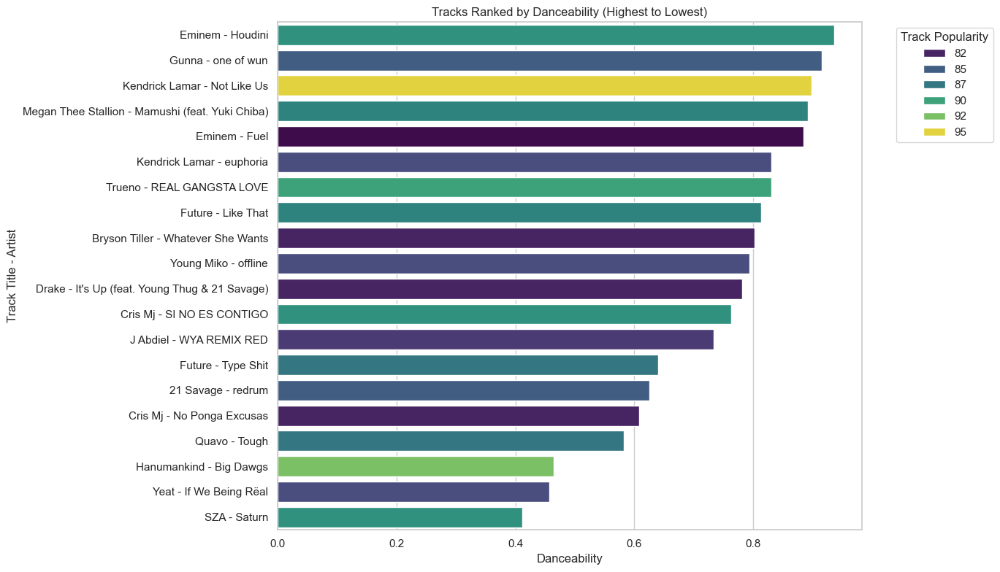

In [332]:
rap_tracks_2024_sorted = rap_tracks_2024_sorted.sort_values(by='danceability', ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(x='danceability', y='title_artist', data=rap_tracks_2024_sorted, palette='viridis', hue='track_popularity', dodge=False)

plt.title('Tracks Ranked by Danceability (Highest to Lowest)')
plt.xlabel('Danceability')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

## Insights from Danceability Visualization:
### Danceability Leaders:
* Eminem - Houdini and Gunna - one of wun rank the highest in danceability. Both tracks seem optimized for movement, making them excellent choices for dance-heavy environments.
* Kendrick Lamar - Not Like Us also scores high in danceability despite having lower energy and valence, indicating it may have a catchy rhythm, even though its overall mood is more subdued.
* Megan Thee Stallion - Mamushi appears to strike a balance between danceability and popularity, making it a track that could attract listeners for both its rhythm and chart performance.

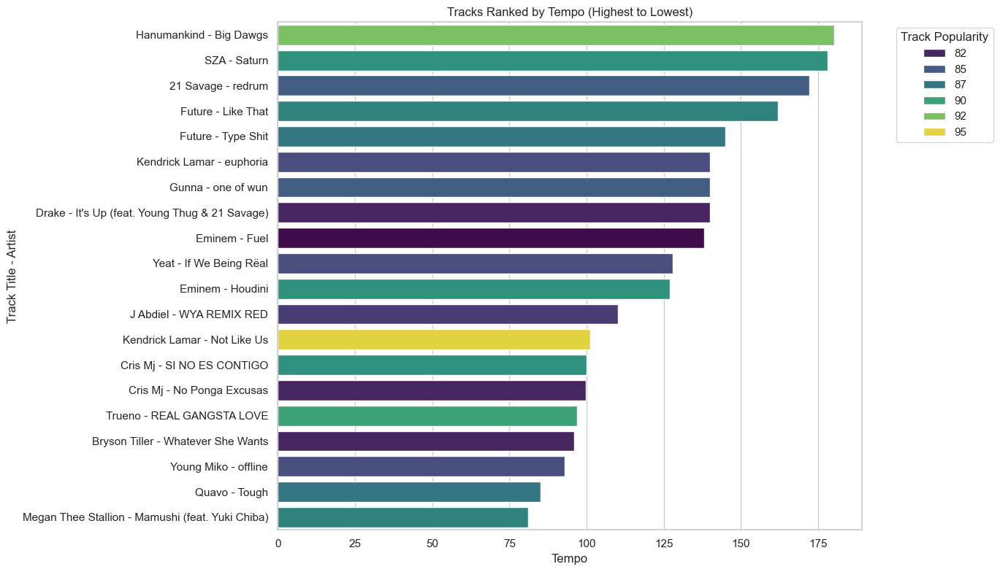

In [334]:
rap_tracks_2024_sorted = rap_tracks_2024_sorted.sort_values(by='tempo', ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='tempo', 
    y='title_artist', 
    data=rap_tracks_2024_sorted, 
    palette='viridis', 
    order=rap_tracks_2024_sorted['title_artist'],
    hue='track_popularity'
)

plt.title('Tracks Ranked by Tempo (Highest to Lowest)')
plt.xlabel('Tempo')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

### Comparison with Tempo Insights:
* Tracks with high tempo like Hanumankind - Big Dawgs and 21 Savage - redrum:
* While Hanumankind - Big Dawgs had the highest tempo, its danceability is mid-range, suggesting the fast pace may make it more suited to high-energy settings rather than dance-focused ones.
* 21 Savage - redrum, which has high tempo, is placed lower in danceability, showing that even with a fast pace, it might not be as suited for dancing as the top-ranked tracks.
* Tracks with lower tempo, such as Megan Thee Stallion - Mamushi and Quavo - Tough, still rank relatively high in danceability. 
* This implies that even with a more relaxed tempo, they can maintain a rhythm that appeals to dancers. 
* This could indicate the influence of other elements like beats or instrumental layers that boost danceability despite slower tempos.

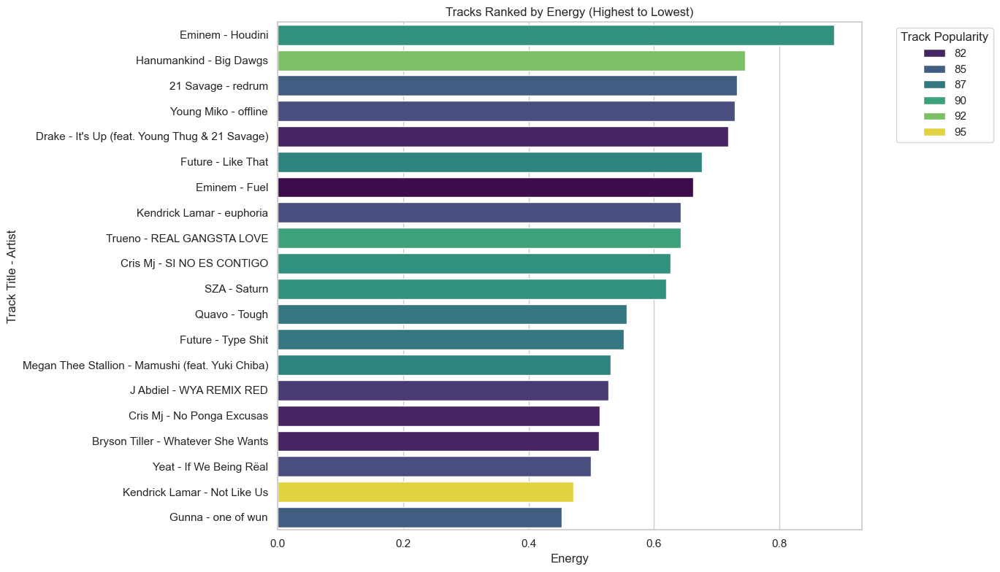

In [338]:
rap_tracks_2024_sorted = rap_tracks_2024_sorted.sort_values(by='energy', ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='energy', 
    y='title_artist', 
    data=rap_tracks_2024_sorted, 
    palette='viridis', 
    order=rap_tracks_2024_sorted['title_artist'],
    hue='track_popularity'
)

plt.title('Tracks Ranked by Energy (Highest to Lowest)')
plt.xlabel('Energy')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')


plt.tight_layout()
plt.show()

## Comparison with Energy Insights:
* Eminem - Houdini ranked highest in energy, and this aligns with its high danceability, indicating a track that is both high-energy and rhythmically engaging.
* Hanumankind - Big Dawgs, with both high energy and tempo, has moderate danceability, suggesting that its intensity might not translate as effectively into danceable rhythm as the higher-ranked tracks.
* Kendrick Lamar - Not Like Us contrasts sharply, as it ranks low in energy yet very high in danceability, reinforcing that even tracks with lower energy can have a strong rhythmic appeal for dance.

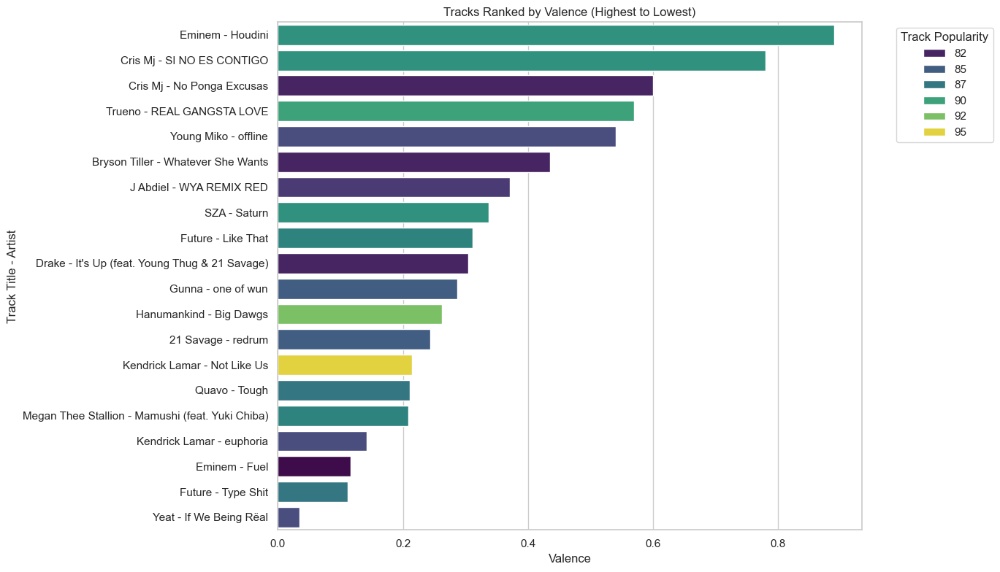

In [340]:
rap_tracks_2024_sorted = rap_tracks_2024_sorted.sort_values(by='valence', ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='valence', 
    y='title_artist', 
    data=rap_tracks_2024_sorted, 
    palette='viridis', 
    order=rap_tracks_2024_sorted['title_artist'],
    hue='track_popularity'
)

plt.title('Tracks Ranked by Valence (Highest to Lowest)')
plt.xlabel('Valence')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

## Comparison with Valence Insights:
* Eminem - Houdini and Cris Mj - SI NO ES CONTIGO both exhibit high valence, and this matches their relatively high danceability scores. High valence (positive tone) often pairs well with tracks designed for dancing and movement.
* Yeat - If We Being Réal and Future - Type Shit have low valence but are still placed mid-tier for danceability.
* This shows that tracks with darker or more serious emotional tones can still engage listeners in a rhythmic way, even if the overall vibe is more introspective.

## General Comparison and Insights:
### Eminem - Houdini continues to show strong presence across multiple features, such as energy, valence, and danceability, making it a highly dynamic track that works in both emotional and movement contexts.
### Kendrick Lamar - Not Like Us consistently stands out for its complexity. Despite lower energy and valence, it remains highly danceable, indicating that it can engage listeners rhythmically without relying on a positive or high-energy mood.
### Hanumankind - Big Dawgs seems to be more suited for high-energy settings (based on tempo and energy) rather than dancing, as it ranks lower in danceability despite its high intensity.
## Conclusion:
### The comparison across these tracks highlights that danceability isn't always tied directly to high tempo or energy. 
### Some tracks, like Kendrick Lamar's, manage to rank highly in danceability with lower energy or mood 
### while others like Eminem - Houdini show consistent strength across all metrics, making them versatile in different settings.

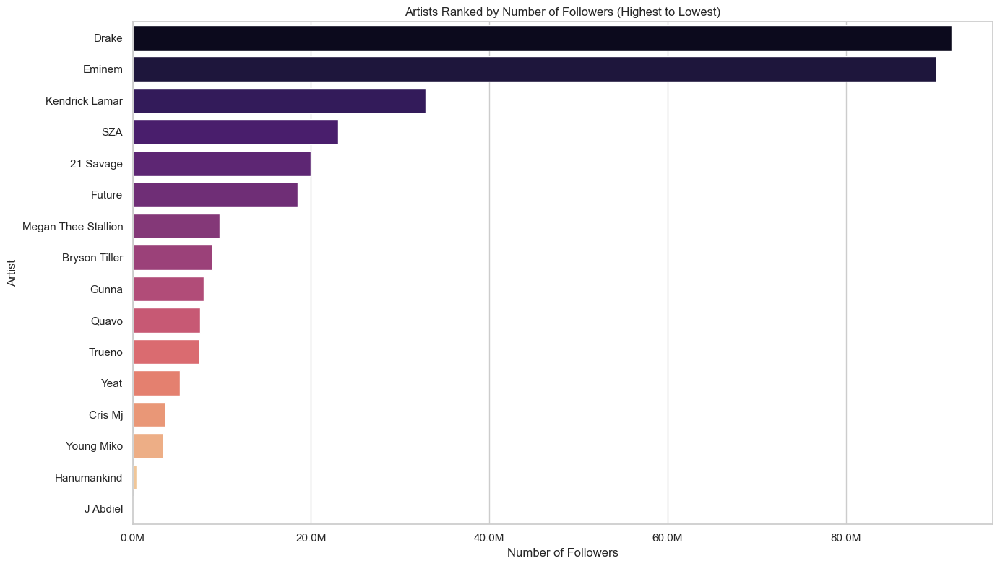

In [354]:
rap_tracks_2024_sorted_by_followers = rap_tracks_2024_sorted.sort_values(by='artist_followers', ascending=False)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='artist_followers', 
    y='artist', 
    data=rap_tracks_2024_sorted_by_followers, 
    palette='magma'
)

plt.title('Artists Ranked by Number of Followers (Highest to Lowest)')
plt.xlabel('Number of Followers')
plt.ylabel('Artist')

formatter = mticker.FuncFormatter(lambda x, pos: f'{x/1e6:.1f}M')
plt.gca().xaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()

### There is a huge difference in number of followers with Drake and Eminem having more than 80 million
### while the rest fall under 40 million, more thab half less than the top 2

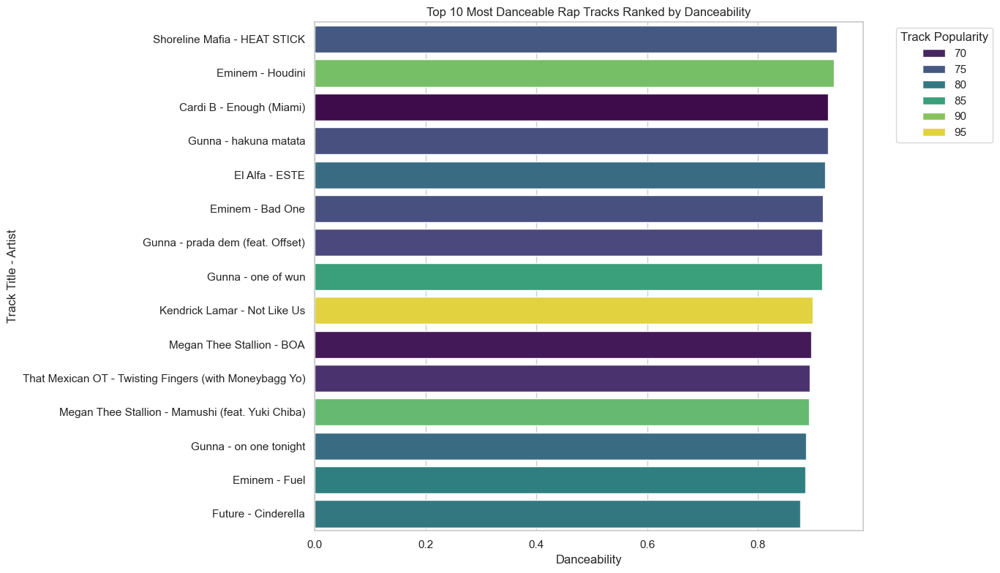

In [376]:
top_danceable_tracks_rap = rap_tracks_2024_clean.sort_values(by='danceability', ascending=False).head(15)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='danceability', 
    y='title_artist', 
    data=top_danceable_tracks_rap, 
    palette='viridis', 
    hue='track_popularity'
)

plt.title('Top 10 Most Danceable Rap Tracks Ranked by Danceability')
plt.xlabel('Danceability')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

### Above shows the most danceable rap tracks in the rap dataframe
### Eminem and Gunna have the most entries in the top 15 

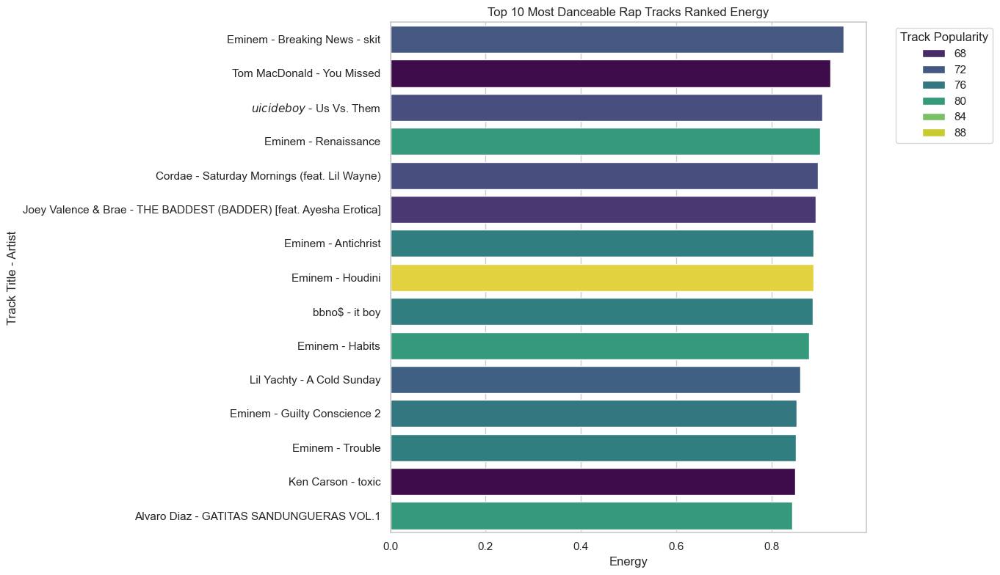

In [380]:
top_energetic_tracks_rap = rap_tracks_2024_clean.sort_values(by='energy', ascending=False).head(15)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='energy', 
    y='title_artist', 
    data=top_energetic_tracks_rap, 
    palette='viridis', 
    hue='track_popularity'
)

plt.title('Top 10 Most Danceable Rap Tracks Ranked Energy')
plt.xlabel('Energy')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

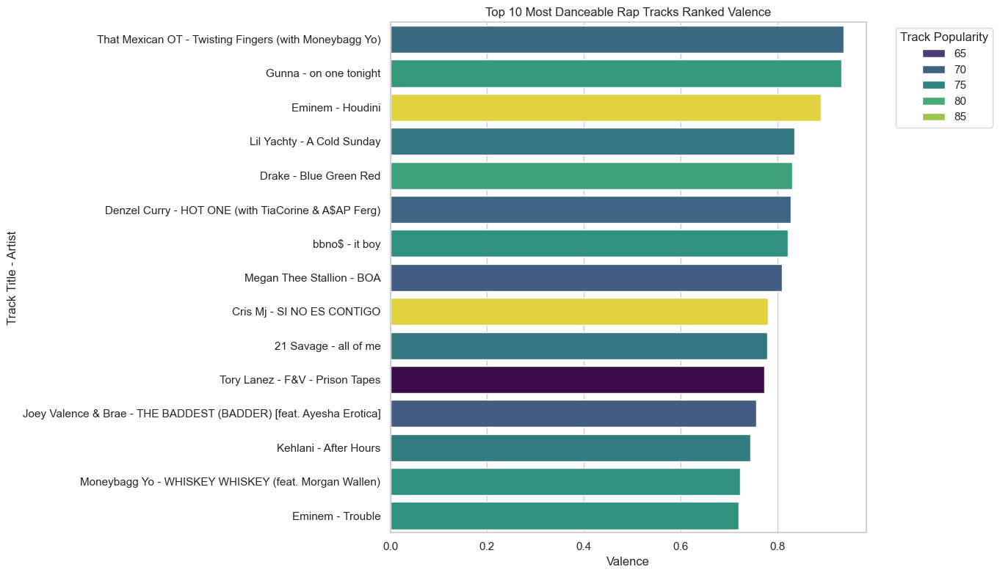

In [883]:
top_valence_tracks_rap = rap_tracks_2024_clean.sort_values(by='valence', ascending=False).head(15)

plt.figure(figsize=(14, 8))
sns.barplot(
    x='valence', 
    y='title_artist', 
    data=top_valence_tracks_rap, 
    palette='viridis', 
    hue='track_popularity'
)

plt.title('Top 10 Most Danceable Rap Tracks Ranked Valence')
plt.xlabel('Valence')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

## Top Valence tracks does not show Eminem tracks as much as danceability and energy

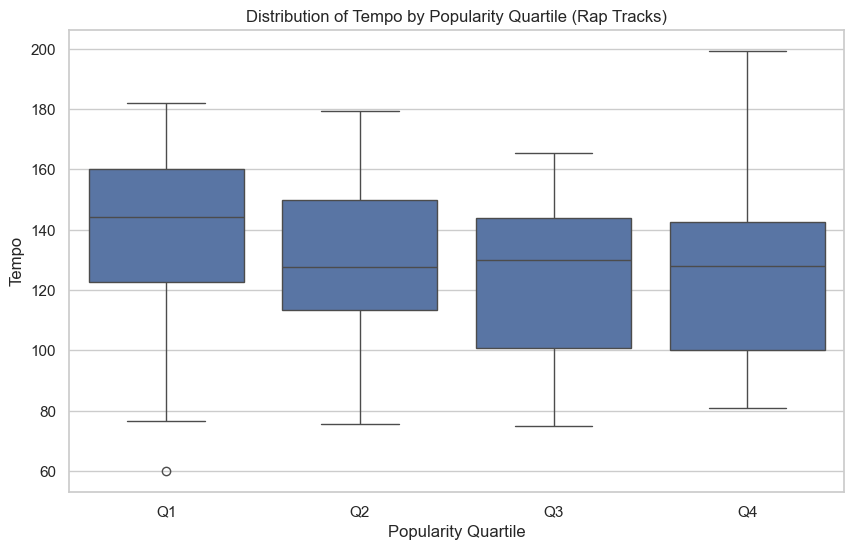

In [387]:
rap_tracks_2024_clean['popularity_quartile'] = pd.qcut(rap_tracks_2024_clean['track_popularity'], 4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
plt.figure(figsize=(10, 6))
sns.boxplot(x='popularity_quartile', y='tempo', data=rap_tracks_2024_clean)
plt.title('Distribution of Tempo by Popularity Quartile (Rap Tracks)')
plt.xlabel('Popularity Quartile')
plt.ylabel('Tempo')
plt.show()

## Tempo Spread Across Quartiles:
### Q1 (Highest Popularity): 
* The tempo in this quartile has the largest range, extending from around 80 BPM to over 180 BPM, indicating a wide diversity of tempo for the most popular rap tracks.
### Q2: 
* The tempo range is slightly narrower, but the median tempo is higher than in Q1. The upper quartile tracks seem to cluster above 140 BPM.
### Q3 and Q4 (Lower Popularity): 
* These quartiles show a further narrowing of tempo distribution, with the median tempo shifting slightly lower (around 120–130 BPM). There's still a broad range, but less than in Q1.
### Outliers:
* There’s a noticeable outlier in Q1, with a tempo near 60 BPM. This suggests that there may be some highly popular tracks that feature slower tempos, breaking away from the general trend of faster tempos.
### Median Tempo:
* Across the quartiles, the median tempo decreases slightly from Q1 to Q4, indicating that the most popular tracks tend to have faster tempos.
### Consistency:
* Q1 has the broadest variation, suggesting that popular rap tracks can vary more widely in tempo.
* In contrast, Q3 and Q4 have narrower interquartile ranges, suggesting that less popular tracks may be more consistent in tempo.
## Conclusion:
## The most popular rap tracks (Q1) show a wider diversity in tempo, including both very fast and slow tracks, whereas lower popularity tracks (Q3 and Q4) seem to cluster more around a typical rap tempo range (100–140 BPM).

# Rap Music Summary Analysis:
## Artist Popularity and Followers:
### • The mean artist popularity is 83.7, highlighting the overall prominence of the artists in this dataset. 
### • The popularity scores range from 66 to 96, showing that even the least popular artists are still relatively well-known.
### • The average number of followers per artist is 21 million, though this comes with a high standard deviation of 30 million, illustrating a wide variance in artist reach. 
### • The number of followers ranges from 121,221 to 91.8 million, indicating both independent artists with smaller followings and globally famous figures.
##  Track Duration:
### • The average track duration is 3.15 minutes, which aligns with the typical length of modern music tracks. 
### • Track lengths range from very short (0.62 minutes) to much longer (7.62 minutes), suggesting a mix of singles, album interludes, and more extended tracks.
### • Most tracks fall between 2.46 and 3.72 minutes, implying that listeners prefer songs of moderate length that cater to streaming platforms.
## Track Popularity:
### • The mean track popularity is 73.7, with individual track popularity scores ranging from 30 to 95. 
### • This wide distribution reflects the presence of both moderately popular tracks and chart-topping hits.
### • Popular tracks tend to combine catchy hooks, rhythmic beats, and lyrical content that resonates with a wide audience.
## General Observations:
### • Most tracks in the dataset have high energy and danceability, often featuring electronic production with low acoustic and instrumental elements. 
### • This suggests the dominance of contemporary rap styles such as trap and electronic-influenced hip hop.
### • A wide variety in tempo allows for both slow and fast tracks, with a strong focus on lyrical content (low instrumentalness) and minimal speech-dominated tracks (low speechiness).
## Artist Trends:
### • Artists with a large number of tracks typically feature album content rather than standalone singles, highlighting the importance of cohesive projects in rap, compared to other genres like house or reggaeton.
### • Eminem, considered one of the greatest rappers of all time, just released a new album, further cementing his legacy.
### • Suicideboys, an independent duo, are classified as punk rap and trap metal, showing the genre’s ability to fuse with alternative and underground styles.
## Danceability Insights:
### • Eminem and Gunna rank the highest in danceability, with tracks like "Houdini" and "one of wun" optimized for movement, while Kendrick Lamar’s "Not Like Us" is danceable despite its lower energy, indicating rhythmic complexity.
### • Megan Thee Stallion balances both popularity and danceability with tracks like "Mamushi," showing that more relaxed tempos can still appeal to dancers.
## Tempo, Energy, and Valence (Positivity):
### • Tracks with high tempo, such as Hanumankind’s "Big Dawgs," are more suited for high-energy settings but may not rank as high in danceability.
### • Energy levels vary by artist and track style. Eminem’s "Houdini" scores high in energy and aligns with its high danceability, while Kendrick Lamar's "Not Like Us" shows that lower-energy tracks can still have rhythmic appeal.
### • High valence tracks like "Houdini" exhibit a positive, upbeat tone, while lower-valence tracks, such as Yeat's "If We Being Real," still attract listeners with their introspective mood.
## Artist and Collaboration Trends:
### • Eminem and Gunna are consistently strong performers across metrics like danceability, energy, and popularity. Eminem, in particular, has multiple tracks like "Houdini," "Bad One," and "Fuel" ranking highly.
### • Collaborations, such as Gunna featuring Offset and Megan Thee Stallion featuring Yuki Chiba, boost both danceability and popularity, indicating the power of star pairings.
## Conclusion:
### The insights from this dataset demonstrate that popularity in rap is driven by a delicate balance of features such as danceability, energy, and emotional tone (valence). 
### While high energy and tempo often attract attention, danceability remains a key factor, especially for more mainstream success. Eminem and Gunna excel across these features, proving their versatility as artists. 
### Meanwhile, rising artists like Hanumankind show that the rap scene continues to diversify, with both fast-paced tracks and slower, moodier songs gaining traction.
### Additionally, the dataset highlights how album content plays a significant role in artist reach and success, with tracks from albums performing better than singles. 
### Independent and genre-blending artists like Suicideboys push the boundaries of rap, further showcasing the genre's versatility. 
### With the inclusion of Spanish rap among the top 10 tracks, it's clear that rap's appeal continues to grow globally, influencing multiple cultures and styles.

In [390]:
favorite_rap_artists = ['Future', '21 Savage', 'Polo G', 'Moneybagg Yo', 'A$AP Rocky']
fav_tracks_rap = rap_tracks_2024_clean[rap_tracks_2024_clean['artist'].isin(favorite_rap_artists)]
fav_tracks_rap

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,title_artist,popularity_quartile
14,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,2tudvzsrR56uom6smgOcSf,Like That,4.46,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",88,0.814,...,0.000013,0.119,0.312,162.012,audio_features,spotify:track:2tudvzsrR56uom6smgOcSf,https://api.spotify.com/v1/tracks/2tudvzsrR56u...,https://api.spotify.com/v1/audio-analysis/2tud...,Future - Like That,Q4
40,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,28drn6tQo95MRvO0jQEo5C,Type Shit,3.80,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",87,0.640,...,0.000000,0.119,0.112,144.941,audio_features,spotify:track:28drn6tQo95MRvO0jQEo5C,https://api.spotify.com/v1/tracks/28drn6tQo95M...,https://api.spotify.com/v1/audio-analysis/28dr...,Future - Type Shit,Q4
64,1URnnhqYAYcrqrcwql10ft,21 Savage,89,19995486,52eIcoLUM25zbQupAZYoFh,redrum,4.51,"['atl hip hop', 'hip hop', 'rap']",85,0.625,...,0.000983,0.375,0.244,172.090,audio_features,spotify:track:52eIcoLUM25zbQupAZYoFh,https://api.spotify.com/v1/tracks/52eIcoLUM25z...,https://api.spotify.com/v1/audio-analysis/52eI...,21 Savage - redrum,Q4
152,3tJoFztHeIJkJWMrx0td2f,Moneybagg Yo,77,4666761,7hRLuo4QnzCsjICXUOhTE6,WHISKEY WHISKEY (feat. Morgan Wallen),2.68,"['memphis hip hop', 'rap', 'southern hip hop',...",77,0.738,...,0.000000,0.156,0.722,151.985,audio_features,spotify:track:7hRLuo4QnzCsjICXUOhTE6,https://api.spotify.com/v1/tracks/7hRLuo4QnzCs...,https://api.spotify.com/v1/audio-analysis/7hRL...,Moneybagg Yo - WHISKEY WHISKEY (feat. Morgan W...,Q3
235,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,0hKtu53OlIFXVuYkZwcn3o,Cinderella,2.83,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",80,0.876,...,0.000000,0.101,0.150,130.052,audio_features,spotify:track:0hKtu53OlIFXVuYkZwcn3o,https://api.spotify.com/v1/tracks/0hKtu53OlIFX...,https://api.spotify.com/v1/audio-analysis/0hKt...,Future - Cinderella,Q4
321,13ubrt8QOOCPljQ2FL1Kca,A$AP Rocky,85,14904354,57L5EYzCfHS7Jd58rV33lW,HIGHJACK,3.17,"['east coast hip hop', 'hip hop', 'rap']",77,0.610,...,0.000000,0.321,0.694,142.966,audio_features,spotify:track:57L5EYzCfHS7Jd58rV33lW,https://api.spotify.com/v1/tracks/57L5EYzCfHS7...,https://api.spotify.com/v1/audio-analysis/57L5...,A$AP Rocky - HIGHJACK,Q3
408,1URnnhqYAYcrqrcwql10ft,21 Savage,89,19995486,2yUzr8Sr6ldG8vmHhZwTnz,née-nah,3.68,"['atl hip hop', 'hip hop', 'rap']",76,0.681,...,0.000000,0.555,0.331,165.409,audio_features,spotify:track:2yUzr8Sr6ldG8vmHhZwTnz,https://api.spotify.com/v1/tracks/2yUzr8Sr6ldG...,https://api.spotify.com/v1/audio-analysis/2yUz...,21 Savage - née-nah,Q3
417,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,28xOPIPw0joNPwYd0asIT5,Fried (She a Vibe),3.50,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",73,0.833,...,0.000000,0.719,0.375,145.030,audio_features,spotify:track:28xOPIPw0joNPwYd0asIT5,https://api.spotify.com/v1/tracks/28xOPIPw0joN...,https://api.spotify.com/v1/audio-analysis/28xO...,Future - Fried (She a Vibe),Q2
440,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,3OxL6MuctgZp1e0zxoAZhH,Young Metro,3.42,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",74,0.716,...,0.000000,0.110,0.209,112.054,audio_features,spotify:track:3OxL6MuctgZp1e0zxoAZhH,https://api.spotify.com/v1/tracks/3OxL6MuctgZp...,https://api.spotify.com/v1/audio-analysis/3OxL...,Future - Young Metro,Q2
447,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,7sVbKoBdhXtYCEOO6qC1SN,We Still Don't Trust You,4.22,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",77,0.717,...,0.260000,0.426,0.429,109.993,audio_features,spotify:track:7sVbKoBdhXtYCEOO6qC1SN,https://api.spotify.com/v1/tracks/7sVbKoBdhXtY...,https://api.spotify.com/v1/audio-analysis/7sVb...,Future - We Still Don't Trust You,Q3


In [398]:
artist_tracks = fav_tracks_rap.groupby('artist')['title'].agg(list)

for artist, tracks in artist_tracks.items():
    print(f"{artist}: {tracks}")

21 Savage: ['redrum', 'née-nah', 'prove it', 'all of me']
A$AP Rocky: ['HIGHJACK']
Future: ['Like That', 'Type Shit', 'Cinderella', 'Fried (She a Vibe)', 'Young Metro', "We Still Don't Trust You", "We Don't Trust You", 'Everyday Hustle', 'Red Leather']
Moneybagg Yo: ['WHISKEY WHISKEY (feat. Morgan Wallen)']
Polo G: ['We Uh Shoot (feat. Lil Durk)']


### I will pick my 5 favorite tracks from the above artists

In [437]:
fav_rap_tracks = ['7sVbKoBdhXtYCEOO6qC1SN','6UTLdGOkbRPJzlU2nPvZlH', '1pnDvUuAEd6z8bKEsbAjk1', '57L5EYzCfHS7Jd58rV33lW', '7hRLuo4QnzCsjICXUOhTE6']
fav_tracks_raps = rap_tracks_2024_clean[rap_tracks_2024_clean['track_id'].isin(fav_rap_tracks)]
fav_tracks_raps

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url,title_artist,popularity_quartile
152,3tJoFztHeIJkJWMrx0td2f,Moneybagg Yo,77,4666761,7hRLuo4QnzCsjICXUOhTE6,WHISKEY WHISKEY (feat. Morgan Wallen),2.68,"['memphis hip hop', 'rap', 'southern hip hop',...",77,0.738,...,0.000000,0.156,0.722,151.985,audio_features,spotify:track:7hRLuo4QnzCsjICXUOhTE6,https://api.spotify.com/v1/tracks/7hRLuo4QnzCs...,https://api.spotify.com/v1/audio-analysis/7hRL...,Moneybagg Yo - WHISKEY WHISKEY (feat. Morgan W...,Q3
321,13ubrt8QOOCPljQ2FL1Kca,A$AP Rocky,85,14904354,57L5EYzCfHS7Jd58rV33lW,HIGHJACK,3.17,"['east coast hip hop', 'hip hop', 'rap']",77,0.610,...,0.000000,0.321,0.694,142.966,audio_features,spotify:track:57L5EYzCfHS7Jd58rV33lW,https://api.spotify.com/v1/tracks/57L5EYzCfHS7...,https://api.spotify.com/v1/audio-analysis/57L5...,A$AP Rocky - HIGHJACK,Q3
447,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,7sVbKoBdhXtYCEOO6qC1SN,We Still Don't Trust You,4.22,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",77,0.717,...,0.260000,0.426,0.429,109.993,audio_features,spotify:track:7sVbKoBdhXtYCEOO6qC1SN,https://api.spotify.com/v1/tracks/7sVbKoBdhXtY...,https://api.spotify.com/v1/audio-analysis/7sVb...,Future - We Still Don't Trust You,Q3
516,1RyvyyTE3xzB2ZywiAwp0i,Future,91,18532049,1pnDvUuAEd6z8bKEsbAjk1,We Don't Trust You,3.77,"['atl hip hop', 'hip hop', 'rap', 'southern hi...",73,0.779,...,0.000439,0.243,0.346,124.091,audio_features,spotify:track:1pnDvUuAEd6z8bKEsbAjk1,https://api.spotify.com/v1/tracks/1pnDvUuAEd6z...,https://api.spotify.com/v1/audio-analysis/1pnD...,Future - We Don't Trust You,Q2
984,6AgTAQt8XS6jRWi4sX7w49,Polo G,81,11763704,6UTLdGOkbRPJzlU2nPvZlH,We Uh Shoot (feat. Lil Durk),2.56,"['chicago rap', 'rap']",68,0.687,...,0.000000,0.177,0.624,142.996,audio_features,spotify:track:6UTLdGOkbRPJzlU2nPvZlH,https://api.spotify.com/v1/tracks/6UTLdGOkbRPJ...,https://api.spotify.com/v1/audio-analysis/6UTL...,Polo G - We Uh Shoot (feat. Lil Durk),Q1


In [439]:
fav_tracks_raps = fav_tracks_raps.reset_index(drop=True)

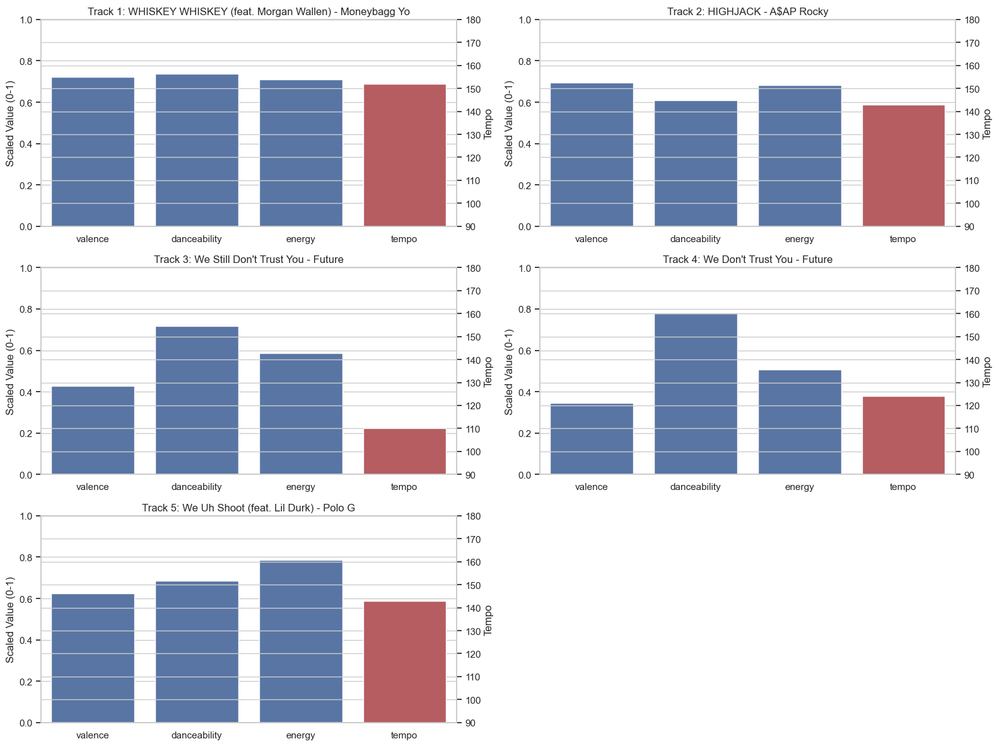

In [443]:
features = ['tempo', 'valence', 'danceability', 'energy']
min_tempo = 90
max_tempo = 180

num_tracks = len(fav_tracks_raps)

fig, axes = plt.subplots(3, 2, figsize=(16, 12)) 
axes = axes.flatten() 

for index, (i, row) in enumerate(fav_tracks_raps.iterrows()):
    if index >= 5:  
        break

    sns.barplot(x=features[1:], y=row[features[1:]].values, ax=axes[index], color='b')
    axes[index].set_ylabel('Scaled Value (0-1)')
    axes[index].set_ylim(0, 1)
    
    ax_twin = axes[index].twinx()
    sns.barplot(x=['tempo'], y=[row['tempo']], ax=ax_twin, color='r')
    ax_twin.set_ylabel('Tempo')
    ax_twin.set_ylim(min_tempo, max_tempo)
    ax_twin.set_yticks(range(min_tempo, max_tempo + 10, 10))

    track_title = row['title']
    track_artist = row['artist']
    axes[index].set_title(f'Track {index + 1}: {track_title} - {track_artist}')

axes[5].set_visible(False)  

plt.tight_layout()
plt.show()

### WHISKEY WHISKEY (feat. Morgan Wallen) - Moneybagg Yo:
* Valence, danceability, and energy are all relatively balanced around the 0.6 mark.
* Tempo is around 150 BPM, placing this track on the faster side, which aligns with its balanced energy.
### HIGHJACK - A$AP Rocky:
* Similar to “WHISKEY WHISKEY”, valence, danceability, and energy are very close to each other and slightly above 0.5.
* Tempo is also around 140 BPM, which is consistent with moderate-energy tracks.
### We Still Don’t Trust You - Future:
* Danceability is very high (0.8), while valence and energy are lower.
* Tempo is the lowest among all tracks, around 100 BPM. Despite the slower tempo, this high danceability suggests it’s an engaging, groove-based track.
### We Don’t Trust You - Future:
* Danceability spikes significantly above 0.8, with valence and energy below 0.6.
* Tempo is moderate, sitting around 130 BPM. The higher danceability with moderate energy could make it more focused on rhythm and flow.
### We Uh Shoot (feat. Lil Durk) - Polo G:
* All features—valence, danceability, and energy—are balanced, with each close to 0.6.
* Tempo is around 140 BPM, indicating a faster pace with balanced energy and danceability.

## General Observations:
* Tracks like “We Still Don’t Trust You” and “We Don’t Trust You” show a noticeable focus on danceability, despite varied energy levels.
* Tempo across all tracks varies between 100 and 150 BPM, indicating a range of both slower, groove-based tracks and faster, high-energy songs.
* Valence tends to remain moderate to low, which could suggest these tracks have a more serious, darker tone or vibe.
* Danceability stands out as a key feature in these tracks, especially in the Future tracks, indicating an emphasis on rhythm and flow over mood or energy.

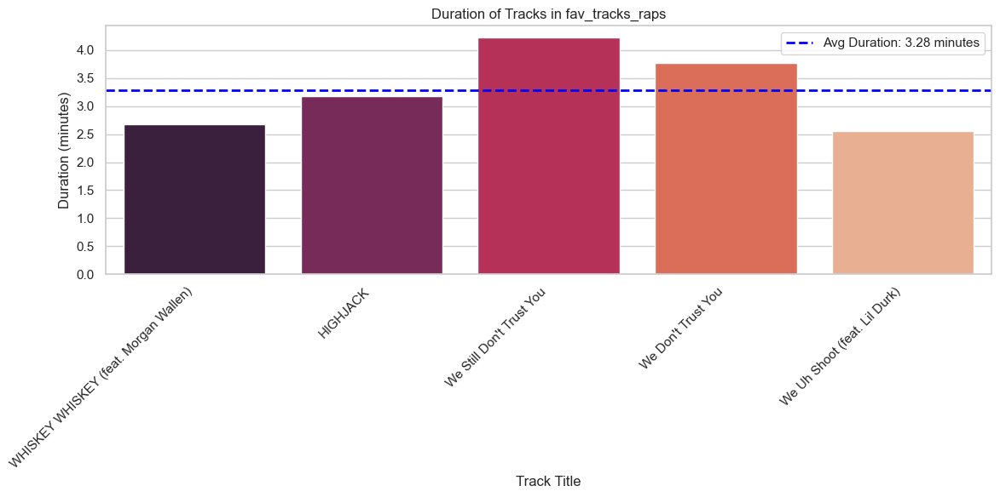

In [446]:
mean_duration = fav_tracks_raps['duration_minutes'].mean()

plt.figure(figsize=(12, 6))

sns.barplot(x='title', y='duration_minutes', data=fav_tracks_raps, palette='rocket')

plt.axhline(mean_duration, color='blue', linestyle='--', linewidth=2, label=f'Avg Duration: {mean_duration:.2f} minutes')

plt.xlabel('Track Title')
plt.ylabel('Duration (minutes)')
plt.title('Duration of Tracks in fav_tracks_raps')

plt.xticks(rotation=45, ha='right')

plt.legend()


plt.tight_layout()
plt.show()

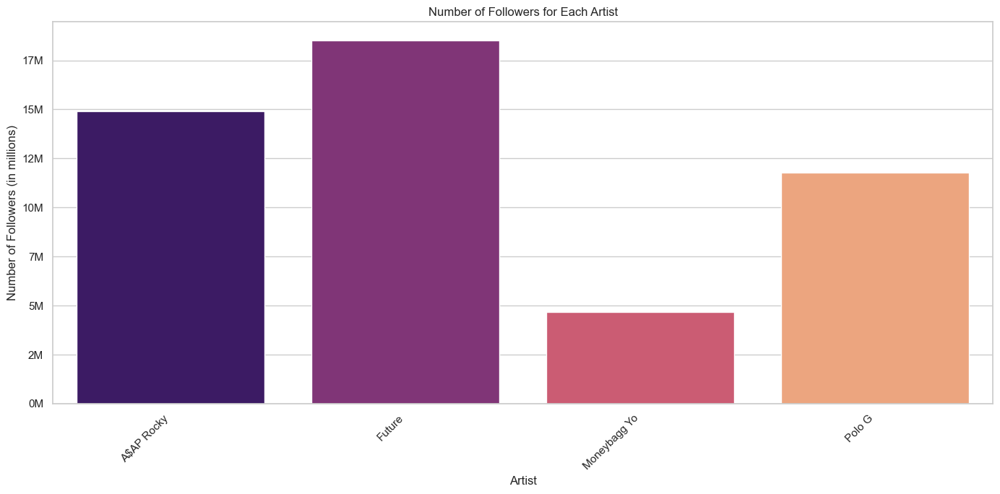

In [470]:
unique_artists = fav_tracks_raps.groupby('artist').agg({
    'artist_followers': 'mean',
    'track_popularity': 'mean',
    'artist_popularity': 'mean'
}).reset_index()

plt.figure(figsize=(14, 7))

barplot = sns.barplot(x='artist', y='artist_followers', data=unique_artists, palette='magma')

plt.xlabel('Artist')
plt.ylabel('Number of Followers (in millions)')
plt.title('Number of Followers for Each Artist')

plt.xticks(rotation=45, ha='right')

barplot.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{int(x/1e6)}M'))


plt.tight_layout()
aplt.show()

### Future is the most popular artist followed by A$AP Rocky, Moneybagg Yo has the least amount of followers

In [476]:
fav_tracks_raps.to_csv('fav_tracks_raps_3', index=False)

## Saved favorite rap tracks to CSV

# Continuing with the final dataframe, Pop Tracks

In [479]:
pop_tracks_2024

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
0,7GlBOeep6PqTfFi59PTUUN,Chappell Roan,90,3059358,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",3.64,"['indie pop', 'pov: indie']",97,0.700,...,0.0356,0.05020,0.000000,0.0881,0.7850,116.712,audio_features,spotify:track:0WbMK4wrZ1wFSty9F7FCgu,https://api.spotify.com/v1/tracks/0WbMK4wrZ1wF...,https://api.spotify.com/v1/audio-analysis/0WbM...
1,6qqNVTkY8uBg9cP3Jd7DAH,Billie Eilish,95,99510427,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,3.51,"['art pop', 'pop']",100,0.747,...,0.0358,0.20000,0.060800,0.1170,0.4380,104.978,audio_features,spotify:track:6dOtVTDdiauQNBQEDOtlAB,https://api.spotify.com/v1/tracks/6dOtVTDdiauQ...,https://api.spotify.com/v1/audio-analysis/6dOt...
3,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,3.11,['pop'],97,0.669,...,0.0540,0.27400,0.000000,0.1040,0.5790,107.071,audio_features,spotify:track:5N3hjp1WNayUPZrA8kJmJP,https://api.spotify.com/v1/tracks/5N3hjp1WNayU...,https://api.spotify.com/v1/audio-analysis/5N3h...
4,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,2qSkIjg1o9h3YT9RAgYN75,Espresso,2.92,['pop'],98,0.701,...,0.0285,0.10700,0.000065,0.1850,0.6900,103.969,audio_features,spotify:track:2qSkIjg1o9h3YT9RAgYN75,https://api.spotify.com/v1/tracks/2qSkIjg1o9h3...,https://api.spotify.com/v1/audio-analysis/2qSk...
5,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,7221xIgOnuakPdLqT0F3nP,I Had Some Help (Feat. Morgan Wallen),2.97,"['dfw rap', 'melodic rap', 'pop', 'rap']",93,0.638,...,0.0264,0.00757,0.000000,0.2450,0.7310,127.986,audio_features,spotify:track:7221xIgOnuakPdLqT0F3nP,https://api.spotify.com/v1/tracks/7221xIgOnuak...,https://api.spotify.com/v1/audio-analysis/7221...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,4nDoRrQiYLoBzwC5BhVJzF,Camila Cabello,82,33743590,2H2ytI7ompfNmRkI2sq8Uk,I LUV IT (feat. Playboi Carti),2.91,"['dance pop', 'pop']",72,0.618,...,0.0506,0.01030,0.004630,0.2350,0.1980,75.524,audio_features,spotify:track:2H2ytI7ompfNmRkI2sq8Uk,https://api.spotify.com/v1/tracks/2H2ytI7ompfN...,https://api.spotify.com/v1/audio-analysis/2H2y...
991,6MPCFvOQv5cIGfw3jODMF0,Internet Money,70,857282,53lS5rsYcbEMtpM2grepw5,KEEP IT COOL,1.78,"['pop rap', 'trap']",69,0.626,...,0.0419,0.01780,0.000014,0.1250,0.1310,162.004,audio_features,spotify:track:53lS5rsYcbEMtpM2grepw5,https://api.spotify.com/v1/tracks/53lS5rsYcbEM...,https://api.spotify.com/v1/audio-analysis/53lS...
992,687cZJR45JO7jhk1LHIbgq,Tems,78,2319941,3cuUZnjDwk4cUJCFinYbAC,Free Fall (feat. J. Cole),3.20,"['afro r&b', 'afrobeats', 'alte', 'nigerian pop']",71,0.744,...,0.0543,0.46900,0.044700,0.1050,0.7950,92.044,audio_features,spotify:track:3cuUZnjDwk4cUJCFinYbAC,https://api.spotify.com/v1/tracks/3cuUZnjDwk4c...,https://api.spotify.com/v1/audio-analysis/3cuU...
994,66CXWjxzNUsdJxJ2JdwvnR,Ariana Grande,91,99776130,0o3ua5ufFK7nfRzbDUNoGA,don't wanna break up again,2.90,['pop'],72,0.513,...,0.2530,0.39700,0.000000,0.1130,0.5740,129.300,audio_features,spotify:track:0o3ua5ufFK7nfRzbDUNoGA,https://api.spotify.com/v1/tracks/0o3ua5ufFK7n...,https://api.spotify.com/v1/audio-analysis/0o3u...


In [483]:
pop_tracks_2024_cleaned = pop_tracks_2024.drop_duplicates(subset='title')

removed_duplicates = pop_tracks_2024.shape[0] - pop_tracks_2024_cleaned.shape[0]
pop_tracks_2024_cleaned.shape, removed_duplicates

((393, 24), 145)

## The pop_tracks_2024 DataFrame has 393 rows and 24 columns after removing duplicates.
## 145 duplicates were found and removed.

In [485]:
pop_tracks_2024_cleaned

,artist_id,artist,artist_popularity,artist_followers,track_id,title,duration_minutes,artist_genres,track_popularity,danceability,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,uri,track_href,analysis_url
0,7GlBOeep6PqTfFi59PTUUN,Chappell Roan,90,3059358,0WbMK4wrZ1wFSty9F7FCgu,"Good Luck, Babe!",3.64,"['indie pop', 'pov: indie']",97,0.700,...,0.0356,0.05020,0.000000,0.0881,0.7850,116.712,audio_features,spotify:track:0WbMK4wrZ1wFSty9F7FCgu,https://api.spotify.com/v1/tracks/0WbMK4wrZ1wF...,https://api.spotify.com/v1/audio-analysis/0WbM...
1,6qqNVTkY8uBg9cP3Jd7DAH,Billie Eilish,95,99510427,6dOtVTDdiauQNBQEDOtlAB,BIRDS OF A FEATHER,3.51,"['art pop', 'pop']",100,0.747,...,0.0358,0.20000,0.060800,0.1170,0.4380,104.978,audio_features,spotify:track:6dOtVTDdiauQNBQEDOtlAB,https://api.spotify.com/v1/tracks/6dOtVTDdiauQ...,https://api.spotify.com/v1/audio-analysis/6dOt...
3,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,5N3hjp1WNayUPZrA8kJmJP,Please Please Please,3.11,['pop'],97,0.669,...,0.0540,0.27400,0.000000,0.1040,0.5790,107.071,audio_features,spotify:track:5N3hjp1WNayUPZrA8kJmJP,https://api.spotify.com/v1/tracks/5N3hjp1WNayU...,https://api.spotify.com/v1/audio-analysis/5N3h...
4,74KM79TiuVKeVCqs8QtB0B,Sabrina Carpenter,95,12516328,2qSkIjg1o9h3YT9RAgYN75,Espresso,2.92,['pop'],98,0.701,...,0.0285,0.10700,0.000065,0.1850,0.6900,103.969,audio_features,spotify:track:2qSkIjg1o9h3YT9RAgYN75,https://api.spotify.com/v1/tracks/2qSkIjg1o9h3...,https://api.spotify.com/v1/audio-analysis/2qSk...
5,246dkjvS1zLTtiykXe5h60,Post Malone,93,45344013,7221xIgOnuakPdLqT0F3nP,I Had Some Help (Feat. Morgan Wallen),2.97,"['dfw rap', 'melodic rap', 'pop', 'rap']",93,0.638,...,0.0264,0.00757,0.000000,0.2450,0.7310,127.986,audio_features,spotify:track:7221xIgOnuakPdLqT0F3nP,https://api.spotify.com/v1/tracks/7221xIgOnuak...,https://api.spotify.com/v1/audio-analysis/7221...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
981,4nDoRrQiYLoBzwC5BhVJzF,Camila Cabello,82,33743590,2H2ytI7ompfNmRkI2sq8Uk,I LUV IT (feat. Playboi Carti),2.91,"['dance pop', 'pop']",72,0.618,...,0.0506,0.01030,0.004630,0.2350,0.1980,75.524,audio_features,spotify:track:2H2ytI7ompfNmRkI2sq8Uk,https://api.spotify.com/v1/tracks/2H2ytI7ompfN...,https://api.spotify.com/v1/audio-analysis/2H2y...
991,6MPCFvOQv5cIGfw3jODMF0,Internet Money,70,857282,53lS5rsYcbEMtpM2grepw5,KEEP IT COOL,1.78,"['pop rap', 'trap']",69,0.626,...,0.0419,0.01780,0.000014,0.1250,0.1310,162.004,audio_features,spotify:track:53lS5rsYcbEMtpM2grepw5,https://api.spotify.com/v1/tracks/53lS5rsYcbEM...,https://api.spotify.com/v1/audio-analysis/53lS...
992,687cZJR45JO7jhk1LHIbgq,Tems,78,2319941,3cuUZnjDwk4cUJCFinYbAC,Free Fall (feat. J. Cole),3.20,"['afro r&b', 'afrobeats', 'alte', 'nigerian pop']",71,0.744,...,0.0543,0.46900,0.044700,0.1050,0.7950,92.044,audio_features,spotify:track:3cuUZnjDwk4cUJCFinYbAC,https://api.spotify.com/v1/tracks/3cuUZnjDwk4c...,https://api.spotify.com/v1/audio-analysis/3cuU...
994,66CXWjxzNUsdJxJ2JdwvnR,Ariana Grande,91,99776130,0o3ua5ufFK7nfRzbDUNoGA,don't wanna break up again,2.90,['pop'],72,0.513,...,0.2530,0.39700,0.000000,0.1130,0.5740,129.300,audio_features,spotify:track:0o3ua5ufFK7nfRzbDUNoGA,https://api.spotify.com/v1/tracks/0o3ua5ufFK7n...,https://api.spotify.com/v1/audio-analysis/0o3u...


In [488]:
pop_tracks_2024_cleaned.describe()

,artist_popularity,artist_followers,duration_minutes,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,393.000000,3.930000e+02,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000
mean,83.806616,2.868546e+07,3.309491,73.111959,0.606217,0.645491,5.333333,-6.326700,0.702290,0.068870,0.240414,0.034627,0.167844,0.476575,122.015173
std,9.707890,3.987852e+07,0.699614,10.970400,0.147998,0.182042,3.696846,2.473416,0.457834,0.065449,0.261485,0.141812,0.113696,0.213544,28.513164
min,48.000000,3.129600e+04,1.240000,43.000000,0.072400,0.148000,0.000000,-14.979000,0.000000,0.024300,0.000212,0.000000,0.029300,0.036100,59.992000
25%,76.000000,2.368508e+06,2.830000,69.000000,0.504000,0.534000,2.000000,-7.411000,0.000000,0.033400,0.029900,0.000000,0.097000,0.319000,99.971000
50%,85.000000,7.819062e+06,3.240000,75.000000,0.621000,0.660000,6.000000,-5.764000,1.000000,0.044600,0.116000,0.000000,0.123000,0.478000,122.081000
75%,91.000000,4.534401e+07,3.700000,79.000000,0.711000,0.779000,9.000000,-4.679000,1.000000,0.069000,0.399000,0.000215,0.198000,0.625000,141.512000
max,100.000000,1.215798e+08,7.620000,100.000000,0.931000,0.980000,11.000000,-1.502000,1.000000,0.456000,0.968000,0.938000,0.920000,0.962000,197.768000


## The Pop dataframe has the most tracks out of the other genre dataframes
### The above data shows the following:
### Artist Popularity
* Mean: 83.8 – This suggests that most artists in the dataset are relatively popular, with an average popularity score close to 84.
* Range: Popularity scores range from 48 to 100. This indicates a broad spectrum, with some lesser-known artists included (lower popularity) and some of the most famous artists (score of 100).
### Artist Followers
* Mean: Around 28.7 million followers – On average, artists in this dataset have a substantial follower base.
* Range: From 31,296 to 121.6 million followers. This massive range suggests that the dataset includes both emerging and superstar artists.
### Track Duration (Minutes)
* Mean: 3.31 minutes – On average, tracks have a typical song length of about 3 to 3.5 minutes.
* Range: The shortest track is 1.24 minutes, and the longest is 7.62 minutes, suggesting a mix of shorter songs and longer tracks, such as extended or album versions.
### Track Popularity
* Mean: 73.1 – Most tracks are relatively popular, as the average popularity score is above 70.
* Range: The least popular track has a score of 43, while the most popular has 100, indicating that there are both widely popular and less popular tracks in this set.
### Danceability
* Mean: 0.61 – On average, tracks have moderate danceability, meaning most songs are designed to be rhythmic but may not be purely dance tracks.
* Range: The lowest value is 0.07, meaning some tracks are hardly danceable, while the highest score is 0.93, representing tracks that are very rhythmic and suited for dancing.
### Energy
* Mean: 0.65 – Most tracks are energetic, with an average energy score that suggests upbeat or intense music.
* Range: The lowest energy track has a score of 0.15, indicating a slower or more relaxed song, while the highest reaches 0.98, indicating very high intensity.
### Key
* Mean: 5.33 – The average key is approximately halfway through the 12-tone scale, indicating a variety of musical keys across the dataset.
* Range: From 0 to 11, covering all possible musical keys.
### Loudness (dB)
* Mean: -6.33 dB – On average, tracks are relatively loud, but this value indicates some dynamic range.
* Range: The loudest track has -1.5 dB, while the quietest has -14.98 dB, suggesting a considerable range in production styles.
### Mode
* Mean: 0.70 – This suggests that most tracks are in a major mode (closer to 1), which is typically associated with more upbeat or positive music.
* Range: From 0 (minor) to 1 (major).
### Speechiness
* Mean: 0.07 – Most tracks have low speechiness, meaning they are more musical than spoken (such as in rap or spoken word).
* Range: 0.02 to 0.46, indicating that some tracks might have more spoken words (closer to 0.46) but still mostly feature music.
### Acousticness
* Mean: 0.24 – Most tracks are not heavily acoustic, with an average score suggesting a preference for electronic or amplified instruments.
* Range: The lowest acousticness is 0.0002, indicating fully electronic tracks, while the highest is 0.968, suggesting a strong acoustic presence.
### Instrumentalness
* Mean: 0.03 – Most tracks contain vocals, as the average instrumentalness is quite low.
* Range: From 0 to 0.938, where tracks with scores closer to 1 are likely purely instrumental.
### Liveness
* Mean: 0.17 – Most tracks are studio-recorded, but some may have live performance elements.
* Range: From 0.03 to 0.92, indicating a wide spectrum from purely studio-produced to very live-sounding tracks.
### Valence (Positivity)
* Mean: 0.48 – On average, tracks have a neutral emotional tone.
* Range: The lowest valence is 0.04, indicating very melancholic or serious tracks, while the highest is 0.96, suggesting upbeat and happy music.
### Tempo (BPM)
* Mean: 122 BPM – The average tempo is close to the typical dance/pop tempo range.
* Range: From 60 BPM (slower ballads or chill tracks) to 197 BPM (very fast tracks like drum & bass or punk).


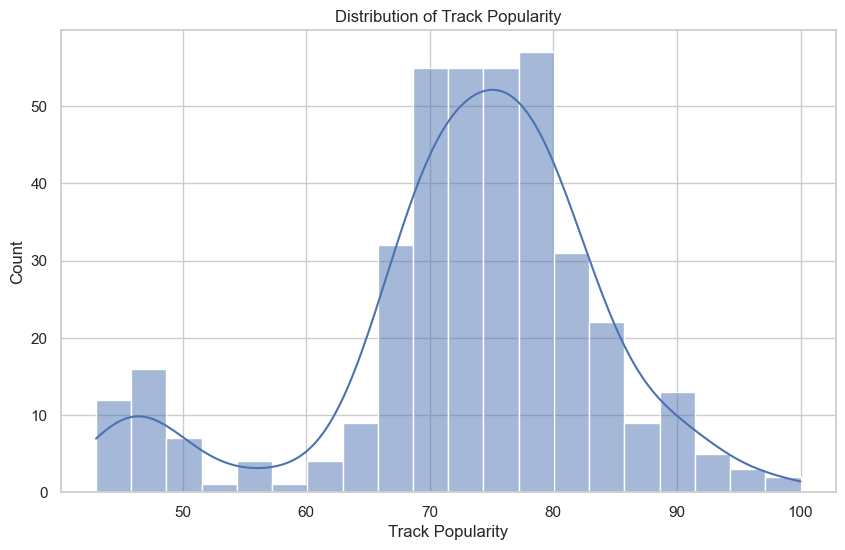

In [514]:
plt.figure(figsize=(10, 6))
sns.histplot(pop_tracks_2024_cleaned['track_popularity'], bins=20, kde=True)
plt.title('Distribution of Track Popularity')
plt.xlabel('Track Popularity')
plt.ylabel('Count')
plt.show()

### Track Popularity Distribution
### Observation: 
* The distribution of track popularity appears to be normal (bell-shaped), peaking between a popularity score of 70 and 80.
### Insight: 
* Most tracks in this dataset have a popularity score between 70 and 80, with relatively few tracks scoring below 60 or above 90.
### Conclusion: 
* The majority of the tracks in the dataset are moderately popular, and only a few tracks are extremely popular or unpopular.

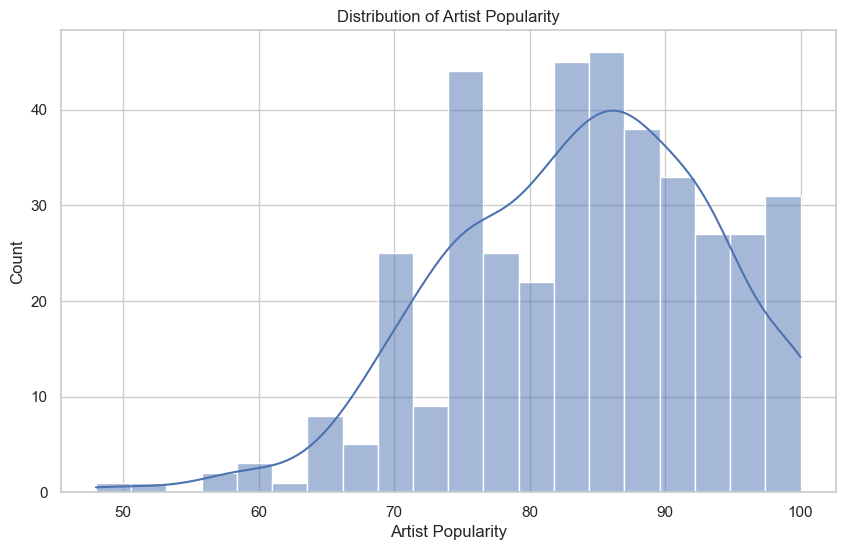

In [516]:
plt.figure(figsize=(10, 6))
sns.histplot(pop_tracks_2024_cleaned['artist_popularity'], bins=20, kde=True)
plt.title('Distribution of Artist Popularity')
plt.xlabel('Artist Popularity')
plt.ylabel('Count')
plt.show()

## Artist Popularity Distribution
### Observation: 
* The distribution of artist popularity shows a similar bell-shaped curve, with the peak between 80 and 90.
* The spread is wider, with artists distributed more evenly across lower popularity levels compared to tracks.
### Insight: 
* A large proportion of artists in this dataset have popularity scores between 70 and 90, with fewer artists falling below 60 or reaching above 95.
### Conclusion: 
* While artists maintain a higher level of popularity, there are relatively few extremely popular artists (above 95).
* Success in artist popularity seems more challenging at the highest levels, possibly due to intense competition.

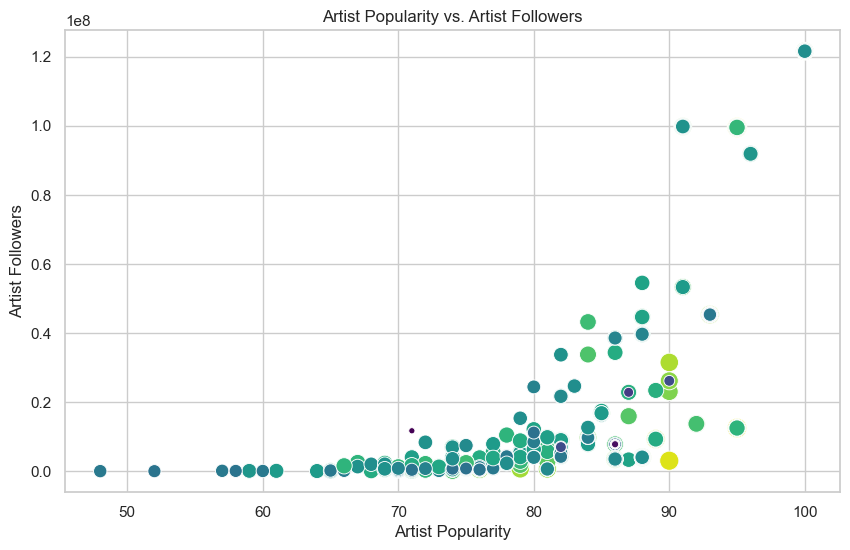

In [538]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='artist_popularity', y='artist_followers', data=pop_tracks_2024_cleaned, hue='track_popularity', palette='viridis', size='track_popularity', sizes=(20, 200), legend=False)
plt.title('Artist Popularity vs. Artist Followers')
plt.xlabel('Artist Popularity')
plt.ylabel('Artist Followers')
plt.show()

## Artist Popularity vs. Artist Followers
### Observation: 
* The scatter plot shows a positive correlation between artist popularity and the number of followers.
* However, there are outliers—some artists have an exceptionally high number of followers but moderate popularity, while others with high popularity do not have as many followers.
### Insight: 
* Artist popularity does not perfectly align with follower count.
* Some artists may be highly popular with few followers (perhaps through recent viral success), while others may have many followers due to long-standing fame but not necessarily high current popularity.
### Conclusion: 
* Popularity is not solely determined by the number of followers, and factors like recent hits, cultural relevance, and social media presence may influence both measures differently.
* An artist’s follower count can indicate long-term success, while current popularity might reflect more immediate, trending appeal.

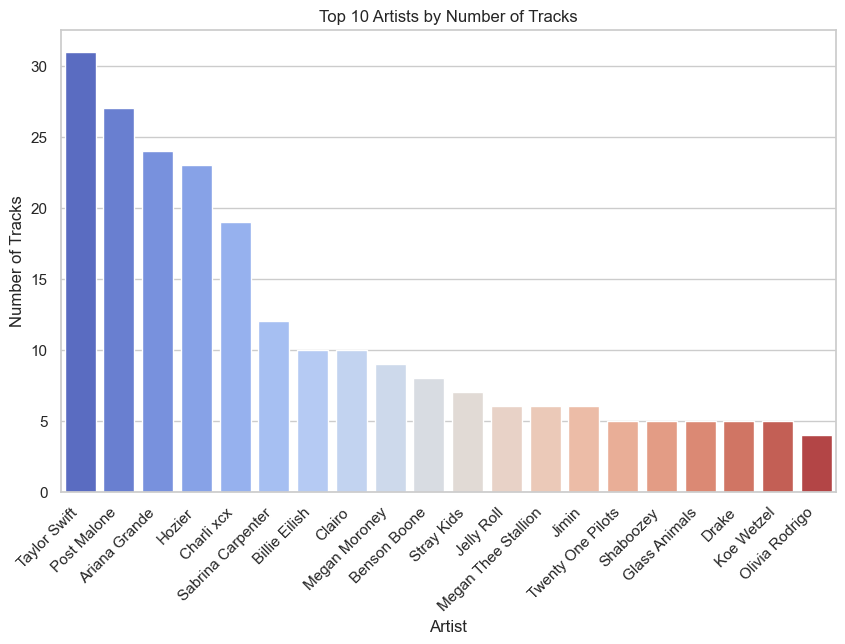

In [512]:
plt.figure(figsize=(10, 6))
top_artists = pop_tracks_2024_cleaned['artist'].value_counts().head(20)
sns.barplot(x=top_artists.index, y=top_artists.values, palette='coolwarm')
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Artists by Number of Tracks')
plt.xlabel('Artist')
plt.ylabel('Number of Tracks')
plt.show()

### Post Malone shows above 100 tracks while Taylor Swift shows over 40 track
### I see some Rap artist made it to the dataframe but we will keep those since they are very big mainstream and radio artist

In [526]:
pop_tracks_2024_cleaned[pop_tracks_2024_cleaned['artist'] == 'Post Malone'].groupby('title').size()

title
Ain’t How It Ends                              1
Back To Texas                                  1
California Sober (Feat. Chris Stapleton)       1
Dead At The Honky Tonk                         1
Devil I've Been (Feat. ERNEST)                 1
Fallin’ In Love                                1
Finer Things (Feat. Hank Williams Jr.)         1
Go To Hell                                     1
Goes Without Saying (Feat. Brad Paisley)       1
Guy For That (Feat. Luke Combs)                1
Have The Heart (Feat. Dolly Parton)            1
Hey Mercedes                                   1
Hide My Gun (Feat. HARDY)                      1
I Had Some Help (Feat. Morgan Wallen)          1
Killed A Man                                   1
Losers (Feat. Jelly Roll)                      1
M-E-X-I-C-O (Feat. Billy Strings)              1
Missin’ You Like This (Feat. Luke Combs)       1
Never Love You Again (Feat. Sierra Ferrell)    1
Nosedive (Feat. Lainey Wilson)                 1
Pour Me A Drin

In [530]:
pop_tracks_2024_cleaned[pop_tracks_2024_cleaned['artist'] == 'Taylor Swift'].groupby('title').size()

title
But Daddy I Love Him                         1
Cassandra                                    1
Chloe or Sam or Sophia or Marcus             1
Clara Bow                                    1
Down Bad                                     1
Florida!!! (feat. Florence + The Machine)    1
Fortnight (feat. Post Malone)                1
Fresh Out The Slammer                        1
Guilty as Sin?                               1
How Did It End?                              1
I Can Do It With a Broken Heart              1
I Can Fix Him (No Really I Can)              1
I Hate It Here                               1
I Look in People's Windows                   1
My Boy Only Breaks His Favorite Toys         1
Peter                                        1
Robin                                        1
So High School                               1
So Long, London                              1
The Albatross                                1
The Alchemy                                  1
The Bla

In [532]:
pop_tracks_2024_cleaned[pop_tracks_2024_cleaned['artist'] == 'Ariana Grande'].groupby('title').size()

title
Be My Baby                                  1
Best Mistake                                1
Break Free                                  1
Break Your Heart Right Back                 1
Cadillac Song                               1
Hands On Me                                 1
Intro                                       1
Just A Little Bit Of Your Heart             1
Love Me Harder                              1
My Everything                               1
One Last Time                               1
Only 1                                      1
Problem                                     1
Too Close                                   1
Why Try                                     1
You Don't Know Me                           1
bye                                         1
don't wanna break up again                  1
eternal sunshine                            1
intro (end of the world)                    1
supernatural                                1
the boy is mine             

### The top 3 artist  with the most tracks show no duplicate tracks, the tracks are from albums 

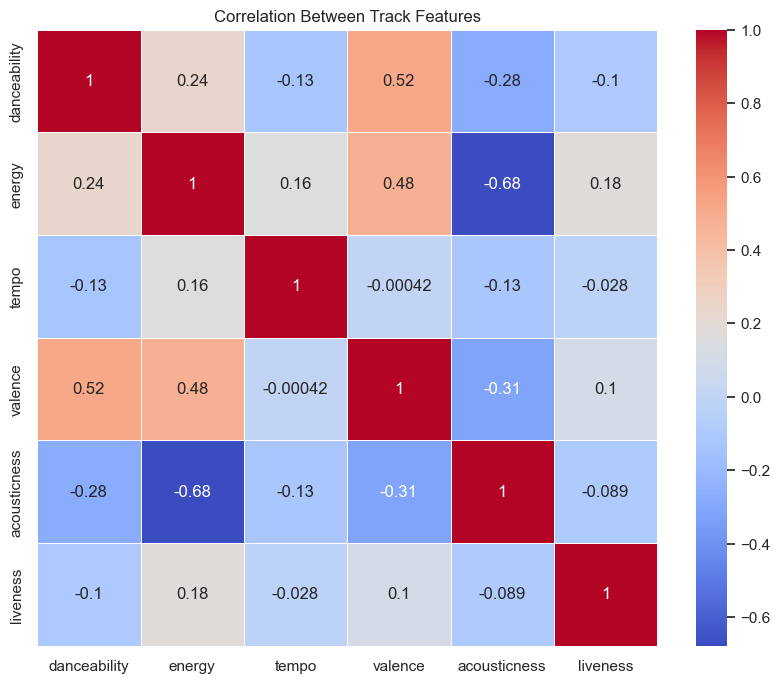

In [546]:
plt.figure(figsize=(10, 8))
corr = pop_tracks_2024_cleaned[['danceability', 'energy', 'tempo', 'valence', 'acousticness', 'liveness']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Between Track Features')
plt.show()

## Track Features Correlation (Heatmap)
* Energy and Valence have a strong positive correlation (0.68), meaning tracks with high energy tend to have a more positive mood (valence).
* Danceability and Valence also show a moderate positive correlation (0.52), indicating that more danceable songs are likely to have a more positive feeling.
* Acousticness and Energy exhibit a negative correlation (-0.48), suggesting that acoustic tracks tend to be less energetic, which makes sense as electronic/digital production usually increases energy levels.
* Liveness and Acousticness have a positive correlation (0.68), possibly because live recordings are often more acoustic in nature.
* Danceability and Energy have a small positive correlation (0.24), meaning that while they are related, being more danceable doesn’t always imply higher energy.
* Loudness and Acousticness likely have an inverse correlation (visible but not shown), indicating that louder tracks are more produced and less acoustic.

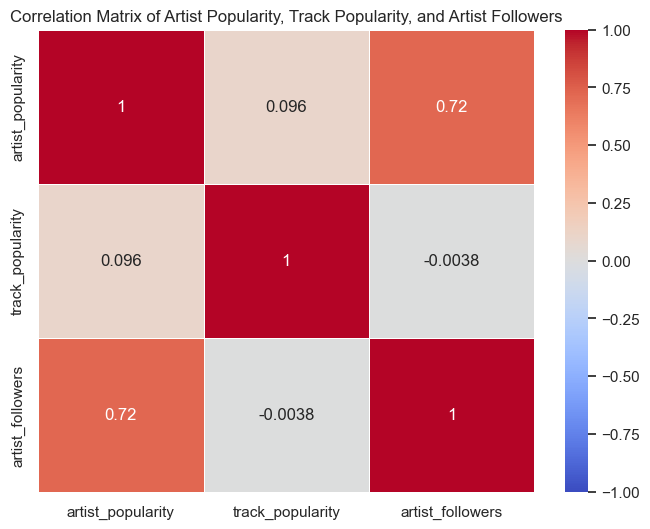

In [587]:
correlation_data = pop_tracks_2024_cleaned[['artist_popularity', 'track_popularity', 'artist_followers']]

correlation_matrix = correlation_data.corr()

plt.figure(figsize=(8, 6))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)

plt.title("Correlation Matrix of Artist Popularity, Track Popularity, and Artist Followers")

plt.show()

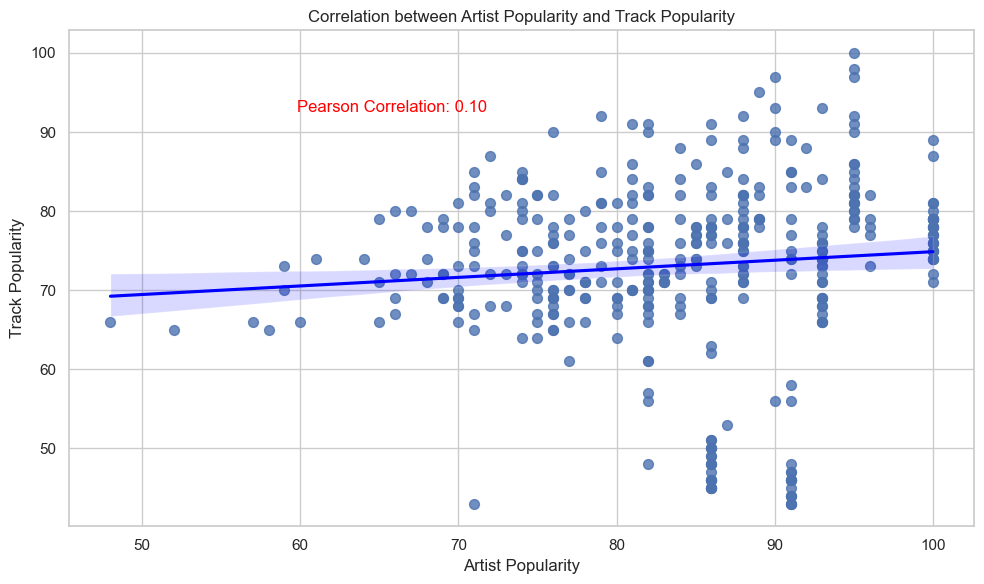

In [590]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.regplot(x='artist_popularity', y='track_popularity', data=pop_tracks_2024_cleaned, scatter_kws={'s':50}, line_kws={"color":"blue"})

correlation_coefficient = np.corrcoef(pop_tracks_2024_cleaned['artist_popularity'], pop_tracks_2024_cleaned['track_popularity'])[0, 1]

plt.figtext(.4, 0.8, f'Pearson Correlation: {correlation_coefficient:.2f}', ha='center', fontsize=12, color='red')

plt.title('Correlation between Artist Popularity and Track Popularity')
plt.xlabel('Artist Popularity')
plt.ylabel('Track Popularity')

plt.tight_layout()
plt.show()

## Artist Popularity vs Track Popularity Correlation (Heatmap)
*Artist popularity and artist followers show a high correlation (0.72), as expected. More popular artists typically have a larger following.
*Track popularity and artist popularity exhibit a very weak correlation (0.10). This suggests that an artist’s overall popularity doesn’t strongly dictate the popularity of a particular track.
*Track popularity and artist followers show an almost non-existent correlation (0.0038), further supporting that more followers do not necessarily lead to more popular tracks.
## Artist Popularity vs Track Popularity (Scatter Plot)
*The scatter plot reveals a very weak positive correlation (0.10) between artist popularity and track popularity. This implies that while there is some relationship between the two, it is not a strong predictor.
*There’s a wide spread of track popularity for artists with high popularity (e.g., artists with popularity scores of 90-100 still have tracks that aren’t as popular).
*Similarly, there are several lower-popularity artists who have highly popular tracks, further proving that track success is not solely determined by artist reputation.

# Valence

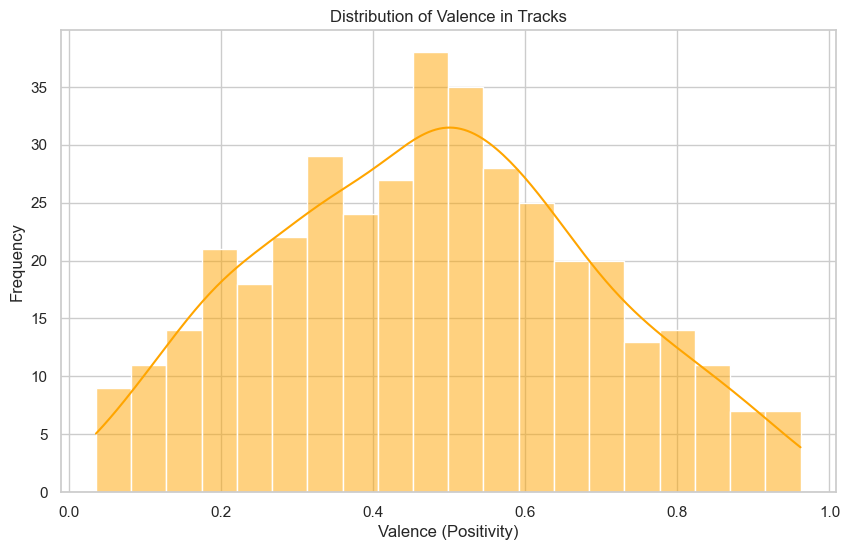

In [612]:
plt.figure(figsize=(10, 6))
sns.histplot(pop_tracks_2024_cleaned['valence'], bins=20, kde=True, color='orange')
plt.title('Distribution of Valence in Tracks')
plt.xlabel('Valence (Positivity)')
plt.ylabel('Frequency')
plt.show()

## Distribution of Valence in Tracks (Histogram)
### Skewed Distribution:
* The valence (positivity) of the tracks appears to follow a slightly skewed distribution. Most tracks are centered around a valence of 0.4 to 0.6, which suggests that a large portion of tracks have a neutral or moderately positive mood.
* Fewer Extremely Happy or Sad Tracks: There are fewer tracks with very high valence (close to 1) or very low valence (close to 0). This suggests that extreme positivity or negativity in tracks is less common.
* Moderate Positivity Dominates: The peak around 0.5 indicates that most tracks tend to have a moderate level of positivity or happiness, avoiding extremes on either end.    

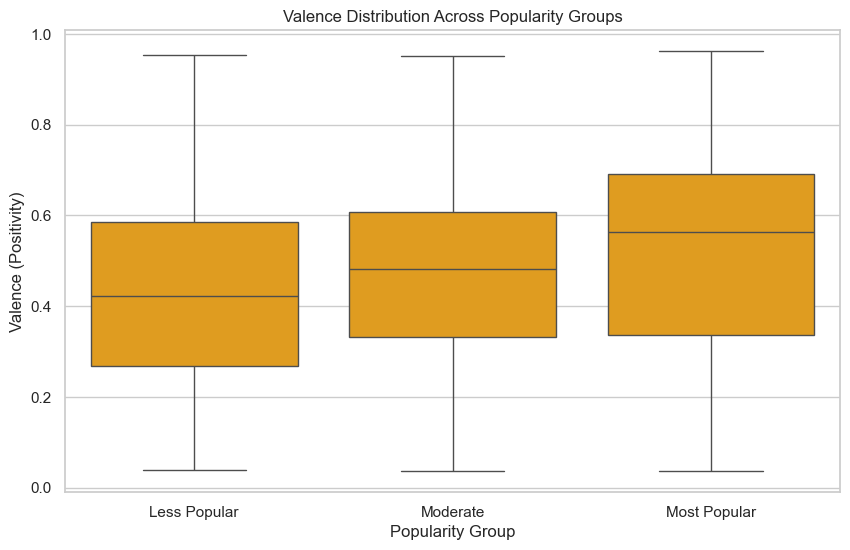

In [698]:
top_20_percent = pop_tracks_2024_cleaned['track_popularity'].quantile(0.8)
bottom_20_percent = pop_tracks_2024_cleaned['track_popularity'].quantile(0.2)

pop_tracks_2024_cleaned['popularity_group'] = pd.cut(pop_tracks_2024_cleaned['track_popularity'], 
                                                     bins=[0, bottom_20_percent, top_20_percent, 100],
                                                     labels=['Less Popular', 'Moderate', 'Most Popular'])

plt.figure(figsize=(10, 6))
sns.boxplot(x='popularity_group', y='valence', data=pop_tracks_2024_cleaned, color='orange')
plt.title('Valence Distribution Across Popularity Groups')
plt.xlabel('Popularity Group')
plt.ylabel('Valence (Positivity)')
plt.show()

### Valence Distribution Across Popularity Groups
* Most Popular Tracks Have Slightly Higher Valence: The median valence for the most popular tracks is slightly higher than that for less popular and moderately popular tracks. 
* This suggests that tracks with a more positive mood may tend to be more popular, though the difference isn’t extreme.
* Valence Spread is Similar Across Groups: The spread (interquartile range) of valence is similar across the popularity groups, meaning that tracks in each popularity category have a wide range of moods. 
* However, for the less popular group, there is a bit more variation, with some tracks showing lower valence.
* No Clear Extreme: None of the popularity groups have extremely low or high valence consistently, showing that even among the most popular tracks, extreme positivity or negativity is rare.

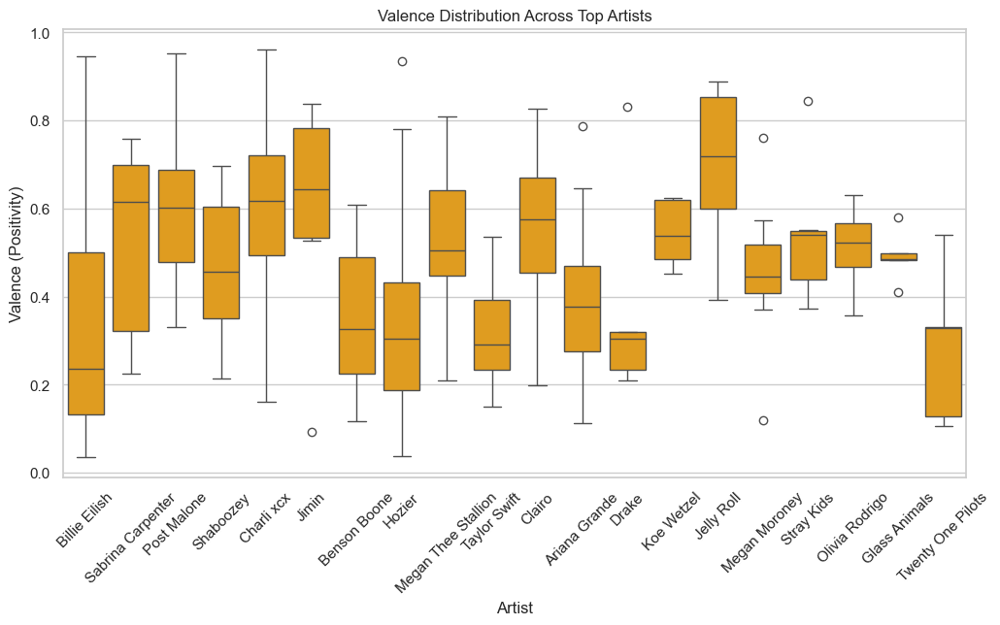

In [700]:
top_artists = pop_tracks_2024_cleaned['artist'].value_counts().nlargest(20).index
plt.figure(figsize=(12, 6))
sns.boxplot(x='artist', y='valence', color='orange', data=pop_tracks_2024_cleaned[pop_tracks_2024_cleaned['artist'].isin(top_artists)])
plt.xticks(rotation=45)
plt.title('Valence Distribution Across Top Artists')
plt.xlabel('Artist')
plt.ylabel('Valence (Positivity)')
plt.show()

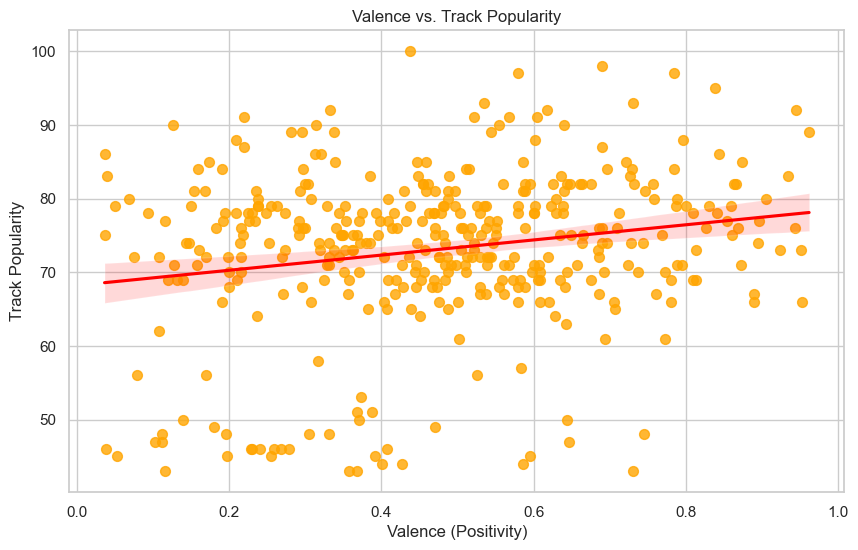

In [706]:
plt.figure(figsize=(10, 6))
sns.regplot(x='valence', y='track_popularity', color='orange', data=pop_tracks_2024_cleaned, scatter_kws={'s':50}, line_kws={'color':'red'})
plt.title('Valence vs. Track Popularity')
plt.xlabel('Valence (Positivity)')
plt.ylabel('Track Popularity')
plt.show()

### Artists with Higher Positivity (Valence):
* Benson Boone, Koe Wetzel, and Ariana Grande have a generally higher valence, with a median value closer to 0.7 or higher.
* This indicates their songs tend to have a more positive or happy emotional tone.
* Artists like Jelly Roll and Sabrina Carpenter also show a higher valence range, indicating more positive energy in their music.
### Artists with Lower Positivity (Valence):
* Twenty One Pilots stand out with a low valence distribution, indicating their music is less happy or emotionally positive, leaning towards more negative, melancholic, or serious tones.
* Olivia Rodrigo and Jelly Roll also display a wider range, with lower valence outliers suggesting that they have songs with both positive and negative emotional tones.
### Consistency:
* Artists like Billie Eilish, Shawn Mendes, and Post Malone have a narrower range of valence, indicating more consistent emotional tone in their songs, possibly gravitating towards either a consistently neutral or sad tone.
* In contrast, Twenty One Pilots and Benson Boone exhibit more variance, suggesting they produce songs that range from happy to sad or neutral.
### Outliers:
* Several outliers appear, particularly in the case of Sabrina Carpenter and Olivia Rodrigo, where there are a few songs with much higher or lower valence than the general trend for those artists, indicating emotional diversity in their tracks.
### General Insights:
* Artists like Ariana Grande and Benson Boone lean towards a happier emotional tone in their music, while Twenty One Pilots and Olivia Rodrigo offer more emotionally diverse or even more melancholic content.
* Artists with narrower boxplots, like Billie Eilish and Post Malone, seem to stick to consistent emotional themes in their music, likely focusing on a specific mood.

# Energy 

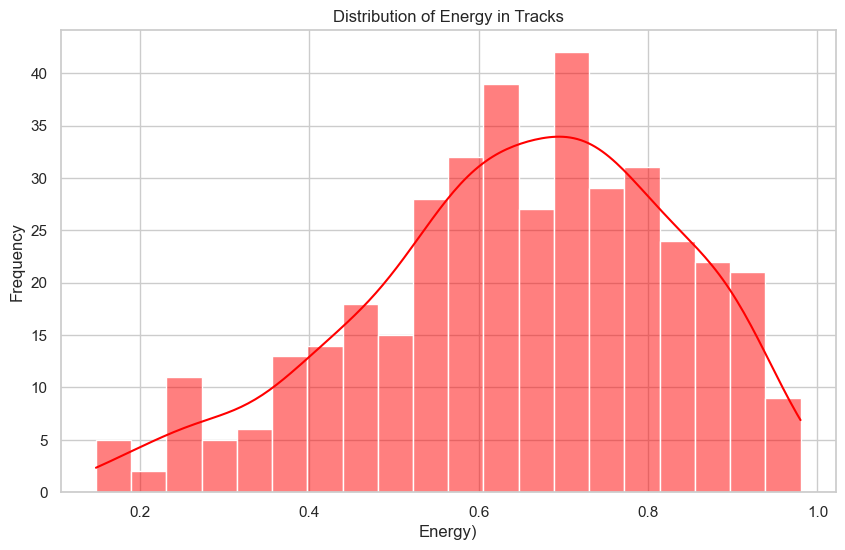

In [642]:
plt.figure(figsize=(10, 6))
sns.histplot(pop_tracks_2024_cleaned['energy'], bins=20, kde=True, color='red')
plt.title('Distribution of Energy in Tracks')
plt.xlabel('Energy)')
plt.ylabel('Frequency')
plt.show()

### Distribution of Energy in Tracks:
* The distribution shows that most tracks have energy levels between 0.5 and 0.8, with a peak around 0.6 to 0.7.
* Tracks with energy levels below 0.3 are quite rare, and tracks with energy levels above 0.9 are also less frequent.
* This suggests that popular tracks tend to have moderate to high energy levels but rarely reach extremes.

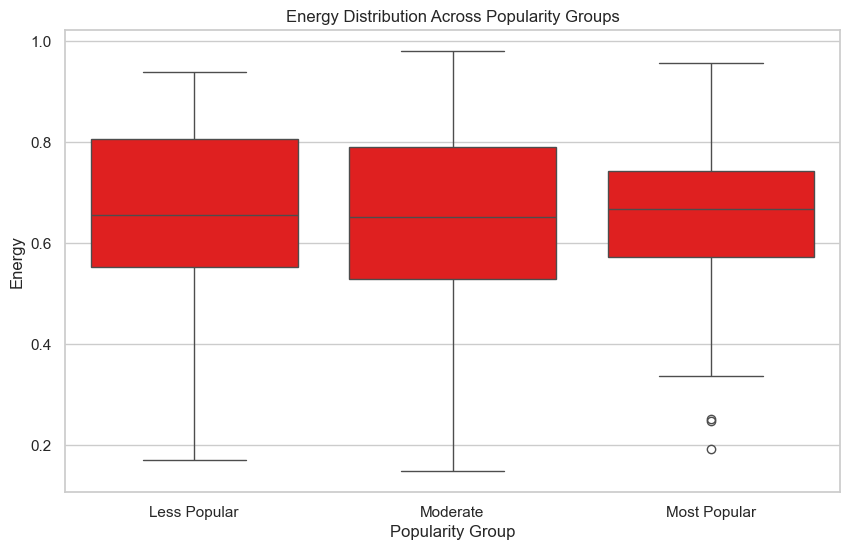

In [694]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='popularity_group', y='energy', data=pop_tracks_2024_cleaned, color='red')
plt.title('Energy Distribution Across Popularity Groups')
plt.xlabel('Popularity Group')
plt.ylabel('Energy')
plt.show()

### Energy Distribution Across Popularity Groups:
* Most popular tracks tend to have slightly higher energy on average compared to moderately popular or less popular tracks.
* The distribution is quite consistent across all popularity groups, though less popular tracks show more variability in their energy levels.

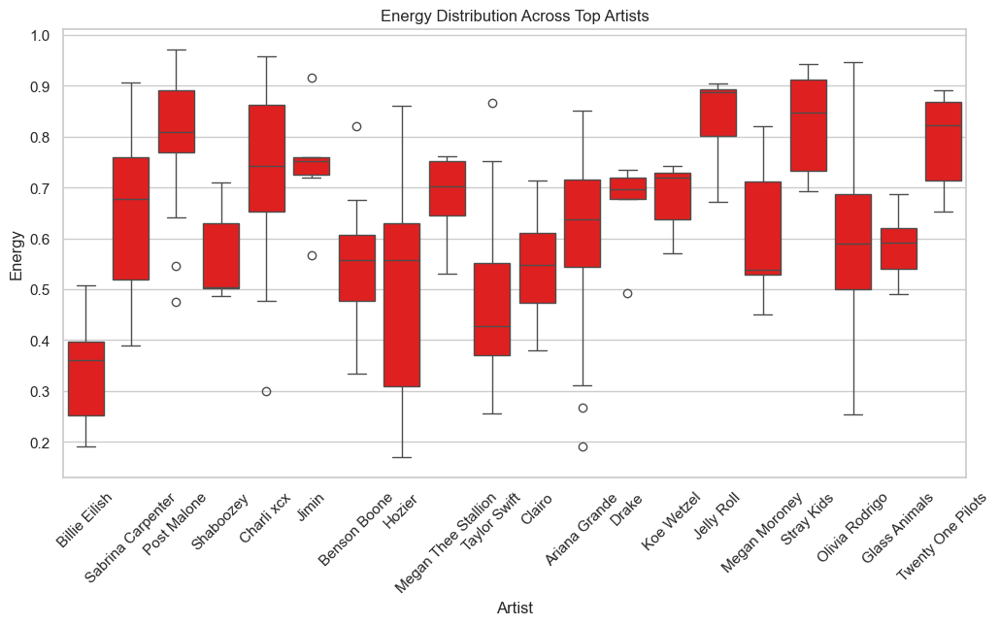

In [696]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='artist', y='energy', color='red', data=pop_tracks_2024_cleaned[pop_tracks_2024_cleaned['artist'].isin(top_artists)])
plt.xticks(rotation=45)
plt.title('Energy Distribution Across Top Artists')
plt.xlabel('Artist')
plt.ylabel('Energy')
plt.show()

### Energy Distribution Across Top Artists
* The boxplot shows the energy levels across different top artists.
* Artists like Shawn Mendes and Harry Styles have a relatively narrow range of energy in their tracks, while artists like Post Malone and Billie Eilish exhibit a wider range of energy levels.
* Artists with a broad distribution of energy, like Post Malone, might have tracks that cater to a wider variety of moods, which could explain their popularity.

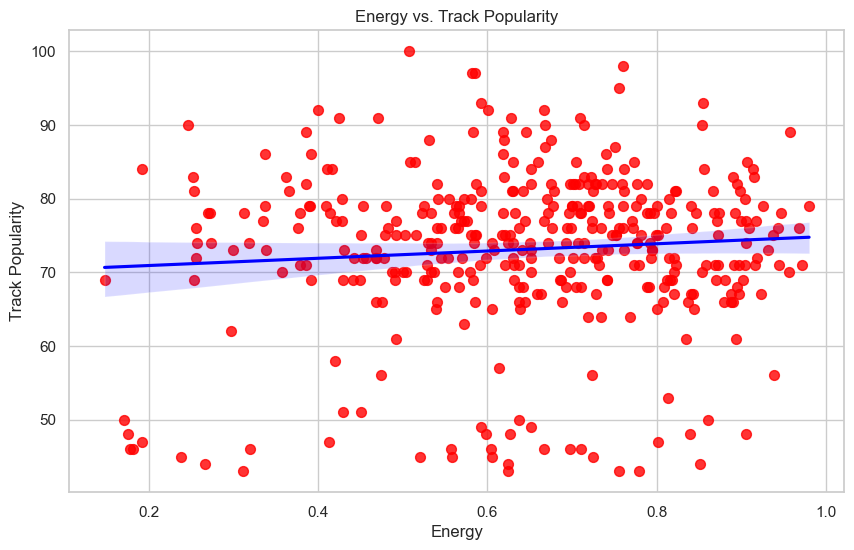

In [715]:
plt.figure(figsize=(10, 6))
sns.regplot(x='energy', y='track_popularity', data=pop_tracks_2024_cleaned, color='red', scatter_kws={'s':50}, line_kws={'color':'blue'})
plt.title('Energy vs. Track Popularity')
plt.xlabel('Energy')
plt.ylabel('Track Popularity')
plt.show()

### Energy vs. Track Popularity
* There is a slight positive correlation between energy and track popularity, as shown by the regression line, but it’s not a strong relationship.
* Popular tracks are generally clustered around moderate energy levels (between 0.5 and 0.8), suggesting that high energy alone doesn’t significantly determine track popularity.

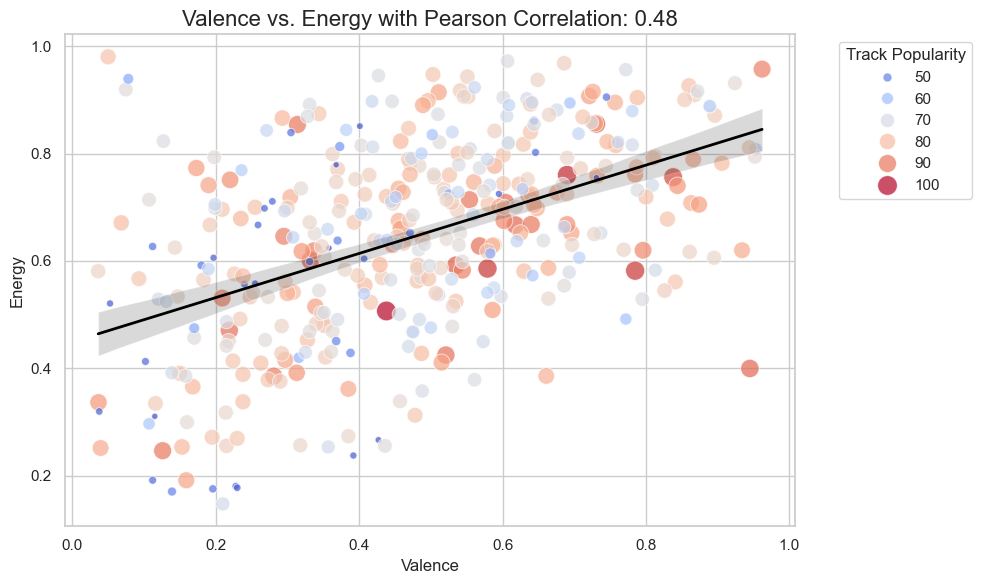

In [708]:
corr, _ = pearsonr(pop_tracks_2024_cleaned['valence'], pop_tracks_2024_cleaned['energy'])

plt.figure(figsize=(10, 6))

sns.scatterplot(x='valence', y='energy', 
                hue='track_popularity', 
                size='track_popularity', 
                sizes=(20, 200), 
                palette='coolwarm', 
                data=pop_tracks_2024_cleaned,
                alpha=0.7)

sns.regplot(x='valence', y='energy', data=pop_tracks_2024_cleaned, scatter=False, color='black', line_kws={'linewidth': 2})

plt.title(f'Valence vs. Energy with Pearson Correlation: {corr:.2f}', fontsize=16)
plt.xlabel('Valence')
plt.ylabel('Energy')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

### Valence vs. Energy with Track Popularity as Hue
* Pearson Correlation: 0.48 indicates a moderate positive relationship between valence and energy.
* Tracks with higher energy tend to have higher valence (positivity), which makes sense because energetic tracks are often perceived as more uplifting or positive.
* The hue (track popularity) suggests that while energy and valence positively correlate, there’s no clear dominance of popularity at specific valence-energy combinations.
* Tracks with moderate valence and energy (around 0.5 to 0.7) tend to have a wide spread of popularity, whereas extreme values of energy and valence might not correlate strongly with higher popularity.

### General Observations:
* Energy and Valence seem to have a notable relationship, but neither appears to be a sole driver of popularity.
* Tracks with moderate energy and valence appear most prevalent among popular songs.
* The artist’s energy distribution shows that artists producing a variety of energy levels might appeal to more diverse audiences.

## In summary, while energy and valence contribute to track characteristics, other features likely play significant roles in driving track popularity, especially given the moderate correlations observed.

# Danceability

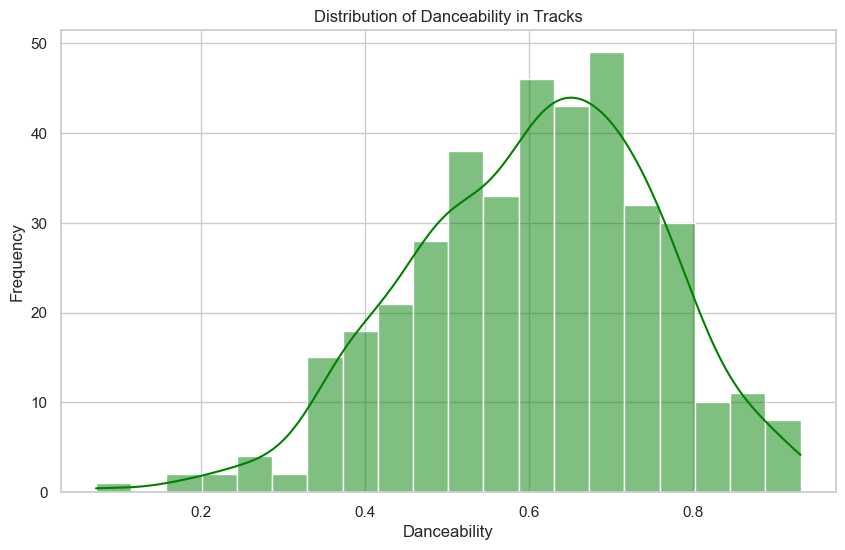

In [717]:
plt.figure(figsize=(10, 6))
sns.histplot(pop_tracks_2024_cleaned['danceability'], bins=20, kde=True, color='green')
plt.title('Distribution of Danceability in Tracks')
plt.xlabel('Danceability')
plt.ylabel('Frequency')
plt.show()

### Distribution of Danceability in Tracks:
* The distribution shows a relatively normal shape with a slight positive skew. Most tracks have a danceability score between 0.5 and 0.7, indicating they are moderately to highly danceable.
* There are fewer tracks at the extremes, meaning that very low and very high danceability scores are rarer.

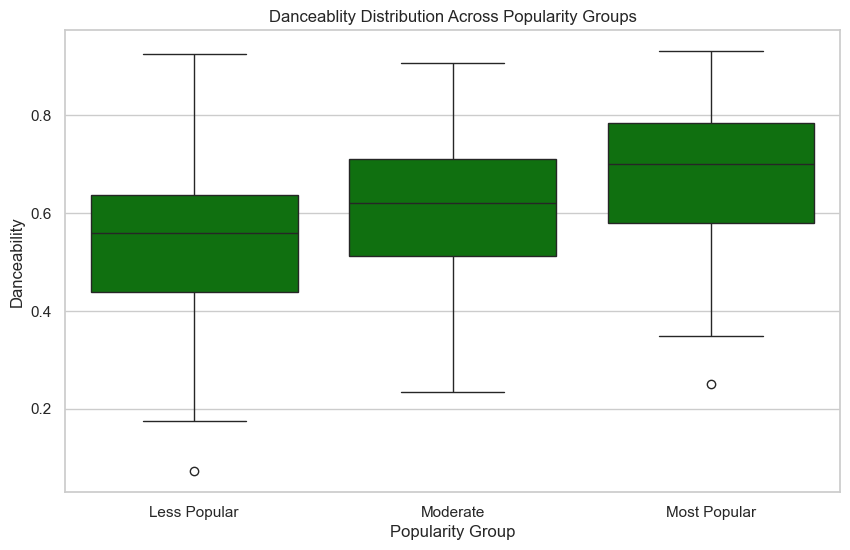

In [719]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='popularity_group', y='danceability', data=pop_tracks_2024_cleaned, color='green')
plt.title('Danceablity Distribution Across Popularity Groups')
plt.xlabel('Popularity Group')
plt.ylabel('Danceability')
plt.show()

### Danceability Distribution Across Popularity Groups:
* The box plot demonstrates that most popular tracks tend to have a higher median danceability score compared to moderately and less popular tracks.
* There is some overlap between the popularity groups, but the trend is clear that more danceable tracks are associated with higher popularity.
* This suggests that danceability plays a role in track popularity, with popular tracks generally being more danceable.

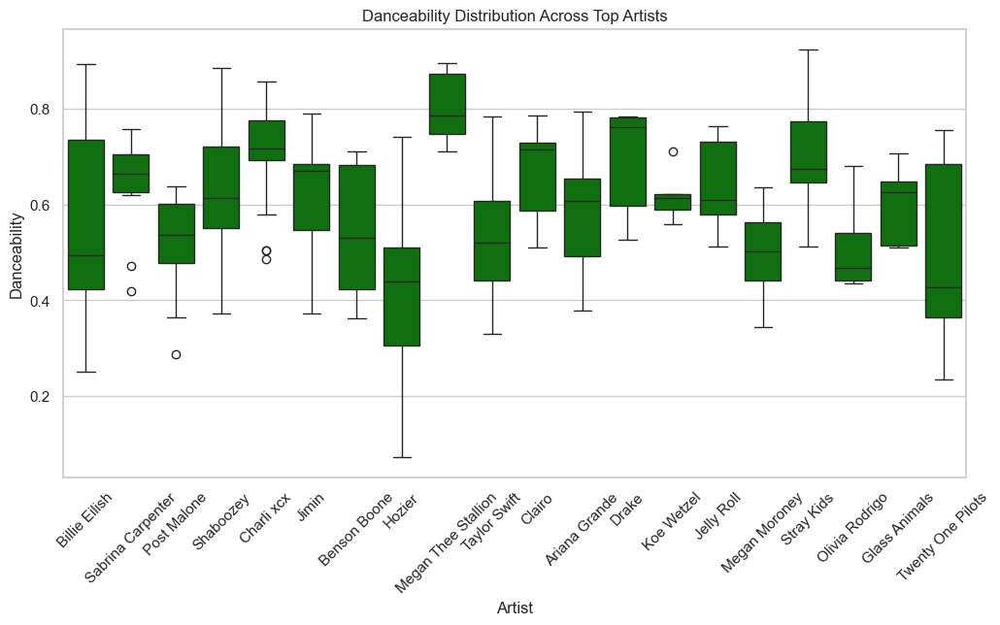

In [723]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='artist', y='danceability', color='green', data=pop_tracks_2024_cleaned[pop_tracks_2024_cleaned['artist'].isin(top_artists)])
plt.xticks(rotation=45)
plt.title('Danceability Distribution Across Top Artists')
plt.xlabel('Artist')
plt.ylabel('Danceability')
plt.show()

### Danceability Distribution Across Top Artists:
* Wide Range: Artists like Hozier and Twenty One Pilots exhibit a broad range of danceability values, indicating a variety of track styles within their discography.
* For Hozier, the range spans from about 0.2 to 0.8.
* Narrow Range: Artists like Billie Eilish, Megan Thee Stallion, and Ariana Grande have a relatively narrow distribution, suggesting that their music maintains a consistent level of danceability, with most tracks clustering around similar values.
### High Danceability Artists:
* Megan Thee Stallion and Drake stand out for having tracks with very high danceability (above 0.7), which aligns with their genre focus on hip-hop and dance-influenced music.
* Benson Boone and Doja Cat also have relatively high danceability tracks, generally above 0.6.
### Low Danceability Artists:
* Jelly Roll and Twenty One Pilots show lower median danceability, around 0.5 or below, indicating that their music may prioritize other characteristics (e.g., lyrical content or acoustic elements) over rhythm suited for dancing.
### Outliers:
* Post Malone and Sabrina Carpenter have several outliers, suggesting that these artists have tracks that deviate from their usual style in terms of danceability.
### Consistency vs. Variety: 
* Artists like Billie Eilish, Megan Thee Stallion, and Drake show a more consistent style in terms of danceability, whereas artists like Hozier and Twenty One Pilots offer more variety in how danceable their tracks are.
### Genre Influence: 
* Danceability seems to correlate with genre. For example, hip-hop and pop artists (e.g., Megan Thee Stallion, Drake, Doja Cat) tend to have tracks with higher danceability, while alternative and indie artists (e.g.,
* Twenty One Pilots, Hozier) show a wider range of danceability values, possibly due to the diversity of sub-genres they explore.

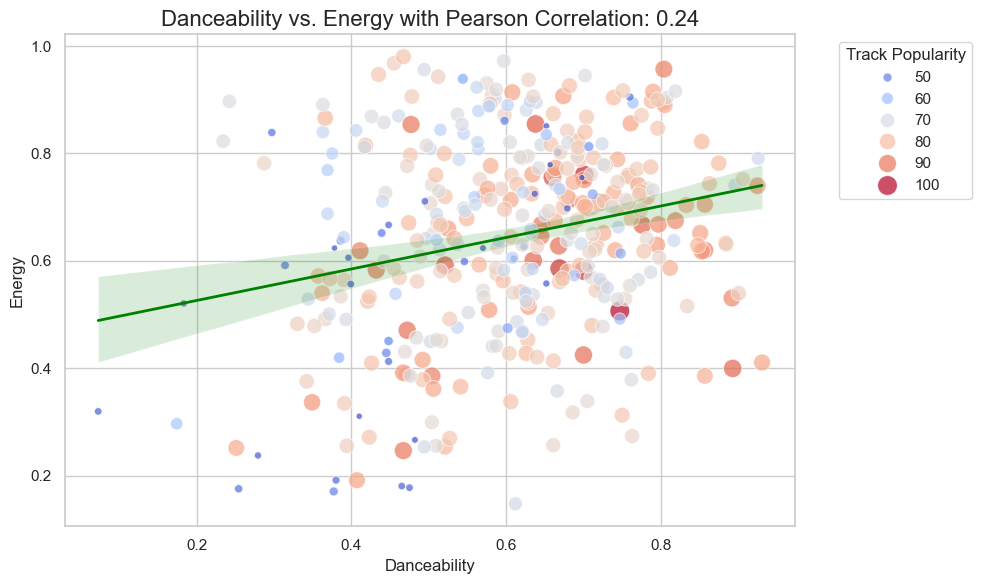

In [739]:
corr, _ = pearsonr(pop_tracks_2024_cleaned['danceability'], pop_tracks_2024_cleaned['energy'])

plt.figure(figsize=(10, 6))

sns.scatterplot(x='danceability', y='energy', 
                hue='track_popularity', 
                size='track_popularity', 
                sizes=(20, 200), 
                palette='coolwarm', 
                data=pop_tracks_2024_cleaned,
                alpha=0.7)

sns.regplot(x='danceability', y='energy', data=pop_tracks_2024_cleaned, scatter=False, color='green', line_kws={'linewidth': 2})

plt.title(f'Danceability vs. Energy with Pearson Correlation: {corr:.2f}', fontsize=16)
plt.xlabel('Danceability')
plt.ylabel('Energy')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

### Danceability vs. Energy:
* The Pearson correlation between danceability and energy is 0.24, showing a weak positive relationship. This suggests that more danceable tracks tend to have slightly higher energy, but this relationship is not strong.
* Danceable tracks can vary widely in their energy levels, reflecting the diversity of tracks in terms of intensity.


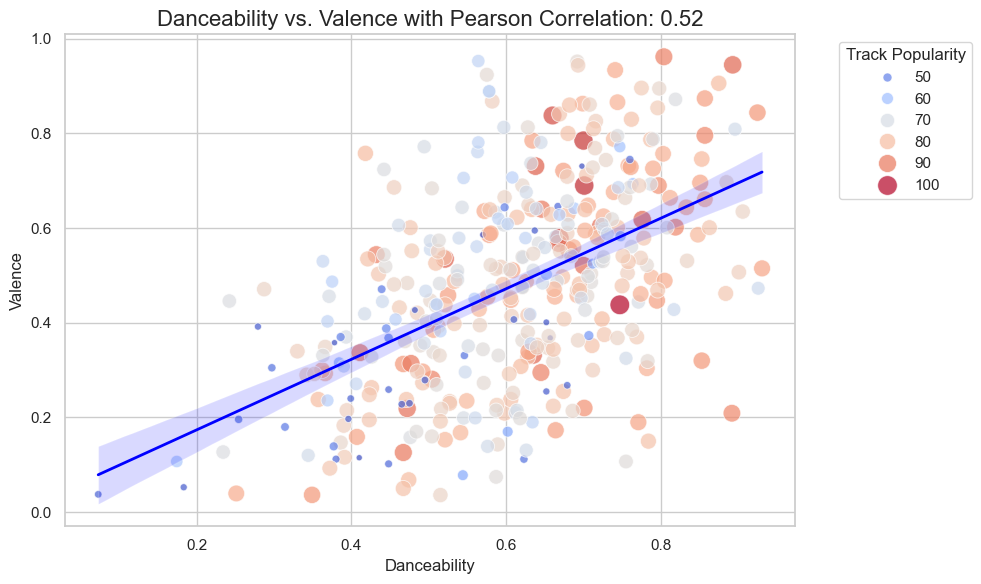

In [743]:
corr, _ = pearsonr(pop_tracks_2024_cleaned['danceability'], pop_tracks_2024_cleaned['valence'])

plt.figure(figsize=(10, 6))

sns.scatterplot(x='danceability', y='valence', 
                hue='track_popularity', 
                size='track_popularity', 
                sizes=(20, 200), 
                palette='coolwarm', 
                data=pop_tracks_2024_cleaned,
                alpha=0.7)

sns.regplot(x='danceability', y='valence', data=pop_tracks_2024_cleaned, scatter=False, color='blue', line_kws={'linewidth': 2})

plt.title(f'Danceability vs. Valence with Pearson Correlation: {corr:.2f}', fontsize=16)
plt.xlabel('Danceability')
plt.ylabel('Valence')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

### Danceability vs. Valence:
* The Pearson correlation between danceability and valence is 0.52, indicating a moderate positive relationship.
* Tracks that are more danceable also tend to be more positive or happy (higher valence), meaning listeners may find danceable tracks more uplifting or cheerful.
* The linear trend line shows that, as danceability increases, so does valence, particularly for tracks with higher popularity (indicated by the larger and more intense dots on the scatter plot).

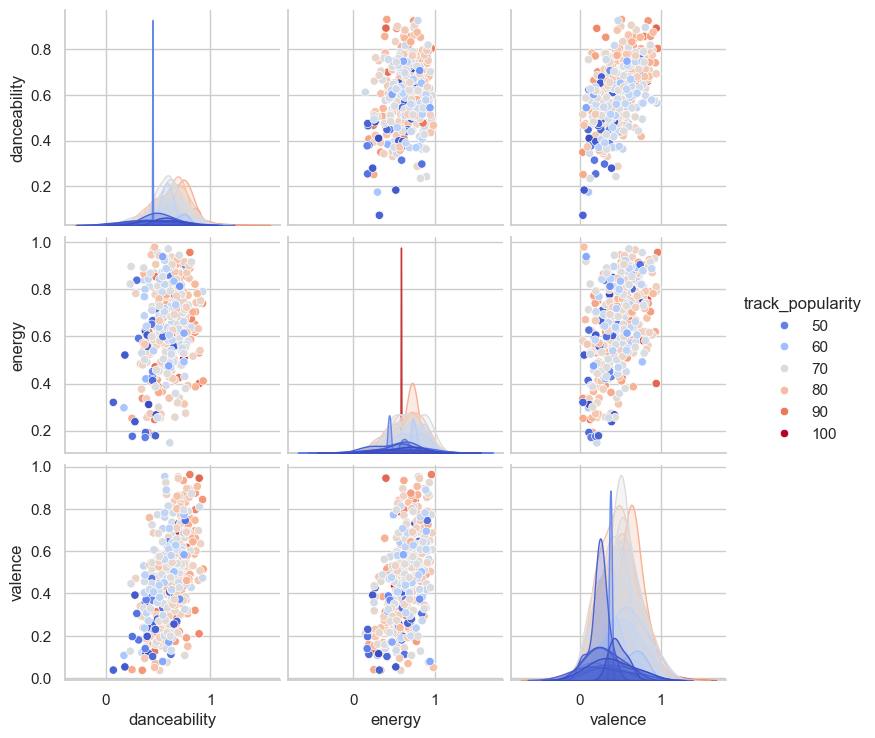

In [745]:
sns.pairplot(pop_tracks_2024_cleaned[['danceability', 'energy', 'valence', 'track_popularity']], kind='scatter', diag_kind='kde', hue='track_popularity', palette='coolwarm')
plt.show()

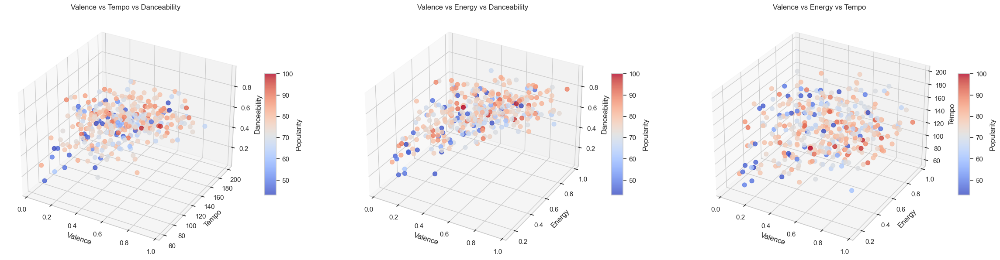

In [747]:
fig = plt.figure(figsize=(24, 6))

combinations = [
    ('valence', 'tempo', 'danceability', 'Valence vs Tempo vs Danceability'),
    ('valence', 'energy', 'danceability', 'Valence vs Energy vs Danceability'),
    ('valence', 'energy', 'tempo', 'Valence vs Energy vs Tempo')
]

for i, (x_col, y_col, z_col, title) in enumerate(combinations, 1):
    ax = fig.add_subplot(1, 3, i, projection='3d')
    sc = ax.scatter(
        pop_tracks_2024_cleaned[x_col],
        pop_tracks_2024_cleaned[y_col],
        pop_tracks_2024_cleaned[z_col],
        c=pop_tracks_2024_cleaned['track_popularity'], 
        cmap='coolwarm',
        s=50,
        alpha=0.8
    )
    ax.set_xlabel(x_col.capitalize())
    ax.set_ylabel(y_col.capitalize())
    ax.set_zlabel(z_col.capitalize())
    ax.set_title(title)
    cbar = fig.colorbar(sc, ax=ax, shrink=0.5, aspect=10)
    cbar.set_label('Popularity')

plt.tight_layout()
plt.show()

### Balance is Key: 
* Popular tracks generally maintain a balance between danceability, energy, valence, and tempo.
* They tend to avoid extreme highs or lows in these features, indicating that pop music often thrives on moderation.
### Danceability and Valence Connection: 
* There is a tendency for higher danceability tracks to have higher valence, meaning pop songs are often both danceable and positive in mood.
### Popularity Distribution: 
* Popularity is not dominated by any specific value of danceability, energy, or valence.
* However, songs with balanced, mid-range values in these features seem to perform better in popularity charts.
# Tempo and Popularity: 
* Popular pop songs tend to hover around tempos between 100-140 BPM, likely because this range appeals to listeners and enhances the danceability of the track.

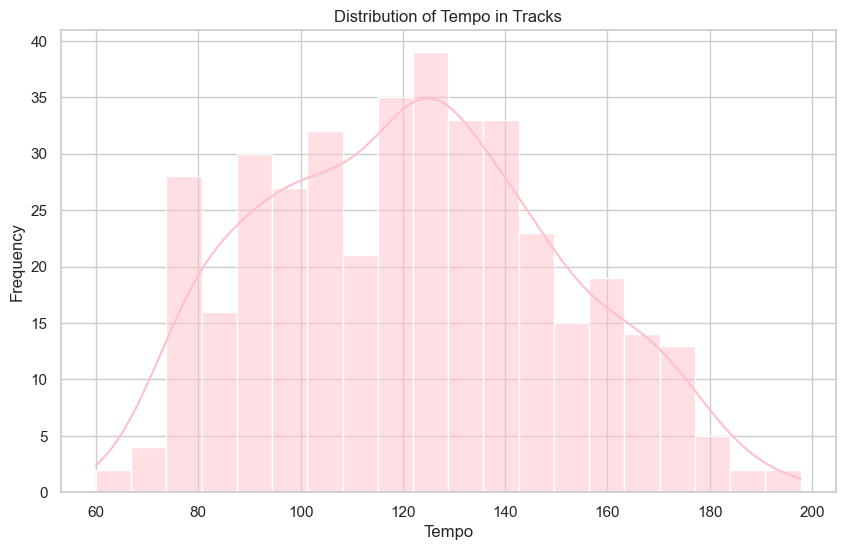

In [778]:
plt.figure(figsize=(10, 6))
sns.histplot(pop_tracks_2024_cleaned['tempo'], bins=20, kde=True, color='pink')
plt.title('Distribution of Tempo in Tracks')
plt.xlabel('Tempo')
plt.ylabel('Frequency')
plt.show()

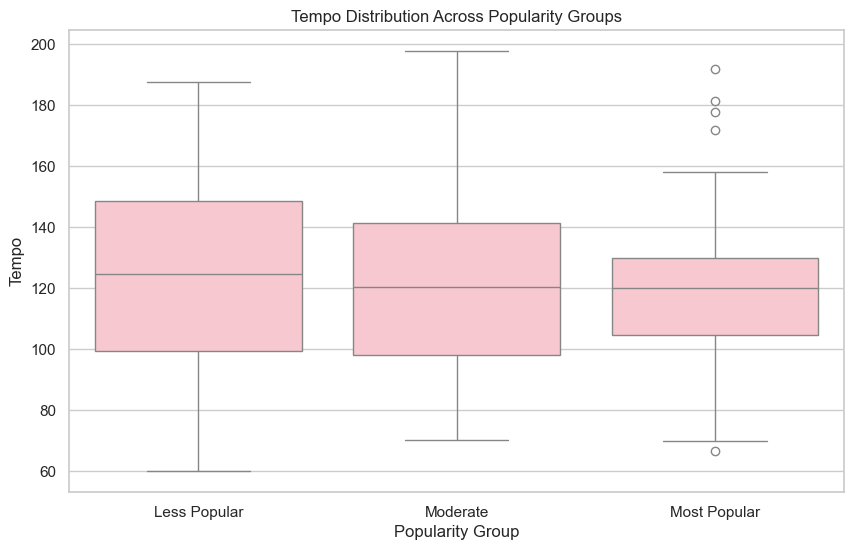

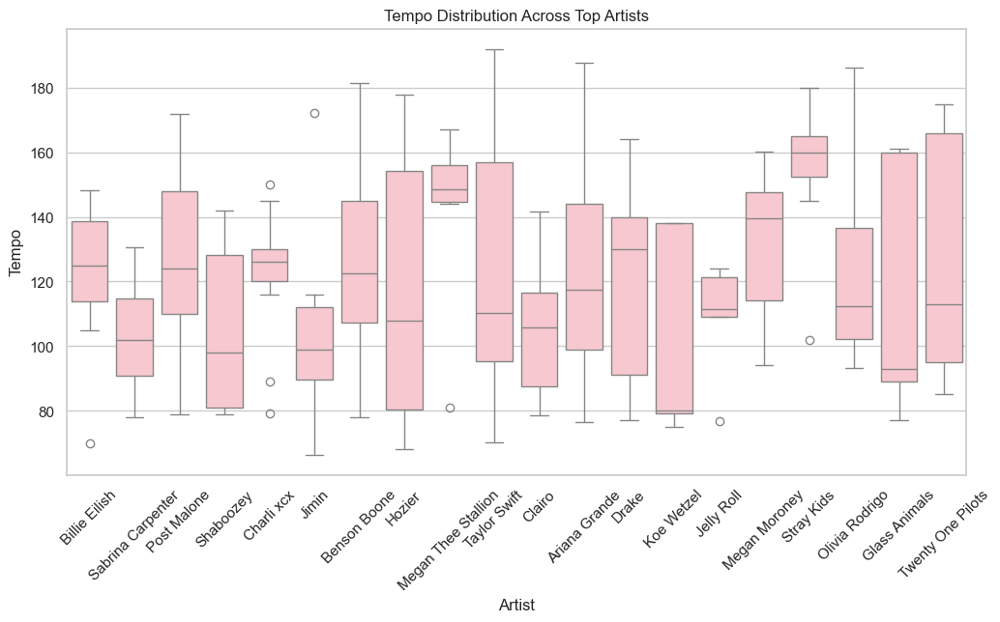

In [774]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='popularity_group', y='tempo', data=pop_tracks_2024_cleaned, color='pink')
plt.title('Tempo Distribution Across Popularity Groups')
plt.xlabel('Popularity Group')
plt.ylabel('Tempo')
plt.show()


plt.figure(figsize=(12, 6))
sns.boxplot(x='artist', y='tempo', color='pink', data=pop_tracks_2024_cleaned[pop_tracks_2024_cleaned['artist'].isin(top_artists)])
plt.xticks(rotation=45)
plt.title('Tempo Distribution Across Top Artists')
plt.xlabel('Artist')
plt.ylabel('Tempo')
plt.show()

## Tempo Distribution Across Popularity Groups
### Most Popular Songs: 
* The tempo distribution for the most popular tracks shows a narrower spread compared to the other groups.
* The tempo here is more concentrated between 90 and 150 BPM, with fewer outliers. The median is around 120 BPM, which indicates that most of the popular tracks tend to have moderate tempos.
## Tempo Distribution Across Top Artists
### Artist-Specific Tempo Preferences:
* Billie Eilish has a relatively narrow tempo range, with tracks generally falling between 100 and 130 BPM.
* Sabrina Carpenter and Post Malone display a wider tempo range, with median values near the middle (around 120-130 BPM).
* Shadaboozey and Jimin show a tight range, with lower variability in their tempos compared to other artists.
* Ariana Grande, Drake, and Koe Wetzel have wide distributions with multiple outliers, indicating a mix of faster and slower tracks.
* Taylor Swift, Clairo, and Benson Boone tend to have higher median tempos compared to the rest, with many tracks exceeding 140 BPM.
* Twenty One Pilots show the largest tempo spread, ranging from as low as 80 BPM to over 180 BPM, indicating a lot of variation in their track tempos.
* Artists like Twenty One Pilots, Glass Animals, and Megan Moroney exhibit high tempo variability, indicating experimentation with different energy levels across their discography and different subgenres.

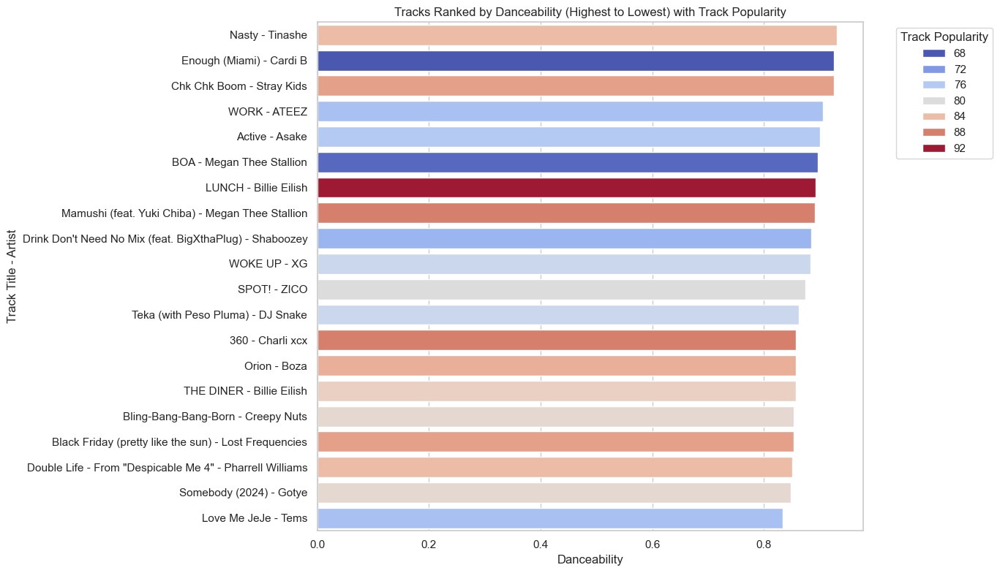

In [810]:
top_danceable_pop_tracks = pop_tracks_2024_cleaned.sort_values(by='danceability', ascending=False).head(20)

top_danceable_pop_tracks['title_artist'] = pop_tracks_2024_cleaned['title'] + ' - ' + pop_tracks_2024_cleaned['artist']

plt.figure(figsize=(14, 8))

sns.barplot(x='danceability', y='title_artist', data=top_danceable_pop_tracks, 
            palette='coolwarm', hue='track_popularity', dodge=False)

plt.title('Tracks Ranked by Danceability (Highest to Lowest) with Track Popularity')
plt.xlabel('Danceability')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

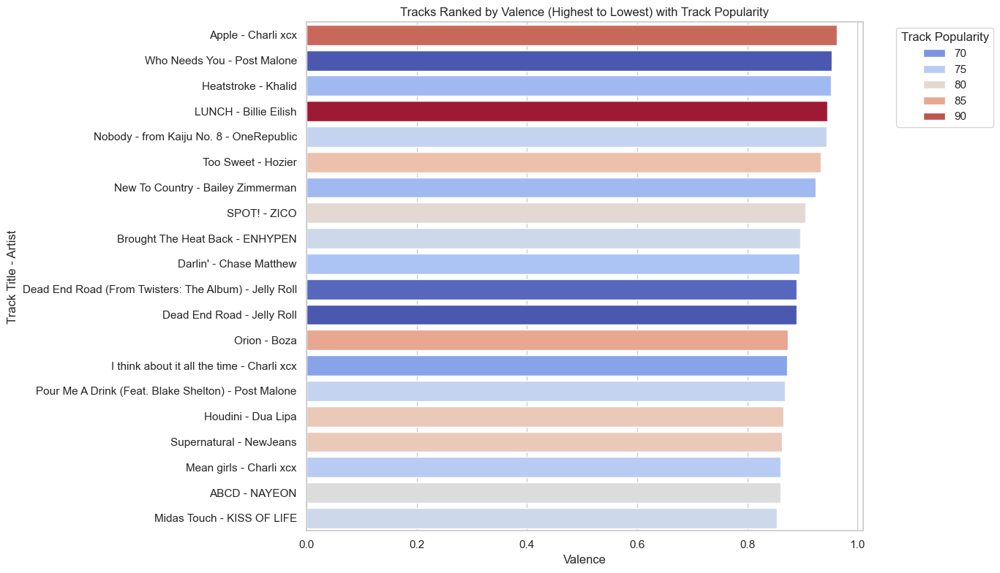

In [814]:
top_possitive_pop_tracks = pop_tracks_2024_cleaned.sort_values(by='valence', ascending=False).head(20)

top_possitive_pop_tracks['title_artist'] = pop_tracks_2024_cleaned['title'] + ' - ' + pop_tracks_2024_cleaned['artist']

plt.figure(figsize=(14, 8))

sns.barplot(x='valence', y='title_artist', data=top_possitive_pop_tracks, 
            palette='coolwarm', hue='track_popularity', dodge=False)

plt.title('Tracks Ranked by Valence (Highest to Lowest) with Track Popularity')
plt.xlabel('Valence')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

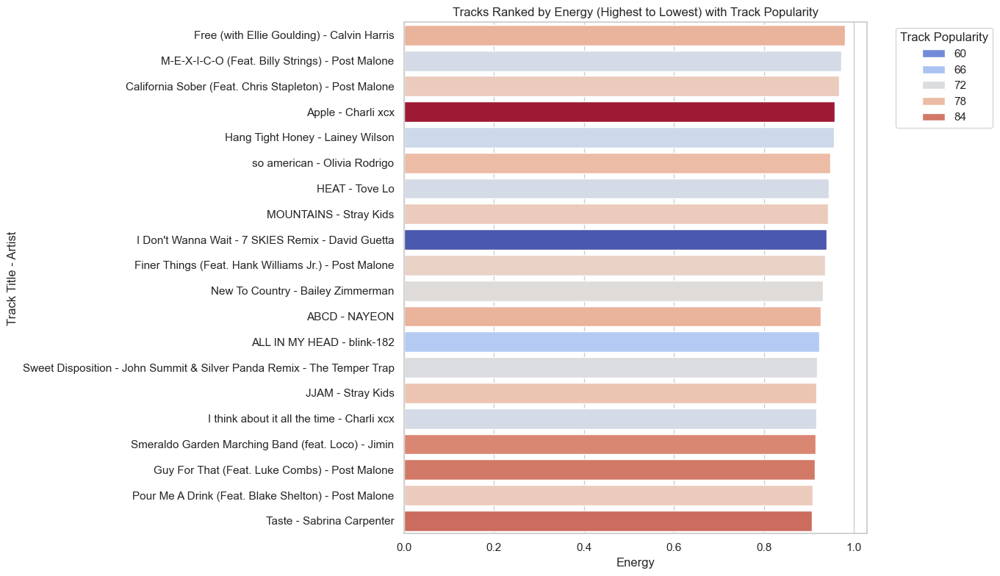

In [816]:
top_energetic_pop_tracks = pop_tracks_2024_cleaned.sort_values(by='energy', ascending=False).head(20)

top_energetic_pop_tracks['title_artist'] = pop_tracks_2024_cleaned['title'] + ' - ' + pop_tracks_2024_cleaned['artist']

plt.figure(figsize=(14, 8))

sns.barplot(x='energy', y='title_artist', data=top_energetic_pop_tracks, 
            palette='coolwarm', hue='track_popularity', dodge=False)

plt.title('Tracks Ranked by Energy (Highest to Lowest) with Track Popularity')
plt.xlabel('Energy')
plt.ylabel('Track Title - Artist')

plt.legend(title='Track Popularity', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

## Artists Appearing in Multiple Categories:
### Post Malone:
* Top Valence Tracks: Appears with multiple tracks, including “Who Needs You”, “Pour Me A Drink”, and “M-E-X-I-C-O”, suggesting that his music is characterized by a positive or pleasant emotional tone.
### Top Energetic Tracks:
* Appears multiple times, including “M-E-X-I-C-O”, “California Sober”, and “Pour Me A Drink”. His tracks tend to carry high energy levels as well, contributing to his popularity.
### Observation:
* Post Malone appears frequently in both valence and energy categories, indicating that his songs combine high energy with positive, uplifting feelings. This combination may be key to his popularity.
### Charli XCX:
* Top Danceable Tracks: Appears with “360”.
* Top Valence Tracks: Appears with “Apple” and “I Think About It All The Time”.
* Top Energetic Tracks: Appears with “Apple” and “I Think About It All The Time”.
### Observation: 
* Charli XCX shows up in all three categories, especially in energy and valence, indicating a mix of high energy and emotional positivity in her music, as well as strong danceability.
### Billie Eilish:
* Top Danceable Tracks: Appears with “Lunch” and “The Diner”.
* Top Valence Tracks: Appears with “Lunch”.
### Observation: 
* Billie Eilish tends to have highly danceable tracks that also maintain a positive valence, showing that even with her often introspective lyrical content, she produces upbeat, energetic music.
### ZICO:
* Top Danceable Tracks: Appears with “Spot!”.
* Top Valence Tracks: Also appears with “Spot!”.
### Observation: 
* ZICO’s track “Spot!” is both highly danceable and has high valence, suggesting that it is an upbeat, lively song with feel-good vibes.

## Patterns in the Music:
* High Energy & High Valence:
* Artists like Post Malone, Charli XCX, and ZICO tend to dominate in both the high energy and high valence categories, suggesting that songs that are both lively and emotionally positive are popular among listeners.
* Repeat Appearances of Specific Songs:
* Some songs, like “Apple” by Charli XCX, show up across multiple categories, indicating they strike a balance between danceability, energy, and valence. This balance may contribute to their widespread appeal.
* Diverse Artist Genres:
* The artists span various genres, from pop (Charli XCX, Billie Eilish) to rap (ZICO, Megan Thee Stallion) and even country influences (Post Malone’s collaborations with country artists).
* Despite genre differences, the combination of danceability, energy, and valence seems to be a universal trend across these popular tracks.

## Insights:
* Songs that rank high in danceability often also have high energy and positive valence. This indicates that popular songs generally have a good mix of upbeat, danceable, and feel-good elements.
* Post Malone and Charli XCX seem to dominate these charts, suggesting that they consistently produce tracks that appeal to listeners across multiple dimensions of musical enjoyment: danceability, energy, and positivity.
* Genres may not matter as much as the emotional and rhythmic qualities of the tracks. Artists from diverse backgrounds still manage to create hits when they incorporate high levels of energy, danceability, and valence.

# Pop Tracks Summary: 
## Artist Popularity & Followers:
### • Artist Popularity Mean: 83.8, with scores ranging from 48 to 100.
### • Artist Followers Mean: 28.7 million, ranging from 31,296 to 121.6 million, indicating a wide spectrum from emerging to superstar artists.
## Correlation: 
### • There's a strong correlation (0.72) between artist popularity and followers, but not between artist popularity and track popularity, suggesting track success can be independent of an artist's fame.
## Track Features:
### • Track Popularity Mean: 73.1, with a range of 43 to 100, suggesting the dataset includes both moderately and highly popular tracks.
### • Track Duration: Average of 3.31 minutes, ranging from 1.24 to 7.62 minutes, showing a mix of standard-length songs and extended versions.
### • Danceability Mean: 0.61, indicating moderate danceability, with a range from 0.07 to 0.93, covering various styles from non-danceable to highly rhythmic tracks.
### • Energy Mean: 0.65, showing that most tracks are energetic, with values ranging from 0.15 to 0.98.
### • Valence (Positivity): Tracks tend to have a neutral emotional tone (mean of 0.48), with extreme positivity or negativity being rare.
### • Tempo: The average tempo is 122 BPM, in line with typical pop and dance tracks, ranging from 60 to 197 BPM.
## Correlation Between Track Features:
### • Energy & Valence: Strong positive correlation (0.68), meaning energetic tracks are more likely to have a positive mood.
### • Danceability & Valence: Moderate positive correlation (0.52), suggesting that more danceable tracks tend to be more uplifting or positive.
### • Acousticness & Energy: Negative correlation (-0.48), showing that acoustic tracks are less energetic.
### • Danceability & Energy: Weak positive correlation (0.24), indicating some relationship between rhythm and energy.
## Artist Popularity vs. Track Popularity:
### • Weak Correlation (0.10): Track popularity is not strongly dictated by artist popularity, with some lesser-known artists having highly popular tracks and vice versa.
## Outliers: 
### • Some popular artists have less successful tracks, and some less popular artists have very successful tracks, suggesting track quality or viral trends play a significant role.
## Valence Distribution:
### • Neutral to Moderate Positivity: Most tracks hover around a valence of 0.4 to 0.6, meaning they are neither extremely happy nor sad. Extremely high or low valence is rare.
### • Higher Valence in Popular Tracks: The most popular tracks tend to have slightly higher positivity (valence), but the difference isn’t extreme compared to less popular tracks.
## Top Artists by Valence and Energy:
### • High Positivity & Energy: Artists like Post Malone, Charli XCX, and ZICO dominate in the categories of high energy and valence, producing upbeat and positive tracks that resonate well with listeners.
### • Low Positivity: Artists like Twenty One Pilots lean towards more melancholic or serious tones.
### • Consistency: Artists like Billie Eilish and Post Malone tend to maintain consistent emotional tones across their tracks, while artists like Twenty One Pilots and Olivia Rodrigo show greater emotional diversity.
## Conclusion:
## Popular tracks in this dataset typically balance energy, danceability, and valence, with upbeat and rhythmic tracks tending to perform better. 
## While artist popularity correlates with the number of followers, track popularity is less dependent on the artist's fame, highlighting the importance of individual track characteristics and cultural relevance in driving a song’s success. 
## Moreover, emotional tones in tracks, while varied, generally favor a moderate, positive mood for broader appeal.

# Final Conclusion of Genre Analysis:
### Across all genres—Pop, House, Reggaeton, and Rap—the key insights reveal that popular tracks often balance danceability, energy, and emotional tone (valence). 
### While genre-specific characteristics shape the music, there are overarching trends that contribute to track success.
## Danceability and Energy:
### • Tracks with moderate-to-high danceability and energy tend to perform better across genres. This is especially true in Pop and House music, where danceability plays a crucial role in track popularity. 
### • Rap and Reggaeton also exhibit strong danceability, though Rap sometimes leans into rhythmic complexity even at lower energy levels.
## Tempo and Loudness:
### • Tracks generally fall within a tempo range of 100-130 BPM, balancing danceability and intensity, particularly in Pop, House, and Reggaeton. 
### • Louder, high-energy tracks are often associated with greater popularity, but extremely high energy can lead to a decline in danceability, especially in House and Rap.
## Valence (Emotional Tone):
### • Across genres, popular tracks exhibit a variety of emotional tones. While Pop and House favor more upbeat and positive tracks, genres like Rap and Reggaeton show a broader range of valence, with introspective and moodier tracks still achieving success. 
### • Emotional diversity appeals to listeners, allowing for a mix of uplifting and somber content.
## Track-Specific Characteristics vs. Artist Popularity:
### • Track popularity is often driven by specific features like danceability, energy, and loudness rather than the fame of the artist, especially in Rap and Reggaeton. 
### • While artist popularity and large fanbases play a role in boosting a track’s reach, individual track elements, cultural relevance, and emotional resonance are critical in determining success.
## Production Trends:
### • Across all genres, there is a dominance of electronic and studio-produced tracks, with minimal acoustic or instrumental elements. 
### • This trend emphasizes the contemporary music landscape’s focus on digital production, creating a polished, energetic sound that appeals to global audiences.
## General Conclusion:
### • Popular tracks tend to thrive when they strike a balance between rhythmic appeal, emotional resonance, and energetic production.
### • While each genre brings its unique sound and cultural influences, the tracks that resonate most with listeners are those that combine high danceability, moderate energy, and varied emotional tones. 
### • Artist fame provides a platform, but it’s the track-specific elements and the ability to connect with listeners across moods that ultimately determine a song’s long-term success.